In [1]:
! jupyter labextension list

JupyterLab v3.5.3
/glade/u/apps/jupyterhub//stable/share/jupyter/labextensions
        jupyterlab-ncar-menu v0.1.1 enabled OK (python, jupyterlab_ncar_menu)
        jupyterlab_pygments v0.2.2 enabled OK (python, jupyterlab_pygments)
        dask-labextension v7.0.0 enabled  X (python, dask_labextension)
        nbdime-jupyterlab v2.2.0 enabled OK
        jupyterlab_code_formatter v2.2.1 enabled  X (python, jupyterlab_code_formatter)
        jupyterlab-jupytext v1.3.9 enabled OK (python, jupytext)
        @jupyter-notebook/lab-extension v7.0.6 enabled  X
        @jupyterlab/mathjax3-extension v4.3.0 enabled OK (python, jupyterlab-mathjax3)
        @jupyterlab/git v0.41.0 enabled OK (python, jupyterlab-git)
        @jupyter-server/resource-usage v1.0.1 enabled  X (python, jupyter-resource-usage)
        @jupyterhub/jupyter-server-proxy v4.1.0 enabled OK
        @jupyter-lsp/jupyterlab-lsp v5.0.0 enabled OK (python, jupyterlab-lsp)
        @jupyter-widgets/jupyterlab-manager v5.0.9 enable

In [1]:
# Load libraries

# # Plotting utils 
import datetime
import glob
import os
import pickle
import time
import warnings
from datetime import date, timedelta
import Ngl
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util
from cartopy.util import add_cyclic_point
import matplotlib as matplotlib
import matplotlib.animation as animation
import matplotlib.colors as colors
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FormatStrFormatter
import metpy.calc as mpc
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import xarray as xr
from matplotlib.dates import DateFormatter
from metpy.units import units
from metpy import interpolate
from metpy.calc import vertical_velocity
from mpl_toolkits.axes_grid1 import make_axes_locatable

warnings.filterwarnings('ignore')


In [2]:
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def get_region(minLat,maxLat,minLon,maxLon, DS, ocnDS = [], ocnMask=False): 
    iLat  = np.where( (DS['lat']>=minLat) & (DS['lat']<=maxLat) )[0]
    iLon  = np.where( (DS['lon']>=minLon) & (DS['lon']<=maxLon) )[0]
    
    if ocnMask==True:
        selOcn = ocnDS[iLat,:]
        
        return selOcn[:,iLon]
            
    return DS.isel(lat=iLat, lon=iLon)
    

In [3]:
# Grabbed from Brian M. to use time midpoints, not end periods
def cesm_correct_time(ds):
    """Given a Dataset, check for time_bnds,
       and use avg(time_bnds) to replace the time coordinate.
       Purpose is to center the timestamp on the averaging inverval.   
       NOTE: ds should have been loaded using `decode_times=False`
    """
    assert 'time_bnds' in ds
    assert 'time' in ds
    correct_time_values = ds['time_bnds'].mean(dim='nbnd')
    # copy any metadata:
    correct_time_values.attrs = ds['time'].attrs
    ds = ds.assign_coords({"time": correct_time_values})
    ds = xr.decode_cf(ds)  # decode to datetime objects
    return ds

In [4]:
# - - - - - - - - - - - - - - - 
# Pre-process data while reading in 
# - - - - - - - - - - - - - - - 

def preprocess_h0(ds):
       
    keepVars = ['SWCF','LWCF','TS','CLOUD','FSNS','FLNS','PS','QREFHT',
                'U10','UGUST','CLDHGH','CLDLIQ','CONCLD','TMQ',
                'PHIS','CDNUMC','CLDLOW',
                'CLDMED','CLDTOT','THLP2_CLUBB',
                'RTP2_CLUBB','RVMTEND_CLUBB','STEND_CLUBB',
                'T','Q','OMEGA','PBLH','U','V','WP2_CLUBB','WP3_CLUBB',
                'WPRTP_CLUBB','WPTHLP_CLUBB','Z3',
                'PRECT','PRECC','PRECZ','LANDFRAC','OCNFRAC',
                'TGCLDLWP','LHFLX','SHFLX','TREFHT', 
                'hyam','hybm','hyai','hybi']
        
    ds         = cesm_correct_time(ds)
    # ds['time'] = ds.indexes['time'].to_datetimeindex() 
    dsSel      = ds[keepVars]
    
    return dsSel


def preprocess_h1(ds):
       
    keepVars = ['LHFLX','SHFLX','PRECC','PRECT','PRECZ','TREFHT','QREFHT',
                'U10','UGUST', 
                'OMEGA500','U200','V200','U850','V850']
        
    ds         = cesm_correct_time(ds)
    # ds['time'] = ds.indexes['time'].to_datetimeindex() 
    dsSel      = ds[keepVars]

    
    return dsSel



In [5]:
def regrid_data(fromthis, tothis, method=1):
    """Regrid data using various different methods"""

    #Import necessary modules:
    import xarray as xr

    if method == 1:
        # kludgy: spatial regridding only, seems like can't automatically deal with time
        if 'time' in fromthis.coords:
            result = [fromthis.isel(time=t).interp_like(tothis) for t,time in enumerate(fromthis['time'])]
            result = xr.concat(result, 'time')
            return result
        else:
            return fromthis.interp_like(tothis)
    elif method == 2:
        newlat = tothis['lat']
        newlon = tothis['lon']
        coords = dict(fromthis.coords)
        coords['lat'] = newlat
        coords['lon'] = newlon
        return fromthis.interp(coords)
    elif method == 3:
        newlat = tothis['lat']
        newlon = tothis['lon']
        ds_out = xr.Dataset({'lat': newlat, 'lon': newlon})
        regridder = xe.Regridder(fromthis, ds_out, 'bilinear')
        return regridder(fromthis)
    elif method==4:
        # geocat
        newlat = tothis['lat']
        newlon = tothis['lon']
        result = geocat.comp.linint2(fromthis, newlon, newlat, False)
        result.name = fromthis.name
        
        return result

### Read in data

In [6]:
# testDir     = '/glade/scratch/mdfowler/archive/'
testDir     = '/glade/campaign/cgd/tss/people/mdfowler/GustProject/'

case_IDs  = [
               'FLT2000_ctrl',
               'FLT2000_gust',    
               # 'FLT2000_gust_x2',    
                'FLT2000_ctrl_U10bias',
    
                'FLTHIST_ctrl',
                'FLTHIST_gust',
              ]

caseNames = [
            'FLT2000_prelim.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsOFF.003',
            'FLT2000_prelim.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsON.003',
            # 'FLT2000_prelim.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsON_ugustX2.003',
            'FLT2000_prelim.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsOFF_biasCorrectU10.002',
    
            'FLTHIST_v0c.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsOFF.001',
            'FLTHIST_v0c.ne30pg3_ne30pg3_mg17.TestGustGlobal_cam6_3_112_fullOutput_gustsON.001',
]

for iCase in range(len(case_IDs)):
    print('*** Starting on case %s ***' % (case_IDs[iCase]))

    ## Get list of files 
    listFiles_h0 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.????-*'))
    listFiles_h1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h1.????-*'))
    
    ## Now read in those files
    case_h0 = xr.open_mfdataset(listFiles_h0,  preprocess=preprocess_h0, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h0 files loaded')
    case_h1 = xr.open_mfdataset(listFiles_h1,  preprocess=preprocess_h1, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h1 files loaded')
    
    ## Add case ID (short name) to the DS
    case_h0      = case_h0.squeeze().assign_coords({"case":  case_IDs[iCase]})
    case_h1      = case_h1.squeeze().assign_coords({"case":  case_IDs[iCase]})
    
    ## Info on dates available
    print('Min year (h0): ', np.nanmin(case_h0['time.year'].values))
    print('Max year (h0): ', np.nanmax(case_h0['time.year'].values))
    print('Min year (h1): ', np.nanmin(case_h1['time.year'].values))
    print('Max year (h1): ', np.nanmax(case_h1['time.year'].values))
    
    ## Return all the cases in a single dataset
    if iCase==0:
        all_h0    = case_h0
        del case_h0
        all_h1 = case_h1
        del case_h1
    else: 
        all_h0    = xr.concat([all_h0, case_h0], "case") 
        del case_h0
        all_h1 = xr.concat([all_h1, case_h1], "case") 
        del case_h1
    

*** Starting on case FLT2000_ctrl ***
h0 files loaded
h1 files loaded
Min year (h0):  1
Max year (h0):  10
Min year (h1):  1
Max year (h1):  10
*** Starting on case FLT2000_gust ***
h0 files loaded
h1 files loaded
Min year (h0):  1
Max year (h0):  10
Min year (h1):  1
Max year (h1):  10
*** Starting on case FLT2000_ctrl_U10bias ***
h0 files loaded
h1 files loaded
Min year (h0):  1
Max year (h0):  5
Min year (h1):  1
Max year (h1):  5
*** Starting on case FLTHIST_ctrl ***
h0 files loaded
h1 files loaded
Min year (h0):  1995
Max year (h0):  2014
Min year (h1):  1995
Max year (h1):  2014
*** Starting on case FLTHIST_gust ***
h0 files loaded
h1 files loaded
Min year (h0):  1995
Max year (h0):  2014
Min year (h1):  1995
Max year (h1):  2014


In [7]:
## Drop the first year for spin-up? 

iTimes_h0 = np.where((all_h0['time.year'].values!=1) & (all_h0['time.year'].values!=1995))[0]
iTimes_h1 = np.where((all_h1['time.year'].values!=1) & (all_h1['time.year'].values!=1995))[0]

all_h0 = all_h0.isel(time=iTimes_h0)
all_h1 = all_h1.isel(time=iTimes_h1)


In [8]:
# selYear = 1995 

# all_h0 = all_h0.isel(time=np.where(all_h0['time.year']==selYear)[0])
# all_h1 = all_h1.isel(time=np.where(all_h1['time.year']==selYear)[0])


**Compute ENSO**

Niño 3.4 (5N-5S, 170W-120W) <br>
Usually uses a 5-month running mean

In [9]:
ilats = np.where((all_h0.lat.values>=-5)  & (all_h0.lat.values<=5))[0]
ilons = np.where((all_h0.lon.values>=190) & (all_h0.lon.values<=240))[0]

regionTS = all_h0.TS.isel(lat=ilats, lon=ilons).mean(dim='lat').mean(dim='lon')
climoTS  = regionTS.mean(dim='time')

# nino34 = (regionTS - climoTS).isel(case=3).isel(time=np.where(regionTS['time.year']>=1995)[0])
nino34 = (regionTS - climoTS).isel(time=np.where(regionTS['time.year']>=1995)[0]).rolling(time=5).mean()


In [10]:
nino34['time'] = nino34.indexes['time'].to_datetimeindex() 
nino34.load()

<xarray.DataArray 'TS' (case: 5, time: 227)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,  0.01087646,
        -0.21595459, -0.40581665],
       [        nan,         nan,         nan, ...,  0.01087646,
        -0.21595459, -0.40581665]])
Coordinates:
  * time     (time) datetime64[ns] 1996-01-16T12:00:00 1996-02-15 ... 2014-11-16
  * case     (case) <U20 'FLT2000_ctrl' 'FLT2000_gust' ... 'FLTHIST_gust'

Text(0.5, 1.0, 'Nino 3.4: FLTHIST_ctrl')

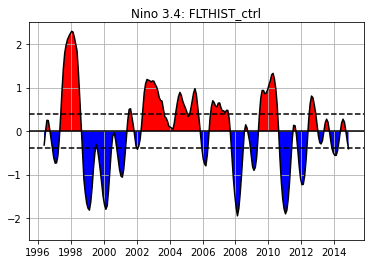

In [10]:
plt.plot(nino34.time.values, nino34.isel(case=3).values,'k')
plt.axhline(0, color='k')

plt.fill_between(nino34.time.values, 0, nino34.isel(case=3).values, 
                 where=nino34.isel(case=3).values >= 0, facecolor='red', interpolate=True)
plt.fill_between(nino34.time.values, nino34.isel(case=3).values, 0, 
                 where=nino34.isel(case=3).values <= 0, facecolor='blue', interpolate=True)

plt.axhline(0.4, color='k', linestyle='--')
plt.axhline(-0.4, color='k', linestyle='--')
plt.ylim([-2.5, 2.5])
plt.grid()

plt.title('Nino 3.4: '+str(nino34.isel(case=3).case.values))

Text(0.5, 1.0, 'Nino 3.4: FLTHIST_gust')

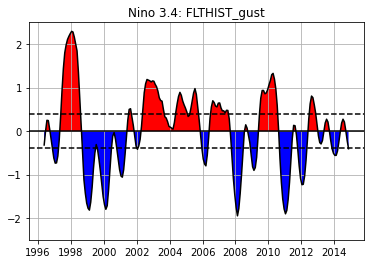

In [93]:
plt.plot(nino34.time.values, nino34.isel(case=4).values,'k')
plt.axhline(0, color='k')

plt.fill_between(nino34.time.values, 0, nino34.isel(case=4).values, 
                 where=nino34.isel(case=4).values >= 0, facecolor='red', interpolate=True)
plt.fill_between(nino34.time.values, nino34.isel(case=4).values, 0, 
                 where=nino34.isel(case=4).values <= 0, facecolor='blue', interpolate=True)

plt.axhline(0.4, color='k', linestyle='--')
plt.axhline(-0.4, color='k', linestyle='--')
plt.ylim([-2.5, 2.5])
plt.grid()

plt.title('Nino 3.4: '+str(nino34.isel(case=4).case.values))

In [100]:
nino34.load()

<xarray.DataArray 'TS' (case: 5, time: 227)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,  0.01087646,
        -0.21595459, -0.40581665],
       [        nan,         nan,         nan, ...,  0.01087646,
        -0.21595459, -0.40581665]])
Coordinates:
  * time     (time) datetime64[ns] 1996-01-16T12:00:00 1996-02-15 ... 2014-11-16
  * case     (case) <U15 'FLT2000_ctrl' 'FLT2000_gust' ... 'FLTHIST_gust'

In [10]:
len(nino34.time.values)-6

221

In [11]:
## Identify winters that are in different ENSO phases?
#    ENSO active when anomaly +/- 0.4 deg for 6+ months

label = np.full([len(nino34.time.values)], '---------')
# print('made label')

for iTime in range(len(nino34.time.values)-6):
    this6months = nino34.isel(case=3).isel(time=np.arange(iTime,iTime+6))
    
    if (np.all(this6months.values>=0.4)):
        label[iTime+6] = 'ElNino'
    elif (np.all(this6months.values<=0.4)):
        label[iTime+6] = 'LaNina'
    else:
        label[iTime+6] = 'Neutral'
        
    # print(label[iTime+6])



In [12]:
# If adding to all_h0, need to fill in the F2000 years with something too
fullTime_label = np.full([len(all_h0.time.values)], '---------')
fullTime_label[len(all_h0.time.values) - len(label)::] = label

all_h0['ENSO_label'] = (('time'), fullTime_label)


#### Sanity checking the SST diffs

In [6]:
all_h0.case.values

array(['FLT2000_ctrl', 'FLT2000_gust', 'FLT2000_gust_x2', 'FLTHIST_ctrl',
       'FLTHIST_gust'], dtype=object)

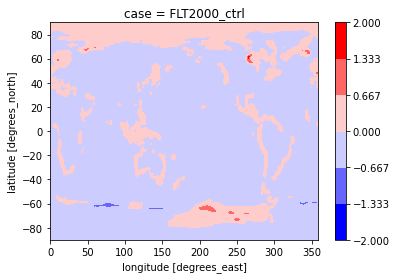

In [7]:
test0 = (all_h0.TS.isel(time=6,case=0)*all_h0.OCNFRAC.isel(time=6,case=0))
test2 = (all_h0.TS.isel(time=18,case=0)*all_h0.OCNFRAC.isel(time=18,case=0))

(test2-test0).plot.contourf(vmin=-2,vmax=2,cmap='bwr')


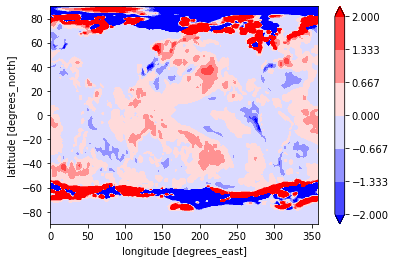

In [34]:
test0 = (all_h0.TS.isel(time=18,case=0)*all_h0.OCNFRAC.isel(time=18,case=0))
test2 = (all_h0.TS.isel(time=18+(12*3),case=2)*all_h0.OCNFRAC.isel(time=18+(12*3),case=2))

(test2-test0).plot.contourf(vmin=-2,vmax=2,cmap='bwr')


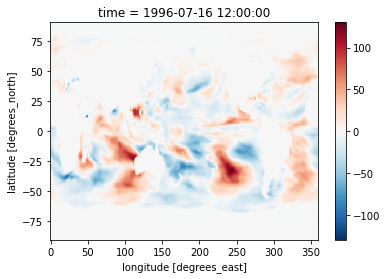

In [39]:
test0 = (all_h0.LHFLX.isel(time=18+(12*3),case=2)*all_h0.OCNFRAC.isel(time=18+(12*3),case=2))
test2 = (all_h0.LHFLX.isel(time=18+(12*3),case=3)*all_h0.OCNFRAC.isel(time=18+(12*3),case=3))

(test2-test0).plot()


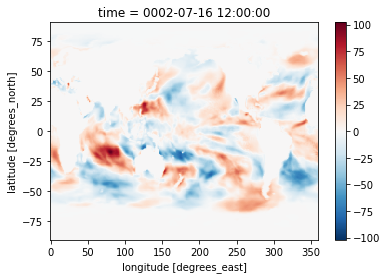

In [40]:
test0 = (all_h0.LHFLX.isel(time=18,case=0)*all_h0.OCNFRAC.isel(time=18,case=0))
test2 = (all_h0.LHFLX.isel(time=18,case=1)*all_h0.OCNFRAC.isel(time=18,case=1))

(test2-test0).plot()


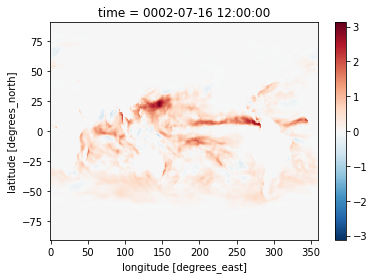

In [45]:
test0 = (all_h0.UGUST.isel(time=18,case=1)*all_h0.OCNFRAC.isel(time=18,case=1))
test2 = (all_h0.UGUST.isel(time=18,case=2)*all_h0.OCNFRAC.isel(time=18,case=2))

(test2-test0).plot()


#### Read in some obs too

In [9]:
## A few observational files would be helpful too... 
obsDir = '/glade/p/cesm/amwg/amwg_diagnostics/obs_data/'

gpcp_mam = xr.open_dataset(obsDir+'GPCP_MAM_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_jja = xr.open_dataset(obsDir+'GPCP_JJA_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_son = xr.open_dataset(obsDir+'GPCP_SON_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_djf = xr.open_dataset(obsDir+'GPCP_DJF_climo.nc', decode_times=False)   #PRECT in mm/day 

erai_mam = xr.open_dataset(obsDir+'ERAI_MAM_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_jja = xr.open_dataset(obsDir+'ERAI_JJA_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_son = xr.open_dataset(obsDir+'ERAI_SON_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_djf = xr.open_dataset(obsDir+'ERAI_DJF_climo.nc', decode_times=False)   #PRECT in mm/day 

In [10]:
# # Get daily TRMM data too...
# obsFile = '/glade/p/cgd/amp/rneale/data/TRMM/daily/regrid_1deg/3B42.1998-2013.daily.1deg.v7.nc'
# trmm_daily = xr.open_dataset(obsFile, decode_times=True) #PRECT in mm/day (summed)
# print(trmm_daily['precip'].mean())

# trmm_daily['precip'] = trmm_daily['precip']*24
# print(trmm_daily['precip'].mean())


## Get daily TRMM data that's not regridded just yet 
dataDir = '/glade/p/cgd/amp/rneale/data/TRMM/daily/'

# Get list of files 
listFiles_trmm = np.sort(glob.glob(dataDir+'3B42.????.daily_V7.nc'))
## Now read in those files
trmmDS = xr.open_mfdataset(listFiles_trmm, concat_dim='time', 
                            combine='nested', decode_times=True, 
                            data_vars='minimal')



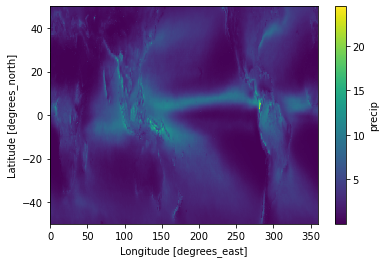

In [10]:
trmmDS.mean(dim='time').precip.plot()

In [11]:
## Read in ERA-5 Monthly means for the same period 
filePath = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_fluxesAndRain.nc'
era5_obs = xr.open_dataset(filePath, decode_times=True)

## Add neutral 10m wind components 
fileNeut = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_neutral10mWinds.nc'
era5_neut = xr.open_dataset(fileNeut, decode_times=True)
era5_obs = xr.merge([era5_obs, era5_neut])

era5_obs = era5_obs.reindex(latitude=era5_obs.latitude[::-1])
era5_obs = era5_obs.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})
era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})

# Now regrid the data
# Get model grid 
camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# lhflx_era5 = era5_obs['slhf'].where(era5_obs['slhf'].values>-999)
lhflx_era5 = -era5_obs['slhf']/86400  # Divide fluxes by 86400 to get from J/m2 to W/m2; Add negative sign to match CAM convention 
regridERA5_lhflx = regrid_data(lhflx_era5, camGrid, method=1)

## NOW: use neutral winds for 10m u and v 
era5_u10_temp = era5_obs['u10n']
era5_v10_temp = era5_obs['v10n']
u10_era5 = np.sqrt(era5_u10_temp**2 + era5_v10_temp**2)
regridERA5_u10 = regrid_data(u10_era5, camGrid, method=1)

era5_prect_temp  = era5_obs['tp']
era5_prect_temp  =  era5_prect_temp * 1000.0  # Convert from m of water per day to mm/day
regridERA5_prect = regrid_data(era5_prect_temp, camGrid, method=1)

## Combine back into one xarray dataset
regridERA5 = regridERA5_lhflx.to_dataset()
regridERA5['U10'] = (('time','lat','lon'), regridERA5_u10.values)
regridERA5['tp'] = (('time','lat','lon'), regridERA5_prect.values)
# regridERA5 = xr.merge([regridERA5_lhflx, regridERA5_u10, regridERA5_prect])

## Select certain seasons and average over those 
iTimes_DJF = np.where( (regridERA5['time.month']==12) | (regridERA5['time.month']<=2) )[0]
iTimes_JJA = np.where( (regridERA5['time.month']>=6) &  (regridERA5['time.month']<=8) )[0]
iTimes_MAM = np.where( (regridERA5['time.month']>=3) &  (regridERA5['time.month']<=5) )[0]
iTimes_SON = np.where( (regridERA5['time.month']>=9) &  (regridERA5['time.month']<=11) )[0]

regridERA5_DJF = regridERA5.isel(time=iTimes_DJF).mean(dim='time')
regridERA5_JJA = regridERA5.isel(time=iTimes_JJA).mean(dim='time')
regridERA5_MAM = regridERA5.isel(time=iTimes_MAM).mean(dim='time')
regridERA5_SON = regridERA5.isel(time=iTimes_SON).mean(dim='time')
regridERA5_ANN = regridERA5.mean(dim='time')

era5_DJF_allTimes = regridERA5.isel(time=iTimes_DJF)


In [12]:
## Read in daily ERA5 PRECT too?
fileName = '/glade/work/rneale/data/ERA5/PRECT.day.mean.leap.nc'
era5_daily = xr.open_dataset(fileName, decode_times=True)

## Select same set of years 
iYears = np.where((era5_daily['time.year']>=1996) & (era5_daily['time.year']<=2014))[0]

era5_prect_temp  =  era5_daily['tp'].isel(time=iYears)
era5_prect_temp  =  era5_prect_temp * 1000.0 # Convert from m of water per day to mm/day
regridERA5_prectDaily =  regrid_data(era5_prect_temp, camGrid, method=1)



In [18]:
## Also read in the 3D ERA5 OMEGA field 
filePath = '/glade/work/mdfowler/obs/ERA5_omega.nc'
era5_omega = xr.open_dataset(filePath, decode_times=True)

era5_omega = era5_omega.reindex(latitude=era5_omega.latitude[::-1])
era5_omega = era5_omega.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})
era5_omega = era5_omega.rename(name_dict={'latitude':'lat', 'longitude':'lon'})

## Convert longitude to be 0 to 360, not -180 to 180 (not an issue above that I can tell)
era5_omega.coords['lon'] = (era5_omega.coords['lon'] + 360) % 360 
era5_omega = era5_omega.sortby(era5_omega.lon)

regridERA5_omega = regrid_data(era5_omega, camGrid, method=1)

iTimes_DJF = np.where( (regridERA5_omega['time.month']==12) | (regridERA5_omega['time.month']<=2) )[0]
regridERA5_omega_DJF = regridERA5_omega.isel(time=iTimes_DJF).mean(dim='time')


In [19]:
regridERA5_DJF['OMEGA500'] = (('lat','lon'), np.squeeze(regridERA5_omega_DJF.sel(level=500).w.values))

Text(0.5, 1.0, 'ERA5: u10n - u10')

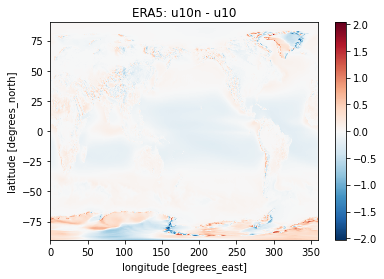

In [20]:
(era5_obs['u10n'].mean(dim='time') - era5_obs['u10'].mean(dim='time')).plot()
plt.title('ERA5: u10n - u10')

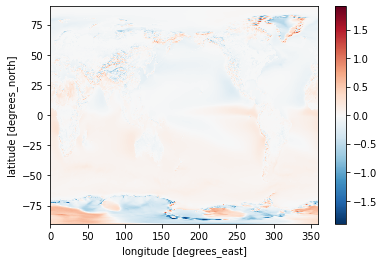

In [89]:
(era5_obs['v10n'].mean(dim='time') - era5_obs['v10'].mean(dim='time')).plot()

## Plot of the funciton itself?

In [1]:
convertFac = 0.000115741
R = np.arange(0,10*convertFac,0.2*convertFac) 

Ug = np.log(1.0+57801.6*R-3.55332096e7*(R**2))
Ug2 = np.log(1.0+(57801.6/3)*R-(3.55332096e7/3)*(R**2))

Rset = 0.00069444
Ug[np.where(R>=Rset)[0]]=np.log(1.0 + (57801.6*Rset) - (3.55332096e7*(Rset**2)))
Ug2[np.where(R>=Rset)[0]]=np.log(1.0 + ((57801.6/3)*Rset) - ((3.55332096e7/3)*(Rset**2)))


fig,axs = plt.subplots(1,1,figsize=(6,4))
axs.plot(R, Ug, 'k-', linewidth=2)
# axs.plot(R, Ug2, 'r-', linewidth=2)


axs.set_xlabel('Rain Rate [cm/d]', fontsize=12)
axs.set_ylabel('U_GUST', fontsize=12)

axs.tick_params(axis='both',labelsize=12)

# axs.axhline(2,color='grey',linestyle='--')

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_GustFunction.png')

plt.show()


NameError: name 'np' is not defined

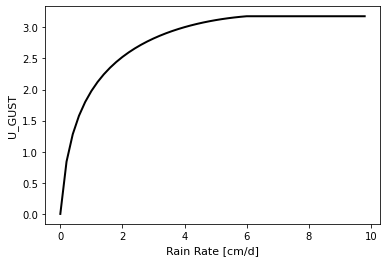

In [20]:
R = np.arange(0,10,0.2) 
Ug = np.log(1.0 + (6.69*R) - (0.476*(R**2)))
Ug2 = np.log(1.0 + ((6.69/3)*R) - ((0.476/3)*(R**2)))
Ug3 = np.log(1.0 + ((6.69/2)*R) - ((0.476/2)*(R**2)))

Ug[np.where(R>=6)[0]]=np.log(1.0 + (6.69*6) - (0.476*(6**2)))

Rset = 6
Ug2[np.where(R>=Rset)[0]]=np.log(1.0 + ((6.69/3)*Rset) - ((0.476/3)*(Rset**2)))
Ug3[np.where(R>=Rset)[0]]=np.log(1.0 + ((6.69/2)*Rset) - ((0.476/2)*(Rset**2)))


fig,axs = plt.subplots(1,1,figsize=(6,4))
axs.plot(R, Ug, 'k-', linewidth=2)
# axs.plot(R, Ug2, 'r-', linewidth=2)
# axs.plot(R, Ug3, 'r--', linewidth=2)

axs.set_xlabel('Rain Rate [cm/d]', fontsize=11)

axs.set_ylabel('U_GUST', fontsize=11)

# axs.axhline(2,color='grey',linestyle='--')

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_GustFunction.png')

plt.show()


In [51]:
R = 0.25
np.log(1.0 + (6.69*R) - (0.476*(R**2)))


0.9718200416666355

## Now we can do some fun plotting!

### Some basic plots

**Take a much broader look?**

In [13]:
iTimes_DJF = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
iTimes_JJA = np.where( (all_h0['time.month']>=6) & (all_h0['time.month']<=8) )[0]
iTimes_MAM = np.where( (all_h0['time.month']>=3) & (all_h0['time.month']<=5) )[0]
iTimes_SON = np.where( (all_h0['time.month']>=9) & (all_h0['time.month']<=11) )[0]

all_h0_DJF = all_h0.isel(time=iTimes_DJF).mean(dim='time')
all_h0_JJA = all_h0.isel(time=iTimes_JJA).mean(dim='time')
all_h0_MAM = all_h0.isel(time=iTimes_MAM).mean(dim='time')
all_h0_SON = all_h0.isel(time=iTimes_SON).mean(dim='time')
all_h0_ANN = all_h0.mean(dim='time')

h0_DJF_allTimes = all_h0.isel(time=iTimes_DJF)


**I don't always run the OMEGA interpolation, so isolating it between comments**

In [38]:
# Pull out hya/hyb profiles 
hyam = np.squeeze(h0_DJF_allTimes.hyam.values)
hybm = np.squeeze(h0_DJF_allTimes.hybm.values)
hyai = np.squeeze(h0_DJF_allTimes.hyai.values)
hybi = np.squeeze(h0_DJF_allTimes.hybi.values)

# Surface pressure with time dimension
PS   = h0_DJF_allTimes.PS.values              # Pa 
P0   = 1000.0

pressGoals = [500]

# thetaInterp = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
omegaInterp     = np.full([len(h0_DJF_allTimes.case.values), len(h0_DJF_allTimes.time.values), len(pressGoals), len(h0_DJF_allTimes.lat.values), len(h0_DJF_allTimes.lon.values)], np.nan)

for iCase in range(len(all_h0_DJF.case.values)):
    PS   = h0_DJF_allTimes.isel(case=iCase).PS.values              # Pa 
    
    omegaInterp[iCase,:,:,:,:] = Ngl.vinth2p(h0_DJF_allTimes.OMEGA.values[iCase,:,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)

# all_h0_DJF['OMEGA_500'] = (('case','lat','lon'), np.squeeze(omegaInterp) )


In [23]:
np.shape( h0_DJF_allTimes.OMEGA.isel(case=0) )

(83, 58, 192, 288)

In [40]:
np.nanmax(omegaInterp)

0.6612297754848888

In [41]:
h0_DJF_allTimes['OMEGA500'] = (('case','time','lat','lon'), np.squeeze(omegaInterp) )
all_h0_DJF['OMEGA500']      = (('case','lat','lon'), np.squeeze(np.nanmean(omegaInterp, axis=1)) )


**Keep running from here**

In [119]:
for iT in range(len(h0_DJF_allTimes.time.values)): 
    print(iT, '     ', h0_DJF_allTimes.time.values[iT], '   ', h0_DJF_allTimes.ENSO_label.values[iT])
    

0       0002-01-16 12:00:00     ---------
1       0002-02-15 00:00:00     ---------
2       0002-12-16 12:00:00     ---------
3       0003-01-16 12:00:00     ---------
4       0003-02-15 00:00:00     ---------
5       0003-12-16 12:00:00     ---------
6       0004-01-16 12:00:00     ---------
7       0004-02-15 00:00:00     ---------
8       0004-12-16 12:00:00     ---------
9       0005-01-16 12:00:00     ---------
10       0005-02-15 00:00:00     ---------
11       0005-12-16 12:00:00     ---------
12       0006-01-16 12:00:00     ---------
13       0006-02-15 00:00:00     ---------
14       0006-12-16 12:00:00     ---------
15       0007-01-16 12:00:00     ---------
16       0007-02-15 00:00:00     ---------
17       0007-12-16 12:00:00     ---------
18       0008-01-16 12:00:00     ---------
19       0008-02-15 00:00:00     ---------
20       0008-12-16 12:00:00     ---------
21       0009-01-16 12:00:00     ---------
22       0009-02-15 00:00:00     ---------
23       0009-12-16 1

In [23]:
# Based on output above, compile El Nino, La Nina, and Neutral DJFs 

iT_ElNino  = np.where(h0_DJF_allTimes.ENSO_label.values=='ElNino')[0]
iT_LaNina  = np.where(h0_DJF_allTimes.ENSO_label.values=='LaNina')[0]
iT_Neutral = np.where(h0_DJF_allTimes.ENSO_label.values=='Neutral')[0]

print('# of El Nino months: ', len(iT_ElNino) )
print('# of La Nina months: ', len(iT_LaNina) )
print('# of Neutral months: ', len(iT_Neutral) )

all_h0_DJF_ElNino  = h0_DJF_allTimes.isel(time=iT_ElNino)
all_h0_DJF_LaNina  = h0_DJF_allTimes.isel(time=iT_LaNina)
all_h0_DJF_Neutral = h0_DJF_allTimes.isel(time=iT_Neutral)


# of El Nino months:  13
# of La Nina months:  21
# of Neutral months:  20


In [15]:
## Also create ocean-only frac
fillOcnFrac_h0= np.full([5, len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:] = all_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan
## Get means 
fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]
## Also create ocean-only frac with time dimension
fillOcnFrac_h0_allTimes= np.full([len(h0_DJF_allTimes.time.values), len(h0_DJF_allTimes.lat.values), len(h0_DJF_allTimes.lon.values)], np.nan)
fillOcnFrac_h0_allTimes[:,:,:] = h0_DJF_allTimes.OCNFRAC.isel(case=0)
fillOcnFrac_h0_allTimes[np.where(fillOcnFrac_h0_allTimes!=1)] = np.nan


In [16]:
def addRegions(axs):
    ## DJF
    axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                    facecolor='none', edgecolor='k',
                                    linewidth=2,
                                    transform=ccrs.PlateCarree()))

    axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                    facecolor='none', edgecolor='k',
                                    linewidth=2,
                                    transform=ccrs.PlateCarree()))

#     # Midlatitude regions? 
#     axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
#                                     facecolor='none', edgecolor='grey',
#                                     linewidth=2,linestyle='--',
#                                     transform=ccrs.PlateCarree()))
#     axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
#                                     facecolor='none', edgecolor='grey',
#                                     linewidth=2,linestyle='--',
#                                     transform=ccrs.PlateCarree()))
    
    return 

## Interlude: Plots for DOE ASR proposal?

Using case  FLTHIST_ctrl


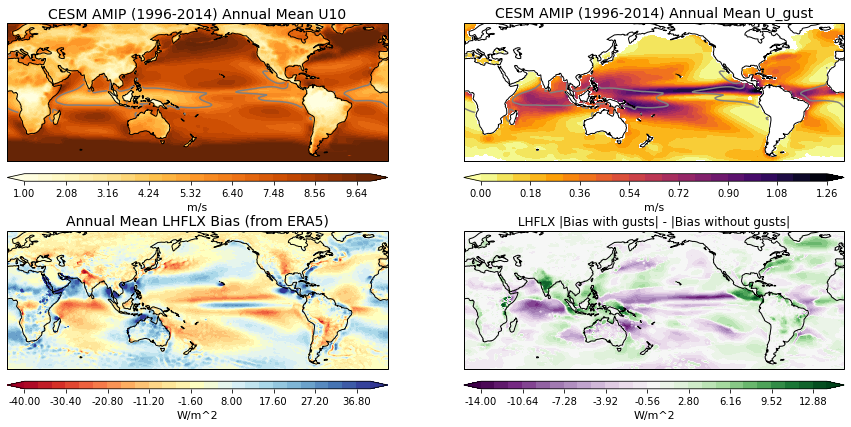

In [21]:
fig,axs = plt.subplots(2,2, figsize = (15,7), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 ctrl case
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 1)/25
u10_pltLims = np.arange(1,10+nstep,nstep)
print('Using case ', all_h0_ANN.isel(case=3).case.values)

c = axs[0].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=3).U10.values), 
                    # np.squeeze(all_h0_ANN.isel(case=3).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title('CESM AMIP (1996-2014) Annual Mean U10', fontsize=14)
axs[0].coastlines()
# axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs[0].set_extent([0,359,-60,70], crs=ccrs.PlateCarree())

# Add colorbar
ax_position = axs[0].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[0].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='grey',  transform=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot UGUST
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.5-0)/25
uGust_pltLims = np.arange(0,1.25+nstep,nstep)

c = axs[1].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, np.squeeze(all_h0_ANN.isel(case=4).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='inferno_r',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('CESM AMIP (1996-2014) Annual Mean U_gust', fontsize=14)
axs[1].coastlines()
axs[1].set_extent([0,359,-60,70], crs=ccrs.PlateCarree())

# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[1].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
                    colors='grey',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot LHFLX bias in ctrl 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
diffmax = 40
nstep = (diffmax*2)/25
diffLevs = np.arange(-diffmax,diffmax+nstep,nstep)

# bias1 = (all_h0_ANN.isel(case=3)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_ANN.slhf.values*fillOcnFrac_h0_mean)
bias1 = (all_h0_ANN.isel(case=3)['LHFLX'].values) - (regridERA5_ANN.slhf.values)
c=axs[2].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, bias1,
                 diffLevs, cmap='RdYlBu', extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('Annual Mean LHFLX Bias (from ERA5)', fontsize=14)
axs[2].coastlines()
axs[2].set_extent([0,359,-60,70], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('W/m^2',fontsize=11)

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot abs change in LHFLX bias 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
diffmax = 14
nstep = (diffmax*2)/25
biasLevs = np.arange(-diffmax,diffmax+nstep,nstep)

# bias2 = (all_h0_ANN.isel(case=4)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_ANN.slhf.values*fillOcnFrac_h0_mean)
bias2 = (all_h0_ANN.isel(case=4)['LHFLX'].values) - (regridERA5_ANN.slhf.values)

biasDiff_1 = np.abs(bias2) - np.abs(bias1)

c=axs[3].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('LHFLX |Bias with gusts| - |Bias without gusts|')
axs[3].coastlines()
axs[3].set_extent([0,359,-60,70], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('W/m^2',fontsize=11)




**Second interlude: AMWG figs**

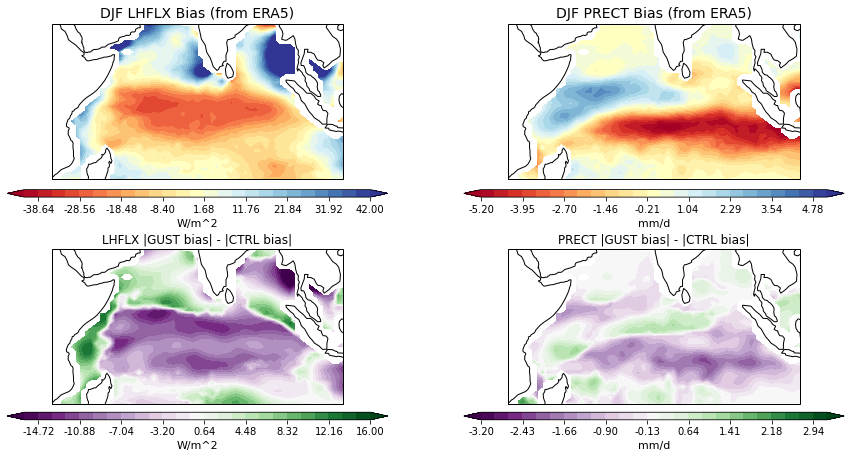

In [37]:
fig,axs = plt.subplots(2,2, figsize = (15,7), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

DSsel = all_h0_DJF


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot LHFLX bias in ctrl 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
diffmax = 42
nstep = (diffmax*2)/25
diffLevs = np.arange(-diffmax,diffmax+nstep,nstep)

bias1 = (DSsel.isel(case=3)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
# bias1 = (all_h0_ANN.isel(case=3)['LHFLX'].values) - (regridERA5_ANN.slhf.values)
c=axs[0].contourf(DSsel.lon.values, DSsel.lat.values, bias1,
                 diffLevs, cmap='RdYlBu', extend='both',transform=ccrs.PlateCarree())
axs[0].set_title('DJF LHFLX Bias (from ERA5)', fontsize=14)
axs[0].coastlines()
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('W/m^2',fontsize=11)
cbar.ax.locator_params(nbins=11)

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot abs change in LHFLX bias 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
diffmax = 16
nstep = (diffmax*2)/25
biasLevs = np.arange(-diffmax,diffmax+nstep,nstep)

bias2 = (DSsel.isel(case=4)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
# bias2 = (all_h0_ANN.isel(case=4)['LHFLX'].values) - (regridERA5_ANN.slhf.values)

biasDiff_1 = np.abs(bias2) - np.abs(bias1)

c=axs[2].contourf(DSsel.lon.values, DSsel.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('LHFLX |GUST bias| - |CTRL bias|')
axs[2].coastlines()
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('W/m^2',fontsize=11)
cbar.ax.locator_params(nbins=11)


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot PRECT bias in ctrl 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
mult = 86400*1e3
diffmax = 5.2
nstep = (diffmax*2)/25
diffLevs = np.arange(-diffmax,diffmax+nstep,nstep)

bias1 = (DSsel.isel(case=3)['PRECT'].values*fillOcnFrac_h0_mean*mult) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
# bias1 = (all_h0_ANN.isel(case=3)['LHFLX'].values) - (regridERA5_ANN.slhf.values)
c=axs[1].contourf(DSsel.lon.values, DSsel.lat.values, bias1,
                 diffLevs, cmap='RdYlBu', extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('DJF PRECT Bias (from ERA5)', fontsize=14)
axs[1].coastlines()
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=11)

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot abs change in PRECT bias 
## - - - - - - - - - - - - - - - - - - - - - - - - - 
mult = 86400*1e3
diffmax = 3.2
nstep = (diffmax*2)/25
biasLevs = np.arange(-diffmax,diffmax+nstep,nstep)

bias2 = (DSsel.isel(case=4)['PRECT'].values*fillOcnFrac_h0_mean*mult) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
# bias2 = (all_h0_ANN.isel(case=4)['LHFLX'].values) - (regridERA5_ANN.slhf.values)

biasDiff_1 = np.abs(bias2) - np.abs(bias1)

c=axs[3].contourf(DSsel.lon.values, DSsel.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('PRECT |GUST bias| - |CTRL bias|')
axs[3].coastlines()
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=11)

# Eq Indian Ocean
axs[0].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[1].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[2].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[3].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())

fig.subplots_adjust(hspace = 0.45)


## continue on

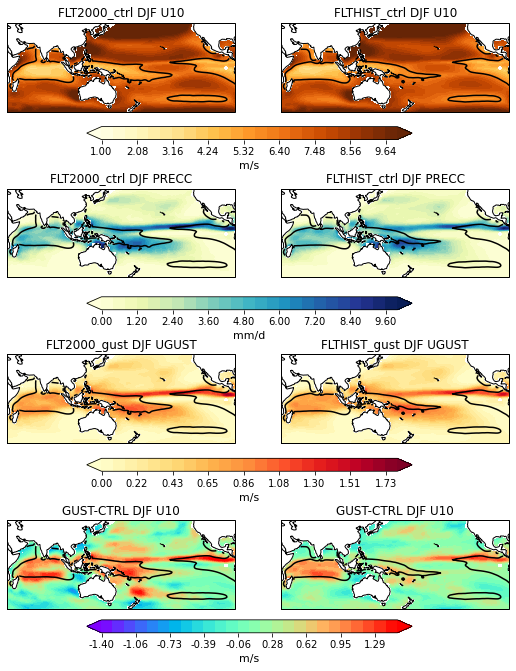

In [55]:
## Wind plot
fig,axs = plt.subplots(4,2, figsize = (9,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 1)/25
u10_pltLims = np.arange(1,10+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF U10')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
## Add line contours too 
CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())
# axs[0].clabel(CS, inline=True, fontsize=10, fmt='%i')


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=3).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF U10')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[1].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot PRECC in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
precc_pltLims = np.arange(0,10+nstep,nstep)

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 86400*1e3*np.squeeze(all_h0_DJF.isel(case=0).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF PRECC')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
## Add line contours too 
CS = axs[2].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 86400*1e3*np.squeeze(all_h0_DJF.isel(case=3).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF PRECC')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
# Add line contour
CS = axs[3].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot UGUST in both gust cases (axs[1] and axs[4])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.8-0)/25
uGust_pltLims = np.arange(0,1.8+nstep,nstep)

axs[4].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=1).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title(str(all_h0_DJF.isel(case=1).case.values)+' DJF UGUST')
axs[4].coastlines()
axs[4].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add line contour
CS = axs[4].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[5].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=4).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_DJF.isel(case=4).case.values)+' DJF UGUST')
axs[5].coastlines()
axs[5].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[5].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.4*2)/25
diff_pltLims = np.arange(-1.4,1.4+nstep,nstep)

diff2000 = np.squeeze(all_h0_DJF.isel(case=1).U10.values) - np.squeeze(all_h0_DJF.isel(case=0).U10.values)
diffHIST = np.squeeze(all_h0_DJF.isel(case=4).U10.values) - np.squeeze(all_h0_DJF.isel(case=3).U10.values)

axs[6].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title('GUST-CTRL DJF U10')
axs[6].coastlines()
axs[6].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add line contour
CS = axs[6].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[7].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('GUST-CTRL DJF U10')
axs[7].coastlines()
axs[7].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.02, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[7].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


# addRegions(axs[0])
# addRegions(axs[1])
# addRegions(axs[2])
# addRegions(axs[3])
# addRegions(axs[4])
# addRegions(axs[5])
# addRegions(axs[6])
# addRegions(axs[7])

# axs[0].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[1].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[2].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[3].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[4].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[5].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[6].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[7].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())


fig.subplots_adjust(hspace=0.07)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_WindMods_withContour.png')

plt.show()


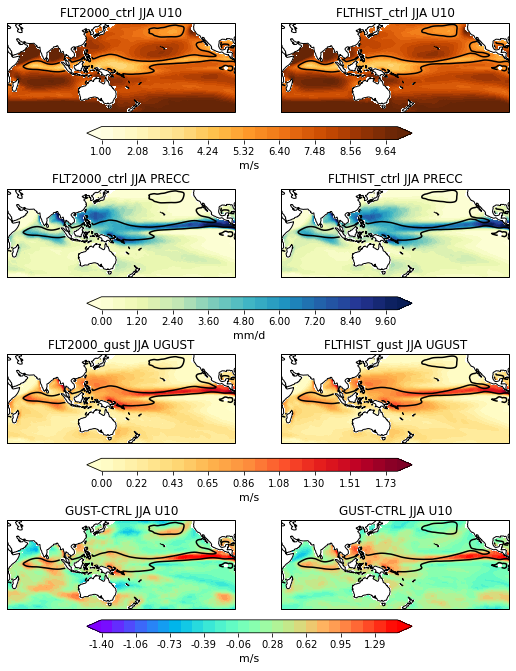

In [26]:
## Wind plot
fig,axs = plt.subplots(4,2, figsize = (9,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 1)/25
u10_pltLims = np.arange(1,10+nstep,nstep)

axs[0].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, np.squeeze(all_h0_JJA.isel(case=0).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_JJA.isel(case=0).case.values)+' JJA U10')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
## Add line contours too 
CS = axs[0].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())
# axs[0].clabel(CS, inline=True, fontsize=10, fmt='%i')


c = axs[1].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, np.squeeze(all_h0_JJA.isel(case=3).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_JJA.isel(case=3).case.values)+' JJA U10')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[1].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot PRECC in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
precc_pltLims = np.arange(0,10+nstep,nstep)

axs[2].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 86400*1e3*np.squeeze(all_h0_JJA.isel(case=0).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_JJA.isel(case=0).case.values)+' JJA PRECC')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
## Add line contours too 
CS = axs[2].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 86400*1e3*np.squeeze(all_h0_JJA.isel(case=3).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title(str(all_h0_JJA.isel(case=3).case.values)+' JJA PRECC')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
# Add line contour
CS = axs[3].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot UGUST in both gust cases (axs[1] and axs[4])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.8-0)/25
uGust_pltLims = np.arange(0,1.8+nstep,nstep)

axs[4].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, np.squeeze(all_h0_JJA.isel(case=1).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title(str(all_h0_JJA.isel(case=1).case.values)+' JJA UGUST')
axs[4].coastlines()
axs[4].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add line contour
CS = axs[4].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[5].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, np.squeeze(all_h0_JJA.isel(case=4).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_JJA.isel(case=4).case.values)+' JJA UGUST')
axs[5].coastlines()
axs[5].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[5].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.4*2)/25
diff_pltLims = np.arange(-1.4,1.4+nstep,nstep)

diff2000 = np.squeeze(all_h0_JJA.isel(case=1).U10.values) - np.squeeze(all_h0_JJA.isel(case=0).U10.values)
diffHIST = np.squeeze(all_h0_JJA.isel(case=4).U10.values) - np.squeeze(all_h0_JJA.isel(case=3).U10.values)

axs[6].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title('GUST-CTRL JJA U10')
axs[6].coastlines()
axs[6].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add line contour
CS = axs[6].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


c = axs[7].contourf(all_h0_JJA.lon.values, all_h0_JJA.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('GUST-CTRL JJA U10')
axs[7].coastlines()
axs[7].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.02, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[7].contour(all_h0_JJA.lon.values, all_h0_JJA.lat.values, 
                    np.squeeze(all_h0_JJA.isel(case=3).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


# addRegions(axs[0])
# addRegions(axs[1])
# addRegions(axs[2])
# addRegions(axs[3])
# addRegions(axs[4])
# addRegions(axs[5])
# addRegions(axs[6])
# addRegions(axs[7])

# axs[0].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[1].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[2].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[3].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[4].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[5].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[6].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())
# axs[7].set_extent([0,359,-65,80], crs=ccrs.PlateCarree())


fig.subplots_adjust(hspace=0.07)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_WindMods_withContour_JJA.png')

plt.show()


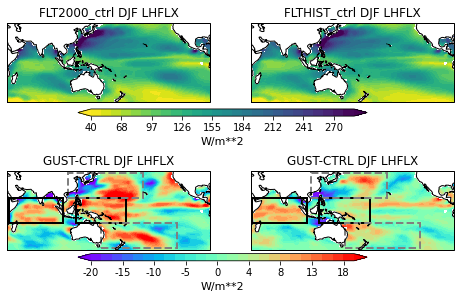

In [90]:
## LHFLX plot
fig,axs = plt.subplots(2,2, figsize = (8,5), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (280 - 40)/25
pltLims = np.arange(40,280+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=0).LHFLX.values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis_r',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF LHFLX')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# ## Add line contours too 
# CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
#                     np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, levels=[0,1,2,3,4,5,6], colors='k')
# axs[0].clabel(CS, inline=True, fontsize=10)


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=3).LHFLX.values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis_r',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF LHFLX')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('W/m**2',fontsize=11)


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (20*2)/25
diff_pltLims = np.arange(-20,20+nstep,nstep)

diff2000 = np.squeeze(all_h0_DJF.isel(case=1).LHFLX.values) - np.squeeze(all_h0_DJF.isel(case=0).LHFLX.values)
diffHIST = np.squeeze(all_h0_DJF.isel(case=4).LHFLX.values) - np.squeeze(all_h0_DJF.isel(case=3).LHFLX.values)

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GUST-CTRL DJF LHFLX')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF LHFLX')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('W/m**2',fontsize=11)

addRegions(axs[2])
addRegions(axs[3])

# fig.subplots_adjust(hspace=0.07)

filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
fig.savefig(filePath+'GustFig_LhflxMods.png')

plt.show()


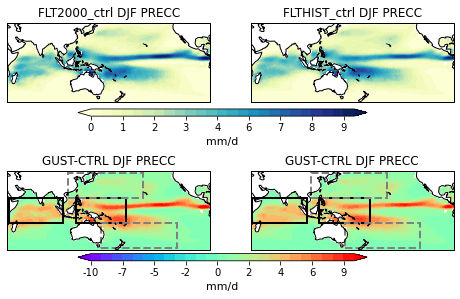

In [26]:
## PRECC/PRECT plot
fig,axs = plt.subplots(2,2, figsize = (8,5), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

mult = 86400*1e3 # Convert m/s to mm/d
varSel = 'PRECC'

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
pltLims = np.arange(0,10+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=0)[varSel].values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF '+varSel)
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# ## Add line contours too 
# CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
#                     np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, levels=[0,1,2,3,4,5,6], colors='k')
# axs[0].clabel(CS, inline=True, fontsize=10)


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=3)[varSel].values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF '+varSel)
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10*2)/25
diff_pltLims = np.arange(-10,10+nstep,nstep)

diff2000 = mult*np.squeeze(all_h0_DJF.isel(case=1)[varSel].values) - np.squeeze(all_h0_DJF.isel(case=0)[varSel].values)
diffHIST = mult*np.squeeze(all_h0_DJF.isel(case=4)[varSel].values) - np.squeeze(all_h0_DJF.isel(case=3)[varSel].values)

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GUST-CTRL DJF '+varSel)
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF '+varSel)
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)

addRegions(axs[2])
addRegions(axs[3])

# fig.subplots_adjust(hspace=0.07)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_LhflxMods.png')

plt.show()


In [49]:
all_h0_DJF.lev.values[45]

855.784210291157

In [18]:
# ## Some measure of stability -- dTheta/dZ to 850 mb? 
# # Theta = T * (P0/P)^k

# k = 2/7

# P0 = 1000  # mb

# Pvals = np.full([len(all_h0_DJF.case.values), len(all_h0_DJF.lev.values), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
# for iLev in range(len(all_h0_DJF.lev.values)): 
#     Pvals[:,iLev,:,:] = all_h0_DJF.lev.values[iLev] 

# theta = all_h0_DJF.T.values * (P0/Pvals)**k


In [34]:
## Interpret to a set level?

# Pull out hya/hyb profiles 
hyam = np.squeeze(all_h0_DJF.hyam.values)
hybm = np.squeeze(all_h0_DJF.hybm.values)
hyai = np.squeeze(all_h0_DJF.hyai.values)
hybi = np.squeeze(all_h0_DJF.hybi.values)

# Surface pressure with time dimension
PS   = all_h0_DJF.PS.values              # Pa 
P0   = 1000.0

pressGoals = [1000, 975, 850, 750]

# thetaInterp = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
zInterp     = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
tInterp     = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
qInterp     = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)

for iCase in range(len(all_h0_DJF.case.values)):
    PS   = all_h0_DJF.isel(case=iCase).PS.values              # Pa 
    
    # thetaInterp[iCase,:,:,:] = Ngl.vinth2p(theta[iCase,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)
    tInterp[iCase,:,:,:] = Ngl.vinth2p(all_h0_DJF.T.values[iCase,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)
    qInterp[iCase,:,:,:] = Ngl.vinth2p(all_h0_DJF.Q.values[iCase,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)
    zInterp[iCase,:,:,:] = Ngl.vinth2p(all_h0_DJF.Z3.values[iCase,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)


In [35]:
theta_e = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)

for iCase in range(len(all_h0_DJF.case.values)):
    for iLev in range(len(pressGoals)):
    
        # Get vapor pressure (use pressure & Q)
        vp = mpc.vapor_pressure(pressGoals[iLev] * units.hPa, qInterp[iCase,iLev,:,:]* units('kg/kg')).to('hPa')

        # Get dewpoint (use vapor pressure)
        Td = mpc.dewpoint(vp)

        # Get equivalent potential temperature (use pressure, temperature, and dewpoint)
        theta_e[iCase,iLev,:,:] = mpc.equivalent_potential_temperature(pressGoals[iLev] * units.hPa, tInterp[iCase,iLev,:,:] * units.K, Td)
    

In [319]:
# Pull out hya/hyb profiles 
hyam = np.squeeze(all_h0_DJF.hyam.values)
hybm = np.squeeze(all_h0_DJF.hybm.values)
hyai = np.squeeze(all_h0_DJF.hyai.values)
hybi = np.squeeze(all_h0_DJF.hybi.values)

# Surface pressure with time dimension
PS   = all_h0_DJF.PS.values              # Pa 
P0   = 1000.0

pressGoals = [500]

# thetaInterp = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
omegaInterp     = np.full([len(all_h0_DJF.case.values), len(pressGoals), len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)

for iCase in range(len(all_h0_DJF.case.values)):
    PS   = all_h0_DJF.isel(case=iCase).PS.values              # Pa 
    
    omegaInterp[iCase,:,:,:] = Ngl.vinth2p(all_h0_DJF.OMEGA.values[iCase,:,:,:],hyam[iCase,:],hybm[iCase,:],pressGoals,PS,1,P0,1,True)

# all_h0_DJF['OMEGA_500'] = (('case','lat','lon'), np.squeeze(omegaInterp) )


ValueError: Could not convert tuple of form (dims, data[, attrs, encoding]): (('case', 'lat', 'lon'), array([[[[ 0.00529918,  0.00529918,  0.00529918, ...,  0.00529918,
           0.00529918,  0.00529918],
         [ 0.00613004,  0.00609492,  0.0060588 , ...,  0.00622895,
           0.0061971 ,  0.00616412],
         [ 0.00814366,  0.00804091,  0.0079363 , ...,  0.00843946,
           0.00834306,  0.00824442],
         ...,
         [-0.00295644, -0.00292994, -0.00290311, ..., -0.00303336,
          -0.00300821, -0.00298255],
         [-0.0024836 , -0.00247506, -0.00246628, ..., -0.00250771,
          -0.00249993, -0.00249189],
         [-0.00214991, -0.00214991, -0.00214991, ..., -0.00214991,
          -0.00214991, -0.00214991]]],


       [[[ 0.00487736,  0.00487736,  0.00487736, ...,  0.00487736,
           0.00487736,  0.00487736],
         [ 0.00443113,  0.00439117,  0.00435117, ...,  0.00455021,
           0.0045107 ,  0.00447099],
         [ 0.00434746,  0.00424023,  0.00413318, ...,  0.00466912,
           0.00456203,  0.00445477],
         ...,
         [-0.0005027 , -0.00047332, -0.00044472, ..., -0.00059486,
          -0.00056354, -0.0005328 ],
         [-0.00119207, -0.00118153, -0.00117129, ..., -0.00122555,
          -0.00121409, -0.00120293],
         [-0.00135547, -0.00135547, -0.00135547, ..., -0.00135547,
          -0.00135547, -0.00135547]]],


       [[[ 0.00836471,  0.00836471,  0.00836471, ...,  0.00836471,
           0.00836471,  0.00836471],
         [ 0.01000614,  0.00998627,  0.00996535, ...,  0.01005902,
           0.01004256,  0.01002492],
         [ 0.01168641,  0.01160651,  0.01152584, ...,  0.01192003,
           0.01184332,  0.0117654 ],
         ...,
         [-0.00108382, -0.00110588, -0.00112739, ..., -0.00101381,
          -0.00103782, -0.00106114],
         [-0.0007447 , -0.00076098, -0.00077718, ..., -0.00069552,
          -0.00071197, -0.00072837],
         [-0.00047164, -0.00047164, -0.00047164, ..., -0.00047164,
          -0.00047164, -0.00047164]]],


       [[[ 0.00605269,  0.00605269,  0.00605269, ...,  0.00605269,
           0.00605269,  0.00605269],
         [ 0.00785252,  0.00782306,  0.00779239, ...,  0.00793296,
           0.00790752,  0.00788069],
         [ 0.01012651,  0.01001995,  0.00991176, ...,  0.01043461,
           0.01033402,  0.01023127],
         ...,
         [ 0.00074473,  0.0007717 ,  0.00079933, ...,  0.00066829,
           0.00069297,  0.00071846],
         [ 0.00127686,  0.00128709,  0.00129749, ...,  0.00124731,
           0.00125697,  0.00126682],
         [ 0.00177852,  0.00177852,  0.00177852, ...,  0.00177852,
           0.00177852,  0.00177852]]],


       [[[ 0.0068487 ,  0.0068487 ,  0.0068487 , ...,  0.0068487 ,
           0.0068487 ,  0.0068487 ],
         [ 0.00802846,  0.00799281,  0.00795612, ...,  0.00812854,
           0.00809638,  0.008063  ],
         [ 0.00994905,  0.00983057,  0.00971066, ...,  0.01029412,
           0.010181  ,  0.01006591],
         ...,
         [-0.00213386, -0.00217532, -0.00221522, ..., -0.0020002 ,
          -0.0020463 , -0.00209086],
         [-0.00092263, -0.00094211, -0.00096113, ..., -0.00086164,
          -0.00088238, -0.00090272],
         [-0.00034837, -0.00034837, -0.00034837, ..., -0.00034837,
          -0.00034837, -0.00034837]]]])) to Variable.

In [321]:
all_h0_DJF['OMEGA_500'] = (('case','lat','lon'), np.squeeze(omegaInterp) )


In [37]:
dTheta_dZ = (theta_e[:,2,:,:] - theta_e[:,0,:,:]) / (1e-3*(zInterp[:,2,:,:] - zInterp[:,0,:,:]))

dT_dZ =  (tInterp[:,2,:,:] - tInterp[:,0,:,:]) / (1e-3*(zInterp[:,2,:,:] - zInterp[:,0,:,:]))


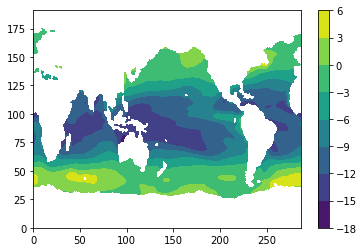

In [85]:
plt.contourf(dTheta_dZ[1,:,:]*fillOcnFrac_h0_mean)
plt.colorbar()

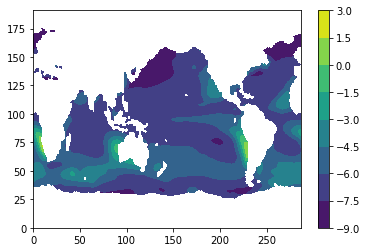

In [60]:
plt.contourf(dT_dZ[1,:,:]*fillOcnFrac_h0_mean)
plt.colorbar()

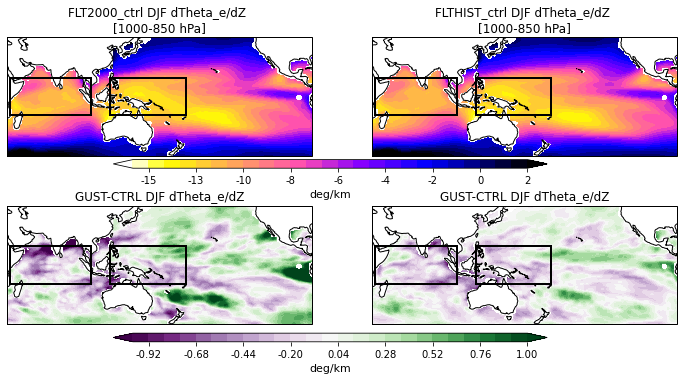

In [41]:
dT_dZ =  (theta_e[:,2,:,:] - theta_e[:,0,:,:]) / (1e-3*(zInterp[:,2,:,:] - zInterp[:,0,:,:]))


## Plot something about stability
fig,axs = plt.subplots(2,2, figsize = (12,6), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (2 - -16)/25
pltLims = np.arange(-16,2+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(dT_dZ[0,:,:])*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='gnuplot2_r',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF dTheta_e/dZ \n[1000-850 hPa]')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# ## Add line contours too 
# CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
#                     np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, levels=[0,1,2,3,4,5,6], colors='k')
# axs[0].clabel(CS, inline=True, fontsize=10)


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(dT_dZ[3,:,:])*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='gnuplot2_r',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF dTheta_e/dZ \n[1000-850 hPa]')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('deg/km',fontsize=11)

addRegions(axs[0])
addRegions(axs[1])

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1*2)/25
diff_pltLims = np.arange(-1, 1+nstep,nstep)

diff2000 = np.squeeze(dT_dZ[1,:,:]) - np.squeeze(dT_dZ[0,:,:])
diffHIST = np.squeeze(dT_dZ[4,:,:]) - np.squeeze(dT_dZ[3,:,:])

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='PRGn',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GUST-CTRL DJF dTheta_e/dZ')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='PRGn',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF dTheta_e/dZ')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('deg/km',fontsize=11)

addRegions(axs[2])
addRegions(axs[3])

fig.subplots_adjust(hspace=0.07)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_dTheta_dZ.png')

plt.show()


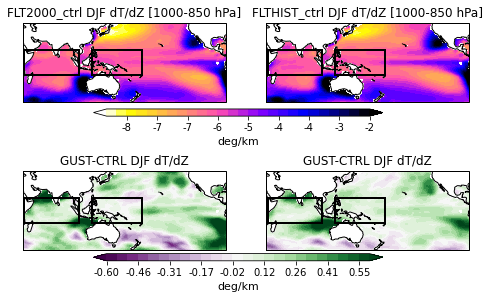

In [81]:
dT_dZ =  (tInterp[:,2,:,:] - tInterp[:,0,:,:]) / (1e-3*(zInterp[:,2,:,:] - zInterp[:,0,:,:]))


## Plot something about stability
fig,axs = plt.subplots(2,2, figsize = (8,5), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (-3 - -9)/25
pltLims = np.arange(-9,-3+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(dT_dZ[0,:,:])*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='gnuplot2_r',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF dT/dZ [1000-850 hPa]')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# ## Add line contours too 
# CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
#                     np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, levels=[0,1,2,3,4,5,6], colors='k')
# axs[0].clabel(CS, inline=True, fontsize=10)


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(dT_dZ[3,:,:])*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='gnuplot2_r',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF dT/dZ [1000-850 hPa]')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('deg/km',fontsize=11)

addRegions(axs[0])
addRegions(axs[1])

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (0.6*2)/25
diff_pltLims = np.arange(-0.6, 0.6+nstep,nstep)

diff2000 = np.squeeze(dT_dZ[1,:,:]) - np.squeeze(dT_dZ[0,:,:])
diffHIST = np.squeeze(dT_dZ[4,:,:]) - np.squeeze(dT_dZ[3,:,:])

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='PRGn',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GUST-CTRL DJF dT/dZ')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffHIST*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='PRGn',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF dT/dZ')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('deg/km',fontsize=11)

addRegions(axs[2])
addRegions(axs[3])

# fig.subplots_adjust(hspace=0.07)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig.savefig(filePath+'GustFig_LhflxMods.png')

plt.show()


**Bias plots**

LHFLX biases in paper-ready layout?

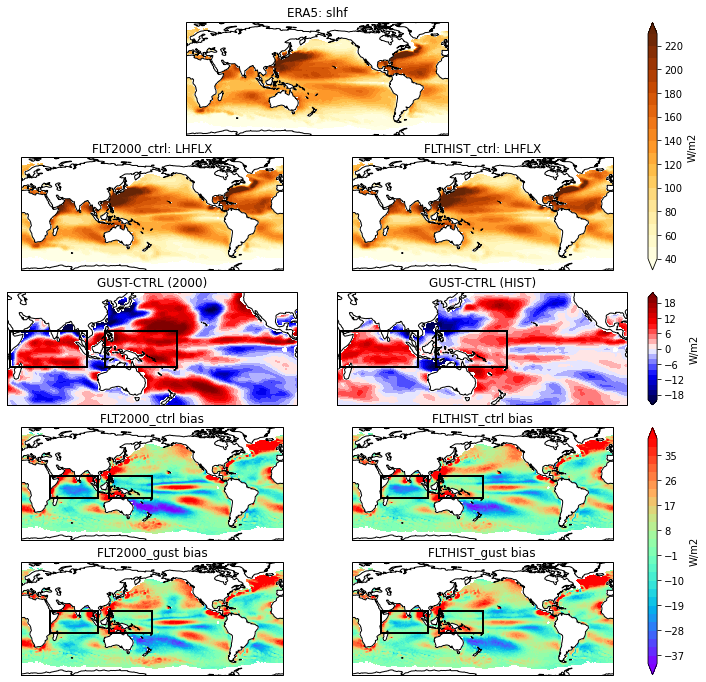

In [42]:
fig3 = plt.figure(constrained_layout=True, figsize=(12,12))
gs = fig3.add_gridspec(5, 5, width_ratios=[1,0.8,0.8,1,0.05])

DStoUse     = all_h0_DJF
levsMap     = np.arange(40,240, 10)
diffLevs    = np.arange(-40,43,3)
unitsString = all_h0['LHFLX'].units
varSel = 'LHFLX'

axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: slhf')
axs0.coastlines()

axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label='W/m2')


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, diff1,
               np.arange(-20,22,2), cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()

axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, diff2,
               np.arange(-20,22,2), cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label='W/m2')



axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
bias1 = (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, bias1,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs3.set_title(str(DStoUse.isel(case=0).case.values)+' bias')
axs3.coastlines()


axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
bias2 = (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, bias2,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs4.set_title(str(DStoUse.isel(case=3).case.values)+' bias')
axs4.coastlines()

    
axs5 = fig3.add_subplot(gs[4, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
bias3 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
axs5.contourf(DStoUse.lon.values, DStoUse.lat.values, bias3,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs5.set_title(str(DStoUse.isel(case=1).case.values)+' bias')
axs5.coastlines()


axs6 = fig3.add_subplot(gs[4, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
bias4 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.slhf.values*fillOcnFrac_h0_mean)
cplt = axs6.contourf(DStoUse.lon.values, DStoUse.lat.values, bias4,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs6.set_title(str(DStoUse.isel(case=4).case.values)+' bias')
axs6.coastlines()

# Range used in MS figure 
axs0.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs1.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs2.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs3.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs4.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs5.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs6.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs_add1.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
axs_add2.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3::,4])
plt.colorbar(cplt, cax=axes, label='W/m2')

addRegions(axs3)
addRegions(axs4)
addRegions(axs5)
addRegions(axs6)
addRegions(axs_add1)
addRegions(axs_add2)

fig3.subplots_adjust(wspace=0.01)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_BiasPlots.png')


(192, 288)

In [23]:
def wgt_rmse(fld1, fld2, wgt):
    """Calculate the area-weighted RMSE.

    Parameters
    ----------
    fld1, fld2 : array-like
        2-dimensional spatial fields with the same shape.
        They can be xarray DataArray or numpy arrays.
    wgt : array-like
        the weight vector, expected to be 1-dimensional,
        matching length of one dimension of the data.

    Returns
    -------
    float
        root mean squared error

    Notes:
    ```rmse = sqrt( mean( (fld1 - fld2)**2 ) )```
    """
    assert len(fld1.shape) == 2,     "Input fields must have exactly two dimensions."
    assert fld1.shape == fld2.shape, "Input fields must have the same array shape."
    # in case these fields are in dask arrays, compute them now.
    if hasattr(fld1, "compute"):
        fld1 = fld1.compute()
    if hasattr(fld2, "compute"):
        fld2 = fld2.compute()
    if isinstance(fld1, xr.DataArray) and isinstance(fld2, xr.DataArray):
        return (np.sqrt(((fld1 - fld2)**2).weighted(wgt).mean())).values.item()
    else:
        check = [len(wgt) == s for s in fld1.shape]
        if ~np.any(check):
            raise IOError(f"Sorry, weight array has shape {wgt.shape} which is not compatible with data of shape {fld1.shape}")
        check = [len(wgt) != s for s in fld1.shape]
        dimsize = fld1.shape[np.argwhere(check).item()]  # want to get the dimension length for the dim that does not match the size of wgt
        warray = np.tile(wgt, (dimsize, 1)).transpose()   # May need more logic to ensure shape is correct.
        warray = warray / np.sum(warray) # normalize
        wmse = np.sum(warray * (fld1 - fld2)**2)
    
        return np.sqrt( wmse ).item()

    
    
lat = all_h0_DJF['lat']
wgt = np.cos(np.radians(lat))
print('       GLOBAL RMSE (LHFLX)')
print('             CTRL      GUST')
print('------------------------------------')
print('FLT2000 %9.3f %9.3f' % ( wgt_rmse(fillOcnFrac_h0_mean*all_h0_DJF['LHFLX'].isel(case=0), fillOcnFrac_h0_mean*regridERA5_DJF['slhf'], wgt), wgt_rmse(fillOcnFrac_h0_mean*all_h0_DJF['LHFLX'].isel(case=1), fillOcnFrac_h0_mean*regridERA5_DJF['slhf'], wgt)) )
print('FLTHIST %9.3f %9.3f' % ( wgt_rmse(fillOcnFrac_h0_mean*all_h0_DJF['LHFLX'].isel(case=3), fillOcnFrac_h0_mean*regridERA5_DJF['slhf'], wgt), wgt_rmse(fillOcnFrac_h0_mean*all_h0_DJF['LHFLX'].isel(case=4), fillOcnFrac_h0_mean*regridERA5_DJF['slhf'], wgt)) )
print()

print('  Tropical (15˚S-15˚N) RMSE (LHFLX)')
print('             CTRL      GUST')
print('------------------------------------')

selLats = np.where( (all_h0_DJF.lat.values >=-15) & (all_h0_DJF.lat.values<=15) )[0]
all_h0_DJF_tropics = all_h0_DJF.isel(lat=selLats)

lat = all_h0_DJF_tropics['lat']
wgt = np.cos(np.radians(lat))
print('FLT2000 %9.3f  %9.3f' % ( wgt_rmse(fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['LHFLX'].isel(case=0), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['slhf'].isel(lat=selLats), wgt), wgt_rmse(fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['LHFLX'].isel(case=1), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['slhf'].isel(lat=selLats), wgt)) )
print('FLTHIST %9.3f  %9.3f' % (wgt_rmse(fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['LHFLX'].isel(case=3), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['slhf'].isel(lat=selLats), wgt),  wgt_rmse(fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['LHFLX'].isel(case=4), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['slhf'].isel(lat=selLats), wgt)) )



       GLOBAL RMSE (LHFLX)
             CTRL      GUST
------------------------------------
FLT2000    18.859    17.150
FLTHIST    17.297    15.961

  Tropical (15˚S-15˚N) RMSE (LHFLX)
             CTRL      GUST
------------------------------------
FLT2000    20.765     18.039
FLTHIST    19.409     17.129


(192, 288)

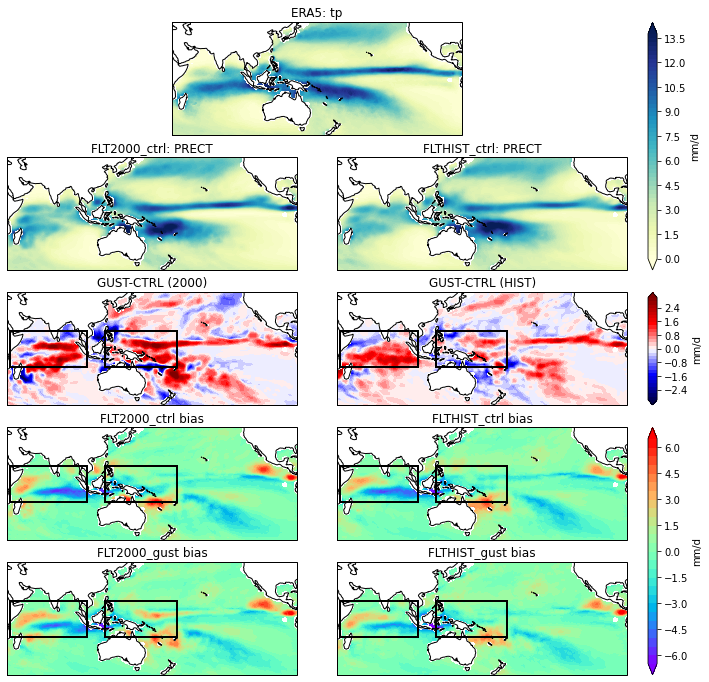

In [25]:
fig3 = plt.figure(constrained_layout=True, figsize=(12,12))
gs = fig3.add_gridspec(5, 5, width_ratios=[1,0.8,0.8,1,0.05])

DStoUse     = all_h0_DJF
levsMap     = np.arange(0,14, 0.25)
diffLevs    = np.arange(-6.5,7.0,0.5)
unitsString = 'mm/d'
varSel = 'PRECT'

mult = 86400*1e3



axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: tp')
axs0.coastlines()
axs0.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
axs1.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label='mm/d')


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               np.arange(-3,3.2,0.2), cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
axs_add1.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               np.arange(-3,3.2,0.2), cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
axs_add2.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label='mm/d')



axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
bias1 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, bias1,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs3.set_title(str(DStoUse.isel(case=0).case.values)+' bias')
axs3.coastlines()
axs3.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
bias2 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, bias2,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs4.set_title(str(DStoUse.isel(case=3).case.values)+' bias')
axs4.coastlines()
axs4.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

    
axs5 = fig3.add_subplot(gs[4, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
bias3 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
axs5.contourf(DStoUse.lon.values, DStoUse.lat.values, bias3,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs5.set_title(str(DStoUse.isel(case=1).case.values)+' bias')
axs5.coastlines()
axs5.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


axs6 = fig3.add_subplot(gs[4, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF.tp.values*fillOcnFrac_h0_mean)
cplt = axs6.contourf(DStoUse.lon.values, DStoUse.lat.values, bias4,
               diffLevs, cmap='rainbow', extend='both',transform=ccrs.PlateCarree())
axs6.set_title(str(DStoUse.isel(case=4).case.values)+' bias')
axs6.coastlines()
axs6.set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3::,4])
plt.colorbar(cplt, cax=axes, label='mm/d')

addRegions(axs3)
addRegions(axs4)
addRegions(axs5)
addRegions(axs6)
addRegions(axs_add1)
addRegions(axs_add2)

fig3.subplots_adjust(wspace=0.01)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_PrectBiasPlots.png')


In [68]:

lat = all_h0_DJF['lat']
wgt = np.cos(np.radians(lat))
print('       GLOBAL RMSE (PRECT [mm/d])')
print('             CTRL      GUST')
print('------------------------------------')
print('FLT2000 %9.3f %9.3f' % ( wgt_rmse(86400*1e3*fillOcnFrac_h0_mean*all_h0_DJF['PRECT'].isel(case=0), fillOcnFrac_h0_mean*regridERA5_DJF['tp'], wgt), 
                               wgt_rmse(86400*1e3*fillOcnFrac_h0_mean*all_h0_DJF['PRECT'].isel(case=1), fillOcnFrac_h0_mean*regridERA5_DJF['tp'], wgt)) )
print('FLTHIST %9.3f %9.3f' % ( wgt_rmse(86400*1e3*fillOcnFrac_h0_mean*all_h0_DJF['PRECT'].isel(case=3), fillOcnFrac_h0_mean*regridERA5_DJF['tp'], wgt), 
                               wgt_rmse(86400*1e3*fillOcnFrac_h0_mean*all_h0_DJF['PRECT'].isel(case=4), fillOcnFrac_h0_mean*regridERA5_DJF['tp'], wgt)) )
print()

print('  Tropical (15˚S-15˚N) RMSE (PRECT [mm/d])')
print('             CTRL      GUST')
print('------------------------------------')

selLats = np.where( (all_h0_DJF.lat.values >=-15) & (all_h0_DJF.lat.values<=15) )[0]
all_h0_DJF_tropics = all_h0_DJF.isel(lat=selLats)

lat = all_h0_DJF_tropics['lat']
wgt = np.cos(np.radians(lat))
print('FLT2000 %9.3f  %9.3f' % ( wgt_rmse(86400*1e3*fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['PRECT'].isel(case=0), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['tp'].isel(lat=selLats), wgt), 
                                wgt_rmse(86400*1e3*fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['PRECT'].isel(case=1), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['tp'].isel(lat=selLats), wgt)) )
print('FLTHIST %9.3f  %9.3f' % (wgt_rmse(86400*1e3*fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['PRECT'].isel(case=3), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['tp'].isel(lat=selLats), wgt),  
                                wgt_rmse(86400*1e3*fillOcnFrac_h0_mean[selLats,:]*all_h0_DJF_tropics['PRECT'].isel(case=4), fillOcnFrac_h0_mean[selLats,:]*regridERA5_DJF['tp'].isel(lat=selLats), wgt)) )



       GLOBAL RMSE (PRECT [mm/d])
             CTRL      GUST
------------------------------------
FLT2000     1.247     1.155
FLTHIST     1.192     1.043

  Tropical (15˚S-15˚N) RMSE (PRECT [mm/d])
             CTRL      GUST
------------------------------------
FLT2000     1.831      1.695
FLTHIST     1.742      1.513


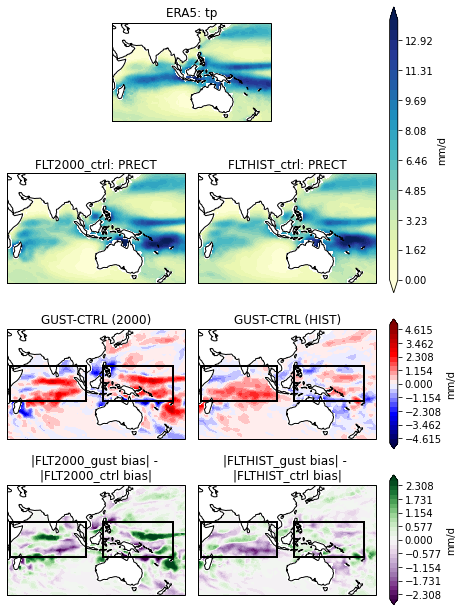

In [23]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,0.8,0.8,1,0.09])

DStoUse     = all_h0_DJF
cStep = (14-0)/26
levsMap     = np.arange(0,14+cStep, cStep)
dStep = (2*5)/26
diffLevs    = np.arange(-5,5+dStep,dStep)
bStep = (2*2.5)/26
biasLevs = np.arange(-2.5,2.5+bStep, bStep)

unitsString = 'mm/d'
varSel = 'PRECT'
obsVar = 'tp'

mult = 86400*1e3

axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: '+obsVar)
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)

axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs3.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs4.coastlines()
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

addRegions(axs3)
addRegions(axs4)
addRegions(axs_add1)
addRegions(axs_add2)


# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_prectBiasZoomedWithBiasDiff.png')


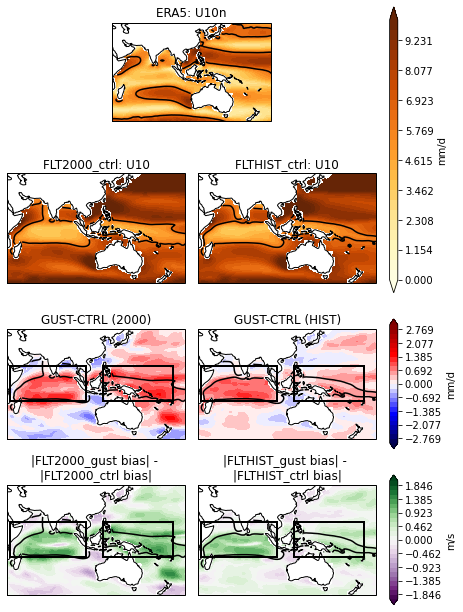

In [24]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,0.8,0.8,1,0.09])

DStoUse     = all_h0_DJF
cStep = (10-0)/26
levsMap     = np.arange(0,10+cStep, cStep)
dStep = (2*3)/26
diffLevs    = np.arange(-3,3+dStep,dStep)
bStep = (2*2)/26
biasLevs = np.arange(-2,2+bStep, bStep)

unitsString = 'm/s'
varSel = 'U10'
obsVar = 'U10'

mult = 1

axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs0.contour(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, 
             np.squeeze(regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs0.set_title('ERA5: U10n')
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
## Add line contours too 
axs1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label='mm/d')


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
## Add line contours too 
axs_add1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())

axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
## Add line contours too 
axs_add2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label='mm/d')

bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)

axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs3.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs3.coastlines()
## Add line contours too 
axs3.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs4.coastlines()
## Add line contours too 
axs4.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label='m/s')

addRegions(axs3)
addRegions(axs4)
addRegions(axs_add1)
addRegions(axs_add2)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10biasZoomedWithBiasDiff.png')


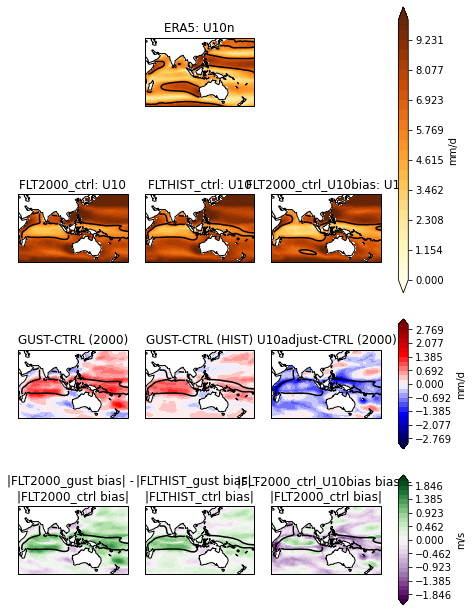

In [28]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 4, width_ratios=[1,1,1,0.09])

DStoUse     = all_h0_DJF
cStep = (10-0)/26
levsMap     = np.arange(0,10+cStep, cStep)
dStep = (2*3)/26
diffLevs    = np.arange(-3,3+dStep,dStep)
bStep = (2*2)/26
biasLevs = np.arange(-2,2+bStep, bStep)

unitsString = 'm/s'
varSel = 'U10'
obsVar = 'U10'

mult = 1

axs0 = fig3.add_subplot(gs[0, 1], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs0.contour(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, 
             np.squeeze(regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs0.set_title('ERA5: U10n')
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
## Add line contours too 
axs1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs3 = fig3.add_subplot(gs[1, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs3.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs3.set_title(str(DStoUse.isel(case=2).case.values)+': '+varSel)
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


axs_add1 = fig3.add_subplot(gs[2, 0], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
## Add line contours too 
axs_add1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())

axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 1], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
## Add line contours too 
axs_add2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add3 = fig3.add_subplot(gs[2, 2], projection=ccrs.PlateCarree(central_longitude=180))
diff3 = (DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff3,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add3.set_title('U10adjust-CTRL (2000)')
axs_add3.coastlines()
## Add line contours too 
axs_add3.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs_add3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias2 = mult*(DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)
biasDiff_3 = np.abs(bias2) - np.abs(bias0)


axs4 = fig3.add_subplot(gs[3, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs4.coastlines()
## Add line contours too 
axs4.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs5 = fig3.add_subplot(gs[3, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs5.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs5.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs5.coastlines()
## Add line contours too 
axs5.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs5.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs6 = fig3.add_subplot(gs[3, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs6.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_3,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs6.set_title('|'+str(DStoUse.isel(case=2).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs6.coastlines()
## Add line contours too 
axs6.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs6.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,3])
plt.colorbar(cplt, cax=axes, label='m/s')

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10biasZoomedWithBiasDiff.png')


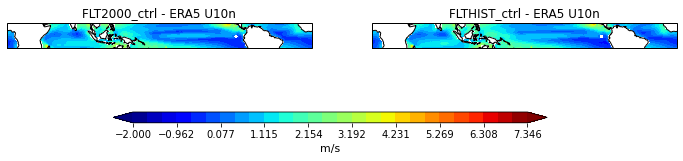

In [45]:
DStoUse     = all_h0_ANN
# DStoUse     = all_h0_DJF
dStep = (7--2)/26
diffLevs    = np.arange(-2,7+dStep,dStep)

unitsString = 'm/s'
varSel = 'U10'
obsVar = 'U10'

mult = 1

# bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
# bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_ANN[obsVar].values*fillOcnFrac_h0_mean)
bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_ANN[obsVar].values*fillOcnFrac_h0_mean)


fig,axs = plt.subplots(1,2, figsize=(12,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel() 

axs[0].contourf(DStoUse.lon.values, DStoUse.lat.values, bias0, 
                diffLevs, cmap='jet', extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(DStoUse.isel(case=0).case.values)+' - ERA5 U10n')
axs[0].coastlines()

c = axs[1].contourf(DStoUse.lon.values, DStoUse.lat.values, bias3, 
                diffLevs, cmap='jet', extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(DStoUse.isel(case=3).case.values)+' - ERA5 U10n')
axs[1].coastlines()

# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('m/s',fontsize=11)


axs[0].set_extent([0,359,-15,15], crs=ccrs.PlateCarree())
axs[1].set_extent([0,359,-15,15], crs=ccrs.PlateCarree())



In [47]:
## What's mean difference between the two? 

selLat = np.where((DStoUse.lat.values>=-15) & (DStoUse.lat.values<=15))[0]

DStoUse = DStoUse.isel(lat=selLat)

weights = np.cos(np.deg2rad(DStoUse.lat))
weights.name = "weights"

diff1 = (DStoUse.isel(case=0)[varSel]*fillOcnFrac_h0_mean[selLat,:]) - (regridERA5_ANN[obsVar].isel(lat=selLat)*fillOcnFrac_h0_mean[selLat,:])
diff1_weighted = diff1.weighted(weights)
diff1_weighted_mean = diff1_weighted.mean(("lon", "lat"))
diff1_weighted_mean = diff1_weighted.std(("lon", "lat"))
print('Weighted mean difference (F2000 - ERA5)', diff1_weighted_mean.values)

diff2 = (DStoUse.isel(case=3)[varSel]*fillOcnFrac_h0_mean[selLat,:]) - (regridERA5_ANN[obsVar].isel(lat=selLat)*fillOcnFrac_h0_mean[selLat,:])
diff2_weighted = diff2.weighted(weights)
diff2_weighted_mean = diff2_weighted.mean(("lon", "lat"))
print('Weighted mean difference (FHIST - ERA5)', diff2_weighted_mean.values)


Weighted mean difference (F2000 - ERA5) 0.7620980533622538
Weighted mean difference (FHIST - ERA5) 0.7958455169713348


In [50]:
np.nanmean((DStoUse.isel(case=0)[varSel]*fillOcnFrac_h0_mean[selLat,:]))

6.297007502424842

In [51]:
np.nanmean((DStoUse.isel(case=3)[varSel]*fillOcnFrac_h0_mean[selLat,:]))

6.3662370431893915

In [52]:
np.nanmean(regridERA5_ANN[obsVar].isel(lat=selLat)*fillOcnFrac_h0_mean[selLat,:])

5.567840041406937

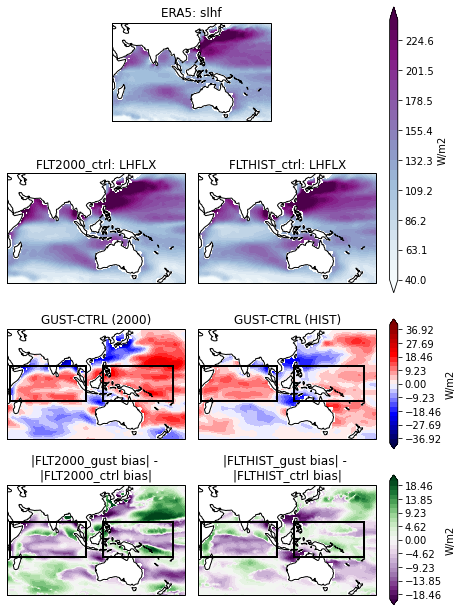

In [25]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,0.8,0.8,1,0.09])

DStoUse     = all_h0_DJF
cStep = (240-40)/26
levsMap     = np.arange(40,240+cStep, cStep)
dStep = (2*40)/26
diffLevs    = np.arange(-40,40+dStep,dStep)
bStep = (2*20)/26
biasLevs = np.arange(-20,20+bStep, bStep)

unitsString = all_h0['LHFLX'].units
varSel = 'LHFLX'
obsVar = 'slhf'

mult = 1

axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: '+obsVar)
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)

axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs3.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs4.coastlines()
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

addRegions(axs3)
addRegions(axs4)
addRegions(axs_add1)
addRegions(axs_add2)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_lhflxBiasZoomedWithBiasDiff.png')


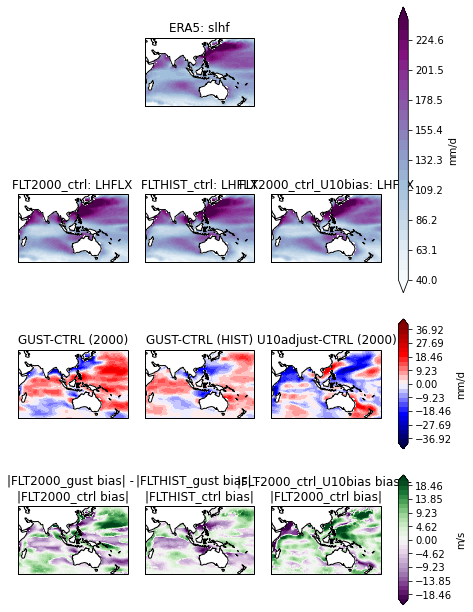

In [30]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 4, width_ratios=[1,1,1,0.09])

DStoUse     = all_h0_DJF
cStep = (240-40)/26
levsMap     = np.arange(40,240+cStep, cStep)
dStep = (2*40)/26
diffLevs    = np.arange(-40,40+dStep,dStep)
bStep = (2*20)/26
biasLevs = np.arange(-20,20+bStep, bStep)

unitsString = all_h0['LHFLX'].units
varSel = 'LHFLX'
obsVar = 'slhf'

mult = 1


axs0 = fig3.add_subplot(gs[0, 1], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs0.contour(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, 
             np.squeeze(regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs0.set_title('ERA5: '+obsVar)
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
## Add line contours too 
axs1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs3 = fig3.add_subplot(gs[1, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
## Add line contours too 
axs3.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs3.set_title(str(DStoUse.isel(case=2).case.values)+': '+varSel)
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


axs_add1 = fig3.add_subplot(gs[2, 0], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
## Add line contours too 
axs_add1.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())

axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 1], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
## Add line contours too 
axs_add2.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add3 = fig3.add_subplot(gs[2, 2], projection=ccrs.PlateCarree(central_longitude=180))
diff3 = (DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff3,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add3.set_title('U10adjust-CTRL (2000)')
axs_add3.coastlines()
## Add line contours too 
axs_add3.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs_add3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias2 = mult*(DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)
biasDiff_3 = np.abs(bias2) - np.abs(bias0)


axs4 = fig3.add_subplot(gs[3, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs4.coastlines()
## Add line contours too 
axs4.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs5 = fig3.add_subplot(gs[3, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs5.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs5.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs5.coastlines()
## Add line contours too 
axs5.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs5.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs6 = fig3.add_subplot(gs[3, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs6.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_3,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs6.set_title('|'+str(DStoUse.isel(case=2).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs6.coastlines()
## Add line contours too 
axs6.contour(DStoUse.lon.values, DStoUse.lat.values, 
             np.squeeze(mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean), [0, 6], 
             colors='k',  transform=ccrs.PlateCarree())
axs6.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,3])
plt.colorbar(cplt, cax=axes, label='m/s')

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10biasZoomedWithBiasDiff.png')


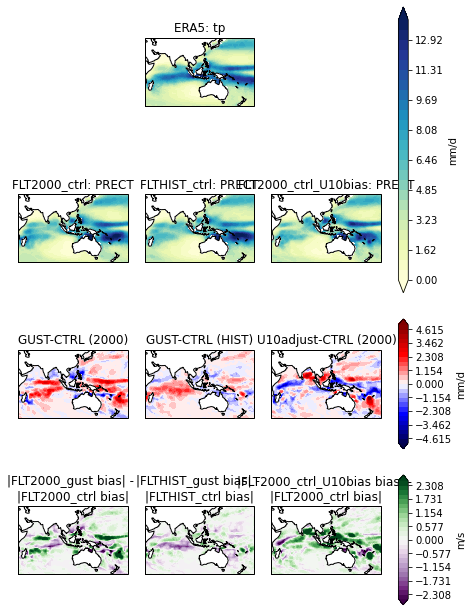

In [32]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 4, width_ratios=[1,1,1,0.09])

DStoUse     = all_h0_DJF
cStep = (14-0)/26
levsMap     = np.arange(0,14+cStep, cStep)
dStep = (2*5)/26
diffLevs    = np.arange(-5,5+dStep,dStep)
bStep = (2*2.5)/26
biasLevs = np.arange(-2.5,2.5+bStep, bStep)

unitsString = 'mm/d'
varSel = 'PRECT'
obsVar = 'tp'

mult = 86400*1e3

axs0 = fig3.add_subplot(gs[0, 1], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: '+obsVar)
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs3 = fig3.add_subplot(gs[1, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs3.set_title(str(DStoUse.isel(case=2).case.values)+': '+varSel)
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


axs_add1 = fig3.add_subplot(gs[2, 0], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 1], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add3 = fig3.add_subplot(gs[2, 2], projection=ccrs.PlateCarree(central_longitude=180))
diff3 = (DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add3.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff3,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add3.set_title('U10adjust-CTRL (2000)')
axs_add3.coastlines()
axs_add3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,3])
plt.colorbar(cplt, cax=axes, label='mm/d')


bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias2 = mult*(DStoUse.isel(case=2)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)
biasDiff_3 = np.abs(bias2) - np.abs(bias0)


axs4 = fig3.add_subplot(gs[3, 0], projection=ccrs.PlateCarree(central_longitude=180))
axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs4.coastlines()
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs5 = fig3.add_subplot(gs[3, 1], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs5.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs5.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs5.coastlines()
axs5.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs6 = fig3.add_subplot(gs[3, 2], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs6.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_3,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs6.set_title('|'+str(DStoUse.isel(case=2).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs6.coastlines()
axs6.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,3])
plt.colorbar(cplt, cax=axes, label='m/s')

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10biasZoomedWithBiasDiff.png')


In [33]:
all_h0_DJF['OMEGA500'] = (('case','lat','lon'), all_h0_DJF.OMEGA.sel(lev=500, method='nearest').values)

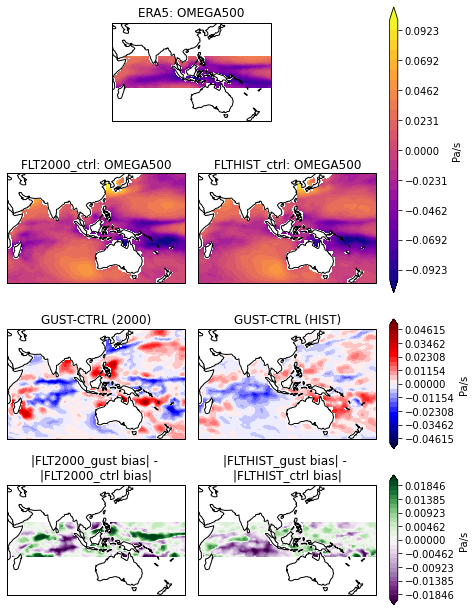

In [37]:
fig3 = plt.figure(constrained_layout=True, figsize=(7,11))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,0.8,0.8,1,0.09])

DStoUse     = all_h0_DJF
cStep = (0.1--0.1)/26
levsMap     = np.arange(-0.1,0.1+cStep, cStep)
dStep = (2*0.05)/26
diffLevs    = np.arange(-0.05,0.05+dStep,dStep)
bStep = (2*0.02)/26
biasLevs = np.arange(-0.02,0.02+bStep, bStep)

unitsString = all_h0['OMEGA'].units
varSel = 'OMEGA500'
obsVar = 'OMEGA500'

mult = 1

axs0 = fig3.add_subplot(gs[0, 1:3], projection=ccrs.PlateCarree(central_longitude=180))
axs0.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean),
               levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())
axs0.set_title('ERA5: '+obsVar)
axs0.coastlines()
axs0.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs1 = fig3.add_subplot(gs[1, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.coastlines()
axs1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs2 = fig3.add_subplot(gs[1, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean,
               levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.coastlines()
axs2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[0:2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)


axs_add1 = fig3.add_subplot(gs[2, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
diff1 = (DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean)
axs_add1.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff1,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add1.set_title('GUST-CTRL (2000)')
axs_add1.coastlines()
axs_add1.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs_add2 = fig3.add_subplot(gs[2, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
diff2 = (DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean)
cplt = axs_add2.contourf(DStoUse.lon.values, DStoUse.lat.values, mult*diff2,
               diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
axs_add2.set_title('GUST-CTRL (HIST)')
axs_add2.coastlines()
axs_add2.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[2,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

bias0 = mult*(DStoUse.isel(case=0)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias1 = mult*(DStoUse.isel(case=1)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

bias3 = mult*(DStoUse.isel(case=3)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)
bias4 = mult*(DStoUse.isel(case=4)[varSel].values*fillOcnFrac_h0_mean) - (regridERA5_DJF[obsVar].values*fillOcnFrac_h0_mean)

biasDiff_1 = np.abs(bias1) - np.abs(bias0)
biasDiff_2 = np.abs(bias4) - np.abs(bias3)

axs3 = fig3.add_subplot(gs[3, 0:2], projection=ccrs.PlateCarree(central_longitude=180))
axs3.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs3.set_title('|'+str(DStoUse.isel(case=1).case.values)+' bias| - \n|'+str(DStoUse.isel(case=0).case.values)+' bias|')
axs3.coastlines()
axs3.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs4 = fig3.add_subplot(gs[3, 2:4], projection=ccrs.PlateCarree(central_longitude=180))
cplt=axs4.contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_2,
               biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
axs4.set_title('|'+str(DStoUse.isel(case=4).case.values)+' bias| - \n|'+str(DStoUse.isel(case=3).case.values)+' bias|')
axs4.coastlines()
axs4.set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label=unitsString)

# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10nBiasPlotsZoomed.png')
# filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
# fig3.savefig(filePath+'GustFig_U10nBiasPlotsZoomed.png')


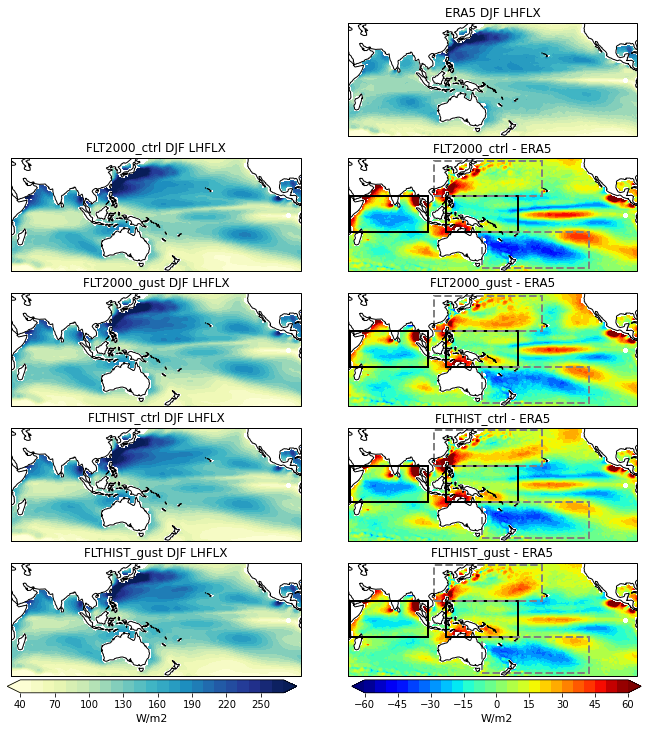

In [30]:
## LHFLX

pltLims  = np.arange(40,280, 10)
diffLims = np.arange(-60,65,5)
cmap_diffs = 'jet'

## Make figure
fig,axs = plt.subplots(5,2, figsize = (12,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

fig.delaxes(axs[0])

# - - - - - - - - - - - - - - - - 
## Plot observations 
## - - - - - - - - - - - - - - - - 
# ERA5
axs[1].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, np.squeeze(regridERA5_DJF.slhf.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('ERA5 DJF LHFLX')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# - - - - - - - - - - - - - - - - 
## Plot raw values   
## - - - - - - - - - - - - - - - - 
axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=0).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF LHFLX')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[4].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=1).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title(str(all_h0_DJF.isel(case=1).case.values)+' DJF LHFLX')
axs[4].coastlines()
axs[4].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[6].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=3).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF LHFLX')
axs[6].coastlines()
axs[6].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

c=axs[8].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=4).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[8].set_title(str(all_h0_DJF.isel(case=4).case.values)+' DJF LHFLX')
axs[8].coastlines()
axs[8].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[8].get_position()
cbar_ax     = fig.add_axes([ax_position.x0+0.012, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('W/m2',fontsize=11)


# - - - - - - - - - - - - - - - - 
## Plot biases 
## - - - - - - - - - - - - - - - - 
axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(all_h0_DJF.isel(case=0).LHFLX.values)- np.squeeze(regridERA5_DJF.slhf.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[3].set_title(str(all_h0_DJF.isel(case=0).case.values)+' - ERA5')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[5].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(all_h0_DJF.isel(case=1).LHFLX.values)- np.squeeze(regridERA5_DJF.slhf.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_DJF.isel(case=1).case.values)+' - ERA5')
axs[5].coastlines()
axs[5].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[7].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(all_h0_DJF.isel(case=3).LHFLX.values)- np.squeeze(regridERA5_DJF.slhf.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[7].set_title(str(all_h0_DJF.isel(case=3).case.values)+' - ERA5')
axs[7].coastlines()
axs[7].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

c = axs[9].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(all_h0_DJF.isel(case=4).LHFLX.values)- np.squeeze(regridERA5_DJF.slhf.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[9].set_title(str(all_h0_DJF.isel(case=4).case.values)+' - ERA5')
axs[9].coastlines()
axs[9].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[9].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.012, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('W/m2',fontsize=11)

addRegions(axs[3])
addRegions(axs[5])
addRegions(axs[7])
addRegions(axs[9])

fig.subplots_adjust(wspace=0.01)


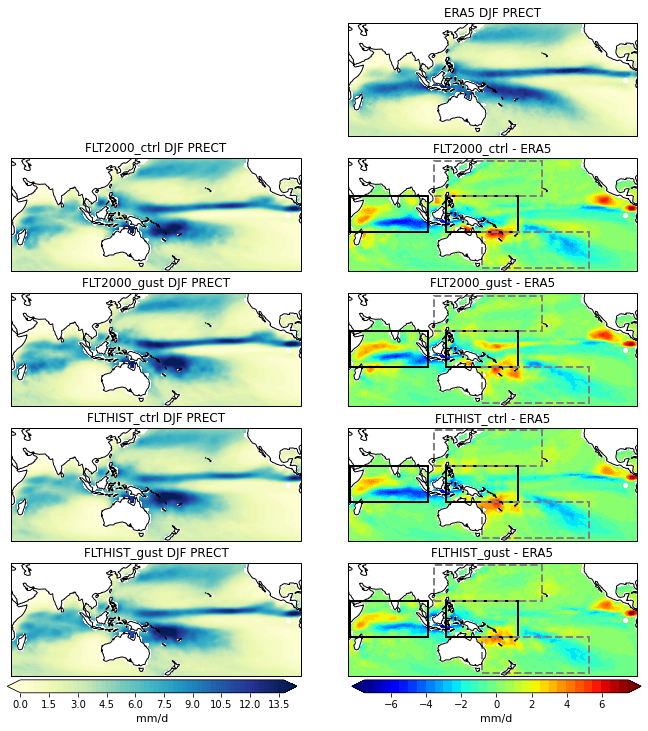

In [31]:
## PRECT (vs ERA5)

mult = 86400*1e3

pltLims  = np.arange(0,14, 0.25)
diffLims = np.arange(-7.5,8.0,0.5)
cmap_diffs = 'jet'



## Make figure
fig,axs = plt.subplots(5,2, figsize = (12,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

fig.delaxes(axs[0])

# - - - - - - - - - - - - - - - - 
## Plot observations 
## - - - - - - - - - - - - - - - - 
# ERA5
axs[1].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, np.squeeze(regridERA5_DJF.tp.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('ERA5 DJF PRECT')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

# - - - - - - - - - - - - - - - - 
## Plot raw values   
## - - - - - - - - - - - - - - - - 
axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=0).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF PRECT')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[4].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=1).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title(str(all_h0_DJF.isel(case=1).case.values)+' DJF PRECT')
axs[4].coastlines()
axs[4].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[6].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=3).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF PRECT')
axs[6].coastlines()
axs[6].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

c=axs[8].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=4).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[8].set_title(str(all_h0_DJF.isel(case=4).case.values)+' DJF PRECT')
axs[8].coastlines()
axs[8].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[8].get_position()
cbar_ax     = fig.add_axes([ax_position.x0+0.012, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)


# - - - - - - - - - - - - - - - - 
## Plot biases 
## - - - - - - - - - - - - - - - - 
axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(mult*all_h0_DJF.isel(case=0).PRECT.values)- np.squeeze(regridERA5_DJF.tp.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[3].set_title(str(all_h0_DJF.isel(case=0).case.values)+' - ERA5')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[5].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(mult*all_h0_DJF.isel(case=1).PRECT.values)- np.squeeze(regridERA5_DJF.tp.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_DJF.isel(case=1).case.values)+' - ERA5')
axs[5].coastlines()
axs[5].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

axs[7].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(mult*all_h0_DJF.isel(case=3).PRECT.values)- np.squeeze(regridERA5_DJF.tp.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[7].set_title(str(all_h0_DJF.isel(case=3).case.values)+' - ERA5')
axs[7].coastlines()
axs[7].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

c = axs[9].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                (np.squeeze(mult*all_h0_DJF.isel(case=4).PRECT.values)- np.squeeze(regridERA5_DJF.tp.values))*fillOcnFrac_h0_mean, 
                diffLims, cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[9].set_title(str(all_h0_DJF.isel(case=4).case.values)+' - ERA5')
axs[9].coastlines()
axs[9].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[9].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.012, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)

addRegions(axs[3])
addRegions(axs[5])
addRegions(axs[7])
addRegions(axs[9])

fig.subplots_adjust(wspace=0.01)


**Can we make a single plot for the Indian Ocean region?**

In [25]:
# all_h0_DJF['OMEGA500'] = (('case','lat','lon'), all_h0_DJF.OMEGA.sel(lev=500, method='nearest').values)

# If ran interpolation script above: 
all_h0_DJF['OMEGA500'] = all_h0_DJF['OMEGA_500'] 


In [38]:
print(all_h0_DJF.OMEGA.sel(lev=500, method='nearest').lev.values)

498.511103515625


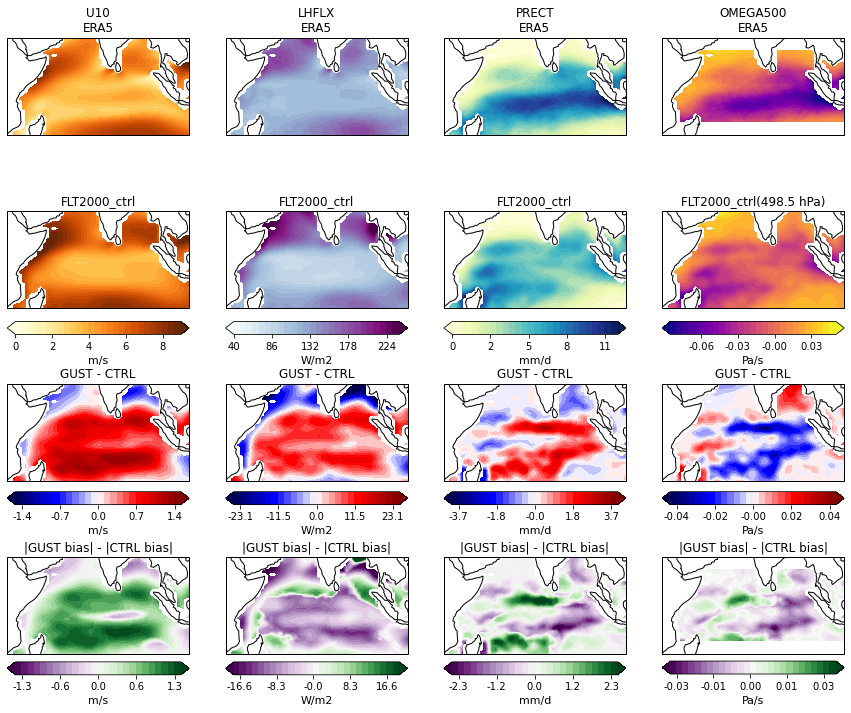

In [44]:
fig,axs = plt.subplots(4,4, figsize=(15,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

DStoUse     = all_h0_DJF

# U10 options
cStep = (9-0)/26
U10_levsMap     = np.arange(0,9+cStep, cStep)
dStep = (2*1.5)/26
U10_diffLevs    = np.arange(-1.5,1.5+dStep,dStep)
bStep = (2*1.4)/26
U_10biasLevs = np.arange(-1.4,1.4+bStep, bStep)

# LHFLX options
cStep = (240-40)/26
lhflx_levsMap     = np.arange(40,240+cStep, cStep)
dStep = (2*25)/26
lhflx_diffLevs    = np.arange(-25,25+dStep,dStep)
bStep = (2*18)/26
lhflx_biasLevs = np.arange(-18,18+bStep, bStep)

# PRECT options
mult = 1e3 * 86400
cStep = (12-0)/26
prect_levsMap     = np.arange(0,12+cStep, cStep)
dStep = (2*4)/26
prect_diffLevs    = np.arange(-4,4+dStep,dStep)
bStep = (2*2.5)/26
prect_biasLevs = np.arange(-2.5,2.5+bStep, bStep)

# OMEGA options
cStep = (0.04--0.08)/26
omega_levsMap     = np.arange(-0.08,0.04+cStep, cStep)
dStep = (2*0.04)/26
omega_diffLevs    = np.arange(-0.04,0.04+dStep,dStep)
bStep = (2*0.03)/26
omega_biasLevs = np.arange(-0.03,0.03+bStep, bStep)


## Top row: ERA5 
## - - - - - - - - - - - - - - - - - - - 
axs[0].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean),
               U10_levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs[1].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean),
               lhflx_levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs[2].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean),
               prect_levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs[3].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean),
               omega_levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())


## Second row: CTRL FLT2000
## - - - - - - - - - - - - - - - - - - - 
c = axs[4].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['U10'].isel(case=0).values*fillOcnFrac_h0_mean),
               U10_levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%i')
cbar.set_label('m/s',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[5].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['LHFLX'].isel(case=0).values*fillOcnFrac_h0_mean),
               lhflx_levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%i')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[6].contourf(DStoUse.lon.values, DStoUse.lat.values, (mult*DStoUse['PRECT'].isel(case=0).values*fillOcnFrac_h0_mean),
               prect_levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[6].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[7].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['OMEGA500'].isel(case=0).values*fillOcnFrac_h0_mean),
               omega_levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)


## Third row: GUST - CTRL FLT2000
## - - - - - - - - - - - - - - - - - - - 
c = axs[8].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                (DStoUse['U10'].isel(case=1).values*fillOcnFrac_h0_mean)- (DStoUse['U10'].isel(case=0).values*fillOcnFrac_h0_mean),
               U10_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[8].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('m/s',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[9].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                (DStoUse['LHFLX'].isel(case=1).values*fillOcnFrac_h0_mean) - (DStoUse['LHFLX'].isel(case=0).values*fillOcnFrac_h0_mean),
               lhflx_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[9].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[10].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                 (mult*DStoUse['PRECT'].isel(case=1).values*fillOcnFrac_h0_mean) - (mult*DStoUse['PRECT'].isel(case=0).values*fillOcnFrac_h0_mean),
               prect_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[10].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[11].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                 (DStoUse['OMEGA500'].isel(case=1).values*fillOcnFrac_h0_mean) - (DStoUse['OMEGA500'].isel(case=0).values*fillOcnFrac_h0_mean),
               omega_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[11].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)



## Fourth row: GUSTbias - CTRLbias FLT2000
## - - - - - - - - - - - - - - - - - - - 
bias0 = (DStoUse.isel(case=0)['U10'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean)
bias1 = (DStoUse.isel(case=1)['U10'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[12].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               U_10biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[12].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('m/s',fontsize=11)
cbar.ax.locator_params(nbins=5)

bias0 = (DStoUse.isel(case=0)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean)
bias1 = (DStoUse.isel(case=1)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[13].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               lhflx_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[13].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)


bias0 = (mult*DStoUse.isel(case=0)['PRECT'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean)
bias1 = (mult*DStoUse.isel(case=1)['PRECT'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[14].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               prect_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[14].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

bias0 = (DStoUse.isel(case=0)['OMEGA500'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean)
bias1 = (DStoUse.isel(case=1)['OMEGA500'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[15].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               omega_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[15].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.075, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)




## Other plot options
axs[0].set_title('U10\nERA5')
axs[1].set_title('LHFLX\nERA5')
axs[2].set_title('PRECT\nERA5')
axs[3].set_title('OMEGA500\nERA5')

axs[4].set_title(all_h0_DJF.isel(case=0).case.values)
axs[5].set_title(all_h0_DJF.isel(case=0).case.values)
axs[6].set_title(all_h0_DJF.isel(case=0).case.values)
axs[7].set_title(str(all_h0_DJF.isel(case=0).case.values) + '(498.5 hPa)')

axs[8].set_title('GUST - CTRL')
axs[9].set_title('GUST - CTRL')
axs[10].set_title('GUST - CTRL')
axs[11].set_title('GUST - CTRL')

axs[12].set_title('|GUST bias| - |CTRL bias|')
axs[13].set_title('|GUST bias| - |CTRL bias|')
axs[14].set_title('|GUST bias| - |CTRL bias|')
axs[15].set_title('|GUST bias| - |CTRL bias|')

axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()
axs[3].coastlines()
axs[4].coastlines()
axs[5].coastlines()
axs[6].coastlines()
axs[7].coastlines()
axs[8].coastlines()
axs[9].coastlines()
axs[10].coastlines()
axs[11].coastlines()
axs[12].coastlines()
axs[13].coastlines()
axs[14].coastlines()
axs[15].coastlines()

# Eq Indian Ocean
axs[0].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[1].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[2].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[3].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[4].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[5].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[6].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[7].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[8].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[9].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[10].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[11].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[12].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[13].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[14].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[15].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())

fig.subplots_adjust(hspace = 0.3)

filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
fig.savefig(filePath+'GustFig_IndianOcean_allBiases.png')


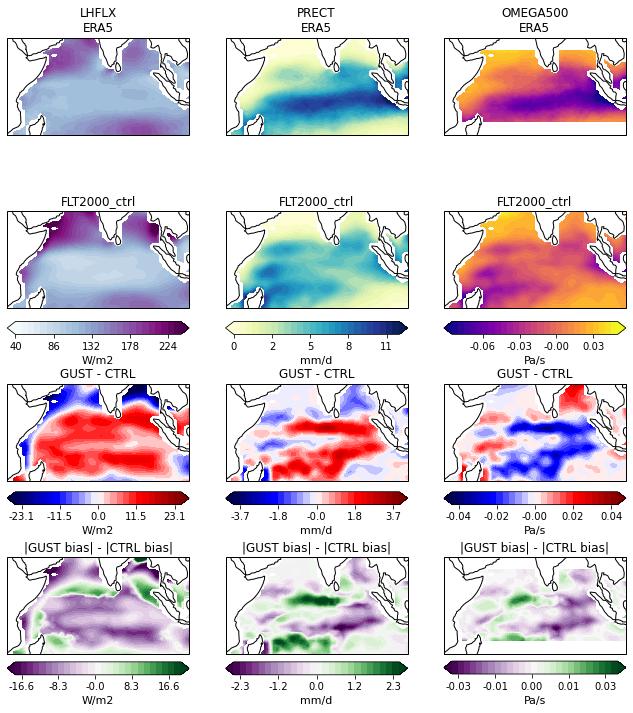

In [48]:
fig,axs = plt.subplots(4,4, figsize=(15,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

DStoUse     = all_h0_DJF

# U10 options
cStep = (9-0)/26
U10_levsMap     = np.arange(0,9+cStep, cStep)
dStep = (2*1.5)/26
U10_diffLevs    = np.arange(-1.5,1.5+dStep,dStep)
bStep = (2*1.4)/26
U_10biasLevs = np.arange(-1.4,1.4+bStep, bStep)

# LHFLX options
cStep = (240-40)/26
lhflx_levsMap     = np.arange(40,240+cStep, cStep)
dStep = (2*25)/26
lhflx_diffLevs    = np.arange(-25,25+dStep,dStep)
bStep = (2*18)/26
lhflx_biasLevs = np.arange(-18,18+bStep, bStep)

# PRECT options
mult = 1e3 * 86400
cStep = (12-0)/26
prect_levsMap     = np.arange(0,12+cStep, cStep)
dStep = (2*4)/26
prect_diffLevs    = np.arange(-4,4+dStep,dStep)
bStep = (2*2.5)/26
prect_biasLevs = np.arange(-2.5,2.5+bStep, bStep)

# OMEGA options
cStep = (0.04--0.08)/26
omega_levsMap     = np.arange(-0.08,0.04+cStep, cStep)
dStep = (2*0.04)/26
omega_diffLevs    = np.arange(-0.04,0.04+dStep,dStep)
bStep = (2*0.03)/26
omega_biasLevs = np.arange(-0.03,0.03+bStep, bStep)


## Top row: ERA5 
## - - - - - - - - - - - - - - - - - - - 
# axs[0].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean),
#                U10_levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
axs[1].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean),
               lhflx_levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
axs[2].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean),
               prect_levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
axs[3].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean),
               omega_levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())


## Second row: CTRL FLT2000
## - - - - - - - - - - - - - - - - - - - 
# c = axs[4].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['U10'].isel(case=0).values*fillOcnFrac_h0_mean),
#                U10_levsMap, cmap='YlOrBr', extend='both',transform=ccrs.PlateCarree())
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
# cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%i')
# cbar.set_label('m/s',fontsize=11)
# cbar.ax.locator_params(nbins=5)

c = axs[5].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['LHFLX'].isel(case=0).values*fillOcnFrac_h0_mean),
               lhflx_levsMap, cmap='BuPu', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%i')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[6].contourf(DStoUse.lon.values, DStoUse.lat.values, (mult*DStoUse['PRECT'].isel(case=0).values*fillOcnFrac_h0_mean),
               prect_levsMap, cmap='YlGnBu', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[6].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[7].contourf(DStoUse.lon.values, DStoUse.lat.values, (DStoUse['OMEGA500'].isel(case=0).values*fillOcnFrac_h0_mean),
               omega_levsMap, cmap='plasma', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)


## Third row: GUST - CTRL FLT2000
## - - - - - - - - - - - - - - - - - - - 
# c = axs[8].contourf(DStoUse.lon.values, DStoUse.lat.values, 
#                 (DStoUse['U10'].isel(case=1).values*fillOcnFrac_h0_mean)- (DStoUse['U10'].isel(case=0).values*fillOcnFrac_h0_mean),
#                U10_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# # Add colorbar
# ax_position = axs[8].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
# cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
# cbar.set_label('m/s',fontsize=11)
# cbar.ax.locator_params(nbins=5)

c = axs[9].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                (DStoUse['LHFLX'].isel(case=1).values*fillOcnFrac_h0_mean) - (DStoUse['LHFLX'].isel(case=0).values*fillOcnFrac_h0_mean),
               lhflx_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[9].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[10].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                 (mult*DStoUse['PRECT'].isel(case=1).values*fillOcnFrac_h0_mean) - (mult*DStoUse['PRECT'].isel(case=0).values*fillOcnFrac_h0_mean),
               prect_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[10].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

c = axs[11].contourf(DStoUse.lon.values, DStoUse.lat.values, 
                 (DStoUse['OMEGA500'].isel(case=1).values*fillOcnFrac_h0_mean) - (DStoUse['OMEGA500'].isel(case=0).values*fillOcnFrac_h0_mean),
               omega_diffLevs, cmap='seismic', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[11].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)



## Fourth row: GUSTbias - CTRLbias FLT2000
## - - - - - - - - - - - - - - - - - - - 
# bias0 = (DStoUse.isel(case=0)['U10'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean)
# bias1 = (DStoUse.isel(case=1)['U10'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['U10'].values*fillOcnFrac_h0_mean)
# biasDiff_1 = np.abs(bias1) - np.abs(bias0)
# c = axs[12].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
#                U_10biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# # Add colorbar
# ax_position = axs[12].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
# cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
# cbar.set_label('m/s',fontsize=11)
# cbar.ax.locator_params(nbins=5)

bias0 = (DStoUse.isel(case=0)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean)
bias1 = (DStoUse.isel(case=1)['LHFLX'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['slhf'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[13].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               lhflx_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[13].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.1f')
cbar.set_label('W/m2',fontsize=11)
cbar.ax.locator_params(nbins=5)


bias0 = (mult*DStoUse.isel(case=0)['PRECT'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean)
bias1 = (mult*DStoUse.isel(case=1)['PRECT'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['tp'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[14].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               prect_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[14].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
cbar.set_label('mm/d',fontsize=11)
cbar.ax.locator_params(nbins=5)

bias0 = (DStoUse.isel(case=0)['OMEGA500'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean)
bias1 = (DStoUse.isel(case=1)['OMEGA500'].values*fillOcnFrac_h0_mean) - (regridERA5_DJF['OMEGA500'].values*fillOcnFrac_h0_mean)
biasDiff_1 = np.abs(bias1) - np.abs(bias0)
c = axs[15].contourf(DStoUse.lon.values, DStoUse.lat.values, biasDiff_1,
               omega_biasLevs, cmap='PRGn', extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[15].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.075, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('Pa/s',fontsize=11)
cbar.ax.locator_params(nbins=5)




## Other plot options
axs[0].set_title('U10\nERA5')
axs[1].set_title('LHFLX\nERA5')
axs[2].set_title('PRECT\nERA5')
axs[3].set_title('OMEGA500\nERA5')

axs[4].set_title(all_h0_DJF.isel(case=0).case.values)
axs[5].set_title(all_h0_DJF.isel(case=0).case.values)
axs[6].set_title(all_h0_DJF.isel(case=0).case.values)
# axs[7].set_title(str(all_h0_DJF.isel(case=0).case.values) + '(498.5 hPa)')
axs[7].set_title(str(all_h0_DJF.isel(case=0).case.values))

axs[8].set_title('GUST - CTRL')
axs[9].set_title('GUST - CTRL')
axs[10].set_title('GUST - CTRL')
axs[11].set_title('GUST - CTRL')

axs[12].set_title('|GUST bias| - |CTRL bias|')
axs[13].set_title('|GUST bias| - |CTRL bias|')
axs[14].set_title('|GUST bias| - |CTRL bias|')
axs[15].set_title('|GUST bias| - |CTRL bias|')

axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()
axs[3].coastlines()
axs[4].coastlines()
axs[5].coastlines()
axs[6].coastlines()
axs[7].coastlines()
axs[8].coastlines()
axs[9].coastlines()
axs[10].coastlines()
axs[11].coastlines()
axs[12].coastlines()
axs[13].coastlines()
axs[14].coastlines()
axs[15].coastlines()

# Eq Indian Ocean
axs[0].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[1].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[2].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[3].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[4].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[5].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[6].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[7].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[8].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[9].set_extent([35,110,-20,20],  crs=ccrs.PlateCarree())
axs[10].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[11].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[12].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[13].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[14].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())
axs[15].set_extent([35,110,-20,20], crs=ccrs.PlateCarree())

fig.subplots_adjust(hspace = 0.3)

axs[0].remove()
axs[4].remove()
axs[8].remove()
axs[12].remove()

filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
fig.savefig(filePath+'GustFig_IndianOcean_allBiasesExceptU10.png')


ENSO maps

In [26]:
meanDJF_ElNino  = all_h0_DJF_ElNino.mean(dim='time')
meanDJF_LaNina  = all_h0_DJF_LaNina.mean(dim='time')
meanDJF_Neutral = all_h0_DJF_Neutral.mean(dim='time')


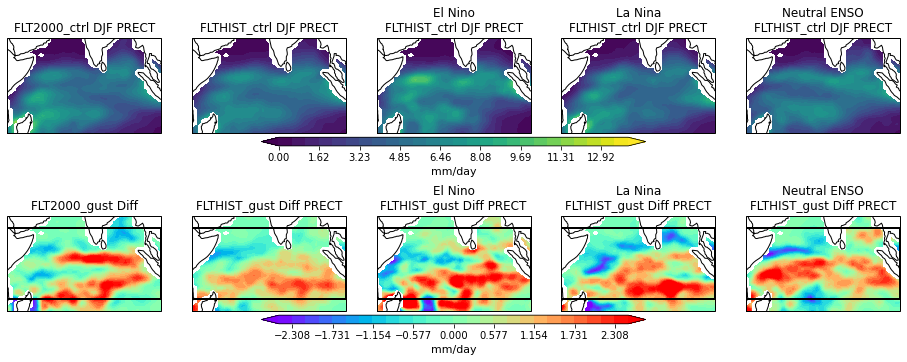

In [29]:
# varSel = 'LHFLX'
# unitsString = 'W/m2'
# mult = 1
# pStep   = (250-70)/26
# pltLims = np.arange(70, 250+pStep, pStep)
# dStep = (2*25)/26
# diffLims = np.arange(-25, 25+dStep, dStep)

# varSel = 'U10'
# unitsString = 'm/s'
# mult = 1
# pStep   = (10-2)/26
# pltLims = np.arange(2, 10+pStep, pStep)
# dStep = (1.5--0.5)/26
# diffLims = np.arange(-0.5, 1.5+dStep, dStep)

varSel = 'PRECT'
unitsString = 'mm/day'
mult = 1e3*86400
pStep   = (14-0)/26
pltLims = np.arange(0, 14+pStep, pStep)
dStep = (2*2.5)/26
diffLims = np.arange(-2.5, 2.5+dStep, dStep)

# varSel = 'PRECC'
# unitsString = 'mm/day'
# mult = 1e3*86400
# pStep   = (8-0)/26
# pltLims = np.arange(0, 8+pStep, pStep)
# dStep = (2*2)/26
# diffLims = np.arange(-2, 2+dStep, dStep)

# varSel = 'OMEGA_500'
# unitsString = all_h0.OMEGA.units
# mult = 1
# pStep   = (0.5--0.5)/26
# pltLims = np.arange(-0.5, 0.5+pStep, pStep)
# dStep = (2*0.05)/26
# diffLims = np.arange(-0.05, 0.05+dStep, dStep)

fig,axs = plt.subplots(2,5, figsize=(16,6), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

# - - - - - - - - - - - - - - - - 
## Plot raw values   
## - - - - - - - - - - - - - - - - 
axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF[varSel].isel(case=0).values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF '+varSel)
axs[0].coastlines()
axs[0].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF '+varSel)
axs[1].coastlines()
axs[1].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

c = axs[2].contourf(meanDJF_ElNino.lon.values, meanDJF_ElNino.lat.values, mult*np.squeeze(meanDJF_ElNino[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('El Nino\n'+str(meanDJF_ElNino.isel(case=3).case.values)+' DJF '+varSel)
axs[2].coastlines()
axs[2].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)


axs[3].contourf(meanDJF_LaNina.lon.values, meanDJF_LaNina.lat.values, mult*np.squeeze(meanDJF_LaNina[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('La Nina\n'+str(meanDJF_LaNina.isel(case=3).case.values)+' DJF '+varSel)
axs[3].coastlines()
axs[3].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[4].contourf(meanDJF_Neutral.lon.values, meanDJF_Neutral.lat.values, mult*np.squeeze(meanDJF_Neutral[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title('Neutral ENSO\n'+str(meanDJF_Neutral.isel(case=3).case.values)+' DJF '+varSel)
axs[4].coastlines()
axs[4].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# - - - - - - - - - - - - - - - - 
## Plot HET differences   
## - - - - - - - - - - - - - - - - 
axs[5].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=1).values - all_h0_DJF[varSel].isel(case=0).values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_DJF.isel(case=1).case.values)+' Diff')
axs[5].coastlines()
axs[5].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[6].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=4).values - all_h0_DJF[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title(str(all_h0_DJF.isel(case=4).case.values)+' Diff '+varSel)
axs[6].coastlines()
axs[6].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

c = axs[7].contourf(meanDJF_ElNino.lon.values, meanDJF_ElNino.lat.values, 
                    mult*np.squeeze(meanDJF_ElNino[varSel].isel(case=4).values - meanDJF_ElNino[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('El Nino\n'+str(meanDJF_ElNino.isel(case=4).case.values)+' Diff '+varSel)
axs[7].coastlines()
axs[7].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs[8].contourf(meanDJF_LaNina.lon.values, meanDJF_LaNina.lat.values, 
                mult*np.squeeze(meanDJF_LaNina[varSel].isel(case=4).values - meanDJF_LaNina[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[8].set_title('La Nina\n'+str(meanDJF_LaNina.isel(case=4).case.values)+' Diff '+varSel)
axs[8].coastlines()
axs[8].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs[9].contourf(meanDJF_Neutral.lon.values, meanDJF_Neutral.lat.values, 
                mult*np.squeeze(meanDJF_Neutral[varSel].isel(case=4).values - meanDJF_Neutral[varSel].isel(case=3).values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[9].set_title('Neutral ENSO\n'+str(meanDJF_Neutral.isel(case=4).case.values)+' Diff '+varSel)
axs[9].coastlines()
axs[9].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

addRegions(axs[5])
addRegions(axs[6])
addRegions(axs[7])
addRegions(axs[8])
addRegions(axs[9])

# # Eq W Pacific
# axs[0].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[1].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[2].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[3].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[4].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[5].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[6].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[7].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[8].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())
# axs[9].set_extent([105,190,-20,20], crs=ccrs.PlateCarree())

# Eq Indian Ocean
# axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
axs[0].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[1].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[2].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[3].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[4].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[5].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[6].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[7].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[8].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())
axs[9].set_extent([40,105,-20,20], crs=ccrs.PlateCarree())



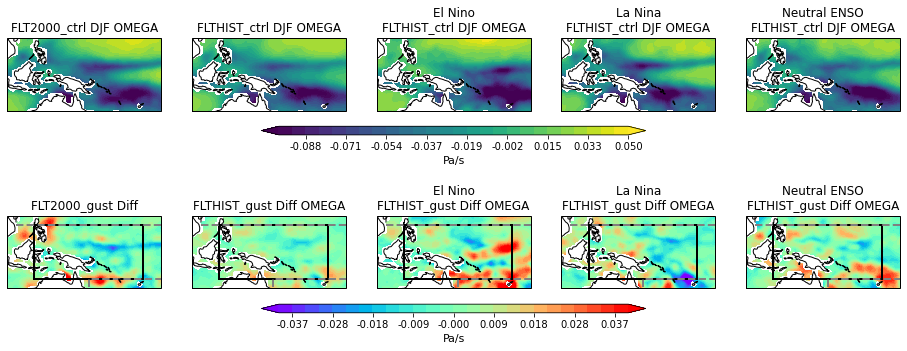

In [348]:
varSel = 'OMEGA'
unitsString = all_h0.OMEGA.units
mult = 1
pStep   = (0.05--0.1)/26
pltLims = np.arange(-0.1, 0.05+pStep, pStep)
dStep = (2*0.04)/26
diffLims = np.arange(-0.04, 0.04+dStep, dStep)

fig,axs = plt.subplots(2,5, figsize=(16,6), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

# - - - - - - - - - - - - - - - - 
## Plot raw values   
## - - - - - - - - - - - - - - - - 
axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=0).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF '+varSel)
axs[0].coastlines()
axs[0].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=3).case.values)+' DJF '+varSel)
axs[1].coastlines()
axs[1].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

c = axs[2].contourf(meanDJF_ElNino.lon.values, meanDJF_ElNino.lat.values, 
                    mult*np.squeeze(meanDJF_ElNino[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('El Nino\n'+str(meanDJF_ElNino.isel(case=3).case.values)+' DJF '+varSel)
axs[2].coastlines()
axs[2].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.3f')
cbar.set_label(unitsString,fontsize=11)


axs[3].contourf(meanDJF_LaNina.lon.values, meanDJF_LaNina.lat.values, 
                mult*np.squeeze(meanDJF_LaNina[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('La Nina\n'+str(meanDJF_LaNina.isel(case=3).case.values)+' DJF '+varSel)
axs[3].coastlines()
axs[3].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[4].contourf(meanDJF_Neutral.lon.values, meanDJF_Neutral.lat.values, 
                mult*np.squeeze(meanDJF_Neutral[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='viridis',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title('Neutral ENSO\n'+str(meanDJF_Neutral.isel(case=3).case.values)+' DJF '+varSel)
axs[4].coastlines()
axs[4].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

# - - - - - - - - - - - - - - - - 
## Plot HET differences   
## - - - - - - - - - - - - - - - - 
axs[5].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=1).sel(lev=500, method='nearest').values - all_h0_DJF[varSel].isel(case=0).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[5].set_title(str(all_h0_DJF.isel(case=1).case.values)+' Diff')
axs[5].coastlines()
axs[5].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

axs[6].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                mult*np.squeeze(all_h0_DJF[varSel].isel(case=4).sel(lev=500, method='nearest').values - all_h0_DJF[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[6].set_title(str(all_h0_DJF.isel(case=4).case.values)+' Diff '+varSel)
axs[6].coastlines()
axs[6].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

c = axs[7].contourf(meanDJF_ElNino.lon.values, meanDJF_ElNino.lat.values, 
                    mult*np.squeeze(meanDJF_ElNino[varSel].isel(case=4).sel(lev=500, method='nearest').values - meanDJF_ElNino[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('El Nino\n'+str(meanDJF_ElNino.isel(case=4).case.values)+' Diff '+varSel)
axs[7].coastlines()
axs[7].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax, format='%.3f')
cbar.set_label(unitsString,fontsize=11)

axs[8].contourf(meanDJF_LaNina.lon.values, meanDJF_LaNina.lat.values, 
                mult*np.squeeze(meanDJF_LaNina[varSel].isel(case=4).sel(lev=500, method='nearest').values - meanDJF_LaNina[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[8].set_title('La Nina\n'+str(meanDJF_LaNina.isel(case=4).case.values)+' Diff '+varSel)
axs[8].coastlines()
axs[8].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())


axs[9].contourf(meanDJF_Neutral.lon.values, meanDJF_Neutral.lat.values, 
                mult*np.squeeze(meanDJF_Neutral[varSel].isel(case=4).sel(lev=500, method='nearest').values - meanDJF_Neutral[varSel].isel(case=3).sel(lev=500, method='nearest').values)*fillOcnFrac_h0_mean, 
                diffLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[9].set_title('Neutral ENSO\n'+str(meanDJF_Neutral.isel(case=4).case.values)+' Diff '+varSel)
axs[9].coastlines()
axs[9].set_extent([38,190,-47,47], crs=ccrs.PlateCarree())

addRegions(axs[5])
addRegions(axs[6])
addRegions(axs[7])
addRegions(axs[8])
addRegions(axs[9])

axs[0].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[1].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[2].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[3].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[4].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() ) 
axs[5].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[6].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[7].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[8].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )
axs[9].set_extent([105,190,-20,20], crs=ccrs.PlateCarree() )


In [20]:
## Handle regridding the CAM data to obs grid
# Get obs grid 
obsDS  = erai_jja
obsGrid = obsDS['LHFLX'].isel(time=0).squeeze()

# Now regrid the data
regrid_h0_JJA   = regrid_data(all_h0_JJA, obsGrid, method=1)
regrid_h0_DJF   = regrid_data(all_h0_DJF, obsGrid, method=1)
regrid_h0_MAM   = regrid_data(all_h0_MAM, obsGrid, method=1)
regrid_h0_SON   = regrid_data(all_h0_SON, obsGrid, method=1)


## Handle regridding the CAM data to obs grid
# Get obs grid 
obsDS  = gpcp_jja
obsGrid = obsDS['PRECT'].isel(time=0).squeeze()

# Now regrid the data
regridGPCP_h0_JJA   = regrid_data(all_h0_JJA, obsGrid, method=1)
regridGPCP_h0_DJF   = regrid_data(all_h0_DJF, obsGrid, method=1)
regridGPCP_h0_MAM   = regrid_data(all_h0_MAM, obsGrid, method=1)
regridGPCP_h0_SON   = regrid_data(all_h0_SON, obsGrid, method=1)


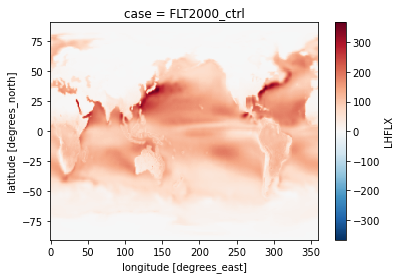

In [21]:
all_h0_DJF.LHFLX.isel(case=0).plot()

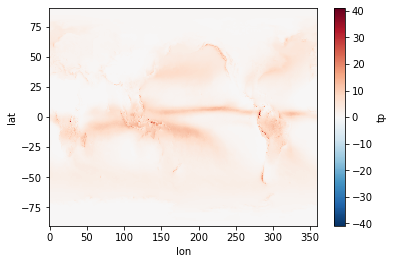

In [125]:
regridERA5_DJF.tp.plot()

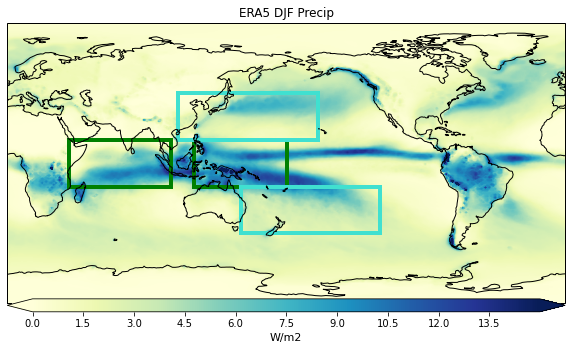

In [132]:
fig,axs = plt.subplots(1,1,figsize=(10,6),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, regridERA5_DJF.tp.values, 
             np.arange(0, 15.0, 0.01), cmap='YlGnBu', extend='both', transform=ccrs.PlateCarree())
axs.set_title('ERA5 DJF Precip')
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)
axs.coastlines()

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

In [58]:
def plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim,
                 iCtrl = 0, iGust=1): 
    
    fig, axs = plt.subplots(3,1, figsize=(10,11), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

    axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=iCtrl)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[0].set_title(str(all_h0_DJF.isel(case=iCtrl).case.values)+' DJF '+varSel)
    axs[0].coastlines()
    axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

    c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=iGust)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[1].set_title(str(all_h0_DJF.isel(case=iGust).case.values)+' DJF '+varSel)
    axs[1].coastlines()
    axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    # cbar.set_label(unitsString,fontsize=11)

    diffs = (mult*np.squeeze(all_h0_DJF.isel(case=iGust)[varSel].values)) - (mult*np.squeeze(all_h0_DJF.isel(case=iCtrl)[varSel].values))

    c = axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffs*fillOcnFrac_h0_mean, 
                    dlim, 
                    cmap='seismic', extend='both',transform=ccrs.PlateCarree())
    axs[2].set_title('GUST-CTRL DJF '+varSel)
    axs[2].coastlines()
    axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[2].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    cbar.set_label(unitsString,fontsize=11)

    fig.subplots_adjust(hspace=0.4)

    
    return axs

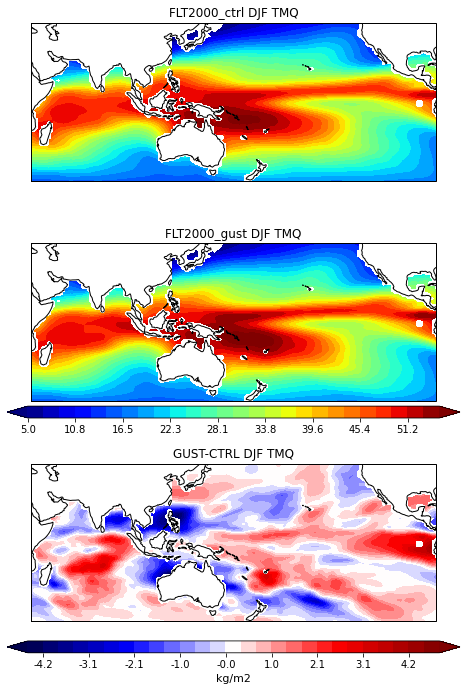

In [69]:
cMax = 55
cMin = 5
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin, cMax+cStep, cStep)

diffMax = 4.5
dStep = (2*diffMax)/26
diffLims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plot_DJFmean('TMQ', all_h0.TMQ.units, 1, 'jet', pltLims, diffLims, 
            iCtrl = 0, iGust=1)


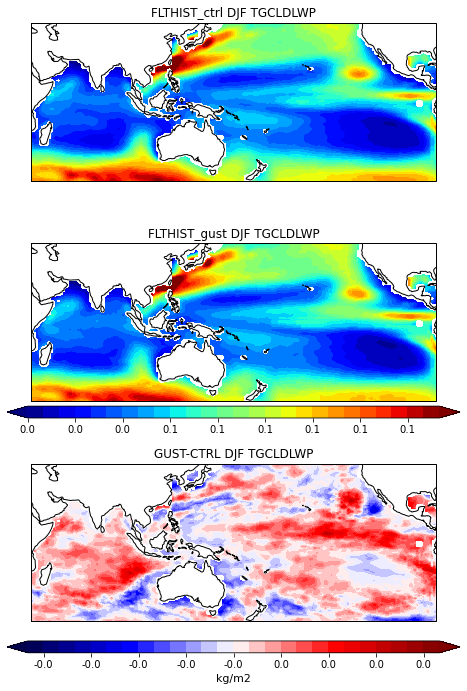

In [73]:
cMax = 0.16
cMin = 0
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin, cMax+cStep, cStep)

diffMax = 0.02
dStep = (2*diffMax)/26
diffLims = np.arange(-diffMax, diffMax+dStep, dStep)

axs = plot_DJFmean('TGCLDLWP', all_h0.TGCLDLWP.units, 1, 'jet', pltLims, diffLims, 
            iCtrl = 3, iGust=4)


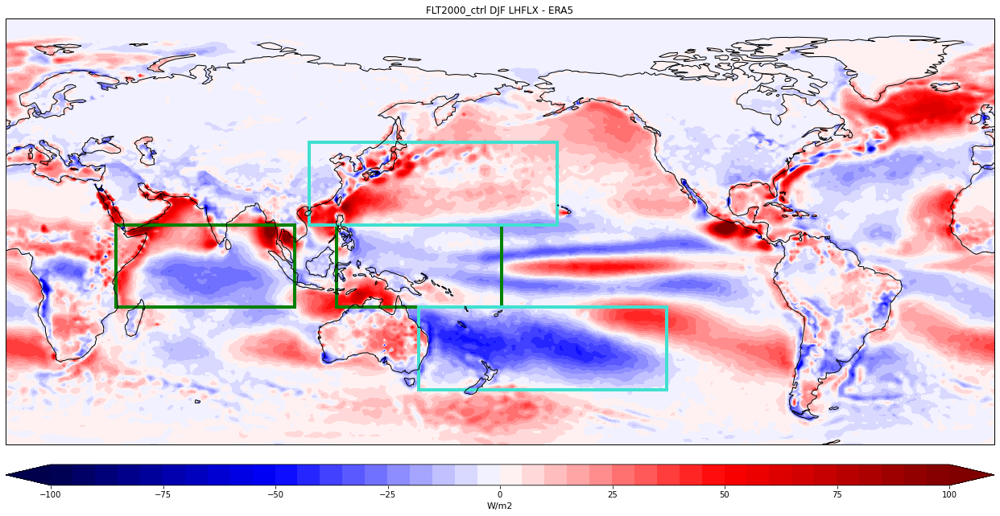

In [65]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=0)
camVar = 'LHFLX'
unitsString = 'W/m2'

obsDS  = regridERA5_DJF
obsVar = 'slhf'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERA-I ---- 
# camDS  = regrid_h0_DJF.isel(case=0)
# camVar = 'LHFLX'
# unitsString = 'W/m2'

# obsDS  = erai_djf
# obsVar = 'LHFLX'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = (camDS[camVar]-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-100, 105, 5)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -15], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


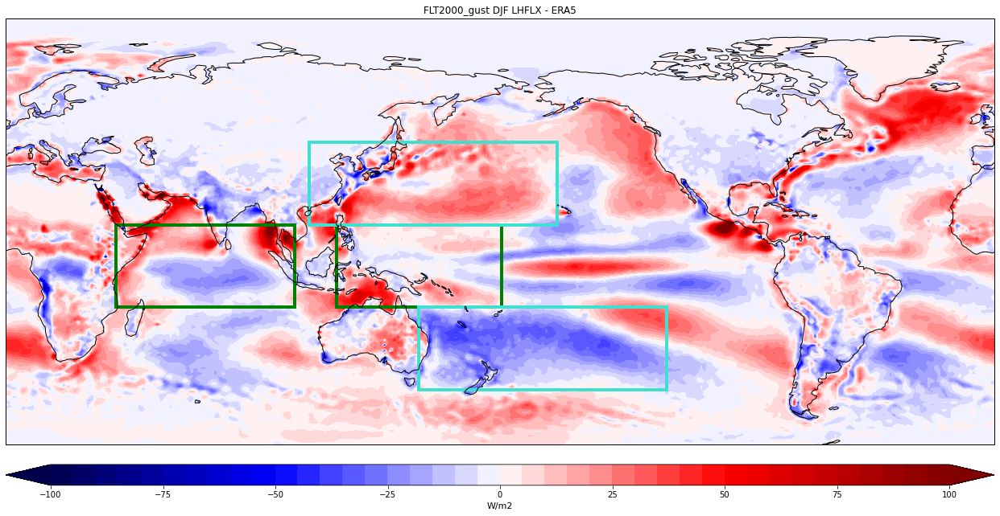

In [66]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=1)
camVar = 'LHFLX'
unitsString = 'W/m2'

obsDS  = regridERA5_DJF
obsVar = 'slhf'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERA-I ---- 
# camDS  = regrid_h0_DJF.isel(case=0)
# camVar = 'LHFLX'
# unitsString = 'W/m2'

# obsDS  = erai_djf
# obsVar = 'LHFLX'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = (camDS[camVar]-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-100, 105, 5)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))



## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -15], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


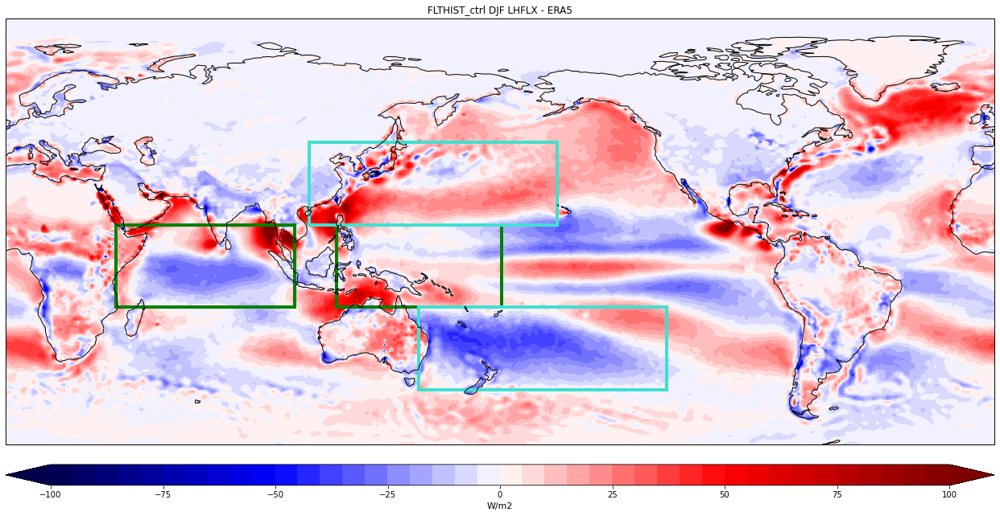

In [67]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=3)
camVar = 'LHFLX'
unitsString = 'W/m2'

obsDS  = regridERA5_DJF
obsVar = 'slhf'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERA-I ---- 
# camDS  = regrid_h0_DJF.isel(case=0)
# camVar = 'LHFLX'
# unitsString = 'W/m2'

# obsDS  = erai_djf
# obsVar = 'LHFLX'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = (camDS[camVar]-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-100, 105, 5)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -15], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


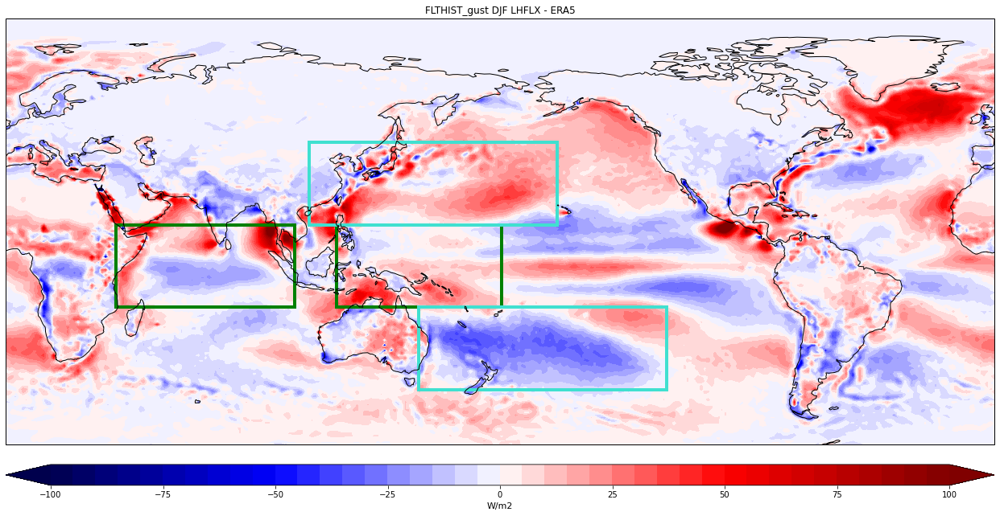

In [68]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=4)
camVar = 'LHFLX'
unitsString = 'W/m2'

obsDS  = regridERA5_DJF
obsVar = 'slhf'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERA-I ---- 
# camDS  = regrid_h0_DJF.isel(case=0)
# camVar = 'LHFLX'
# unitsString = 'W/m2'

# obsDS  = erai_djf
# obsVar = 'LHFLX'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = (camDS[camVar]-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-100, 105, 5)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# JJA
# axs.add_patch(patches.Rectangle(xy=[140, -15], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


**U10 bias plots**

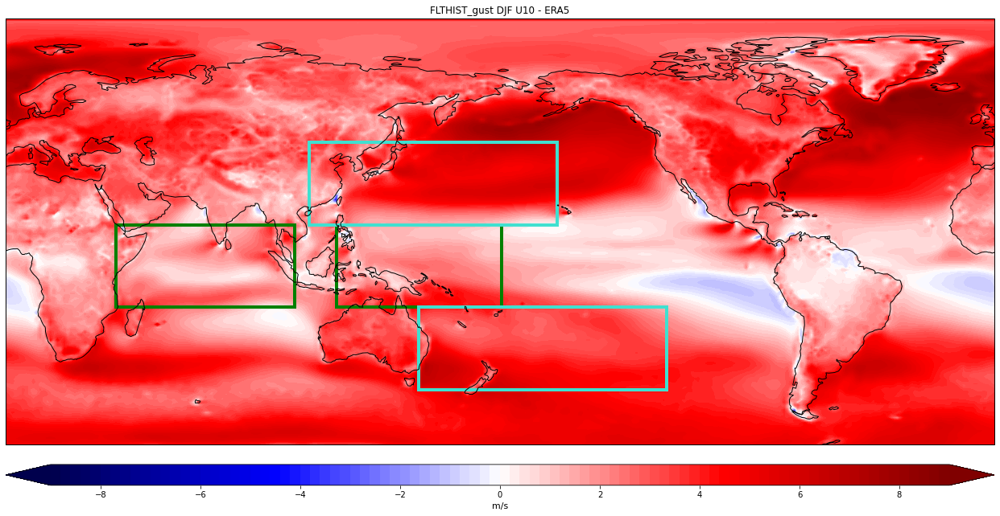

In [93]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=4)
camVar = 'U10'
unitsString = 'm/s'

obsDS  = regridERA5_DJF
obsVar = 'U10'
obsStr = 'ERA5'

seasonStr = ' DJF '

# ## --- Compare to ERAI ---
# camDS  = regrid_h0_DJF.isel(case=0)
# camVar = 'U10'
# unitsString = 'm/s'

# obsDS  = erai_djf
# obsVar = 'WIND_MAG_SURF'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = (camDS[camVar]-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-9, 9.2, 0.2)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -20], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


In [98]:
print(rmse(fillOcnFrac_h0_orig_mean*all_h0_DJF['U10'].isel(case=0), fillOcnFrac_h0_orig_mean*regridERA5_DJF['U10']).values)
print(rmse(fillOcnFrac_h0_orig_mean*all_h0_DJF['U10'].isel(case=1), fillOcnFrac_h0_orig_mean*regridERA5_DJF['U10']).values)

3.752408044087485
3.8952857901533533


**PRECT bias plots**

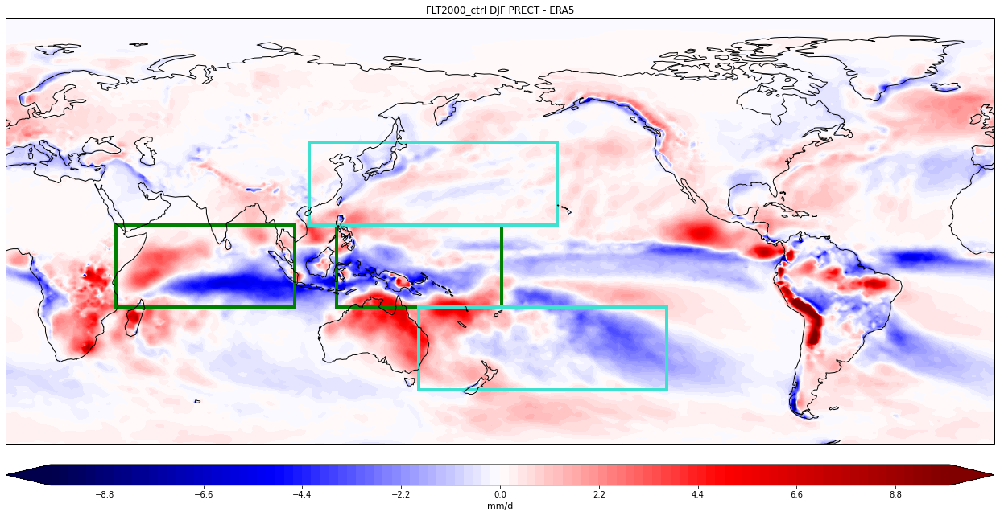

In [72]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=0)
camVar = 'PRECT'
unitsString = 'mm/d'

obsDS  = regridERA5_DJF
obsVar = 'tp'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERAI ---
# camDS  = regrid_h0_DJF.isel(case=3)
# camVar = 'PRECT'
# unitsString = 'mm/d'

# obsDS  = erai_djf
# obsVar = 'PRECT'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = ((86400*1e3*camDS[camVar])-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-10, 10.2, 0.2)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -20], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


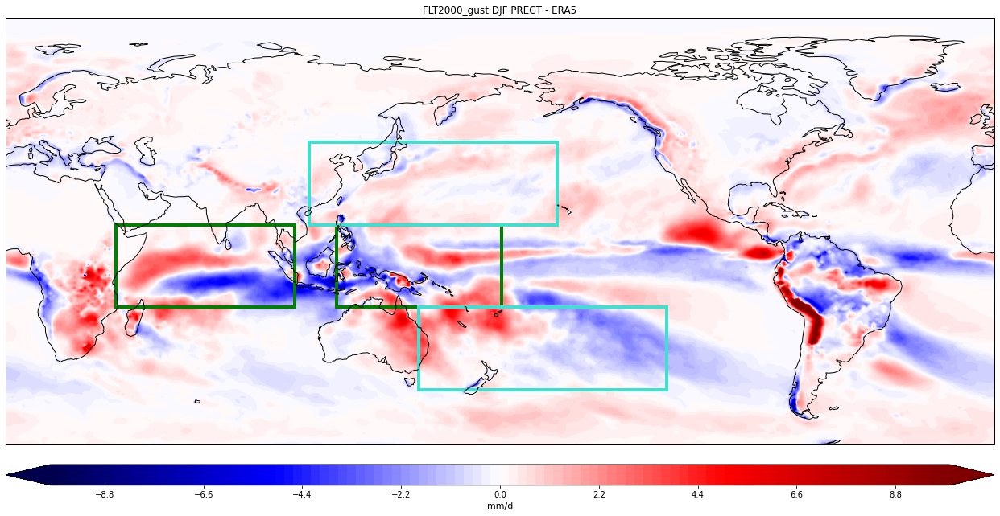

In [71]:
## --- Compare to ERA5 ---
camDS  = all_h0_DJF.isel(case=1)
camVar = 'PRECT'
unitsString = 'mm/d'

obsDS  = regridERA5_DJF
obsVar = 'tp'
obsStr = 'ERA5'

seasonStr = ' DJF '

## --- Compare to ERAI ---
# camDS  = regrid_h0_DJF.isel(case=4)
# camVar = 'PRECT'
# unitsString = 'mm/d'

# obsDS  = erai_djf
# obsVar = 'PRECT'
# obsStr = 'ERAI'

# seasonStr = ' DJF '

diffDS = ((86400*1e3*camDS[camVar])-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-10, 10.2, 0.2)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -20], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


*Prect from GPCP*

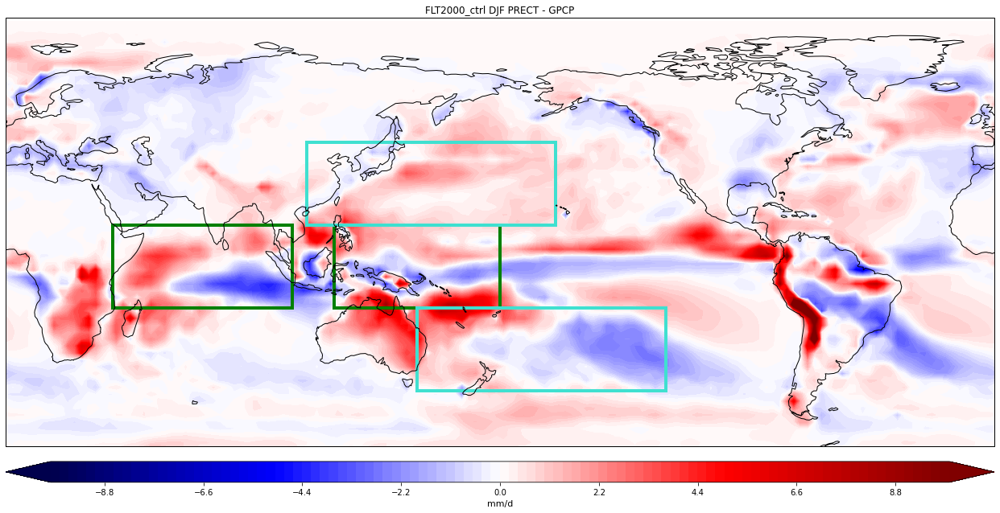

In [ ]:
camDS  = regridGPCP_h0_DJF.isel(case=0)
camVar = 'PRECT'
unitsString = 'mm/d'

obsDS  = gpcp_djf
obsVar = 'PRECT'
obsStr = 'GPCP'

seasonStr = ' DJF '

diffDS = ((86400*1e3*camDS[camVar])-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-10, 10.2, 0.2)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -20], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


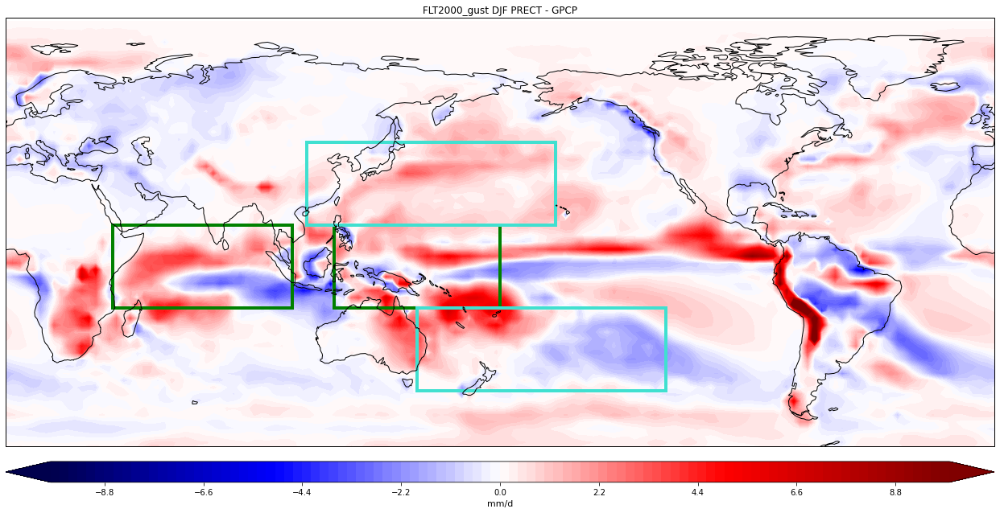

In [208]:
camDS  = regridGPCP_h0_DJF.isel(case=1)
camVar = 'PRECT'
unitsString = 'mm/d'

obsDS  = gpcp_djf
obsVar = 'PRECT'
obsStr = 'GPCP'

seasonStr = ' DJF '

diffDS = ((86400*1e3*camDS[camVar])-np.squeeze(obsDS[obsVar])).load()

## Add cyclic point
wrap_data, wrap_lon = add_cyclic_point(diffDS.values, coord=diffDS['lon'])

lims = np.arange(-10, 10.2, 0.2)

fig,axs = plt.subplots(1,1,figsize=(22,12),subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

c = axs.contourf(wrap_lon, camDS.lat.values, wrap_data, lims, 
            cmap = 'seismic', extend = 'both', transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.03])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

axs.set_title(str(camDS.case.values)+seasonStr+camVar+' - '+obsStr)

axs.coastlines()
axs.set_extent([np.nanmin(diffDS.lon.values),np.nanmax(diffDS.lon.values),
                -65,np.nanmax(diffDS.lat.values)+2], crs=ccrs.PlateCarree())

## DJF
axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                facecolor='none', edgecolor='green',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

# Midlatitude regions? 
axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))
axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                facecolor='none', edgecolor='turquoise',
                                linewidth=4,
                                transform=ccrs.PlateCarree()))

## JJA
# axs.add_patch(patches.Rectangle(xy=[140, -20], width=55, height=35,
#                                 facecolor='none', edgecolor='green',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))
# axs.add_patch(patches.Rectangle(xy=[150, -55], width=55, height=35,
#                                 facecolor='none', edgecolor='magenta',
#                                 linewidth=4,
#                                 transform=ccrs.PlateCarree()))


Okay, how about something smaller, but with more panels. Let's see how much the precip (and biases) vary across obs products too.

In [ ]:
## Monthly precipitation, regridded to the largest common domain [3,4]
# Row 1:   x  ERAI GPCP ERA5 
# Row 2: Ctrl bias bias bias
# Row 3: Gust bias bias bias

## Daily precip biases 
# Row 1:  x   TRMM 
# Row 2: ctrl bias
# Row 3: gust bias

## How do products compare? 

In [41]:
def addRegions(axs):
    ## DJF
    axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,
                                    facecolor='none', edgecolor='green',
                                    linewidth=4,
                                    transform=ccrs.PlateCarree()))

    axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,
                                    facecolor='none', edgecolor='green',
                                    linewidth=4,
                                    transform=ccrs.PlateCarree()))

    # Midlatitude regions? 
    axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,
                                    facecolor='none', edgecolor='turquoise',
                                    linewidth=4,
                                    transform=ccrs.PlateCarree()))
    axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,
                                    facecolor='none', edgecolor='turquoise',
                                    linewidth=4,
                                    transform=ccrs.PlateCarree()))
    
    return 

In [23]:
## Also create ocean-only frac
fillOcnFrac_h0= np.full([5, len(regrid_h0_DJF.lat.values), len(regrid_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:] = regrid_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan

## Get means 
fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]


## GPCP mask
fillOcnFrac_h0_gpcp= np.full([5, len(regridGPCP_h0_DJF.lat.values), len(regridGPCP_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0_gpcp[:,:,:] = regridGPCP_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0_gpcp[np.where(fillOcnFrac_h0_gpcp!=1)] = np.nan

## Get means 
fillOcnFrac_h0_gpcp_mean = fillOcnFrac_h0_gpcp[0,:,:]


## Also create ocean-only frac (original grid)
fillOcnFrac_h0_orig= np.full([5, len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0_orig[:,:,:] = all_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0_orig[np.where(fillOcnFrac_h0_orig!=1)] = np.nan

## Get means 
fillOcnFrac_h0_orig_mean = fillOcnFrac_h0_orig[0,:,:]

NameError: name 'regrid_h0_DJF' is not defined

In [25]:
np.shape(regrid_h0_DJF.OCNFRAC)

(5, 121, 240)

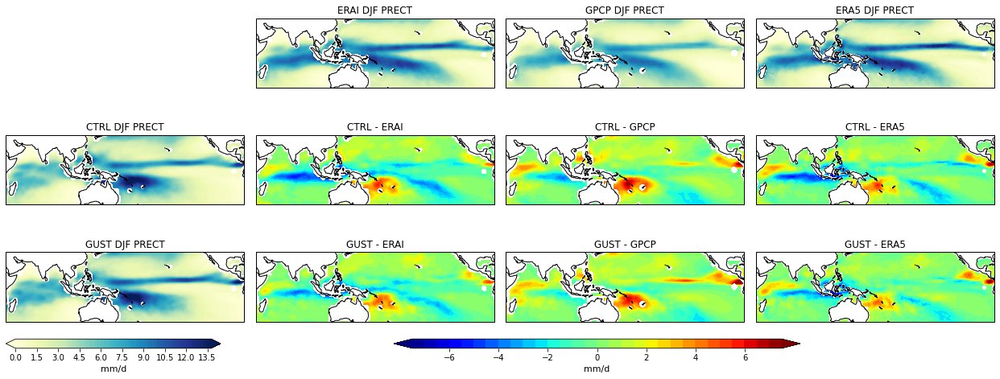

In [41]:
pltLims  = np.arange(0,14, 0.25)
diffLims = np.arange(-7.5,8.0,0.5)
cmap_diffs = 'jet'

ctrlCase = 3
testCase = 4

fig,axs = plt.subplots(3,4, figsize = (22,8), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

fig.delaxes(axs[0])

## - - - - - - - - - - - - - - - - 
## Plot observations 
## - - - - - - - - - - - - - - - - 
# ERAI
axs[1].contourf(erai_djf.lon.values, erai_djf.lat.values, np.squeeze(erai_djf.PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('ERAI DJF PRECT')
axs[1].coastlines()
axs[1].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

# GPCP
axs[2].contourf(gpcp_djf.lon.values, gpcp_djf.lat.values, np.squeeze(gpcp_djf.PRECT.values)*fillOcnFrac_h0_gpcp_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GPCP DJF PRECT')
axs[2].coastlines()
axs[2].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

# ERA5
axs[3].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, np.squeeze(regridERA5_DJF.tp.values)*fillOcnFrac_h0_orig_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('ERA5 DJF PRECT')
axs[3].coastlines()
axs[3].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - 
## Plot CTRL case and biases  
## - - - - - - - - - - - - - - - - 
# CTRL
axs[4].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, 86400*1e3*np.squeeze(regrid_h0_DJF.isel(case=ctrlCase).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title('CTRL DJF PRECT')
axs[4].coastlines()
axs[4].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

biasCtrl_erai = (86400*1e3*np.squeeze(regrid_h0_DJF.isel(case=ctrlCase).PRECT.values))     - np.squeeze(erai_djf.PRECT.values)
biasCtrl_gpcp = (86400*1e3*np.squeeze(regridGPCP_h0_DJF.isel(case=ctrlCase).PRECT.values)) - np.squeeze(gpcp_djf.PRECT.values)
biasCtrl_era5 = (86400*1e3*np.squeeze(all_h0_DJF.isel(case=ctrlCase).PRECT.values))        - np.squeeze(regridERA5_DJF.tp.values)

axs[5].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, biasCtrl_erai*fillOcnFrac_h0_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[5].set_title('CTRL - ERAI')
axs[5].coastlines()
axs[5].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

axs[6].contourf(regridGPCP_h0_DJF.lon.values, regridGPCP_h0_DJF.lat.values, biasCtrl_gpcp*fillOcnFrac_h0_gpcp_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[6].set_title('CTRL - GPCP')
axs[6].coastlines()
axs[6].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

axs[7].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, biasCtrl_era5*fillOcnFrac_h0_orig_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('CTRL - ERA5')
axs[7].coastlines()
axs[7].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - 
## Plot GUST case and biases  
## - - - - - - - - - - - - - - - - 
# Gust
c = axs[8].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, 86400*1e3*np.squeeze(regrid_h0_DJF.isel(case=testCase).PRECT.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[8].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)
axs[8].set_title('GUST DJF PRECT')
axs[8].coastlines()
axs[8].set_extent([40,280,
                  -45,45], crs=ccrs.PlateCarree())

biasGust_erai = (86400*1e3*np.squeeze(regrid_h0_DJF.isel(case=testCase).PRECT.values))     - np.squeeze(erai_djf.PRECT.values)
biasGust_gpcp = (86400*1e3*np.squeeze(regridGPCP_h0_DJF.isel(case=testCase).PRECT.values)) - np.squeeze(gpcp_djf.PRECT.values)
biasGust_era5 = (86400*1e3*np.squeeze(all_h0_DJF.isel(case=testCase).PRECT.values))        - np.squeeze(regridERA5_DJF.tp.values)

axs[9].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, biasGust_erai*fillOcnFrac_h0_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[9].set_title('GUST - ERAI')
axs[9].coastlines()
axs[9].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

c = axs[10].contourf(regridGPCP_h0_DJF.lon.values, regridGPCP_h0_DJF.lat.values, biasGust_gpcp*fillOcnFrac_h0_gpcp_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[10].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.02, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)
axs[10].set_title('GUST - GPCP')
axs[10].coastlines()
axs[10].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

axs[11].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, biasGust_era5*fillOcnFrac_h0_orig_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[11].set_title('GUST - ERA5')
axs[11].coastlines()
# axs[11].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
axs[11].set_extent([40,280,
                  -45,45], crs=ccrs.PlateCarree())

fig.subplots_adjust(hspace=0.005)
fig.subplots_adjust(wspace=0.05)


Can we compare RMSE changes across obs products?

In [72]:
iTimes_trmm_DJF   = np.where( (trmmDS['time.month']==12) | (trmmDS['time.month']<=2) )[0]
trmm_DJF = trmmDS.isel(time=iTimes_trmm_DJF).mean(dim='time')


In [113]:
targetGrid = np.squeeze(gpcp_djf['PRECT'])

regridToObs_erai = regrid_data(erai_djf, targetGrid, method=1)
regridToObs_era5 = regrid_data(regridERA5_DJF, targetGrid, method=1)
regridToObs_trmm = regrid_data(trmm_DJF, targetGrid, method=1)



In [115]:
### DJF regions of interest 
eq_IO_gpcp = get_region(-15,15,40,105, gpcp_djf)
eq_IO_trmm = get_region(-15,15,40,105, regridToObs_trmm)
eq_IO_erai = get_region(-15,15,40,105, regridToObs_erai)
eq_IO_era5 = get_region(-15,15,40,105, regridToObs_era5)
eq_ocn     = get_region(-15,15,40,105, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)


eq_WP_gpcp = get_region(-15,15,120,180, gpcp_djf)
eq_WP_trmm = get_region(-15,15,120,180, regridToObs_trmm)
eq_WP_erai = get_region(-15,15,120,180, regridToObs_erai)
eq_WP_era5 = get_region(-15,15,120,180, regridToObs_era5)
eq_WP_ocn  = get_region(-15,15,120,180, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)

n_WP_gpcp = get_region(15,45,110,200, gpcp_djf)
n_WP_trmm = get_region(15,45,110,200, regridToObs_trmm)
n_WP_erai = get_region(15,45,110,200, regridToObs_erai)
n_WP_era5 = get_region(15,45,110,200, regridToObs_era5)
n_WP_ocn  = get_region(15,45,110,200, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)

s_WP_gpcp = get_region(-45,-15,150,240, gpcp_djf)
s_WP_trmm = get_region(-45,-15,150,240, regridToObs_trmm)
s_WP_erai = get_region(-45,-15,150,240, regridToObs_erai)
s_WP_era5 = get_region(-45,-15,150,240, regridToObs_era5)
s_WP_ocn  = get_region(-45,-15,150,240, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)


## Print table of biases in DJF
print('                 DJF  PRECT (RMSE vs. TRMM)')
print('   Region       GPCP          ERAI           ERA5   ')
print('   ------   -----------    -----------    ----------- ')
print('  Eq. IO  %10.3f %14.3f %14.3f' % (rmse(eq_ocn*eq_IO_gpcp['PRECT'], eq_ocn*eq_IO_trmm['precip']/24), 
                                          rmse(eq_ocn*eq_IO_erai['PRECT'], eq_ocn*eq_IO_trmm['precip']/24), 
                                          rmse(eq_ocn*eq_IO_era5['tp'], eq_ocn*eq_IO_trmm['precip']/24)  ) )

print('  Eq. WP  %10.3f %14.3f %14.3f' % (rmse(eq_WP_ocn*eq_WP_gpcp['PRECT'], eq_WP_ocn*eq_WP_trmm['precip']/24), 
                                          rmse(eq_WP_ocn*eq_WP_erai['PRECT'], eq_WP_ocn*eq_WP_trmm['precip']/24), 
                                          rmse(eq_WP_ocn*eq_WP_era5['tp'], eq_WP_ocn*eq_WP_trmm['precip']/24) ) )

print('  N. WP  %11.3f %14.3f %14.3f' % (rmse(n_WP_ocn*n_WP_gpcp['PRECT'], n_WP_ocn*n_WP_trmm['precip']/24), 
                                         rmse(n_WP_ocn*n_WP_erai['PRECT'], n_WP_ocn*n_WP_trmm['precip']/24), 
                                         rmse(n_WP_ocn*n_WP_era5['tp'], n_WP_ocn*n_WP_trmm['precip']/24) ) )

print('  S. WP  %11.3f %14.3f %14.3f' % (rmse(s_WP_ocn*s_WP_gpcp['PRECT'], s_WP_ocn*s_WP_trmm['precip']/24), 
                                         rmse(s_WP_ocn*s_WP_erai['PRECT'], s_WP_ocn*s_WP_trmm['precip']/24), 
                                         rmse(s_WP_ocn*s_WP_era5['tp'], s_WP_ocn*s_WP_trmm['precip']/24) ) )

print('\n\n')

## Print table of biases in DJF
print('                 DJF  PRECT (RMSE vs. ERA5)')
print('   Region       GPCP          ERAI           trmm   ')
print('   ------   -----------    -----------    ----------- ')
print('  Eq. IO  %10.3f %14.3f %14.3f' % (rmse(eq_ocn*eq_IO_gpcp['PRECT'], eq_ocn*eq_IO_era5['tp']), 
                                          rmse(eq_ocn*eq_IO_erai['PRECT'], eq_ocn*eq_IO_era5['tp']), 
                                          rmse(eq_ocn*eq_IO_trmm['precip']/24, eq_ocn*eq_IO_era5['tp'])  ) )

print('  Eq. WP  %10.3f %14.3f %14.3f' % (rmse(eq_WP_ocn*eq_WP_gpcp['PRECT'], eq_WP_ocn*eq_WP_era5['tp']), 
                                          rmse(eq_WP_ocn*eq_WP_erai['PRECT'], eq_WP_ocn*eq_WP_era5['tp']), 
                                          rmse(eq_WP_ocn*eq_WP_trmm['precip']/24, eq_WP_ocn*eq_WP_era5['tp']) ) )

print('  N. WP  %11.3f %14.3f %14.3f' % (rmse(n_WP_ocn*n_WP_gpcp['PRECT'], n_WP_ocn*n_WP_era5['tp']), 
                                         rmse(n_WP_ocn*n_WP_erai['PRECT'], n_WP_ocn*n_WP_era5['tp']), 
                                         rmse(n_WP_ocn*n_WP_trmm['precip']/24, n_WP_ocn*n_WP_era5['tp']) ) )

print('  S. WP  %11.3f %14.3f %14.3f' % (rmse(s_WP_ocn*s_WP_gpcp['PRECT'], s_WP_ocn*s_WP_era5['tp']), 
                                         rmse(s_WP_ocn*s_WP_erai['PRECT'], s_WP_ocn*s_WP_era5['tp']), 
                                         rmse(s_WP_ocn*s_WP_trmm['precip']/24, s_WP_ocn*s_WP_era5['tp']) ) )

print('\n\n')



                 DJF  PRECT (RMSE vs. TRMM)
   Region       GPCP          ERAI           ERA5   
   ------   -----------    -----------    ----------- 
  Eq. IO       4.719          5.919          5.599
  Eq. WP       4.940          6.013          5.883
  N. WP        2.375          2.672          3.009
  S. WP        2.700          2.613          3.095



                 DJF  PRECT (RMSE vs. ERA5)
   Region       GPCP          ERAI           trmm   
   ------   -----------    -----------    ----------- 
  Eq. IO       1.180          0.752          5.599
  Eq. WP       1.634          0.977          5.883
  N. WP        0.863          0.558          3.009
  S. WP        0.722          0.708          3.095





ValueError: operands could not be broadcast together with shapes (121,240) (192,288) 

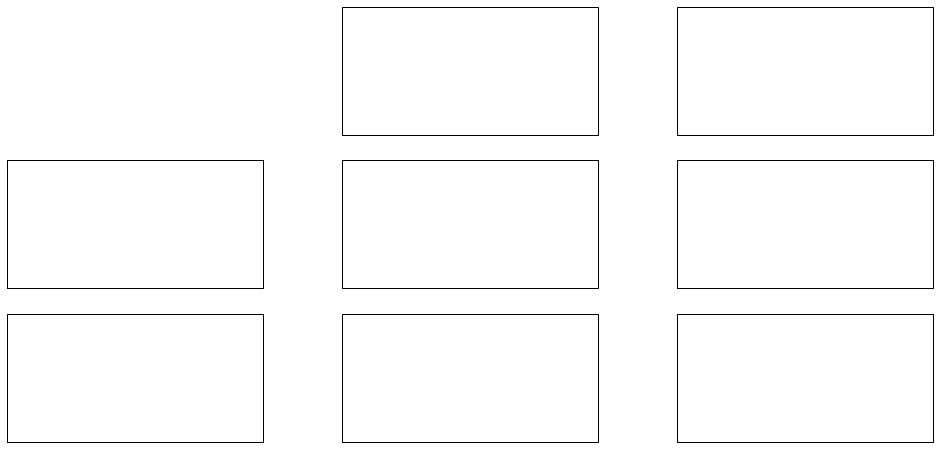

In [38]:
## LHFLX

pltLims  = np.arange(40,280, 10)
diffLims = np.arange(-60,65,5)
cmap_diffs = 'jet'

ctrlCase = 3
testCase = 4

fig,axs = plt.subplots(3,3, figsize = (17,8), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

fig.delaxes(axs[0])

## - - - - - - - - - - - - - - - - 
## Plot observations 
## - - - - - - - - - - - - - - - - 
# ERAI
axs[1].contourf(erai_djf.lon.values, erai_djf.lat.values, np.squeeze(erai_djf.LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('ERAI DJF LHFLX')
axs[1].coastlines()
axs[1].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())

# ERA5
axs[2].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, np.squeeze(regridERA5_DJF.slhf.values)*fillOcnFrac_h0_orig_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('ERA5 DJF LHFLX')
axs[2].coastlines()
axs[2].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - 
## Plot CTRL case and biases  
## - - - - - - - - - - - - - - - - 
# CTRL
axs[3].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, np.squeeze(regrid_h0_DJF.isel(case=ctrlCase).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title(regrid_h0_DJF.isel(case=ctrlCase).case.values+' DJF LHFLX')
axs[3].coastlines()
axs[3].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())

biasCtrl_erai = (np.squeeze(regrid_h0_DJF.isel(case=ctrlCase).LHFLX.values)) - np.squeeze(erai_djf.LHFLX.values)
biasCtrl_era5 = (np.squeeze(all_h0_DJF.isel(case=ctrlCase).LHFLX.values))    - np.squeeze(regridERA5_DJF.slhf.values)

axs[4].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, biasCtrl_erai*fillOcnFrac_h0_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[4].set_title('CTRL - ERAI')
axs[4].coastlines()
axs[4].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())

axs[5].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, biasCtrl_era5*fillOcnFrac_h0_orig_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[5].set_title('CTRL - ERA5')
axs[5].coastlines()
axs[5].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - 
## Plot GUST case and biases  
## - - - - - - - - - - - - - - - - 
# Gust
c = axs[6].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, np.squeeze(regrid_h0_DJF.isel(case=testCase).LHFLX.values)*fillOcnFrac_h0_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[6].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)
axs[6].set_title(regrid_h0_DJF.isel(case=testCase).case.values+' DJF LHFLX')
axs[6].coastlines()
axs[6].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())

biasGust_erai = (np.squeeze(regrid_h0_DJF.isel(case=testCase).LHFLX.values))     - np.squeeze(erai_djf.LHFLX.values)
biasGust_era5 = (np.squeeze(all_h0_DJF.isel(case=testCase).LHFLX.values))        - np.squeeze(regridERA5_DJF.slhf.values)

axs[7].contourf(regrid_h0_DJF.lon.values, regrid_h0_DJF.lat.values, biasGust_erai*fillOcnFrac_h0_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
axs[7].set_title('GUST - ERAI')
axs[7].coastlines()
axs[7].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())

c = axs[8].contourf(regridERA5_DJF.lon.values, regridERA5_DJF.lat.values, biasGust_era5*fillOcnFrac_h0_orig_mean, diffLims, 
                cmap=cmap_diffs,extend='both',transform=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[8].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.02, ax_position.width+0.08, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)
cbar.set_label('mm/d',fontsize=11)
axs[8].set_title('GUST - ERA5')
axs[8].coastlines()
axs[8].set_extent([np.nanmin(erai_djf.lon.values),np.nanmax(erai_djf.lon.values),
                   -65,75], crs=ccrs.PlateCarree())


fig.subplots_adjust(hspace=0.005)
fig.subplots_adjust(wspace=0.05)



*Daily data*


In [24]:
iTimes_DJF = np.where( (all_h1['time.month']==12) | (all_h1['time.month']<=2) )[0]
all_h1_DJF = all_h1.isel(time=iTimes_DJF).mean(dim='time')

iTimes_h0_DJF = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
all_h0_DJF = all_h0.isel(time=iTimes_h0_DJF).mean(dim='time')

iTimes_trmm_DJF   = np.where( (trmmDS['time.month']==12) | (trmmDS['time.month']<=2) )[0]
trmm_DJF = trmmDS.isel(time=iTimes_trmm_DJF).mean(dim='time')

## Regrid from TRMM to CAM 
regrid_trmm_DJF = regrid_data(trmm_DJF, all_h1_DJF['PRECT'], method=1)


In [25]:
# Get ocnFrac grid 
fillOcnFrac_h0_trmm = np.full([5, len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0_trmm[:,:,:] = all_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0_trmm[np.where(fillOcnFrac_h0_trmm!=1)] = np.nan

## Get means 
fillOcnFrac_h0_trmm_mean = fillOcnFrac_h0_trmm[0,:,:]

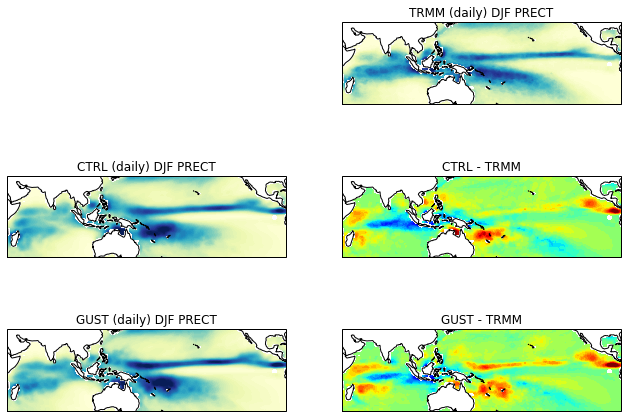

In [42]:
pltLims = np.arange(0,14, 0.25)
diffLims = np.arange(-7.5,8.0,0.5)

fig,axs = plt.subplots(3,2, figsize = (11,8), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

fig.delaxes(axs[0])

## - - - - - - - - - - - - - - - - 
## Plot observations 
## - - - - - - - - - - - - - - - - 
# TRMM
axs[1].contourf(regrid_trmm_DJF.lon.values, regrid_trmm_DJF.lat.values, np.squeeze(regrid_trmm_DJF.precip.values)*fillOcnFrac_h0_trmm_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title('TRMM (daily) DJF PRECT')
axs[1].coastlines()
axs[1].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - 
## Plot CTRL case and biases  
## - - - - - - - - - - - - - - - - 
# CTRL
axs[2].contourf(all_h1_DJF.lon.values, all_h1_DJF.lat.values, 86400*1e3*np.squeeze(all_h1_DJF.isel(case=0).PRECT.values)*fillOcnFrac_h0_trmm_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('CTRL (daily) DJF PRECT')
axs[2].coastlines()
axs[2].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

biasCtrl_trmm = (86400*1e3*np.squeeze(all_h1_DJF.isel(case=0).PRECT.values)) - np.squeeze(regrid_trmm_DJF.precip.values)

axs[3].contourf(all_h1_DJF.lon.values, all_h1_DJF.lat.values, biasCtrl_trmm*fillOcnFrac_h0_trmm_mean, diffLims, 
                cmap='jet',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('CTRL - TRMM')
axs[3].coastlines()
axs[3].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - 
## Plot GUST case and biases  
## - - - - - - - - - - - - - - - - 
# GUST
axs[4].contourf(all_h1_DJF.lon.values, all_h1_DJF.lat.values, 86400*1e3*np.squeeze(all_h1_DJF.isel(case=1).PRECT.values)*fillOcnFrac_h0_trmm_mean, pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[4].set_title('GUST (daily) DJF PRECT')
axs[4].coastlines()
axs[4].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())

biasCtrl_trmm = (86400*1e3*np.squeeze(all_h1_DJF.isel(case=1).PRECT.values)) - np.squeeze(regrid_trmm_DJF.precip.values)

axs[5].contourf(all_h1_DJF.lon.values, all_h1_DJF.lat.values, biasCtrl_trmm*fillOcnFrac_h0_trmm_mean, diffLims, 
                cmap='jet',extend='both',transform=ccrs.PlateCarree())
axs[5].set_title('GUST - TRMM')
axs[5].coastlines()
# axs[5].set_extent([np.nanmin(all_h1_DJF.lon.values),np.nanmax(all_h1_DJF.lon.values),
#                    -65,75], crs=ccrs.PlateCarree())
axs[5].set_extent([40,280,
                   -45,45], crs=ccrs.PlateCarree())


In [26]:
### DJF regions of interest 
eq_IO      = get_region(-15,15,40,105, all_h1_DJF)
eq_IO_trmm = get_region(-15,15,40,105, regrid_trmm_DJF)
eq_ocn     = get_region(-15,15,40,105, all_h1_DJF, fillOcnFrac_h0_trmm_mean, True)


eq_WP      = get_region(-15,15,120,180, all_h1_DJF)
eq_WP_trmm = get_region(-15,15,120,180, regrid_trmm_DJF)
eq_WP_ocn  = get_region(-15,15,120,180, all_h1_DJF, fillOcnFrac_h0_trmm_mean, True)

n_WP      = get_region(15,45,110,200, all_h1_DJF)
n_WP_trmm = get_region(15,45,110,200, regrid_trmm_DJF)
n_WP_ocn  = get_region(15,45,110,200, all_h1_DJF, fillOcnFrac_h0_trmm_mean, True)

s_WP      = get_region(-45,-15,150,240, all_h1_DJF)
s_WP_trmm = get_region(-45,-15,150,240, regrid_trmm_DJF)
s_WP_ocn  = get_region(-45,-15,150,240, all_h1_DJF, fillOcnFrac_h0_trmm_mean, True)


## Print table of biases in DJF
print('                 DJF  PRECT (RMSE vs. TRMM)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=0), eq_ocn*eq_IO_trmm['precip']), rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=1), eq_ocn*eq_IO_trmm['precip']), 
                                                 rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=3), eq_ocn*eq_IO_trmm['precip']), rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=4), eq_ocn*eq_IO_trmm['precip']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_trmm['precip']), rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_trmm['precip']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_trmm['precip']), rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_trmm['precip']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=0), n_WP_ocn*n_WP_trmm['precip']), rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=1), n_WP_ocn*n_WP_trmm['precip']), 
                                                rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=3), n_WP_ocn*n_WP_trmm['precip']), rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=4), n_WP_ocn*n_WP_trmm['precip']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=0), s_WP_ocn*s_WP_trmm['precip']), rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=1), s_WP_ocn*s_WP_trmm['precip']), 
                                                rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=3), s_WP_ocn*s_WP_trmm['precip']), rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=4), s_WP_ocn*s_WP_trmm['precip']) ) )

print('\n\n')


                 DJF  PRECT (RMSE vs. TRMM)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------


KeyboardInterrupt: 

**How can we hone in on the links between LHFLX and low U10?**

In [ ]:
## Step 1: Should probably use some daily data. So let's suck it up and do that to start with. 




**RMSE (regional)**

In [27]:
## Also create ocean-only frac
fillOcnFrac_h0= np.full([5, len(regrid_h0_DJF.lat.values), len(regrid_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:] = regrid_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan

## Get means 
fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]

NameError: name 'regrid_h0_DJF' is not defined

In [46]:
# ## Also create ocean-only frac (original grid)
# fillOcnFrac_h0_orig= np.full([5, len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
# fillOcnFrac_h0_orig[:,:,:] = all_h0_DJF.OCNFRAC.isel(case=0)
# fillOcnFrac_h0_orig[np.where(fillOcnFrac_h0_orig!=1)] = np.nan

# ## Get means 
# fillOcnFrac_h0_orig_mean = fillOcnFrac_h0_orig[0,:,:]

In [48]:
## Regrid everything to a common ~2degree grid - GPCP's? 
targetGrid = np.squeeze(gpcp_djf['PRECT'])

regridToObs_erai = regrid_data(erai_djf,        targetGrid, method=1)
regridToObs_era5 = regrid_data(regridERA5_DJF,  targetGrid, method=1)
regridToObs_trmm = regrid_data(regrid_trmm_DJF, targetGrid, method=1)
regridToObs_h0   = regrid_data(all_h0_DJF,      targetGrid, method=1)

regridToObs_gpcp = gpcp_djf


In [57]:
### DJF regions of interest 
eq_IO_h0   = get_region(-15,15,40,105, regridToObs_h0)
eq_IO_erai = get_region(-15,15,40,105, regridToObs_erai)
eq_IO_era5 = get_region(-15,15,40,105, regridToObs_era5)
eq_IO_trmm = get_region(-15,15,40,105, regridToObs_trmm)
eq_IO_gpcp = get_region(-15,15,40,105, regridToObs_gpcp)
eq_IO_ocn  = get_region(-15,15,40,105, regridToObs_h0, fillOcnFrac_h0_gpcp_mean, True)

eq_WP_h0   = get_region(-15,15,120,180, regridToObs_h0)
eq_WP_erai = get_region(-15,15,120,180, regridToObs_erai)
eq_WP_era5 = get_region(-15,15,120,180, regridToObs_era5)
eq_WP_trmm = get_region(-15,15,120,180, regridToObs_trmm)
eq_WP_gpcp = get_region(-15,15,120,180, regridToObs_gpcp)
eq_WP_ocn  = get_region(-15,15,120,180, regridToObs_h0, fillOcnFrac_h0_gpcp_mean, True)

n_WP_h0   = get_region(15,45,110,200, regridToObs_h0)
n_WP_erai = get_region(15,45,110,200, regridToObs_erai)
n_WP_era5 = get_region(15,45,110,200, regridToObs_era5)
n_WP_trmm = get_region(15,45,110,200, regridToObs_trmm)
n_WP_gpcp = get_region(15,45,110,200, regridToObs_gpcp)
n_WP_ocn  = get_region(15,45,110,200, regridToObs_h0, fillOcnFrac_h0_gpcp_mean, True)

s_WP_h0   = get_region(-45,-15,150,240, regridToObs_h0)
s_WP_erai = get_region(-45,-15,150,240, regridToObs_erai)
s_WP_era5 = get_region(-45,-15,150,240, regridToObs_era5)
s_WP_trmm = get_region(-45,-15,150,240, regridToObs_trmm)
s_WP_gpcp = get_region(-45,-15,150,240, regridToObs_gpcp)
s_WP_ocn  = get_region(-45,-15,150,240, regridToObs_h0, fillOcnFrac_h0_gpcp_mean, True)



In [63]:
## Print table of biases in DJF
# print('                 DJF  PRECT RMSE (Eq. IO)')
# print('    Obs    CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
# print('   ------   -----------    -----------    -----------    -----------')
# print('    TRMM  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=0), eq_IO_ocn*eq_IO_trmm['precip']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=1), eq_IO_ocn*eq_IO_trmm['precip']), 
#                                                  rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=3), eq_IO_ocn*eq_IO_trmm['precip']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=4), eq_IO_ocn*eq_IO_trmm['precip']) ) )

# print('    ERA5  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=0), eq_IO_ocn*eq_IO_era5['tp']),    rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=1), eq_IO_ocn*eq_IO_era5['tp']), 
#                                                  rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=3), eq_IO_ocn*eq_IO_era5['tp']),    rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=4), eq_IO_ocn*eq_IO_era5['tp']) ) )

# print('    ERAI  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=0), eq_IO_ocn*eq_IO_erai['PRECT']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=1), eq_IO_ocn*eq_IO_erai['PRECT']), 
#                                                  rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=3), eq_IO_ocn*eq_IO_erai['PRECT']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=4), eq_IO_ocn*eq_IO_erai['PRECT']) ) )

# print('    GPCP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=0), eq_IO_ocn*eq_IO_gpcp['PRECT']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=1), eq_IO_ocn*eq_IO_gpcp['PRECT']), 
#                                                  rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=3), eq_IO_ocn*eq_IO_gpcp['PRECT']), rmse(86400*1e3*eq_IO_ocn*eq_IO_h0['PRECT'].isel(case=4), eq_IO_ocn*eq_IO_gpcp['PRECT']) ) )
# print('\n\n')

print('                 DJF  PRECT RMSE (Eq. WP)')
print('    Obs    CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('    TRMM  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_trmm['precip']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_trmm['precip']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_trmm['precip']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_trmm['precip']) ) )

print('    ERA5  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_era5['tp']),    rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_era5['tp']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_era5['tp']),    rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_era5['tp']) ) )

print('    ERAI  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_erai['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_erai['PRECT']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_erai['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_erai['PRECT']) ) )

print('    GPCP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_gpcp['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_gpcp['PRECT']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_gpcp['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP_h0['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_gpcp['PRECT']) ) )

print('\n\n')


                 DJF  PRECT RMSE (Eq. WP)
    Obs    CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
    TRMM       1.889          1.922          1.774          1.617
    ERA5       1.694          1.620          1.603          1.468
    ERAI       2.173          2.021          2.080          1.955
    GPCP       2.231          2.343          2.158          2.048





In [18]:
rmse?

Signature: rmse(predictions, targets)
Docstring: <no docstring>
File:      ~/Analysis/Gusts/<ipython-input-2-1f9e83a7890f>
Type:      function


In [80]:
### DJF regions of interest 
eq_IO      = get_region(-15,15,40,105, regrid_h0_DJF)
eq_IO_orig = get_region(-15,15,40,105, all_h0_DJF)
eq_IO_erai = get_region(-15,15,40,105, erai_djf)
eq_IO_era5 = get_region(-15,15,40,105, regridERA5_DJF)
eq_ocn     = get_region(-15,15,40,105, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_ocn_orig= get_region(-15,15,40,105, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

eq_WP      = get_region(-15,15,120,180, regrid_h0_DJF)
eq_WP_orig = get_region(-15,15,120,180, all_h0_DJF)
eq_WP_erai = get_region(-15,15,120,180, erai_djf)
eq_WP_era5 = get_region(-15,15,120,180, regridERA5_DJF)
eq_WP_ocn  = get_region(-15,15,120,180, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_WP_ocn_orig = get_region(-15,15,120,180, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

n_WP      = get_region(15,45,110,200, regrid_h0_DJF)
n_WP_orig = get_region(15,45,110,200, all_h0_DJF)
n_WP_erai = get_region(15,45,110,200, erai_djf)
n_WP_era5 = get_region(15,45,110,200, regridERA5_DJF)
n_WP_ocn  = get_region(15,45,110,200, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
n_WP_ocn_orig = get_region(15,45,110,200, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

s_WP      = get_region(-45,-15,150,240, regrid_h0_DJF)
s_WP_orig = get_region(-45,-15,150,240, all_h0_DJF)
s_WP_erai = get_region(-45,-15,150,240, erai_djf)
s_WP_era5 = get_region(-45,-15,150,240, regridERA5_DJF)
s_WP_ocn = get_region(-45,-15,150,240, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
s_WP_ocn_orig = get_region(-45,-15,150,240, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)


## Print table of biases in DJF
print('                 DJF Latent Heat Flux (RMSE vs. ERA-I)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_ocn*eq_IO['LHFLX'].isel(case=0), eq_ocn*eq_IO_erai['LHFLX']), rmse(eq_ocn*eq_IO['LHFLX'].isel(case=1), eq_ocn*eq_IO_erai['LHFLX']), 
                                                 rmse(eq_ocn*eq_IO['LHFLX'].isel(case=3), eq_ocn*eq_IO_erai['LHFLX']), rmse(eq_ocn*eq_IO['LHFLX'].isel(case=4), eq_ocn*eq_IO_erai['LHFLX']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_WP_ocn*eq_WP['LHFLX'].isel(case=0), eq_WP_ocn*eq_WP_erai['LHFLX']), rmse(eq_WP_ocn*eq_WP['LHFLX'].isel(case=1), eq_WP_ocn*eq_WP_erai['LHFLX']), 
                                                 rmse(eq_WP_ocn*eq_WP['LHFLX'].isel(case=3), eq_WP_ocn*eq_WP_erai['LHFLX']), rmse(eq_WP_ocn*eq_WP['LHFLX'].isel(case=4), eq_WP_ocn*eq_WP_erai['LHFLX']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(n_WP_ocn*n_WP['LHFLX'].isel(case=0), n_WP_ocn*n_WP_erai['LHFLX']), rmse(n_WP_ocn*n_WP['LHFLX'].isel(case=1), n_WP_ocn*n_WP_erai['LHFLX']), 
                                                rmse(n_WP_ocn*n_WP['LHFLX'].isel(case=3), n_WP_ocn*n_WP_erai['LHFLX']), rmse(n_WP_ocn*n_WP['LHFLX'].isel(case=4), n_WP_ocn*n_WP_erai['LHFLX']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(s_WP_ocn*s_WP['LHFLX'].isel(case=0), s_WP_ocn*s_WP_erai['LHFLX']), rmse(s_WP_ocn*s_WP['LHFLX'].isel(case=1), s_WP_ocn*s_WP_erai['LHFLX']), 
                                                rmse(s_WP_ocn*s_WP['LHFLX'].isel(case=3), s_WP_ocn*s_WP_erai['LHFLX']), rmse(s_WP_ocn*s_WP['LHFLX'].isel(case=4), s_WP_ocn*s_WP_erai['LHFLX']) ) )

print('\n\n')
## Print table of biases in DJF
print('                 DJF Latent Heat Flux (RMSE vs. ERA5)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_ocn_orig*eq_IO_orig['LHFLX'].isel(case=0), eq_ocn_orig*eq_IO_era5['slhf']), rmse(eq_ocn_orig*eq_IO_orig['LHFLX'].isel(case=1), eq_ocn_orig*eq_IO_era5['slhf']), 
                                                 rmse(eq_ocn_orig*eq_IO_orig['LHFLX'].isel(case=3), eq_ocn_orig*eq_IO_era5['slhf']), rmse(eq_ocn_orig*eq_IO_orig['LHFLX'].isel(case=4), eq_ocn_orig*eq_IO_era5['slhf']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_WP_ocn_orig*eq_WP_orig['LHFLX'].isel(case=0), eq_WP_ocn_orig*eq_WP_era5['slhf']), rmse(eq_WP_ocn_orig*eq_WP_orig['LHFLX'].isel(case=1), eq_WP_ocn_orig*eq_WP_era5['slhf']), 
                                                 rmse(eq_WP_ocn_orig*eq_WP_orig['LHFLX'].isel(case=3), eq_WP_ocn_orig*eq_WP_era5['slhf']), rmse(eq_WP_ocn_orig*eq_WP_orig['LHFLX'].isel(case=4), eq_WP_ocn_orig*eq_WP_era5['slhf']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(n_WP_ocn_orig*n_WP_orig['LHFLX'].isel(case=0), n_WP_ocn_orig*n_WP_era5['slhf']), rmse(n_WP_ocn_orig*n_WP_orig['LHFLX'].isel(case=1), n_WP_ocn_orig*n_WP_era5['slhf']), 
                                                rmse(n_WP_ocn_orig*n_WP_orig['LHFLX'].isel(case=3), n_WP_ocn_orig*n_WP_era5['slhf']), rmse(n_WP_ocn_orig*n_WP_orig['LHFLX'].isel(case=4), n_WP_ocn_orig*n_WP_era5['slhf']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(s_WP_ocn_orig*s_WP_orig['LHFLX'].isel(case=0), s_WP_ocn_orig*s_WP_era5['slhf']), rmse(s_WP_ocn_orig*s_WP_orig['LHFLX'].isel(case=1), s_WP_ocn_orig*s_WP_era5['slhf']), 
                                                rmse(s_WP_ocn_orig*s_WP_orig['LHFLX'].isel(case=3), s_WP_ocn_orig*s_WP_era5['slhf']), rmse(s_WP_ocn_orig*s_WP_orig['LHFLX'].isel(case=4), s_WP_ocn_orig*s_WP_era5['slhf']) ) )



                 DJF Latent Heat Flux (RMSE vs. ERA-I)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO      25.210         20.035         23.482         18.912
  Eq. WP      16.572         13.211         12.920         11.129
  N. WP       21.753         21.962         23.656         21.837
  S. WP       22.901         17.660         17.821         15.237



                 DJF Latent Heat Flux (RMSE vs. ERA5)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO      27.648         22.522         26.106         21.760
  Eq. WP      16.561         14.846         16.039         14.562
  N. WP       19.423         19.791         21.639         19.817
  S. WP       26.640         21.178         21.264         18.857


<br>**Sanity checking some of the RMSE stuff** <br>
The values don't *exacly* match what's in the AMWG. 
<br> Partly could be due to inclusion of year 9, which AMWG can't include (DJF overlaps into next year). 
<br> Maybe the regridding is different? 

In [123]:
rmse(86400*1e3*regrid_h0_DJF['PRECT'].isel(case=0).load(), erai_djf['PRECT'])

<xarray.DataArray 'PRECT' ()>
array(1.15985767)
Coordinates:
    case     <U12 'FLT2000_ctrl'

In [124]:
rmse(86400*1e3*regrid_h0_DJF['PRECT'].isel(case=1).load(), erai_djf['PRECT'])

<xarray.DataArray 'PRECT' ()>
array(1.06273219)
Coordinates:
    case     <U12 'FLT2000_gust'

In [125]:
(1.06-1.16)/1.16

-0.08620689655172403

In [126]:
(1.32-1.41)/1.41

-0.06382978723404245

<br>
**End of sanity checking section**
<br>
<br>

In [106]:
### DJF regions of interest 
eq_IO      = get_region(-15,15,40,105, regrid_h0_DJF)
eq_IO_gpcp = get_region(-15,15,40,105, regridGPCP_h0_DJF)
eq_IO_orig = get_region(-15,15,40,105, all_h0_DJF)
eq_IO_erai = get_region(-15,15,40,105, erai_djf)
eq_IO_gpcpObs = get_region(-15,15,40,105, gpcp_djf)
eq_IO_era5 = get_region(-15,15,40,105, regridERA5_DJF)
eq_ocn     = get_region(-15,15,40,105, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_ocn_gpcp= get_region(-15,15,40,105, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)
eq_ocn_orig= get_region(-15,15,40,105, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

eq_WP      = get_region(-15,15,120,180, regrid_h0_DJF)
eq_WP_gpcp = get_region(-15,15,120,180, regridGPCP_h0_DJF)
eq_WP_orig = get_region(-15,15,120,180, all_h0_DJF)
eq_WP_erai = get_region(-15,15,120,180, erai_djf)
eq_WP_gpcpObs = get_region(-15,15,120,180, gpcp_djf)
eq_WP_era5 = get_region(-15,15,120,180, regridERA5_DJF)
eq_WP_ocn  = get_region(-15,15,120,180, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_WP_ocn_gpcp = get_region(-15,15,120,180, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)
eq_WP_ocn_orig = get_region(-15,15,120,180, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

n_WP      = get_region(15,45,110,200, regrid_h0_DJF)
n_WP_gpcp = get_region(15,45,110,200, regridGPCP_h0_DJF)
n_WP_orig = get_region(15,45,110,200, all_h0_DJF)
n_WP_erai = get_region(15,45,110,200, erai_djf)
n_WP_gpcpObs = get_region(15,45,110,200, gpcp_djf)
n_WP_era5 = get_region(15,45,110,200, regridERA5_DJF)
n_WP_ocn  = get_region(15,45,110,200, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
n_WP_ocn_gpcp = get_region(15,45,110,200, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)
n_WP_ocn_orig = get_region(15,45,110,200, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

s_WP      = get_region(-45,-15,150,240, regrid_h0_DJF)
s_WP_gpcp = get_region(-45,-15,150,240, regridGPCP_h0_DJF)
s_WP_orig = get_region(-45,-15,150,240, all_h0_DJF)
s_WP_erai = get_region(-45,-15,150,240, erai_djf)
s_WP_gpcpObs = get_region(-45,-15,150,240, gpcp_djf)
s_WP_era5 = get_region(-45,-15,150,240, regridERA5_DJF)
s_WP_ocn = get_region(-45,-15,150,240, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
s_WP_ocn_gpcp  = get_region(-45,-15,150,240, regridGPCP_h0_DJF, fillOcnFrac_h0_gpcp_mean, True)
s_WP_ocn_orig = get_region(-45,-15,150,240, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)


## Print table of biases in DJF
print('                 DJF PRECT (RMSE vs. ERA-I)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=0), eq_ocn*eq_IO_erai['PRECT']), rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=1), eq_ocn*eq_IO_erai['PRECT']), 
                                                 rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=3), eq_ocn*eq_IO_erai['PRECT']), rmse(86400*1e3*eq_ocn*eq_IO['PRECT'].isel(case=4), eq_ocn*eq_IO_erai['PRECT']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=0), eq_WP_ocn*eq_WP_erai['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=1), eq_WP_ocn*eq_WP_erai['PRECT']), 
                                                 rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=3), eq_WP_ocn*eq_WP_erai['PRECT']), rmse(86400*1e3*eq_WP_ocn*eq_WP['PRECT'].isel(case=4), eq_WP_ocn*eq_WP_erai['PRECT']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=0), n_WP_ocn*n_WP_erai['PRECT']), rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=1), n_WP_ocn*n_WP_erai['PRECT']), 
                                                rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=3), n_WP_ocn*n_WP_erai['PRECT']), rmse(86400*1e3*n_WP_ocn*n_WP['PRECT'].isel(case=4), n_WP_ocn*n_WP_erai['PRECT']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=0), s_WP_ocn*s_WP_erai['PRECT']), rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=1), s_WP_ocn*s_WP_erai['PRECT']), 
                                                rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=3), s_WP_ocn*s_WP_erai['PRECT']), rmse(86400*1e3*s_WP_ocn*s_WP['PRECT'].isel(case=4), s_WP_ocn*s_WP_erai['PRECT']) ) )

print('\n\n')
## Print table of biases in DJF
print('                 DJF PRECT (RMSE vs. GPCP)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_ocn_gpcp*eq_IO_gpcp['PRECT'].isel(case=0), eq_ocn_gpcp*eq_IO_gpcpObs['PRECT']), rmse(86400*1e3*eq_ocn_gpcp*eq_IO_gpcp['PRECT'].isel(case=1), eq_ocn_gpcp*eq_IO_gpcpObs['PRECT']), 
                                                 rmse(86400*1e3*eq_ocn_gpcp*eq_IO_gpcp['PRECT'].isel(case=3), eq_ocn_gpcp*eq_IO_gpcpObs['PRECT']), rmse(86400*1e3*eq_ocn_gpcp*eq_IO_gpcp['PRECT'].isel(case=4), eq_ocn_gpcp*eq_IO_gpcpObs['PRECT']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn_gpcp*eq_WP_gpcp['PRECT'].isel(case=0), eq_WP_ocn_gpcp*eq_WP_gpcpObs['PRECT']), rmse(86400*1e3*eq_WP_ocn_gpcp*eq_WP_gpcp['PRECT'].isel(case=1), eq_WP_ocn_gpcp*eq_WP_gpcpObs['PRECT']), 
                                                 rmse(86400*1e3*eq_WP_ocn_gpcp*eq_WP_gpcp['PRECT'].isel(case=3), eq_WP_ocn_gpcp*eq_WP_gpcpObs['PRECT']), rmse(86400*1e3*eq_WP_ocn_gpcp*eq_WP_gpcp['PRECT'].isel(case=4), eq_WP_ocn_gpcp*eq_WP_gpcpObs['PRECT']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*n_WP_ocn_gpcp*n_WP_gpcp['PRECT'].isel(case=0), n_WP_ocn_gpcp*n_WP_gpcpObs['PRECT']), rmse(86400*1e3*n_WP_ocn_gpcp*n_WP_gpcp['PRECT'].isel(case=1), n_WP_ocn_gpcp*n_WP_gpcpObs['PRECT']), 
                                                rmse(86400*1e3*n_WP_ocn_gpcp*n_WP_gpcp['PRECT'].isel(case=3), n_WP_ocn_gpcp*n_WP_gpcpObs['PRECT']), rmse(86400*1e3*n_WP_ocn_gpcp*n_WP_gpcp['PRECT'].isel(case=4), n_WP_ocn_gpcp*n_WP_gpcpObs['PRECT']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*s_WP_ocn_gpcp*s_WP_gpcp['PRECT'].isel(case=0), s_WP_ocn_gpcp*s_WP_gpcpObs['PRECT']), rmse(86400*1e3*s_WP_ocn_gpcp*s_WP_gpcp['PRECT'].isel(case=1), s_WP_ocn_gpcp*s_WP_gpcpObs['PRECT']), 
                                                rmse(86400*1e3*s_WP_ocn_gpcp*s_WP_gpcp['PRECT'].isel(case=3), s_WP_ocn_gpcp*s_WP_gpcpObs['PRECT']), rmse(86400*1e3*s_WP_ocn_gpcp*s_WP_gpcp['PRECT'].isel(case=4), s_WP_ocn_gpcp*s_WP_gpcpObs['PRECT']) ) )

print('\n\n')
## Print table of biases in DJF
print('                 DJF PRECT(RMSE vs. ERA5)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_ocn_orig*eq_IO_orig['PRECT'].isel(case=0), eq_ocn_orig*eq_IO_era5['tp']), rmse(86400*1e3*eq_ocn_orig*eq_IO_orig['PRECT'].isel(case=1), eq_ocn_orig*eq_IO_era5['tp']), 
                                                 rmse(86400*1e3*eq_ocn_orig*eq_IO_orig['PRECT'].isel(case=3), eq_ocn_orig*eq_IO_era5['tp']), rmse(86400*1e3*eq_ocn_orig*eq_IO_orig['PRECT'].isel(case=4), eq_ocn_orig*eq_IO_era5['tp']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*eq_WP_ocn_orig*eq_WP_orig['PRECT'].isel(case=0), eq_WP_ocn_orig*eq_WP_era5['tp']), rmse(86400*1e3*eq_WP_ocn_orig*eq_WP_orig['PRECT'].isel(case=1), eq_WP_ocn_orig*eq_WP_era5['tp']), 
                                                 rmse(86400*1e3*eq_WP_ocn_orig*eq_WP_orig['PRECT'].isel(case=3), eq_WP_ocn_orig*eq_WP_era5['tp']), rmse(86400*1e3*eq_WP_ocn_orig*eq_WP_orig['PRECT'].isel(case=4), eq_WP_ocn_orig*eq_WP_era5['tp']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*n_WP_ocn_orig*n_WP_orig['PRECT'].isel(case=0), n_WP_ocn_orig*n_WP_era5['tp']), rmse(86400*1e3*n_WP_ocn_orig*n_WP_orig['PRECT'].isel(case=1), n_WP_ocn_orig*n_WP_era5['tp']), 
                                                rmse(86400*1e3*n_WP_ocn_orig*n_WP_orig['PRECT'].isel(case=3), n_WP_ocn_orig*n_WP_era5['tp']), rmse(86400*1e3*n_WP_ocn_orig*n_WP_orig['PRECT'].isel(case=4), n_WP_ocn_orig*n_WP_era5['tp']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(86400*1e3*s_WP_ocn_orig*s_WP_orig['PRECT'].isel(case=0), s_WP_ocn_orig*s_WP_era5['tp']), rmse(86400*1e3*s_WP_ocn_orig*s_WP_orig['PRECT'].isel(case=1), s_WP_ocn_orig*s_WP_era5['tp']), 
                                                rmse(86400*1e3*s_WP_ocn_orig*s_WP_orig['PRECT'].isel(case=3), s_WP_ocn_orig*s_WP_era5['tp']), rmse(86400*1e3*s_WP_ocn_orig*s_WP_orig['PRECT'].isel(case=4), s_WP_ocn_orig*s_WP_era5['tp']) ) )



                 DJF PRECT (RMSE vs. ERA-I)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO       2.462          2.030          2.354          1.612
  Eq. WP       2.144          1.938          2.042          1.882
  N. WP        0.805          0.741          0.866          0.857
  S. WP        1.648          1.590          1.718          1.465



                 DJF PRECT (RMSE vs. GPCP)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO       2.096          2.015          1.884          1.560
  Eq. WP       2.231          2.343          2.158          2.048
  N. WP        1.074          1.105          1.136          1.168
  S. WP        1.731          1.552          1.707          1.451



                 DJF PRECT(RMSE vs. ERA5)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GU

In [99]:
### DJF regions of interest 
eq_IO      = get_region(-15,15,40,105, regrid_h0_DJF)
eq_IO_orig = get_region(-15,15,40,105, all_h0_DJF)
eq_IO_erai = get_region(-15,15,40,105, erai_djf)
eq_IO_era5 = get_region(-15,15,40,105, regridERA5_DJF)
eq_ocn     = get_region(-15,15,40,105, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_ocn_orig= get_region(-15,15,40,105, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

eq_WP      = get_region(-15,15,120,180, regrid_h0_DJF)
eq_WP_orig = get_region(-15,15,120,180, all_h0_DJF)
eq_WP_erai = get_region(-15,15,120,180, erai_djf)
eq_WP_era5 = get_region(-15,15,120,180, regridERA5_DJF)
eq_WP_ocn  = get_region(-15,15,120,180, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
eq_WP_ocn_orig = get_region(-15,15,120,180, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

n_WP      = get_region(15,45,110,200, regrid_h0_DJF)
n_WP_orig = get_region(15,45,110,200, all_h0_DJF)
n_WP_erai = get_region(15,45,110,200, erai_djf)
n_WP_era5 = get_region(15,45,110,200, regridERA5_DJF)
n_WP_ocn  = get_region(15,45,110,200, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
n_WP_ocn_orig = get_region(15,45,110,200, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)

s_WP      = get_region(-45,-15,150,240, regrid_h0_DJF)
s_WP_orig = get_region(-45,-15,150,240, all_h0_DJF)
s_WP_erai = get_region(-45,-15,150,240, erai_djf)
s_WP_era5 = get_region(-45,-15,150,240, regridERA5_DJF)
s_WP_ocn = get_region(-45,-15,150,240, regrid_h0_DJF, fillOcnFrac_h0_mean, True)
s_WP_ocn_orig = get_region(-45,-15,150,240, all_h0_DJF, fillOcnFrac_h0_orig_mean, True)


## Print table of biases in DJF
print('                 DJF  U10 (RMSE vs. ERA-I)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_ocn*eq_IO['U10'].isel(case=0), eq_ocn*eq_IO_erai['WIND_MAG_SURF']), rmse(eq_ocn*eq_IO['U10'].isel(case=1), eq_ocn*eq_IO_erai['WIND_MAG_SURF']), 
                                                 rmse(eq_ocn*eq_IO['U10'].isel(case=3), eq_ocn*eq_IO_erai['WIND_MAG_SURF']), rmse(eq_ocn*eq_IO['U10'].isel(case=4), eq_ocn*eq_IO_erai['WIND_MAG_SURF']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_WP_ocn*eq_WP['U10'].isel(case=0), eq_WP_ocn*eq_WP_erai['WIND_MAG_SURF']), rmse(eq_WP_ocn*eq_WP['U10'].isel(case=1), eq_WP_ocn*eq_WP_erai['WIND_MAG_SURF']), 
                                                 rmse(eq_WP_ocn*eq_WP['U10'].isel(case=3), eq_WP_ocn*eq_WP_erai['WIND_MAG_SURF']), rmse(eq_WP_ocn*eq_WP['U10'].isel(case=4), eq_WP_ocn*eq_WP_erai['WIND_MAG_SURF']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(n_WP_ocn*n_WP['U10'].isel(case=0), n_WP_ocn*n_WP_erai['WIND_MAG_SURF']), rmse(n_WP_ocn*n_WP['U10'].isel(case=1), n_WP_ocn*n_WP_erai['WIND_MAG_SURF']), 
                                                rmse(n_WP_ocn*n_WP['U10'].isel(case=3), n_WP_ocn*n_WP_erai['WIND_MAG_SURF']), rmse(n_WP_ocn*n_WP['U10'].isel(case=4), n_WP_ocn*n_WP_erai['WIND_MAG_SURF']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(s_WP_ocn*s_WP['U10'].isel(case=0), s_WP_ocn*s_WP_erai['WIND_MAG_SURF']), rmse(s_WP_ocn*s_WP['U10'].isel(case=1), s_WP_ocn*s_WP_erai['WIND_MAG_SURF']), 
                                                rmse(s_WP_ocn*s_WP['U10'].isel(case=3), s_WP_ocn*s_WP_erai['WIND_MAG_SURF']), rmse(s_WP_ocn*s_WP['U10'].isel(case=4), s_WP_ocn*s_WP_erai['WIND_MAG_SURF']) ) )

print('\n\n')
## Print table of biases in DJF
print('                 DJF U10n (RMSE vs. ERA5)')
print('   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST')
print('   ------   -----------    -----------    -----------    -----------')
print('  Eq. IO  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_ocn_orig*eq_IO_orig['U10'].isel(case=0), eq_ocn_orig*eq_IO_era5['U10']), rmse(eq_ocn_orig*eq_IO_orig['U10'].isel(case=1), eq_ocn_orig*eq_IO_era5['U10']), 
                                                 rmse(eq_ocn_orig*eq_IO_orig['U10'].isel(case=3), eq_ocn_orig*eq_IO_era5['U10']), rmse(eq_ocn_orig*eq_IO_orig['U10'].isel(case=4), eq_ocn_orig*eq_IO_era5['U10']) ) )

print('  Eq. WP  %10.3f %14.3f %14.3f %14.3f' % (rmse(eq_WP_ocn_orig*eq_WP_orig['U10'].isel(case=0), eq_WP_ocn_orig*eq_WP_era5['U10']), rmse(eq_WP_ocn_orig*eq_WP_orig['U10'].isel(case=1), eq_WP_ocn_orig*eq_WP_era5['U10']), 
                                                 rmse(eq_WP_ocn_orig*eq_WP_orig['U10'].isel(case=3), eq_WP_ocn_orig*eq_WP_era5['U10']), rmse(eq_WP_ocn_orig*eq_WP_orig['U10'].isel(case=4), eq_WP_ocn_orig*eq_WP_era5['U10']) ) )

print('  N. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(n_WP_ocn_orig*n_WP_orig['U10'].isel(case=0), n_WP_ocn_orig*n_WP_era5['U10']), rmse(n_WP_ocn_orig*n_WP_orig['U10'].isel(case=1), n_WP_ocn_orig*n_WP_era5['U10']), 
                                                rmse(n_WP_ocn_orig*n_WP_orig['U10'].isel(case=3), n_WP_ocn_orig*n_WP_era5['U10']), rmse(n_WP_ocn_orig*n_WP_orig['U10'].isel(case=4), n_WP_ocn_orig*n_WP_era5['U10']) ) )

print('  S. WP  %11.3f %14.3f %14.3f %14.3f' % (rmse(s_WP_ocn_orig*s_WP_orig['U10'].isel(case=0), s_WP_ocn_orig*s_WP_era5['U10']), rmse(s_WP_ocn_orig*s_WP_orig['U10'].isel(case=1), s_WP_ocn_orig*s_WP_era5['U10']), 
                                                rmse(s_WP_ocn_orig*s_WP_orig['U10'].isel(case=3), s_WP_ocn_orig*s_WP_era5['U10']), rmse(s_WP_ocn_orig*s_WP_orig['U10'].isel(case=4), s_WP_ocn_orig*s_WP_era5['U10']) ) )



                 DJF  U10 (RMSE vs. ERA-I)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO       1.038          1.245          0.950          1.157
  Eq. WP       1.058          1.699          1.264          1.573
  N. WP        0.874          1.076          0.986          0.978
  S. WP        1.258          1.404          1.144          1.295



                 DJF U10n (RMSE vs. ERA5)
   Region   CTRL_FLT2000   GUST_FLT2000   CTRL_FLTHIST   GUST_FLTHIST
   ------   -----------    -----------    -----------    -----------
  Eq. IO       1.466          1.969          1.450          1.935
  Eq. WP       1.851          2.535          2.150          2.455
  N. WP        4.321          4.547          4.397          4.532
  S. WP        3.882          4.056          3.837          3.964


**Supporting maps of variables, not biases**

In [43]:
all_h0.TGCLDLWP

,Array,Chunk
Bytes,353.32 MiB,216.00 kiB
Shape,"(5, 335, 192, 288)","(1, 1, 192, 288)"
Count,1721 Graph Layers,1675 Chunks
Type,float32,numpy.ndarray


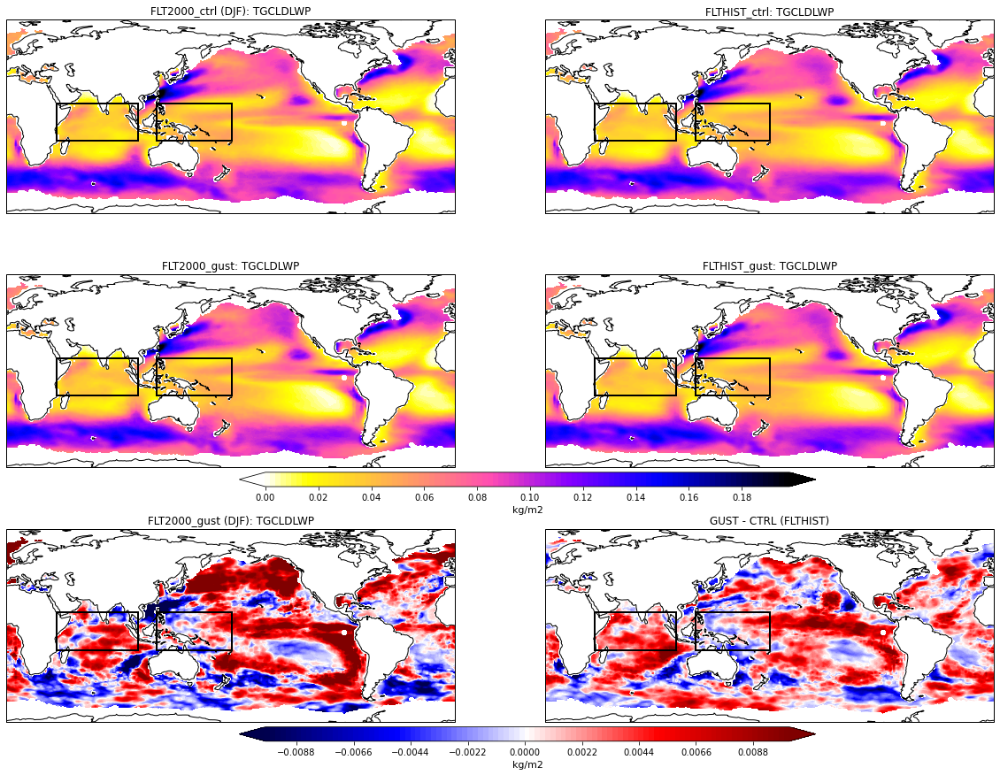

In [46]:
varSel      = 'TGCLDLWP'
seasonString = 'DJF'
# DStoUse     = regrid_h0_DJF
DStoUse     = all_h0_DJF
unitsString = all_h0[varSel].units
ocnMaskToUse = fillOcnFrac_h0_mean
# levPlot     = 250.0
DSmult = 1

# DSmult       = 86400*1e3
# levsMap    = np.arange(0, 15.0, 0.01)        ## PRECT
# diffLevs   = np.arange(-3, 3.05, 0.05)  ## PRECT
# cMapSel    = 'YlGnBu'
# unitsString = 'mm/d'


# levsMap    = np.arange(0, 1.0, 0.01)        ## CLDLOW
# diffLevs   = np.arange(-0.15, 0.16, 0.01)  ## CLDLOW
# cMapSel    = 'YlGnBu'

# levsMap    = np.arange(10, 75, 1) ## SWCF
# diffLevs   = np.arange(-22, 23, 1)  ## SWCF
# cMapSel    = 'jet'

# levsMap    = np.arange(-120, 0, 2) ## SWCF
# diffLevs   = np.arange(-25, 26, 1)  ## SWCF
# cMapSel    = 'jet'

# levsMap    = np.arange(-0.75e-1, 0.76e-1, 0.01e-1) ## OMEGA500
# levsMap    = np.arange(-0.5e-1, 0.56e-1, 0.01e-1) ## OMEGA500
# diffLevs   = np.arange(-4.5e-2, 4.55e-2, 0.05e-2)  ## OMEGA500
# cMapSel    = 'PiYG'

# levsMap    = np.arange(40, 260, 10) ## LHFLX
# diffLevs   = np.arange(-40, 41, 1)  ## LHFLX
# cMapSel    = 'gnuplot2_r'
# unitsString = all_h0[varSel].units

levsMap    = np.arange(0, 2e-1, 0.2e-2) ## TGCLDLWP
diffLevs   = np.arange(-1e-2, 1.02e-2, 0.02e-2)  ## TGCLDLWP
cMapSel    = 'gnuplot2_r'
unitsString = all_h0[varSel].units


# levsMap    = np.arange(1, 12, 0.2) ## U10
# diffLevs   = np.arange(-3,3.1, 0.1)  ## U10
# cMapSel    = 'plasma_r'

# diffLevs   = np.arange(0,2, 0.05)  ## UGUST

    
fig, axs = plt.subplots(3,2, figsize=(20,15), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs      = axs.ravel()

axs[0].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=0).values)*ocnMaskToUse*DSmult, 
# axs[0].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=0).sel(lev=levPlot, method='nearest').values)*fillOcnFrac_h0_mean, 
                                levsMap,
                                cmap=cMapSel,extend='both',
                                transform=ccrs.PlateCarree())
axs[0].coastlines()
axs[0].set_title(str(DStoUse[varSel].isel(case=0).case.values)+' ('+seasonString+'): '+varSel)
# axs[0].set_title(str(DStoUse[varSel].isel(case=0).case.values)+': '+varSel+' @ '+str(DStoUse[varSel].isel(case=0).sel(lev=levPlot, method='nearest').lev.values)+' hPa')
addRegions(axs[0])


axs[1].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=3).values)*ocnMaskToUse*DSmult, 
# axs[1].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=3).sel(lev=levPlot, method='nearest').values)*fillOcnFrac_h0_mean, 
                                levsMap,
                                cmap=cMapSel,extend='both',
                                transform=ccrs.PlateCarree())
axs[1].coastlines()
axs[1].set_title(str(DStoUse[varSel].isel(case=3).case.values)+': '+varSel)
addRegions(axs[1])


axs[2].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=1).values)*ocnMaskToUse*DSmult, 
# axs[2].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=1).sel(lev=levPlot, method='nearest').values)*fillOcnFrac_h0_mean, 
                                levsMap,
                                cmap=cMapSel,extend='both',
                                transform=ccrs.PlateCarree())
axs[2].coastlines()
axs[2].set_title(str(DStoUse[varSel].isel(case=1).case.values)+': '+varSel)
addRegions(axs[2])


cplt = axs[3].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=4).values)*ocnMaskToUse*DSmult, 
# cplt = axs[3].contourf(DStoUse.lon.values, DStoUse.lat.values, np.squeeze(DStoUse[varSel].isel(case=4).sel(lev=levPlot, method='nearest').values)*fillOcnFrac_h0_mean, 
                                levsMap,
                                cmap=cMapSel,extend='both',
                                transform=ccrs.PlateCarree())
axs[3].coastlines()
axs[3].set_title(str(DStoUse[varSel].isel(case=4).case.values)+': '+varSel)
addRegions(axs[3])
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.24, ax_position.y0-0.02, ax_position.width+0.1, 0.015])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)


## Plot differences 
diff_FLT2000 = np.squeeze(DStoUse[varSel].isel(case=1).values)*ocnMaskToUse*DSmult - np.squeeze(DStoUse[varSel].isel(case=0).values)*ocnMaskToUse*DSmult
diff_FLTHIST = np.squeeze(DStoUse[varSel].isel(case=4).values)*ocnMaskToUse*DSmult - np.squeeze(DStoUse[varSel].isel(case=3).values)*ocnMaskToUse*DSmult

# diff_FLT2000 = np.squeeze(DStoUse[varSel].isel(case=1).sel(lev=levPlot, method='nearest').values)*ocnMaskToUse - np.squeeze(DStoUse[varSel].isel(case=0).sel(lev=levPlot, method='nearest').values)*ocnMaskToUse
# diff_FLTHIST = np.squeeze(DStoUse[varSel].isel(case=4).sel(lev=levPlot, method='nearest').values)*ocnMaskToUse - np.squeeze(DStoUse[varSel].isel(case=3).sel(lev=levPlot, method='nearest').values)*ocnMaskToUse
    
axs[4].contourf(DStoUse.lon.values, DStoUse.lat.values, diff_FLT2000, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                transform=ccrs.PlateCarree())
axs[4].coastlines()
# axs[4].set_title('GUST - CTRL (FLT2000)')
axs[4].set_title(str(DStoUse[varSel].isel(case=1).case.values)+' ('+seasonString+'): '+varSel)
addRegions(axs[4])


cplt = axs[5].contourf(DStoUse.lon.values, DStoUse.lat.values, diff_FLTHIST, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                transform=ccrs.PlateCarree())
axs[5].coastlines()
addRegions(axs[5])
axs[5].set_title('GUST - CTRL (FLTHIST)')
# axs[5].set_title(str(DStoUse[varSel].isel(case=4).case.values)+' ('+seasonString+'): '+varSel)
# Add colorbar
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.24, ax_position.y0-0.02, ax_position.width+0.1, 0.015])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)


In [119]:
tropLats = np.where((all_h0_JJA.lat.values>=-15) & (all_h0_JJA.lat.values<=15))[0]
tropAvg_gust  = all_h0_JJA.UGUST.isel(lat=tropLats).mean(dim='lat').mean(dim='lon')
tropAvg_gust.values

array([0.        , 0.38053703, 0.7291782 , 0.        , 0.37705338],
      dtype=float32)

In [120]:
tropLats = np.where((all_h0_DJF.lat.values>=-15) & (all_h0_DJF.lat.values<=15))[0]
tropAvg_gust  = all_h0_DJF.UGUST.isel(lat=tropLats).mean(dim='lat').mean(dim='lon')
tropAvg_gust.values


array([0.        , 0.3899995 , 0.7477176 , 0.        , 0.38281924],
      dtype=float32)

**Walker circulation?**

In [31]:
## Take a look at Walker Circulation?
fillOcnFrac_h0_withLevs = np.full([len(all_h0_DJF.case.values), len(all_h0_DJF.lev.values), 
                                   len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], 
                                   np.nan)

for ilev in range(len(all_h0_DJF.lev.values)):
    fillOcnFrac_h0_withLevs[:,ilev,:,:] = fillOcnFrac_h0
    

ilat         = np.where((all_h0_DJF.lat.values>=-5) & (all_h0_DJF.lat.values<=5))[0]

walkerRegion_OMEGA = (fillOcnFrac_h0_withLevs*all_h0_DJF['OMEGA']).isel(lat=ilat).mean(dim='lat')
walkerRegion_U     = (fillOcnFrac_h0_withLevs*all_h0_DJF['U']).isel(lat=ilat).mean(dim='lat')


In [32]:
fillOcnFrac_h0_withLevsERA5 = np.full([len(regridERA5_omega_DJF.level.values), 
                                       len(regridERA5_omega_DJF.lat.values), 
                                       len(regridERA5_omega_DJF.lon.values)], 
                                       np.nan)
for ilev in range(len(regridERA5_omega_DJF.level.values)):
    fillOcnFrac_h0_withLevsERA5[ilev,:,:] = fillOcnFrac_h0[0,:,:]
    
ERA5_walkerRegion_OMEGA = (fillOcnFrac_h0_withLevsERA5*regridERA5_omega_DJF['w']).isel(lat=ilat).mean(dim='lat')
ERA5_walkerRegion_U     = (fillOcnFrac_h0_withLevsERA5*regridERA5_omega_DJF['u']).isel(lat=ilat).mean(dim='lat')



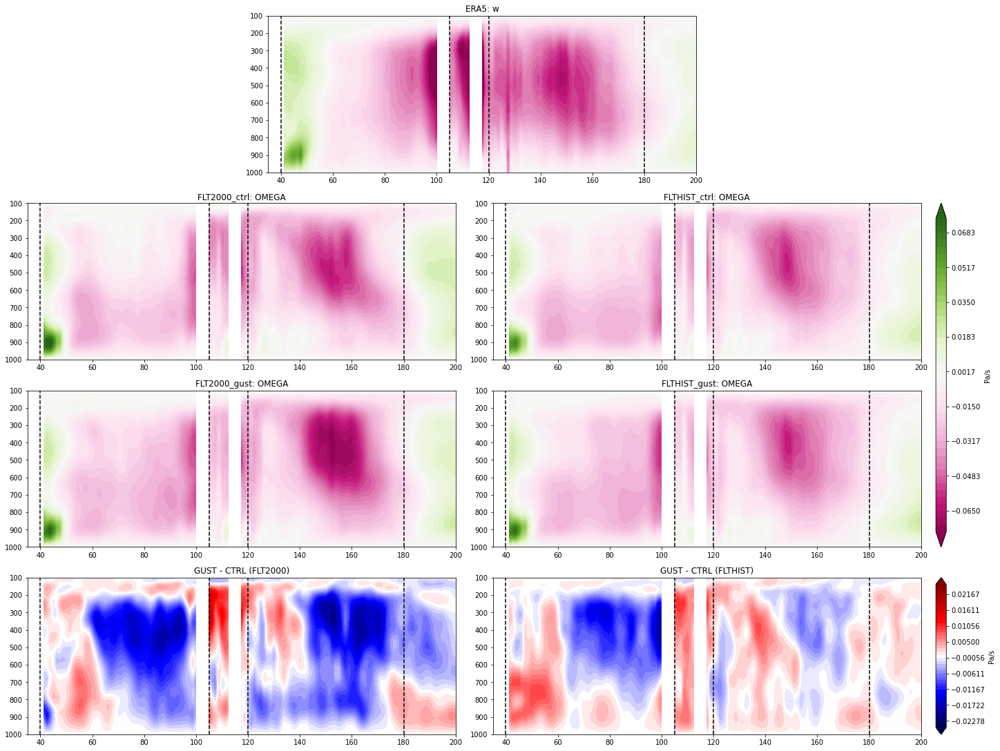

In [41]:
fig3 = plt.figure(constrained_layout=True, figsize=(20,15))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,1,1,1,0.05])

# fig, axs = plt.subplots(3,2, figsize=(20,15))
# axs      = axs.ravel()

DStoUse     = walkerRegion_OMEGA
nstepLevs = (0.75e-1*2)/45
nstepDiffs = (2*2.5e-2)/45
levsMap     = np.arange(-0.75e-1, 0.75e-1+nstepLevs, nstepLevs) ## OMEGA500
diffLevs    = np.arange(-2.5e-2, 2.5e-2+nstepDiffs, nstepDiffs)  ## OMEGA500
unitsString = all_h0['OMEGA'].units
varSel = 'OMEGA'

# DStoUse     = walkerRegion_U
# levsMap     = np.arange(-11, 11.1, 0.1) ## OMEGA500
# diffLevs    = np.arange(-6,   6.1, 0.1)  ## OMEGA500
# unitsString = all_h0['U'].units
# varSel      = 'U'


axs0 = fig3.add_subplot(gs[0, 1:3])
axs0.contourf(ERA5_walkerRegion_OMEGA.lon.values, ERA5_walkerRegion_OMEGA.level.values, ERA5_walkerRegion_OMEGA.values,
               levsMap, cmap='PiYG', extend='both')
axs0.invert_yaxis()
axs0.axvline(40,color='k',linestyle='--')
axs0.axvline(105,color='k',linestyle='--')
axs0.axvline(120,color='k',linestyle='--')
axs0.axvline(180,color='k',linestyle='--')
axs0.set_title('ERA5: w')
axs0.set_ylim([1000,100])
axs0.set_xlim([35,200])

axs1 = fig3.add_subplot(gs[1, 0:2])
axs1.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=0).values,
               levsMap, cmap='PiYG', extend='both')
axs1.invert_yaxis()
axs1.axvline(40,color='k',linestyle='--')
axs1.axvline(105,color='k',linestyle='--')
axs1.axvline(120,color='k',linestyle='--')
axs1.axvline(180,color='k',linestyle='--')
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.set_ylim([1000,100])
axs1.set_xlim([35,200])

axs2 = fig3.add_subplot(gs[1, 2:4])
axs2.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=3).values,
               levsMap, cmap='PiYG', extend='both')
axs2.invert_yaxis()
axs2.axvline(40,color='k',linestyle='--')
axs2.axvline(105,color='k',linestyle='--')
axs2.axvline(120,color='k',linestyle='--')
axs2.axvline(180,color='k',linestyle='--')
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.set_ylim([1000,100])
axs2.set_xlim([35,200])

axs3 = fig3.add_subplot(gs[2, 0:2])
axs3.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=1).values,
               levsMap, cmap='PiYG', extend='both')
axs3.invert_yaxis()
axs3.axvline(40,color='k',linestyle='--')
axs3.axvline(105,color='k',linestyle='--')
axs3.axvline(120,color='k',linestyle='--')
axs3.axvline(180,color='k',linestyle='--')
axs3.set_title(str(DStoUse.isel(case=1).case.values)+': '+varSel)
axs3.set_ylim([1000,100])
axs3.set_xlim([35,200])

axs4 = fig3.add_subplot(gs[2, 2:4])
cplt = axs4.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=4).values,
               levsMap, cmap='PiYG', extend='both')
axs4.invert_yaxis()
axs4.axvline(40,color='k',linestyle='--')
axs4.axvline(105,color='k',linestyle='--')
axs4.axvline(120,color='k',linestyle='--')
axs4.axvline(180,color='k',linestyle='--')
axs4.set_ylim([1000,100])
axs4.set_xlim([35,200])
axs4.set_title(str(DStoUse.isel(case=4).case.values)+': '+varSel)
# Add colorbar
# ax_position = axs4.get_position()
# cbar_ax     = fig.add_axes([ax_position.x0-0.24, ax_position.y0-0.02, ax_position.width+0.1, 0.015])
# cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
# cbar.set_label(unitsString,fontsize=11)

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[1:3,4])
plt.colorbar(cplt, cax=axes, label='Pa/s')

# cb = plt.colorbar(
#     cplt,
#     cax=plt.subplot(gs[2,0:]),
#     orientation='horizontal', aspect=1)

## Plot diffs 
diff_FLT2000 = DStoUse.isel(case=1).values - DStoUse.isel(case=0).values
diff_FLTHIST = DStoUse.isel(case=4).values - DStoUse.isel(case=3).values
    
axs5 = fig3.add_subplot(gs[3, 0:2])
axs5.contourf(DStoUse.lon.values, DStoUse.lev.values, diff_FLT2000, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                )
axs5.set_title('GUST - CTRL (FLT2000)')
axs5.axvline(40,color='k',linestyle='--')
axs5.axvline(105,color='k',linestyle='--')
axs5.axvline(120,color='k',linestyle='--')
axs5.axvline(180,color='k',linestyle='--')
axs5.set_ylim([1000,100])
axs5.set_xlim([35,200])

axs6 = fig3.add_subplot(gs[3, 2:4])
cplt = axs6.contourf(DStoUse.lon.values, DStoUse.lev.values, diff_FLTHIST, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                )
axs6.axvline(40,color='k',linestyle='--')
axs6.axvline(105,color='k',linestyle='--')
axs6.axvline(120,color='k',linestyle='--')
axs6.axvline(180,color='k',linestyle='--')
axs6.set_ylim([1000,100])
axs6.set_xlim([35,200])
axs6.set_title('GUST - CTRL (FLTHIST)')

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label='Pa/s')

filePath = '/glade/u/home/mdfowler/Analysis/Gusts/Figures/'
fig3.savefig(filePath+'GustFig_WalkerCellOmega.png')

plt.show()


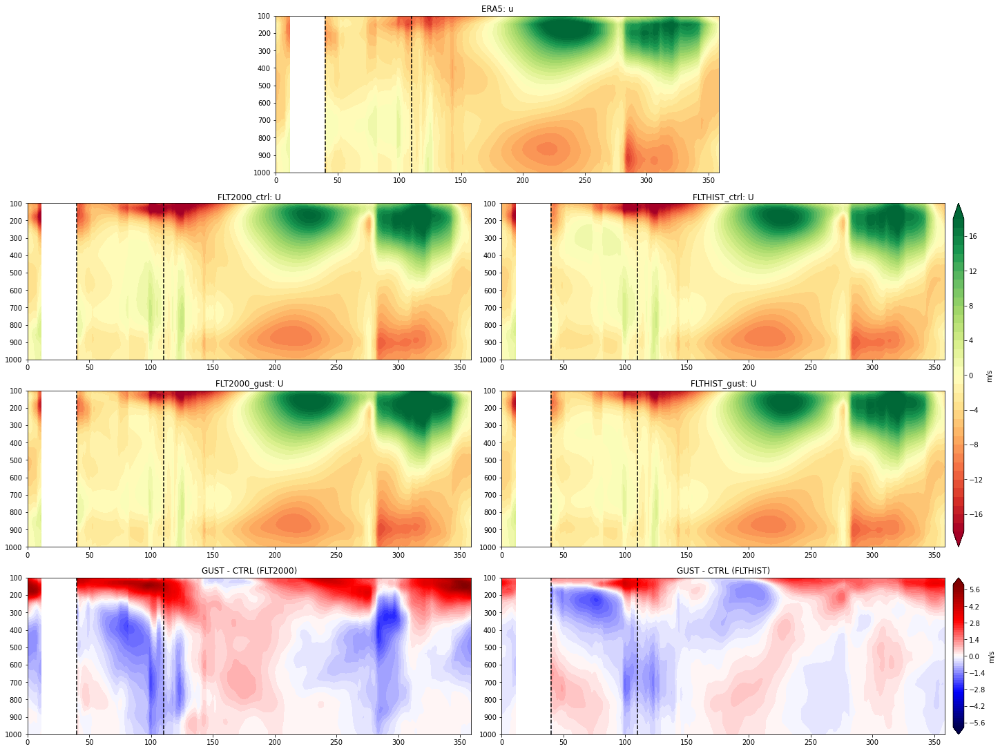

In [99]:
fig3 = plt.figure(constrained_layout=True, figsize=(20,15))
gs = fig3.add_gridspec(4, 5, width_ratios=[1,1,1,1,0.05])

# fig, axs = plt.subplots(3,2, figsize=(20,15))
# axs      = axs.ravel()

DStoUse     = walkerRegion_U
levsMap     = np.arange(-18, 19, 1) ## OMEGA500
diffLevs    = np.arange(-6, 6.2, 0.2)  ## OMEGA500
unitsString = all_h0['U'].units
varSel = 'U'

# DStoUse     = walkerRegion_U
# levsMap     = np.arange(-11, 11.1, 0.1) ## OMEGA500
# diffLevs    = np.arange(-6,   6.1, 0.1)  ## OMEGA500
# unitsString = all_h0['U'].units
# varSel      = 'U'


axs0 = fig3.add_subplot(gs[0, 1:3])
axs0.contourf(ERA5_walkerRegion_U.lon.values, ERA5_walkerRegion_U.level.values, ERA5_walkerRegion_U.values,
               levsMap, cmap='RdYlGn', extend='both')
axs0.invert_yaxis()
axs0.axvline(40,color='k',linestyle='--')
axs0.axvline(110,color='k',linestyle='--')
axs0.set_title('ERA5: u')
axs0.set_ylim([1000,100])


axs1 = fig3.add_subplot(gs[1, 0:2])
axs1.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=0).values,
               levsMap, cmap='RdYlGn', extend='both')
axs1.invert_yaxis()
axs1.axvline(40,color='k',linestyle='--')
axs1.axvline(110,color='k',linestyle='--')
axs1.set_title(str(DStoUse.isel(case=0).case.values)+': '+varSel)
axs1.set_ylim([1000,100])

axs2 = fig3.add_subplot(gs[1, 2:4])
axs2.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=3).values,
               levsMap, cmap='RdYlGn', extend='both')
axs2.invert_yaxis()
axs2.axvline(40,color='k',linestyle='--')
axs2.axvline(110,color='k',linestyle='--')
axs2.set_title(str(DStoUse.isel(case=3).case.values)+': '+varSel)
axs2.set_ylim([1000,100])

axs3 = fig3.add_subplot(gs[2, 0:2])
axs3.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=1).values,
               levsMap, cmap='RdYlGn', extend='both')
axs3.invert_yaxis()
axs3.axvline(40,color='k',linestyle='--')
axs3.axvline(110,color='k',linestyle='--')
axs3.set_title(str(DStoUse.isel(case=1).case.values)+': '+varSel)
axs3.set_ylim([1000,100])

axs4 = fig3.add_subplot(gs[2, 2:4])
cplt = axs4.contourf(DStoUse.lon.values, DStoUse.lev.values, DStoUse.isel(case=4).values,
               levsMap, cmap='RdYlGn', extend='both')
axs4.invert_yaxis()
axs4.axvline(40,color='k',linestyle='--')
axs4.axvline(110,color='k',linestyle='--')
axs4.set_ylim([1000,100])
axs4.set_title(str(DStoUse.isel(case=4).case.values)+': '+varSel)

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[1:3,4])
plt.colorbar(cplt, cax=axes, label='m/s')


## Plot diffs 
diff_FLT2000 = DStoUse.isel(case=1).values - DStoUse.isel(case=0).values
diff_FLTHIST = DStoUse.isel(case=4).values - DStoUse.isel(case=3).values
    
axs5 = fig3.add_subplot(gs[3, 0:2])
axs5.contourf(DStoUse.lon.values, DStoUse.lev.values, diff_FLT2000, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                )
axs5.set_title('GUST - CTRL (FLT2000)')
axs5.axvline(40,color='k',linestyle='--')
axs5.axvline(110,color='k',linestyle='--')
axs5.set_ylim([1000,100])

axs6 = fig3.add_subplot(gs[3, 2:4])
cplt = axs6.contourf(DStoUse.lon.values, DStoUse.lev.values, diff_FLTHIST, 
                                diffLevs,
                                cmap='seismic',extend='both',
                                # cmap='Purples',extend='both',
                                )
axs6.axvline(40,color='k',linestyle='--')
axs6.axvline(110,color='k',linestyle='--')
axs6.set_ylim([1000,100])
axs6.set_title('GUST - CTRL (FLTHIST)')

# PLOT: COLORBAR                                                                                                                     
axes = fig3.add_subplot(gs[3,4])
plt.colorbar(cplt, cax=axes, label='m/s')



**Dig into regions**

In [11]:
def meanTimeAndRegion_noYears(DS,monStart,monEnd,
                      minLat,maxLat,minLon,maxLon): 
    
    iTime = np.where( (DS['time.month']>=monStart) & (DS['time.month']<=monEnd) )[0]
    iLat  = np.where( (DS['lat']>=minLat) & (DS['lat']<=maxLat) )[0]
    iLon  = np.where( (DS['lon']>=minLon) & (DS['lon']<=maxLon) )[0]

    selDS     = DS.isel(time=iTime, lat=iLat, lon=iLon).mean(dim='time')
    
    print('Min year in DS: ', np.nanmin(DS.isel(time=iTime, lat=iLat, lon=iLon)['time.year'].values))
    print('Max year in DS: ', np.nanmax(DS.isel(time=iTime, lat=iLat, lon=iLon)['time.year'].values))
    
    return selDS


In [12]:
def plotBiases_regridded(obsDS, obsVar, obsMultiplier,
                         dsCtrl, dsTest, dsTest2, dsTest3, dsTest4,
                         dsLabels,
                         dsVar,
                         obsString, unitsString):
    
    ## Handle regridding the CAM data to obs grid
    # Get obs grid 
    obsGrid = obsDS[obsVar].isel(time=0).squeeze()*obsMultiplier

    # Now regrid the data
    regrid_ctrl    = regrid_data(dsCtrl, obsGrid, method=1)[dsVar]
    regrid_test    = regrid_data(dsTest, obsGrid, method=1)[dsVar]
    regrid_test2   = regrid_data(dsTest2, obsGrid, method=1)[dsVar]
    regrid_test3   = regrid_data(dsTest3, obsGrid, method=1)[dsVar]
    regrid_test4   = regrid_data(dsTest4, obsGrid, method=1)[dsVar]

    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Get colorbar limits for raw data and for biases 
    maxRawVal = np.nanmax( [np.nanpercentile(obsGrid,     98),
                            np.nanpercentile(regrid_ctrl, 98),
                            np.nanpercentile(regrid_test, 98), 
                            np.nanpercentile(regrid_test2, 98), 
                            np.nanpercentile(regrid_test3, 98), 
                            np.nanpercentile(regrid_test4, 98), 
                           ] )
    
    minRawVal = np.nanmin( [np.nanpercentile(obsGrid,      2),
                            np.nanpercentile(regrid_ctrl,  2),
                            np.nanpercentile(regrid_test,  2),
                            np.nanpercentile(regrid_test2,  2),
                            np.nanpercentile(regrid_test3,  2),
                            np.nanpercentile(regrid_test4,  2),
                           ] )
    levsMap    = np.arange(minRawVal, maxRawVal, (maxRawVal-minRawVal)/100.0)
    # levsMap = np.arange(0,250,5)   # non-flexible optoin; works for LHFLX if want to match plot with gust sims 
    
    
    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Make cool plots of raw data 
    fig,axs = plt.subplots(6,2, figsize=(16,25), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    axs     = axs.ravel()
    # fig.subplots_adjust(hspace=0.3)
    
    # Plot observations 
    contour_plot = axs[0].contourf(obsGrid.lon.values, obsGrid.lat.values, np.squeeze(obsGrid), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[0].coastlines()
    axs[0].set_extent([np.nanmin(obsGrid.lon.values)-2,np.nanmax(obsGrid.lon.values)+2,
                       np.nanmin(obsGrid.lat.values)-2,np.nanmax(obsGrid.lat.values)+2], crs=ccrs.PlateCarree())
    axs[0].set_title(obsString+' '+obsVar)
    
    # Plot model data 
    contour_plot = axs[2].contourf(regrid_ctrl.lon.values, regrid_ctrl.lat.values, np.squeeze(regrid_ctrl), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[2].coastlines()
    axs[2].set_extent([np.nanmin(regrid_ctrl.lon.values)-2,np.nanmax(regrid_ctrl.lon.values)+2,
                       np.nanmin(regrid_ctrl.lat.values)-2,np.nanmax(regrid_ctrl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[2].set_title(dsLabels[0]+': '+dsVar)
    
    
    contour_plot = axs[4].contourf(regrid_test.lon.values, regrid_test.lat.values, np.squeeze(regrid_test), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[4].coastlines()
    axs[4].set_extent([np.nanmin(regrid_test.lon.values)-2,np.nanmax(regrid_test.lon.values)+2,
                       np.nanmin(regrid_test.lat.values)-2,np.nanmax(regrid_test.lat.values)+2], crs=ccrs.PlateCarree())
    axs[4].set_title(dsLabels[1]+': '+dsVar)
    
    contour_plot = axs[6].contourf(regrid_test2.lon.values, regrid_test2.lat.values, np.squeeze(regrid_test2), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[6].coastlines()
    axs[6].set_extent([np.nanmin(regrid_test.lon.values)-2,np.nanmax(regrid_test.lon.values)+2,
                       np.nanmin(regrid_test.lat.values)-2,np.nanmax(regrid_test.lat.values)+2], crs=ccrs.PlateCarree())
    axs[6].set_title(dsLabels[2]+': '+dsVar)
    
    contour_plot = axs[8].contourf(regrid_test3.lon.values, regrid_test3.lat.values, np.squeeze(regrid_test3), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[8].coastlines()
    axs[8].set_extent([np.nanmin(regrid_test.lon.values)-2,np.nanmax(regrid_test.lon.values)+2,
                       np.nanmin(regrid_test.lat.values)-2,np.nanmax(regrid_test.lat.values)+2], crs=ccrs.PlateCarree())
    axs[8].set_title(dsLabels[3]+': '+dsVar)
    
    contour_plot = axs[10].contourf(regrid_test3.lon.values, regrid_test3.lat.values, np.squeeze(regrid_test3), 
                                    levsMap,
                                    cmap='gnuplot2',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[10].coastlines()
    axs[10].set_extent([np.nanmin(regrid_test.lon.values)-2,np.nanmax(regrid_test.lon.values)+2,
                       np.nanmin(regrid_test.lat.values)-2,np.nanmax(regrid_test.lat.values)+2], crs=ccrs.PlateCarree())
    axs[10].set_title(dsLabels[4]+': '+dsVar)
    # Add colorbar
    ax_position = axs[10].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.01])
    cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    cbar.set_label(unitsString,fontsize=11)
    
            
    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Make cool plots of biases 
    
    ## Plot difference 
    diffVarCtl  = np.squeeze(regrid_ctrl) - np.squeeze(obsGrid)
    diffVarTest = np.squeeze(regrid_test) - np.squeeze(obsGrid)
    diffVarTest2 = np.squeeze(regrid_test2) - np.squeeze(obsGrid)
    diffVarTest3 = np.squeeze(regrid_test3) - np.squeeze(obsGrid)
    diffVarTest4 = np.squeeze(regrid_test4) - np.squeeze(obsGrid)

    cMax = np.nanmax( [ np.nanpercentile(diffVarCtl, 98),
                        np.nanpercentile(diffVarTest, 98),
                        np.nanpercentile(diffVarTest2, 98),
                        np.nanpercentile(diffVarTest3, 98),
                        np.nanpercentile(diffVarTest4, 98),
                      ] )
    
    cMin = np.nanmin( [ np.nanpercentile(diffVarCtl,  2),
                        np.nanpercentile(diffVarTest,  2),
                        np.nanpercentile(diffVarTest2,  2),
                        np.nanpercentile(diffVarTest3,  2),
                        np.nanpercentile(diffVarTest4,  2),
                      ] )

    evenPoint = np.nanmax([abs(cMax),abs(cMin)]) 
    cStep     = (evenPoint*2)/100.0
    levsDiff  = np.arange(-evenPoint, (evenPoint+cStep), cStep ) 
    
    
    
    contour_plot = axs[3].contourf(diffVarCtl.lon.values, diffVarCtl.lat.values, np.squeeze(diffVarCtl), 
                                    levsDiff,
                                    cmap='bwr',extend='both',
                                    transform=ccrs.PlateCarree())    
    axs[3].coastlines()
    axs[3].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                       np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[3].set_title(dsLabels[0]+' - '+obsString+': ')
    
        
    contour_plot = axs[5].contourf(diffVarTest.lon.values, diffVarTest.lat.values, np.squeeze(diffVarTest), 
                                    levsDiff,
                                    cmap='bwr',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[5].coastlines()
    axs[5].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                       np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[5].set_title(dsLabels[1]+' - '+obsString+': ')   
            
        
    contour_plot = axs[7].contourf(diffVarTest2.lon.values, diffVarTest2.lat.values, np.squeeze(diffVarTest2), 
                                    levsDiff,
                                    cmap='bwr',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[7].coastlines()
    axs[7].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                       np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[7].set_title(dsLabels[2]+' - '+obsString+': ')   
    
            
    contour_plot = axs[9].contourf(diffVarTest3.lon.values, diffVarTest3.lat.values, np.squeeze(diffVarTest3), 
                                    levsDiff,
                                    cmap='bwr',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[9].coastlines()
    axs[9].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                       np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[9].set_title(dsLabels[3]+' - '+obsString+': ')   
    
    
    contour_plot = axs[11].contourf(diffVarTest3.lon.values, diffVarTest3.lat.values, np.squeeze(diffVarTest3), 
                                    levsDiff,
                                    cmap='bwr',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[11].coastlines()
    axs[11].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                       np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[11].set_title(dsLabels[4]+' - '+obsString+': ')  
    # Add colorbar
    ax_position = axs[11].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.01])
    cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    cbar.set_label(unitsString,fontsize=11)
    
    axs[1].set_visible(False)
        
    return axs

In [12]:
def plotDiffs_regridded(obsDS, obsVar, obsMultiplier,
                         dsCtrl, dsTest, dsTest2, dsTest3, 
                         dsVar,
                         obsString, unitsString):
    
    ## Handle regridding the CAM data to obs grid
    # Get obs grid 
    obsGrid = obsDS[obsVar].isel(time=0).squeeze()*obsMultiplier

    # Now regrid the data
    regrid_ctrl     = regrid_data(dsCtrl, obsGrid, method=1)[dsVar]
    regrid_test     = regrid_data(dsTest, obsGrid, method=1)[dsVar]
    regrid_test2    = regrid_data(dsTest2, obsGrid, method=1)[dsVar]
    regrid_test3    = regrid_data(dsTest3, obsGrid, method=1)[dsVar]
    
    model_diffs     = regrid_test - regrid_ctrl
    model_diffs2    = regrid_test2 - regrid_ctrl
    model_diffs3    = regrid_test3 - regrid_ctrl

    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Get colorbar limits for raw data and for biases 
    maxRawVal = np.nanmax( [np.nanpercentile(model_diffs,     98),
                            np.nanpercentile(model_diffs2,     98),
                            np.nanpercentile(model_diffs3,     98),
                           ] )
    minRawVal = np.nanmin( [np.nanpercentile(model_diffs,      2),
                            np.nanpercentile(model_diffs2,      2),
                            np.nanpercentile(model_diffs3,      2),
                           ] )
    levsMap    = np.arange(minRawVal, maxRawVal, (maxRawVal-minRawVal)/100.0)
    # levsMap = np.arange(0,250,5)   # non-flexible optoin; works for LHFLX if want to match plot with gust sims 
    
    
    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Make cool plots of raw data 
    fig,axs = plt.subplots(2,3, figsize=(18,8), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.5)
     
    # Plot model data 
    contour_plot = axs[0].contourf(regrid_ctrl.lon.values, regrid_ctrl.lat.values, np.squeeze(model_diffs), 
                                    levsMap,
                                    cmap='PRGn',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[0].coastlines()
    axs[0].set_extent([np.nanmin(regrid_ctrl.lon.values)-2,np.nanmax(regrid_ctrl.lon.values)+2,
                       np.nanmin(regrid_ctrl.lat.values)-2,np.nanmax(regrid_ctrl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[0].set_title('Test-CTRL: '+dsVar)

    contour_plot = axs[1].contourf(regrid_ctrl.lon.values, regrid_ctrl.lat.values, np.squeeze(model_diffs2), 
                                    levsMap,
                                    cmap='PRGn',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[1].coastlines()
    axs[1].set_extent([np.nanmin(regrid_ctrl.lon.values)-2,np.nanmax(regrid_ctrl.lon.values)+2,
                       np.nanmin(regrid_ctrl.lat.values)-2,np.nanmax(regrid_ctrl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[1].set_title('Test2-CTRL: '+dsVar)
    # Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
    cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    cbar.set_label(unitsString,fontsize=11)
    
    contour_plot = axs[2].contourf(regrid_ctrl.lon.values, regrid_ctrl.lat.values, np.squeeze(model_diffs3), 
                                    levsMap,
                                    cmap='PRGn',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[2].coastlines()
    axs[2].set_extent([np.nanmin(regrid_ctrl.lon.values)-2,np.nanmax(regrid_ctrl.lon.values)+2,
                       np.nanmin(regrid_ctrl.lat.values)-2,np.nanmax(regrid_ctrl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[2].set_title('Test3-CTRL: '+dsVar)


            
    ## - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Make cool plots of biases 
    
    ## Plot difference 
    diffVarCtl  = np.squeeze(regrid_ctrl) - np.squeeze(obsGrid)
    diffVarTest  = np.squeeze(regrid_test) - np.squeeze(obsGrid)
    diffVarTest2 = np.squeeze(regrid_test2) - np.squeeze(obsGrid)
    diffVarTest3 = np.squeeze(regrid_test3) - np.squeeze(obsGrid)
    
    diffBias = np.abs(diffVarTest) - np.abs(diffVarCtl)
    diffBias2 = np.abs(diffVarTest2) - np.abs(diffVarCtl)
    diffBias3 = np.abs(diffVarTest3) - np.abs(diffVarCtl)

    cMax = np.nanmax( [ np.nanpercentile(diffBias, 98),
                        np.nanpercentile(diffBias2, 98), 
                        np.nanpercentile(diffBias3, 98),
                      ] )
    
    cMin = np.nanmin( [ np.nanpercentile(diffBias,  2),
                        np.nanpercentile(diffBias2,  2), 
                        np.nanpercentile(diffBias3,  2),
                      ] )

    evenPoint = np.nanmax([abs(cMax),abs(cMin)]) 
    cStep     = (evenPoint*2)/100.0
    levsDiff  = np.arange(-evenPoint, (evenPoint+cStep), cStep ) 
    
    
    contour_plot = axs[3].contourf(diffVarCtl.lon.values, diffVarCtl.lat.values, np.squeeze(diffBias), 
                                    levsDiff,
                                    cmap='PuOr_r',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[3].coastlines()
    axs[3].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                      np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[3].set_title('|TESTbias|-|CTRLbias| (delta_abs(bias))- '+obsString+': ')
    
    
    contour_plot = axs[4].contourf(diffVarCtl.lon.values, diffVarCtl.lat.values, np.squeeze(diffBias2), 
                                    levsDiff,
                                    cmap='PuOr_r',extend='both',
                                    transform=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[4].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
    cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    cbar.set_label(unitsString,fontsize=11)
    
    axs[4].coastlines()
    axs[4].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                      np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[4].set_title('|TEST2bias|-|CTRLbias| (delta_abs(bias))- '+obsString+': ')
    
    
    contour_plot = axs[5].contourf(diffVarCtl.lon.values, diffVarCtl.lat.values, np.squeeze(diffBias3), 
                                    levsDiff,
                                    cmap='PuOr_r',extend='both',
                                    transform=ccrs.PlateCarree())
    axs[5].coastlines()
    axs[5].set_extent([np.nanmin(diffVarCtl.lon.values)-2,np.nanmax(diffVarCtl.lon.values)+2,
                      np.nanmin(diffVarCtl.lat.values)-2,np.nanmax(diffVarCtl.lat.values)+2], crs=ccrs.PlateCarree())
    axs[5].set_title('|TEST3bias|-|CTRLbias| (delta_abs(bias))- '+obsString+': ')
    
        
    return axs

In [19]:
## Select a range of years and 

monStart = 6
monEnd   = 8


# ## Tropical NW Pacific
# minLat     = 5
# maxLat     = 30
# minLon     = 90
# maxLon     = 145   # Original domain

# ## Tropical NW Pacific
# minLat     = -35
# maxLat     = 35
# minLon     = 55
# maxLon     = 210   # Expanded domain

# ## IO ocean domain -- test expanding
# minLat     = -15
# maxLat     = 15
# minLon     = 50
# maxLon     = 110   

## Eq. W. Pac.
minLat     = -20
maxLat     = 20
minLon     = 130
maxLon     = 200   


# ## ~global
# minLat     = -80
# maxLat     = 80
# minLon     = 0
# maxLon     = 359   

sel_ctrl = meanTimeAndRegion_noYears(all_h0,monStart,monEnd,minLat,maxLat,minLon,maxLon)
sel_h1   = meanTimeAndRegion_noYears(all_h1,monStart,monEnd,minLat,maxLat,minLon,maxLon)

## Select same region for obs comparison:
ilat = np.where( (erai_jja.lat.values>=minLat) & (erai_jja.lat.values<=maxLat) )[0]
ilon = np.where( (erai_jja.lon.values>=minLon) & (erai_jja.lon.values<=maxLon) )[0]
sel_erai_jja = erai_jja.isel(lat=ilat,lon=ilon)
sel_erai_djf = erai_djf.isel(lat=ilat,lon=ilon)

ilat2 = np.where( (gpcp_jja.lat.values>=minLat) & (gpcp_jja.lat.values<=maxLat) )[0]
ilon2 = np.where( (gpcp_jja.lon.values>=minLon) & (gpcp_jja.lon.values<=maxLon) )[0]
sel_gpcp_jja = gpcp_jja.isel(lat=ilat2,lon=ilon2)
sel_gpcp_djf = gpcp_djf.isel(lat=ilat2,lon=ilon2)

print('--- Done with selecting season/regions ---')


Min year in DS:  2
Max year in DS:  2014
Min year in DS:  2
Max year in DS:  2014
--- Done with selecting season/regions ---


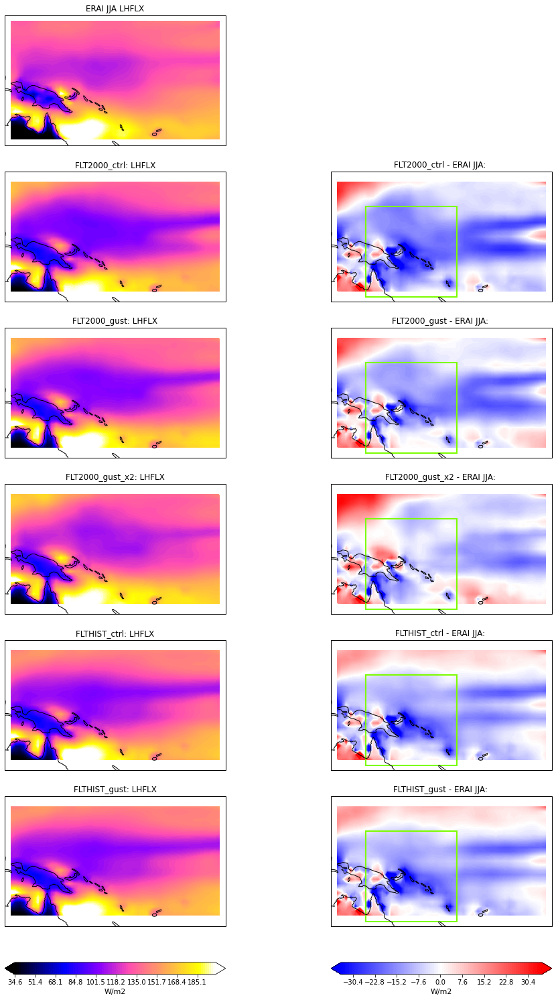

In [32]:
axs = plotBiases_regridded(sel_erai_jja, 'LHFLX', 1,
                    sel_ctrl.sel(case='FLT2000_ctrl'), 
                    sel_ctrl.sel(case='FLT2000_gust'), 
                    sel_ctrl.sel(case='FLT2000_gust_x2'),
                    sel_ctrl.sel(case='FLTHIST_ctrl'),
                    sel_ctrl.sel(case='FLTHIST_gust'),
                    sel_ctrl.case.values,
                    'LHFLX',
                    'ERAI JJA', 'W/m2')

axs[3].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[5].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[7].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[9].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[11].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))


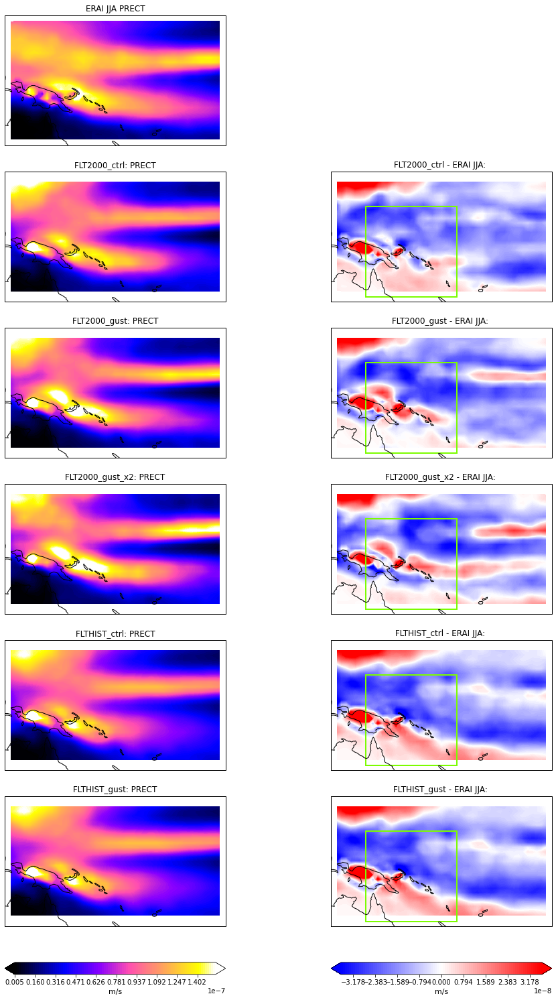

In [33]:
axs = plotBiases_regridded(sel_erai_jja, 'PRECT',  1/86400000.0 ,
                    sel_ctrl.sel(case='FLT2000_ctrl'), 
                    sel_ctrl.sel(case='FLT2000_gust'), 
                    sel_ctrl.sel(case='FLT2000_gust_x2'),
                    sel_ctrl.sel(case='FLTHIST_ctrl'),
                    sel_ctrl.sel(case='FLTHIST_gust'),
                    sel_ctrl.case.values,
                    'PRECT',
                    'ERAI JJA', 'm/s')

axs[3].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[5].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[7].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[9].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[11].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))



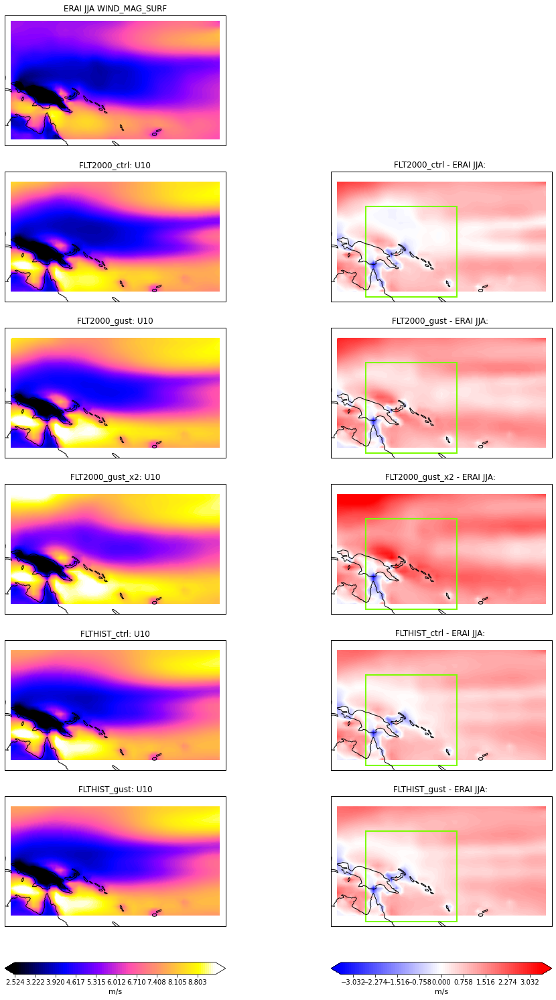

In [34]:
axs = plotBiases_regridded(sel_erai_jja, 'WIND_MAG_SURF',  1 ,
                    sel_ctrl.sel(case='FLT2000_ctrl'), 
                    sel_ctrl.sel(case='FLT2000_gust'), 
                    sel_ctrl.sel(case='FLT2000_gust_x2'),
                    sel_ctrl.sel(case='FLTHIST_ctrl'),
                    sel_ctrl.sel(case='FLTHIST_gust'),
                    sel_ctrl.case.values,
                    'U10',
                    'ERAI JJA', 'm/s')

axs[3].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[5].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[7].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[9].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))
axs[11].add_patch(patches.Rectangle(xy=[140, -20], width=30, height=30,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))


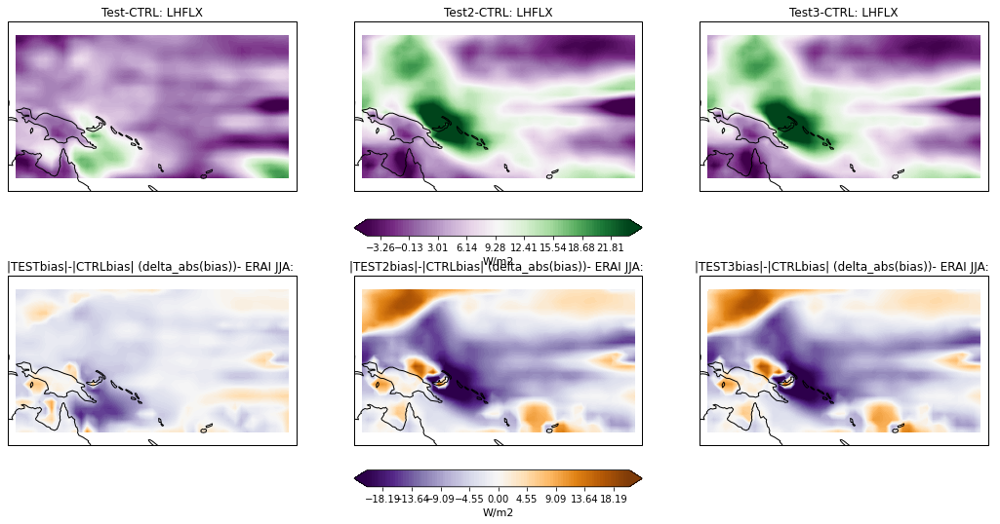

In [24]:
axs = plotDiffs_regridded(sel_erai_jja, 'LHFLX', 1,
                          sel_ctrl.sel(case='FLT2000_ctrl'), 
                          sel_ctrl.sel(case='FLT2000_gust'), 
                          sel_ctrl.sel(case='FLT2000_gust_x2'),
                          sel_ctrl.sel(case='FLT2000_gust_x2'),
                           'LHFLX',
                           'ERAI JJA', 'W/m2')


### Scatters

In [191]:
# ## Select region/time 

iTimes_cam  = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
iTimes_era5 = np.where( (regridERA5['time.month']==12) | (regridERA5['time.month']<=2) )[0]

allDays_h0_DJF    = all_h0.isel(time=iTimes_cam)
allDays_ERA5_DJF  = regridERA5.isel(time=iTimes_era5)

## Equatorial Indian Ocean 
regName = 'Eq. IO' 
ilats   = np.where( (allDays_h0_DJF.lat.values>=-15) & (allDays_h0_DJF.lat.values<=15) )[0]
ilons   = np.where( (allDays_h0_DJF.lon.values>=40) & (allDays_h0_DJF.lon.values<=105) )[0]

sel_h1   = allDays_h0_DJF.isel(lat=ilats, lon=ilons)
sel_era5 = allDays_ERA5_DJF.isel(lat=ilats, lon=ilons)

reg_ocnMask = fillOcnFrac_h0[0,ilats,:]
reg_ocnMask = reg_ocnMask[:,ilons]

reg_ocnMask_CAM  = np.full([len(sel_h1.time.values), len(sel_h1.lat.values), len(sel_h1.lon.values)], np.nan)
reg_ocnMask_ERA5 = np.full([len(sel_era5.time.values), len(sel_era5.lat.values), len(sel_era5.lon.values)], np.nan)

for iT in range(len(sel_h1.time.values)): 
    reg_ocnMask_CAM[iT,:,:] = reg_ocnMask
    
for iT in range(len(sel_era5.time.values)): 
    reg_ocnMask_ERA5[iT,:,:] = reg_ocnMask


In [165]:
## No extra limits
delLH  = sel_h1.LHFLX.isel(case=1) - sel_h1.LHFLX.isel(case=0)
delU10 = sel_h1.U10.isel(case=1) - sel_h1.U10.isel(case=0)
gust   = sel_h1.UGUST.isel(case=1)

In [98]:
# set limit on what times/points to consider? 
rainLim = 0.25/(86400e3) # Convert mm/d to m/s
sel_h1_rain = sel_h1.where(sel_h1.PRECC.isel(case=0)>rainLim)

delLH  = sel_h1_rain.LHFLX.isel(case=1) - sel_h1_rain.LHFLX.isel(case=0)
delU10 = sel_h1_rain.U10.isel(case=1) - sel_h1_rain.U10.isel(case=0)
gust   = sel_h1_rain.UGUST.isel(case=1)


In [183]:
# set limit on what times/points to consider? 
gustLim = 0.5
sel_h1_gust = sel_h1.where(sel_h1.UGUST.isel(case=1)>gustLim)

delLH  = sel_h1_gust.LHFLX.isel(case=1) - sel_h1_gust.LHFLX.isel(case=0)
delU10 = sel_h1_gust.U10.isel(case=1) - sel_h1_gust.U10.isel(case=0)
gust   = sel_h1_gust.UGUST.isel(case=1)
gustPct = sel_h1_gust.UGUST.isel(case=1)/sel_h1_gust.U10.isel(case=1)


Text(0.5, 1.0, 'UGUST/U10')

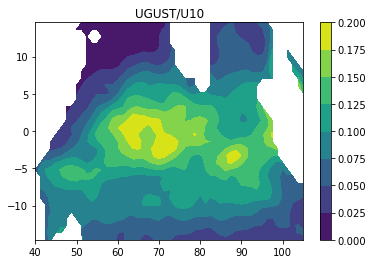

In [145]:
plt.contourf(gustPct.lon.values, gustPct.lat.values, 
                     np.nanmean(gustPct.values*reg_ocnMask, axis=0))
plt.colorbar()
plt.title('UGUST/U10')

Text(0.5, 1.0, 'Monthly DJF (each grid/time = 1 dot)\n(where UGUST > 0.5 m/s)')

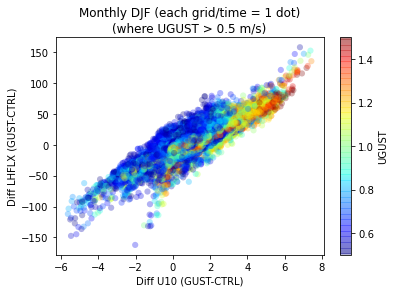

In [186]:
plt.scatter((delU10*reg_ocnMask_CAM).values.reshape(numEl, 1), 
            (delLH*reg_ocnMask_CAM).values.reshape(numEl, 1), 
            c=(gust*reg_ocnMask_CAM).values.reshape(numEl, 1), 
            # c=(gustPct*reg_ocnMask_CAM).values.reshape(numEl, 1), 
            alpha=0.3, linewidths=0.1, cmap='jet', vmax = 1.5)
            # alpha=0.3, linewidths=0.1, cmap='jet', vmax=0.2)

plt.colorbar(label='UGUST')
# plt.colorbar(label='UGUST Fraction of U10 (gust)')
plt.xlabel('Diff U10 (GUST-CTRL)')
plt.ylabel('Diff LHFLX (GUST-CTRL)')
plt.title('Monthly DJF (each grid/time = 1 dot)\n(where UGUST > '+str(gustLim)+' m/s)')


In [169]:
corrCoefs_CAM = xr.corr(delU10, delLH, dim='time').load()

corrCoefs_CAM2 = xr.corr(gust, delLH, dim='time').load()


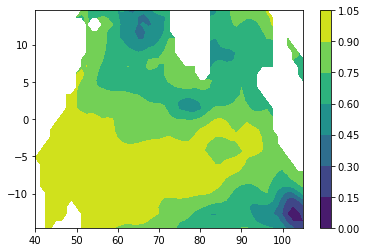

In [170]:
plt.contourf(corrCoefs_CAM.lon.values, corrCoefs_CAM.lat.values, 
                     corrCoefs_CAM.values*reg_ocnMask)
plt.colorbar()

In [171]:
np.nanmean(np.nanmean(corrCoefs_CAM.values*reg_ocnMask))

0.7978944725454604

Spatial mean of correlation values:  -0.06464206300430937


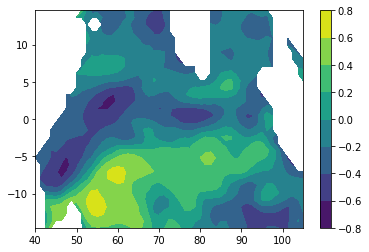

In [184]:
plt.contourf(corrCoefs_CAM2.lon.values, corrCoefs_CAM2.lat.values, 
                     corrCoefs_CAM2.values*reg_ocnMask)
plt.colorbar()
print('Spatial mean of correlation values: ', np.nanmean(np.nanmean(corrCoefs_CAM2.values*reg_ocnMask)))

In [174]:
numEl = len(delU10.time.values)*len(delU10.lat.values)*len(delU10.lon.values)

In [175]:
xVar = np.asarray(pd.DataFrame((delU10.values*reg_ocnMask_CAM).reshape(numEl,1)).dropna().values)[:,0]
yVar = np.asarray(pd.DataFrame((delLH.values*reg_ocnMask_CAM).reshape(numEl,1)).dropna().values)[:,0]



Text(0.5, 1.0, 'DJF Monthly Means: 2D HIST')

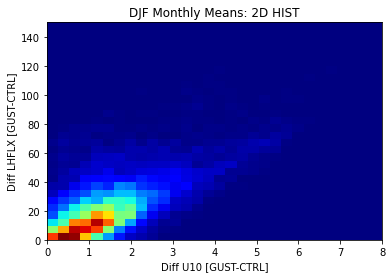

In [176]:
cplt = plt.hist2d(xVar, yVar, bins=(30, 30), range=[[0,8], [0,150]], density=True, cmap=plt.cm.jet)
plt.xlabel('Diff U10 [GUST-CTRL]')
plt.ylabel('Diff LHFLX [GUST-CTRL]')
plt.title('DJF Monthly Means: 2D HIST')

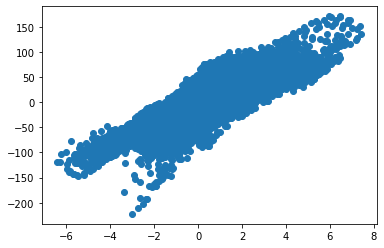

In [179]:
plt.plot((delU10*reg_ocnMask_CAM).values.reshape(numEl, 1), (delLH*reg_ocnMask_CAM).values.reshape(numEl, 1),'o')


Text(0.5, 1.0, 'Monthly DJF (each grid/time = 1 dot)\n(where UGUST >= 0 m/s)')

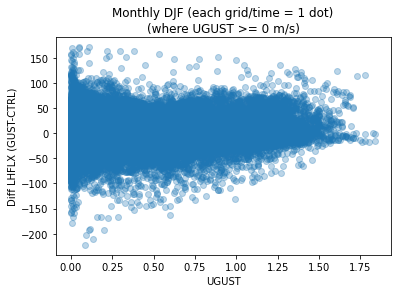

In [178]:
plt.plot((gust*reg_ocnMask_CAM).values.reshape(numEl, 1), 
         (delLH*reg_ocnMask_CAM).values.reshape(numEl, 1),'o', alpha=0.3)
plt.xlabel('UGUST')
plt.ylabel('Diff LHFLX (GUST-CTRL)')
plt.title('Monthly DJF (each grid/time = 1 dot)\n(where UGUST >= '+str(gustLim)+' m/s)')

# plt.ylim([0,400])

Text(0.5, 1.0, 'Monthly DJF (each grid/time = 1 dot)\n(where UGUST >= 0 m/s)')

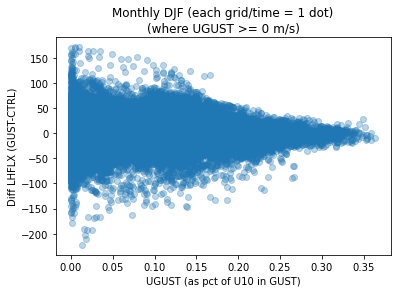

In [177]:
plt.plot((gustPct*reg_ocnMask_CAM).values.reshape(numEl, 1), 
         (delLH*reg_ocnMask_CAM).values.reshape(numEl, 1),'o', alpha=0.3)
plt.xlabel('UGUST (as pct of U10 in GUST)')
plt.ylabel('Diff LHFLX (GUST-CTRL)')
plt.title('Monthly DJF (each grid/time = 1 dot)\n(where UGUST >= '+str(gustLim)+' m/s)')

# plt.ylim([0,400])

In [148]:
np.shape((gust*reg_ocnMask_CAM))

(83, 32, 53)

In [192]:
# set limit on what times/points to consider? 
gustLim = 0
sel_h1_gust = sel_h1.where(sel_h1.UGUST.isel(case=1)>gustLim)

delLH  = sel_h1_gust.LHFLX.isel(case=1) - sel_h1_gust.LHFLX.isel(case=0)
delU10 = sel_h1_gust.U10.isel(case=1) - sel_h1_gust.U10.isel(case=0)
gust   = sel_h1_gust.UGUST.isel(case=1)
gustPct = sel_h1_gust.UGUST.isel(case=1)/sel_h1_gust.U10.isel(case=1)


In [193]:
numElSpace = len(delU10.lat.values)*len(delU10.lon.values)

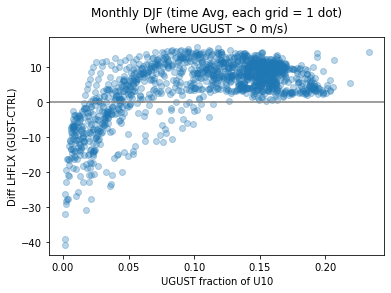

In [194]:
plt.plot(np.nanmean((gustPct*reg_ocnMask_CAM).values, axis=0).reshape(numElSpace, 1), 
         np.nanmean((delLH*reg_ocnMask_CAM).values, axis=0).reshape(numElSpace, 1),'o', alpha=0.3)
plt.xlabel('UGUST fraction of U10')
# plt.xlabel('UGUST')
plt.ylabel('Diff LHFLX (GUST-CTRL)')
plt.title('Monthly DJF (time Avg, each grid = 1 dot)\n(where UGUST > '+str(gustLim)+' m/s)')

plt.axhline(0,color='gray')

# plt.ylim([0,400])

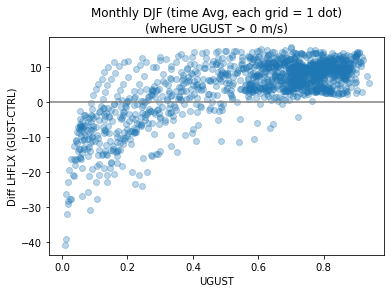

In [195]:
plt.plot(np.nanmean((gust*reg_ocnMask_CAM).values, axis=0).reshape(numElSpace, 1), 
         np.nanmean((delLH*reg_ocnMask_CAM).values, axis=0).reshape(numElSpace, 1),'o', alpha=0.3)
plt.xlabel('UGUST')
# plt.xlabel('UGUST')
plt.ylabel('Diff LHFLX (GUST-CTRL)')
plt.title('Monthly DJF (time Avg, each grid = 1 dot)\n(where UGUST > '+str(gustLim)+' m/s)')
plt.axhline(0,color='gray')

# plt.ylim([0,55])

In [ ]:
## Ned daily? 
# ## Select region/time 

iTimes_cam  = np.where( (all_h1['time.month']==12) | (all_h1['time.month']<=2) )[0]

allDays_h1_DJF    = all_h1.isel(time=iTimes_cam)

## Equatorial Indian Ocean 
regName = 'Eq. IO' 
ilats   = np.where( (allDays_h0_DJF.lat.values>=-15) & (allDays_h0_DJF.lat.values<=15) )[0]
ilons   = np.where( (allDays_h0_DJF.lon.values>=40) & (allDays_h0_DJF.lon.values<=105) )[0]

sel_h1   = allDays_h0_DJF.isel(lat=ilats, lon=ilons)
sel_era5 = allDays_ERA5_DJF.isel(lat=ilats, lon=ilons)

reg_ocnMask = fillOcnFrac_h0[0,ilats,:]
reg_ocnMask = reg_ocnMask[:,ilons]

reg_ocnMask_CAM  = np.full([len(sel_h1.time.values), len(sel_h1.lat.values), len(sel_h1.lon.values)], np.nan)
reg_ocnMask_ERA5 = np.full([len(sel_era5.time.values), len(sel_era5.lat.values), len(sel_era5.lon.values)], np.nan)

for iT in range(len(sel_h1.time.values)): 
    reg_ocnMask_CAM[iT,:,:] = reg_ocnMask
    
for iT in range(len(sel_era5.time.values)): 
    reg_ocnMask_ERA5[iT,:,:] = reg_ocnMask


*Define all the regions at the same time*

In [103]:
def get_region(minLat,maxLat,minLon,maxLon, season, DS, ocnDS = [], ocnMask=False): 
    iLat  = np.where( (DS['lat']>=minLat) & (DS['lat']<=maxLat) )[0]
    iLon  = np.where( (DS['lon']>=minLon) & (DS['lon']<=maxLon) )[0]
    
    if season=='DJF': 
        iTime = np.where( (DS['time.month']==12) | (DS['time.month']<=2) )[0]
    elif season=='JJA':
        iTime = np.where( (DS['time.month']>=6) & (DS['time.month']<=8) )[0]
    elif season=='none':
        iTime = 0
        
    if ocnMask==True:
        selOcn = ocnDS[:,:,iLat,:]
        selOcn = selOcn[:,iTime,:,:]
        return selOcn[:,:,:,iLon]
            
    return DS.isel(time=iTime, lat=iLat, lon=iLon)

In [102]:
## Also create ocean-only frac
fillOcnFrac = np.full([5, len(all_h1.time.values), len(all_h1.lat.values), len(all_h1.lon.values)], np.nan)
fillOcnFrac[:,:,:,:] = all_h0.OCNFRAC.isel(case=0, time=6)
fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan


In [105]:
### DJF regions of interest 
eq_IO      = get_region(-15,15,40,105, 'DJF', all_h1)
eq_ocn     = get_region(-15,15,40,105, 'DJF', all_h1, fillOcnFrac, True)

eq_WP      = get_region(-15,15,120,180, 'DJF', all_h1)
eq_WP_ocn  = get_region(-15,15,120,180, 'DJF', all_h1, fillOcnFrac, True)

n_WP      = get_region(15,45,110,200,  'DJF', all_h1)
n_WP_ocn  = get_region(15,45,110,200,  'DJF', all_h1, fillOcnFrac, True)

s_WP      = get_region(-45,-15,150,240, 'DJF', all_h1)
s_WP_ocn = get_region(-45,-15,150,240,  'DJF', all_h1, fillOcnFrac, True)


In [112]:
## Set any limits?

def set_RainLimit(DS, upperMax):
    rainLim = upperMax / (86400*1e3)  # convert limit from mm/d to m/s
    return DS.where(DS.PRECT>=rainLim), 'Rain>='+str(upperMax)+' mm/d'



# selDS_raining_lowWind = selDS_raining.where(selDS_raining.isel(case=0).U10<=5)



In [128]:
numEl_eqIO = len(eq_IO.time.values)*len(eq_IO.lat.values)*len(eq_IO.lon.values)
numEl_eqWP = len(eq_WP.time.values)*len(eq_WP.lat.values)*len(eq_WP.lon.values)
numEl_nWP  = len(n_WP.time.values)*len(n_WP.lat.values)*len(n_WP.lon.values)
numEl_sWP  = len(s_WP.time.values)*len(s_WP.lat.values)*len(s_WP.lon.values)


In [117]:
## Set limits if desired
eq_IO_sel,limString  = set_RainLimit(eq_IO, 1)
eq_WP_sel,limString  = set_RainLimit(eq_WP, 1)
n_WP_sel,limString   = set_RainLimit(n_WP, 1)
s_WP_sel,limString   = set_RainLimit(s_WP, 1)


(5, 2503, 32, 53)

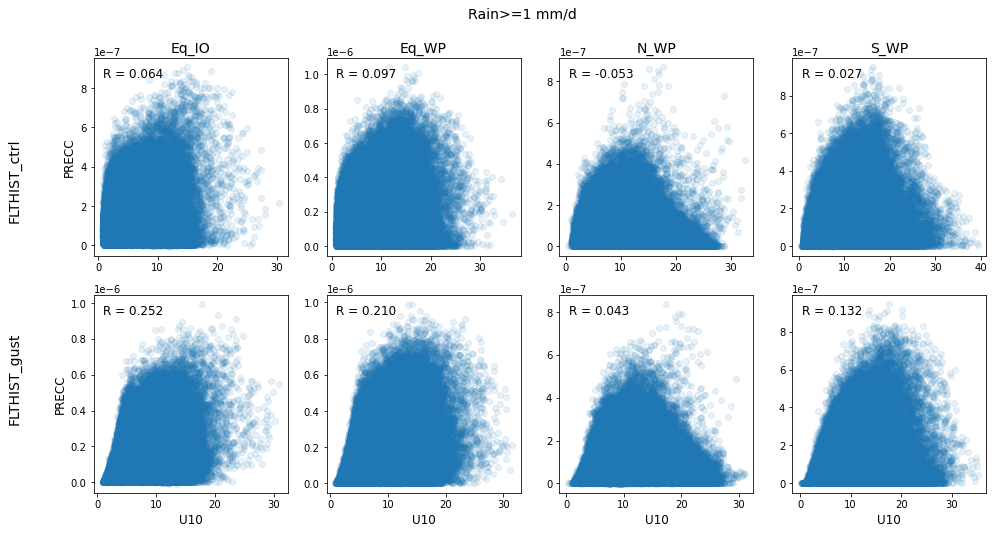

In [231]:
ctrlCase = 3
testCase = 4

# ## Set 1: U10 vs. LHFLX
# xVar = 'U10'
# yVar = 'LHFLX'

# ## Set 2: LHFLX vs. PRECC
# xVar = 'LHFLX'
# yVar = 'PRECC'

# ## Set 3: LHFLX vs. PRECT
# xVar = 'LHFLX'
# yVar = 'PRECT'

## Set 4: U10 vs. PREC?
xVar = 'U10'
yVar = 'PRECC'


## - - - - - - - - - - - - - - - - - - - 
## Shouldn't need to modify below here 
## - - - - - - - - - - - - - - - - - - - 
fig,axs = plt.subplots(2,4,figsize=(16,8))
axs     = axs.ravel()

# Set region titles 
axs[0].set_title('Eq_IO', fontsize=14)
axs[1].set_title('Eq_WP', fontsize=14)
axs[2].set_title('N_WP',  fontsize=14)
axs[3].set_title('S_WP',  fontsize=14)

# Set axis labels 
axs[0].set_ylabel(yVar, fontsize=12)
axs[4].set_ylabel(yVar, fontsize=12)
axs[4].set_xlabel(xVar, fontsize=12)
axs[5].set_xlabel(xVar, fontsize=12)
axs[6].set_xlabel(xVar, fontsize=12)
axs[7].set_xlabel(xVar, fontsize=12)

# Set some broader labels for the plot 
plt.gcf().text(0.45,  0.95, limString, fontsize=14)
plt.gcf().text(0.05, 0.6, str(eq_IO_sel.isel(case=ctrlCase).case.values), rotation='vertical', fontsize=14)
plt.gcf().text(0.05, 0.25, str(eq_IO_sel.isel(case=testCase).case.values), rotation='vertical', fontsize=14)


## - - - - - - - - - - - 
## Plot control cases 
## - - - - - - - - - - - 
a = np.reshape(eq_IO_sel[xVar].isel(case=ctrlCase).values*eq_ocn[0,:,:], [numEl_eqIO,1])
b = np.reshape(eq_IO_sel[yVar].isel(case=ctrlCase).values*eq_ocn[0,:,:], [numEl_eqIO,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[0].plot(a, b, 'o', alpha=0.1)
axs[0].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[0].transAxes)
del a,b

a = np.reshape(eq_WP_sel[xVar].isel(case=ctrlCase).values*eq_WP_ocn[0,:,:], [numEl_eqWP,1])
b = np.reshape(eq_WP_sel[yVar].isel(case=ctrlCase).values*eq_WP_ocn[0,:,:], [numEl_eqWP,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[1].plot(a, b, 'o', alpha=0.1)
axs[1].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[1].transAxes)
del a,b


a = np.reshape(n_WP_sel[xVar].isel(case=ctrlCase).values*n_WP_ocn[0,:,:], [numEl_nWP,1])
b = np.reshape(n_WP_sel[yVar].isel(case=ctrlCase).values*n_WP_ocn[0,:,:], [numEl_nWP,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[2].plot(a, b, 'o', alpha=0.1)
axs[2].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[2].transAxes)
del a,b

a=np.reshape(s_WP_sel[xVar].isel(case=ctrlCase).values*s_WP_ocn[0,:,:], [numEl_sWP,1]) 
b=np.reshape(s_WP_sel[yVar].isel(case=ctrlCase).values*s_WP_ocn[0,:,:], [numEl_sWP,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[3].plot(a, b, 'o', alpha=0.1)
axs[3].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[3].transAxes)
del a,b

## - - - - - - - - - - - 
## Plot test cases
## - - - - - - - - - - - 
a=np.reshape(eq_IO_sel[xVar].isel(case=testCase).values*eq_ocn[0,:,:], [numEl_eqIO,1])
b=np.reshape(eq_IO_sel[yVar].isel(case=testCase).values*eq_ocn[0,:,:], [numEl_eqIO,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[4].plot(a, b, 'o', alpha=0.1)
axs[4].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[4].transAxes)
del a,b

a = np.reshape(eq_WP_sel[xVar].isel(case=testCase).values*eq_WP_ocn[0,:,:], [numEl_eqWP,1])
b = np.reshape(eq_WP_sel[yVar].isel(case=testCase).values*eq_WP_ocn[0,:,:], [numEl_eqWP,1]) 
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[5].plot(a, b, 'o', alpha=0.1)
axs[5].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[5].transAxes)
del a,b

a = np.reshape(n_WP_sel[xVar].isel(case=testCase).values*n_WP_ocn[0,:,:], [numEl_nWP,1])
b = np.reshape(n_WP_sel[yVar].isel(case=testCase).values*n_WP_ocn[0,:,:], [numEl_nWP,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[6].plot(a, b, 'o', alpha=0.1)
axs[6].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[6].transAxes)
del a,b

a = np.reshape(s_WP_sel[xVar].isel(case=testCase).values*s_WP_ocn[0,:,:], [numEl_sWP,1])
b = np.reshape(s_WP_sel[yVar].isel(case=testCase).values*s_WP_ocn[0,:,:], [numEl_sWP,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 
axs[7].plot(a, b, 'o', alpha=0.1)
axs[7].text(0.05, 0.9, ('R = %.3f' % (df.corr().values[0,1])), fontsize=12, transform=axs[7].transAxes)
del a,b



*Older code*

In [90]:
# # IO ocean domain -- test expanding
# minLat     = -15
# maxLat     = 15
# minLon     = 50
# maxLon     = 110   

# ## Eq. W. Pac ocean domain 
# minLat     = -20
# maxLat     = 10
# minLon     = 140
# maxLon     = 170   

# Tropical Pac ocean domain (JJA)
minLat     = -15
maxLat     = 15
minLon     = 140
maxLon     = 195   



#JJA
iTime = np.where( (all_h1['time.month']>=6) & (all_h1['time.month']<=8) )[0]
# #DJF
# iTime = np.where( (all_h1['time.month']==12) | (all_h1['time.month']<=2) )[0]
# Get lat and lon too
iLat  = np.where( (all_h1['lat']>=minLat) & (all_h1['lat']<=maxLat) )[0]
iLon  = np.where( (all_h1['lon']>=minLon) & (all_h1['lon']<=maxLon) )[0]
selDS    = all_h1.isel(time=iTime, lat=iLat, lon=iLon)

# JJA
iTime = np.where( (all_h0['time.month']>=6) & (all_h0['time.month']<=8) )[0]
# # DJF
# iTime = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
# Get lat and lon too
iLat  = np.where( (all_h0['lat']>=minLat) & (all_h0['lat']<=maxLat) )[0]
iLon  = np.where( (all_h0['lon']>=minLon) & (all_h0['lon']<=maxLon) )[0]
selDS_h0 = all_h0.isel(time=iTime, lat=iLat, lon=iLon)

## Also create ocean-only frac
fillOcnFrac = np.full([5, len(selDS.time.values), len(selDS.lat.values), len(selDS.lon.values)], np.nan)
fillOcnFrac[:,:,:,:] = selDS_h0.OCNFRAC.isel(case=0, time=6)
fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

fillOcnFrac_h0= np.full([5, len(selDS_h0.time.values), len(selDS_h0.lat.values), len(selDS_h0.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:,:] = selDS_h0.OCNFRAC.isel(case=0, time=6)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan

## Get means 
selDS_h0_mean = selDS_h0.mean(dim='time')
fillOcnFrac_h0_mean = fillOcnFrac_h0[:,0,:,:]


In [87]:
## Read in ERA-5 Monthly means for the same period 
filePath = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_fluxesAndRain.nc'
era5_obs = xr.open_dataset(filePath, decode_times=True)

era5_obs = era5_obs.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})

## Regrid ERA5 (quarter degree) to model grid 
# Get model grid 
camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# Now regrid the data
lhflx_era5 = era5_obs['slhf'].where(era5_obs['slhf'].values>-9999)
lhflx_era5 = lhflx_era5/86400  # Divide fluxes by 86400 to get from J/m2 to W/m2 
regridERA5_lhflx = regrid_data(lhflx_era5, camGrid, method=1)

era5_u10_temp = era5_obs['u10'].where(era5_obs['u10'].values>-9999)
era5_v10_temp = era5_obs['u10'].where(era5_obs['u10'].values>-9999)
u10_era5 = np.sqrt(era5_u10_temp**2 + era5_v10_temp**2)
regridERA5_u10 = regrid_data(u10_era5, camGrid, method=1)

era5_prect_temp  = era5_obs['tp'].where(era5_obs['tp'].values>-9999)
era5_prect_temp  =  era5_prect_temp * 1000.0  # Convert from m of water per day to mm/day
regridERA5_prect = regrid_data(era5_prect_temp, camGrid, method=1)

## Select the regridded data for just the region and months of interst 
ilat = np.where( (regridERA5_lhflx.lat.values>=minLat) & (regridERA5_lhflx.lat.values<=maxLat) )[0]
ilon = np.where( (regridERA5_lhflx.lon.values>=minLon) & (regridERA5_lhflx.lon.values<=maxLon) )[0]
# # JJA
itimes = np.where( (regridERA5_lhflx['time.month']>=6) & (regridERA5_lhflx['time.month']<=8)  )[0]
# DJF
# itimes = np.where( (regridERA5_lhflx['time.month']==12) | (regridERA5_lhflx['time.month']<=2) )[0]

regridERA5_lhflx_sel = regridERA5_lhflx.isel(time=itimes, lat=ilat, lon=ilon)
regridERA5_u10_sel   = regridERA5_u10.isel(time=itimes, lat=ilat, lon=ilon)
regridERA5_prect_sel = regridERA5_prect.isel(time=itimes, lat=ilat, lon=ilon)


In [91]:
## Select same region for obs_climo comparison:
ilat = np.where( (erai_jja.lat.values>=minLat) & (erai_jja.lat.values<=maxLat) )[0]
ilon = np.where( (erai_jja.lon.values>=minLon) & (erai_jja.lon.values<=maxLon) )[0]
sel_erai_jja = erai_jja.isel(lat=ilat,lon=ilon)
sel_erai_djf = erai_djf.isel(lat=ilat,lon=ilon)

ilat2 = np.where( (gpcp_jja.lat.values>=minLat) & (gpcp_jja.lat.values<=maxLat) )[0]
ilon2 = np.where( (gpcp_jja.lon.values>=minLon) & (gpcp_jja.lon.values<=maxLon) )[0]
sel_gpcp_jja = gpcp_jja.isel(lat=ilat2,lon=ilon2)
sel_gpcp_djf = gpcp_djf.isel(lat=ilat2,lon=ilon2)

In [27]:
# ## Get TRMM data too?
# ilat3 = np.where( (trmm_daily.lat.values>=minLat) & (trmm_daily.lat.values<=maxLat) )[0]
# ilon3 = np.where( (trmm_daily.lon.values>=minLon) & (trmm_daily.lon.values<=maxLon) )[0]
# iTime3 = np.where( (trmm_daily['time.month']==12) | (trmm_daily['time.month']<=2) & (trmm_daily['time.year']>=1996) )[0]
# sel_TRMM = trmm_daily.isel(time=iTime3, lat=ilat3, lon=ilon3)

# sel_TRMM_monthly = sel_TRMM.resample(time='1M').mean().dropna(dim='time')

# regrid_TRMM = regrid_data(sel_TRMM_monthly, selDS, method=1)['precip']
# regrid_TRMM_monthly = regrid_TRMM.mean(dim='time') 

In [92]:
# Get obs grid 
# obsGrid = sel_gpcp_djf['PRECT'].isel(time=0).squeeze()
obsGrid = sel_gpcp_jja['PRECT'].isel(time=0).squeeze()

# Now regrid the data
regrid_ctrl     = regrid_data(selDS_h0_mean.isel(case=0), obsGrid, method=1)['PRECT']
regrid_gust     = regrid_data(selDS_h0_mean.isel(case=1), obsGrid, method=1)['PRECT']
regrid_gustx2   = regrid_data(selDS_h0_mean.isel(case=2), obsGrid, method=1)['PRECT']


Text(0.5, 1.0, 'PRECT [JJA] \nFLT2000_gust - GPCP_climo')

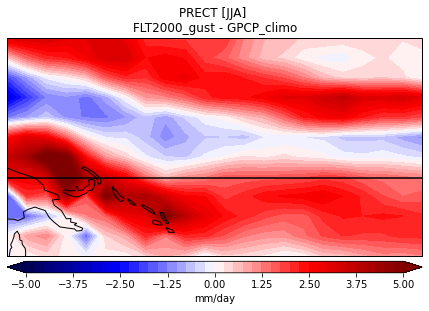

In [95]:
# Plot bias maps of precip
fig,axs =  plt.subplots(1,1, figsize=(10,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) 

# obsData  = regrid_TRMM_monthly.values * 1/(86400*1e3) 
obsData  = obsGrid.values
# compData = (86400*1e3) * regrid_ctrl.values
compData = (86400*1e3) * regrid_gust.values

diffs = compData - obsData

lims = np.arange(-5, 5.25, 0.25)  #PRECT in mm/d

c = axs.contourf(regrid_ctrl.lon.values, regrid_ctrl.lat.values, diffs, lims, 
                 extend='both', cmap='seismic',transform=ccrs.PlateCarree())
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.04])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,label='mm/day')

axs.axhline(-4, color='k')

axs.coastlines()

axs.set_title('PRECT [JJA] \n'+str(selDS_h0_mean.isel(case=1).case.values)+' - GPCP_climo')




Text(0.5, 1.0, 'PRECT[JJA] \nFLT2000_gust - FLT2000_ctrl')

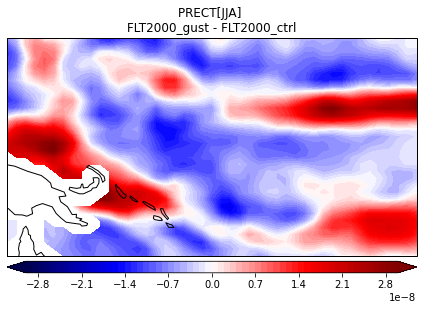

In [98]:
# Plot maps of variables and their changes? 
fig,axs =  plt.subplots(1,1, figsize=(10,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) 

ictrlCase = 0 
itestCase = 1

varSel = 'PRECT'

diffs = selDS_h0_mean[varSel].isel(case=itestCase) - selDS_h0_mean[varSel].isel(case=ictrlCase)

# lims = np.arange(-1.6, 1.7, 0.1)  #U10
# lims = np.arange(-30, 31, 1)  #LHFLX
lims = np.arange(-3e-8, 3.1e-8, 0.1e-8)  #PRECT

c = axs.contourf(diffs.lon.values, diffs.lat.values, fillOcnFrac_h0_mean[0,:,:] * diffs.values, lims, 
                 extend='both', cmap='seismic',transform=ccrs.PlateCarree())
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.04])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)

# axs.axhline(-4, color='k')

axs.coastlines()

axs.set_title(varSel+'[JJA] \n'+str(selDS_h0_mean.isel(case=itestCase).case.values)+' - '+str(selDS_h0_mean.isel(case=ictrlCase).case.values) )




Text(0.5, 1.0, 'UGUST[JJA] \nFLT2000_gust - FLT2000_ctrl')

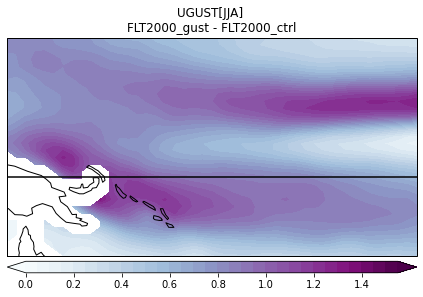

In [99]:
# Plot maps of variables and their changes? 
fig,axs =  plt.subplots(1,1, figsize=(10,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) 

ictrlCase = 0 
itestCase = 1

varSel = 'UGUST'

diffs = selDS_h0_mean[varSel].isel(case=itestCase) - selDS_h0_mean[varSel].isel(case=ictrlCase)

lims = np.arange(0, 1.6, 0.05)

c = axs.contourf(diffs.lon.values, diffs.lat.values, fillOcnFrac_h0_mean[0,:,:] * diffs.values, lims, 
                 extend='both', cmap='BuPu',transform=ccrs.PlateCarree())
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.04])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)

axs.axhline(-4, color='k')

axs.coastlines()

axs.set_title(varSel+'[JJA] \n'+str(selDS_h0_mean.isel(case=itestCase).case.values)+' - '+str(selDS_h0_mean.isel(case=ictrlCase).case.values) )




Text(0.5, 1.0, 'U10[JJA] \nFLT2000_gust')

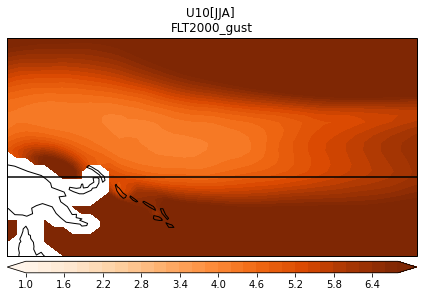

In [100]:
# Plot maps of variables and their changes? 
fig,axs =  plt.subplots(1,1, figsize=(10,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) 

ictrlCase = 1

varSel = 'U10'

diffs = selDS_h0_mean[varSel].isel(case=ictrlCase)

# lims = np.arange(60, 250, 5) #LHFLX
lims = np.arange(1, 7, 0.2) #U10
# lims = np.arange(0, 2e-7, 1e-9) #PRECC

c = axs.contourf(diffs.lon.values, diffs.lat.values, fillOcnFrac_h0_mean[0,:,:] * diffs.values, lims, 
                 extend='both', cmap='Oranges',transform=ccrs.PlateCarree())
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.04])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)

axs.axhline(-4, color='k')

axs.coastlines()

axs.set_title(varSel+'[JJA] \n'+str(selDS_h0_mean.isel(case=ictrlCase).case.values) )




Text(0.5, 1.0, 'PRECT[JJA] \n ERAI-JJA')

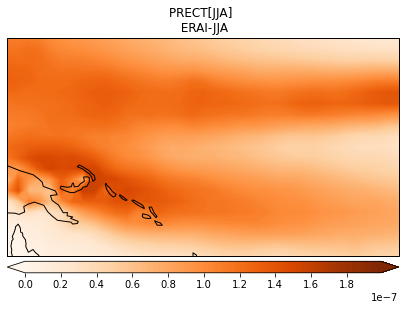

In [101]:
sel_erai_jja

# Plot maps of variables and their changes? 
fig,axs =  plt.subplots(1,1, figsize=(10,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) 

ictrlCase = 0

# varSel = 'LHFLX'
# valMultiplier = 1

varSel = 'PRECT'
valMultiplier = 1/86400000.0 

diffs = sel_erai_jja[varSel]

# lims = np.arange(60, 250, 5) #LHFLX
# lims = np.arange(1, 7, 0.2) #U10
lims = np.arange(0, 2e-7, 1e-9) #PRECC

c = axs.contourf(diffs.lon.values, diffs.lat.values, np.squeeze(diffs.values)*valMultiplier, lims, 
                 extend='both', cmap='Oranges',transform=ccrs.PlateCarree())
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.06, ax_position.width, 0.04])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax)


axs.coastlines()

axs.set_title(varSel+'[JJA] \n ERAI-JJA' )




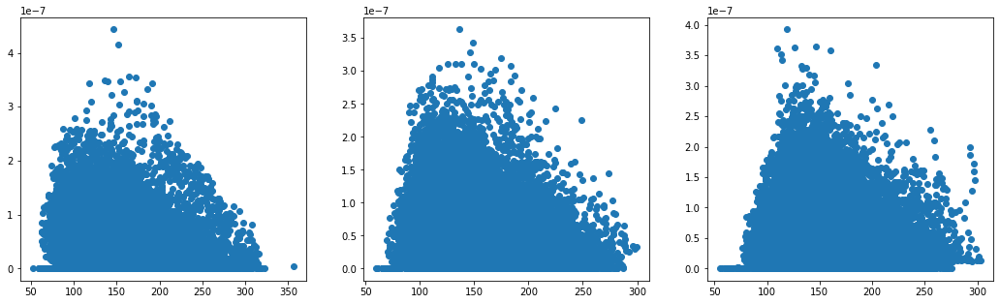

In [102]:
xVar = 'LHFLX'
yVar = 'PRECT'

fig,axs = plt.subplots(1,3,figsize=(18,5))
axs     = axs.ravel()

numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_h0[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:,:], [numEl,1]), 
            np.reshape(selDS_h0[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:,:], [numEl,1]), 
            'o')

axs[1].plot(np.reshape(selDS_h0[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:,:], [numEl,1]), 
            np.reshape(selDS_h0[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:,:], [numEl,1]), 
            'o')

axs[2].plot(np.reshape(selDS_h0[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:,:], [numEl,1]), 
            np.reshape(selDS_h0[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:,:], [numEl,1]), 
            'o')


In [102]:
## Use not the time mean, but focus only on where it's raining 
rainLim = 1.0 / (86400*1e3)  # convert limit from mm/d to m/s
selDS_raining = selDS_h0.where(selDS_h0.PRECT>=rainLim)

selDS_raining_lowWind = selDS_raining.where(selDS_raining.isel(case=0).U10<=5)


CorrCoef of U10 and LHFLX in FLT2000_ctrl = 0.6732
CorrCoef of U10 and LHFLX in FLT2000_gust = 0.8155
CorrCoef of U10 and LHFLX in FLT2000_gust_x2 = 0.7476


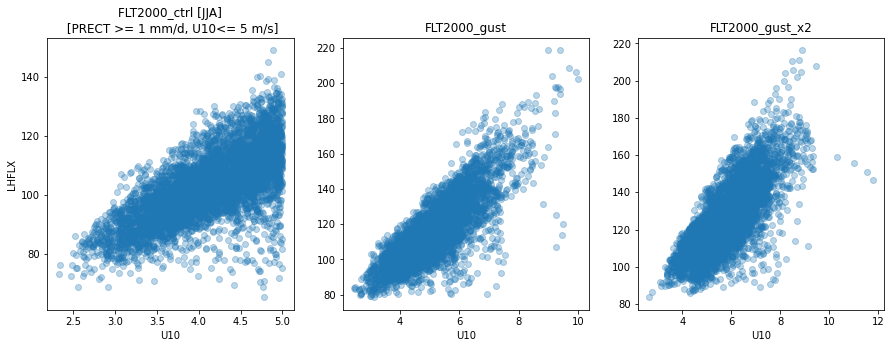

In [104]:
xVar = 'U10'
yVar = 'LHFLX'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_raining_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            np.reshape(selDS_raining_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_raining_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            np.reshape(selDS_raining_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_raining_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            np.reshape(selDS_raining_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_raining_lowWind.isel(case=0).case.values)+' [JJA]\n [PRECT >= 1 mm/d, U10<= 5 m/s]')
axs[1].set_title(selDS_raining_lowWind.isel(case=1).case.values)
axs[2].set_title(selDS_raining_lowWind.isel(case=2).case.values)


## Print corrs 
a = np.reshape(selDS_raining_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
b = np.reshape(selDS_raining_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_raining_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
b = np.reshape(selDS_raining_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_raining_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
b = np.reshape(selDS_raining_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_raining.isel(case=2).case.values), df.corr().values[0,1]))


In [100]:
# ERA5? 
# rainLim = 1.0 # limit in mm/d
# windLim = 5

# numEl = len(regridERA5_lhflx_sel.time.values)*len(regridERA5_lhflx_sel.lat.values)*len(regridERA5_lhflx_sel.lon.values)

# reshape_u10   = np.reshape(regridERA5_u10_sel.values*fillOcnFrac_h0[0,0,:,:], [numEl,1])
# reshape_prect = np.reshape(regridERA5_prect_sel.values*fillOcnFrac_h0[0,0,:,:], [numEl,1])
# reshape_lhflx = np.reshape(regridERA5_lhflx_sel.values*fillOcnFrac_h0[0,0,:,:], [numEl,1])

# iMatch = [] 
# for i in range(numEl): 
#     if ((reshape_prect[i]>=rainLim) & (reshape_u10[i]<=windLim) ):
#         iMatch = np.append(iMatch, i)

# iMatch = iMatch.astype(int)


# fig,axs = plt.subplots(1,3,figsize=(15,5))
# axs     = axs.ravel()

# axs[0].plot(reshape_u10[iMatch], reshape_prect[iMatch],'o',alpha=0.3)

# # axs[0].plot(np.reshape(regridERA5_u10_sel.values*fillOcnFrac_h0[0,0,:,:], [numEl,1]), 
# #             np.reshape(regridERA5_lhflx_sel.values*fillOcnFrac_h0[0,0,:,:], [numEl,1]), 
# #             'o', alpha=0.3)

# axs[0].set_xlabel('U10')
# axs[0].set_ylabel('PRECT')



CorrCoef of LHFLX and PRECC in FLT2000_ctrl = -0.3259
CorrCoef of LHFLX and PRECC in FLT2000_gust = -0.2443
CorrCoef of LHFLX and PRECC in FLT2000_gust_x2 = -0.1170


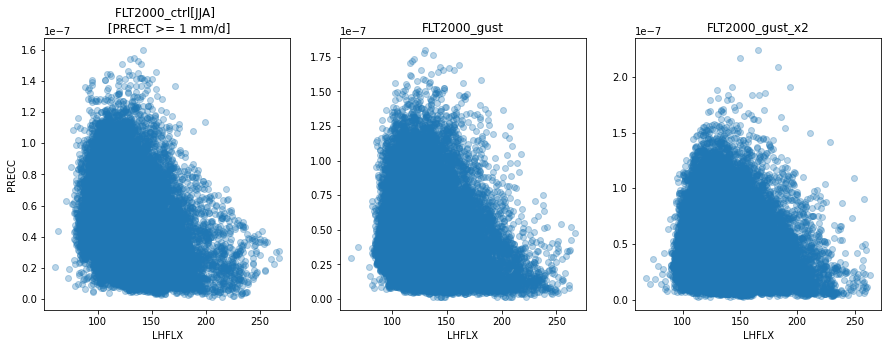

In [103]:
xVar = 'LHFLX'
yVar = 'PRECC'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_raining[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_raining[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_raining[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_raining.isel(case=0).case.values)+'[JJA] \n [PRECT >= 1 mm/d]')
axs[1].set_title(selDS_raining.isel(case=1).case.values)
axs[2].set_title(selDS_raining.isel(case=2).case.values)


## Print corrs 
a = np.reshape(selDS_raining[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_raining[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_raining[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_raining.isel(case=2).case.values), df.corr().values[0,1]))


CorrCoef of U10 and PRECC in FLT2000_ctrl = -0.3055
CorrCoef of U10 and PRECC in FLT2000_gust = -0.1886
CorrCoef of U10 and PRECC in FLT2000_gust_x2 = -0.0454


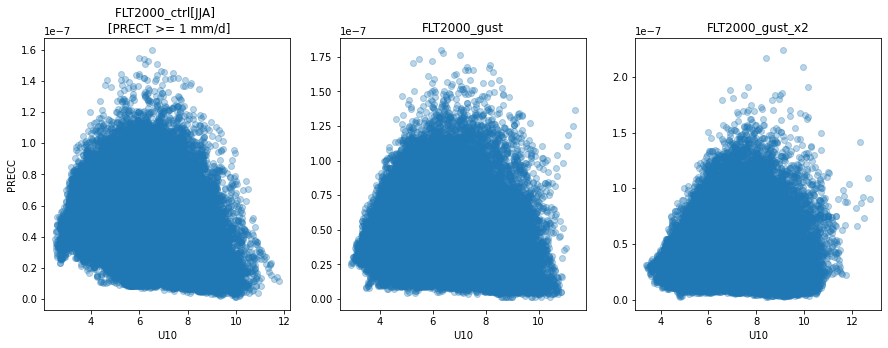

In [104]:
xVar = 'U10'
yVar = 'PRECC'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_raining[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_raining[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_raining[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            np.reshape(selDS_raining[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_raining.isel(case=0).case.values)+'[JJA] \n [PRECT >= 1 mm/d]')
axs[1].set_title(selDS_raining.isel(case=1).case.values)
axs[2].set_title(selDS_raining.isel(case=2).case.values)


## Print corrs 
a = np.reshape(selDS_raining[xVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=0).values*fillOcnFrac_h0[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_raining[xVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=1).values*fillOcnFrac_h0[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_raining[xVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
b = np.reshape(selDS_raining[yVar].isel(case=2).values*fillOcnFrac_h0[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_raining.isel(case=2).case.values), df.corr().values[0,1]))


**Use the mean values, where means are taken over all selected months**

CorrCoef of U10 and PRECC in FLT2000_ctrl = -0.5025
CorrCoef of U10 and PRECC in FLT2000_gust = -0.3627
CorrCoef of U10 and PRECC in FLT2000_gust_x2 = -0.2047


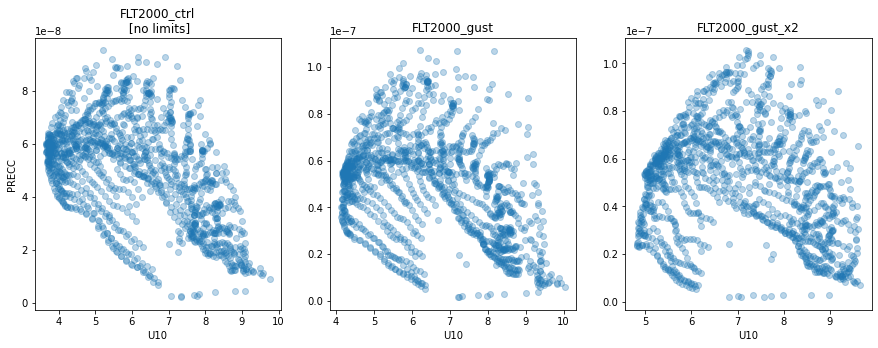

In [115]:
# xVar = 'U10'
# yVar = 'LHFLX'

# xVar = 'LHFLX'
# yVar = 'PRECC'

xVar = 'U10'
yVar = 'PRECC'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_h0_mean[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_h0_mean[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_h0_mean[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_h0_mean[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_h0_mean[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_h0_mean[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [no limits]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)


## Print corrs 
a = np.reshape(selDS_h0_mean[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
b = np.reshape(selDS_h0_mean[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_h0_mean[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
b = np.reshape(selDS_h0_mean[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_h0_mean[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
b = np.reshape(selDS_h0_mean[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=2).case.values), df.corr().values[0,1]))


In [105]:
## Break into a high/low latitude portion (dividing line, lat=-4) - for IO region

selDS_mean_lowLat = selDS_h0_mean.where(selDS_h0_mean.lat<=-4)
selDS_mean_highLat = selDS_h0_mean.where(selDS_h0_mean.lat>-4)

## Also identify based on other characteristics

selDS_mean_lowWind = selDS_h0_mean.where(selDS_h0_mean.isel(case=0).U10<=5)



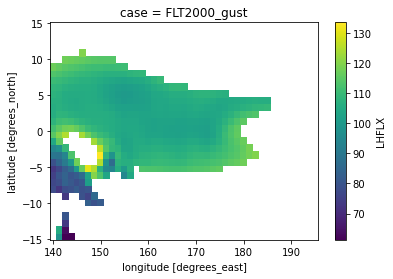

In [106]:
selDS_mean_lowWind.isel(case=1).LHFLX.plot()


Text(0.5, 1.0, 'FLT2000_gust_x2')

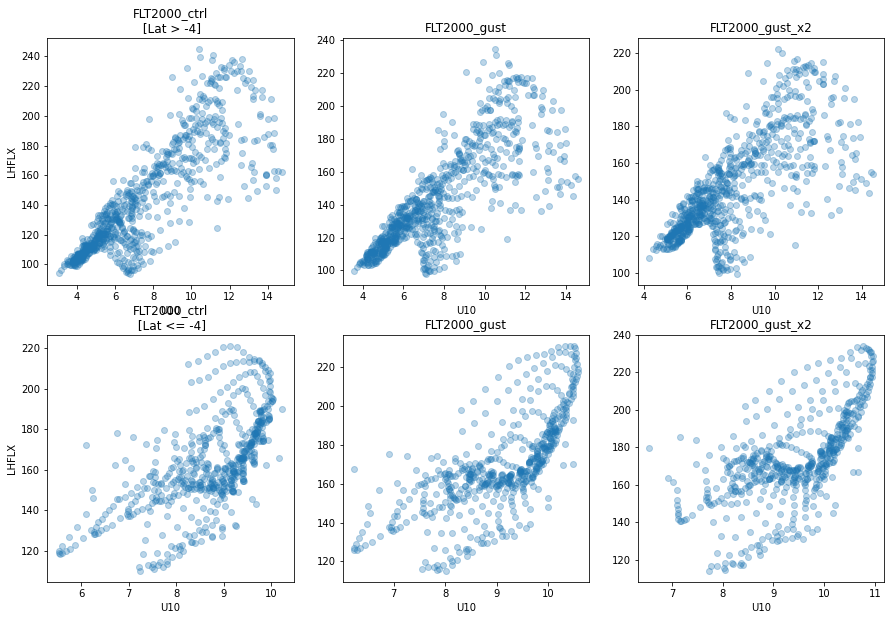

In [109]:
xVar = 'U10'
yVar = 'LHFLX'

fig,axs = plt.subplots(2,3,figsize=(15,10))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat > -4]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)


axs[3].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[4].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[5].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[3].set_xlabel(xVar)
axs[4].set_xlabel(xVar)
axs[5].set_xlabel(xVar)
axs[3].set_ylabel(yVar)

axs[3].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat <= -4]')
axs[4].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[5].set_title(selDS_h0_mean.isel(case=2).case.values)




Text(0.5, 1.0, 'FLT2000_gust_x2')

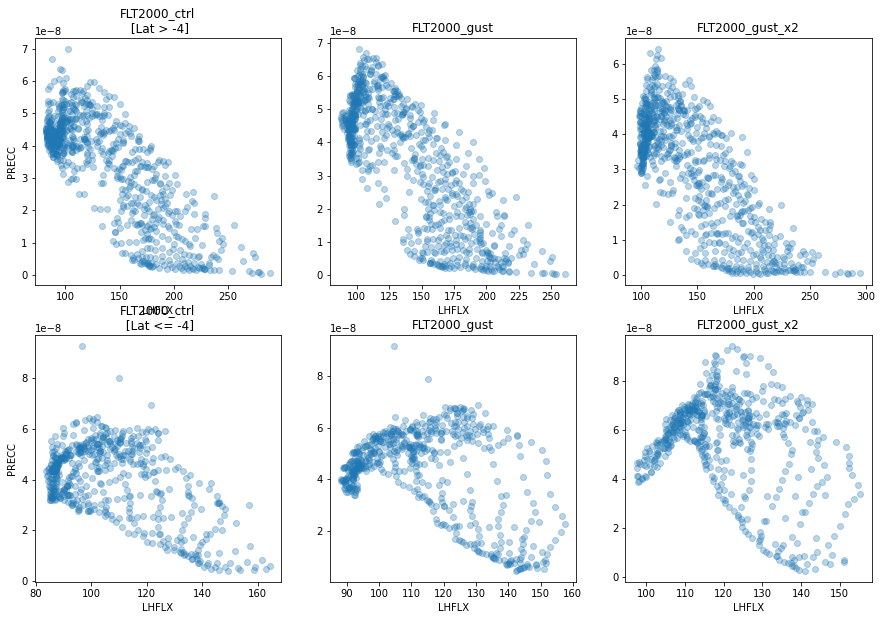

In [58]:
xVar = 'LHFLX'
yVar = 'PRECC'


fig,axs = plt.subplots(2,3,figsize=(15,10))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat > -4]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)


axs[3].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[4].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[5].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[3].set_xlabel(xVar)
axs[4].set_xlabel(xVar)
axs[5].set_xlabel(xVar)
axs[3].set_ylabel(yVar)

axs[3].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat <= -4]')
axs[4].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[5].set_title(selDS_h0_mean.isel(case=2).case.values)



Text(0.5, 1.0, 'FLT2000_gust_x2')

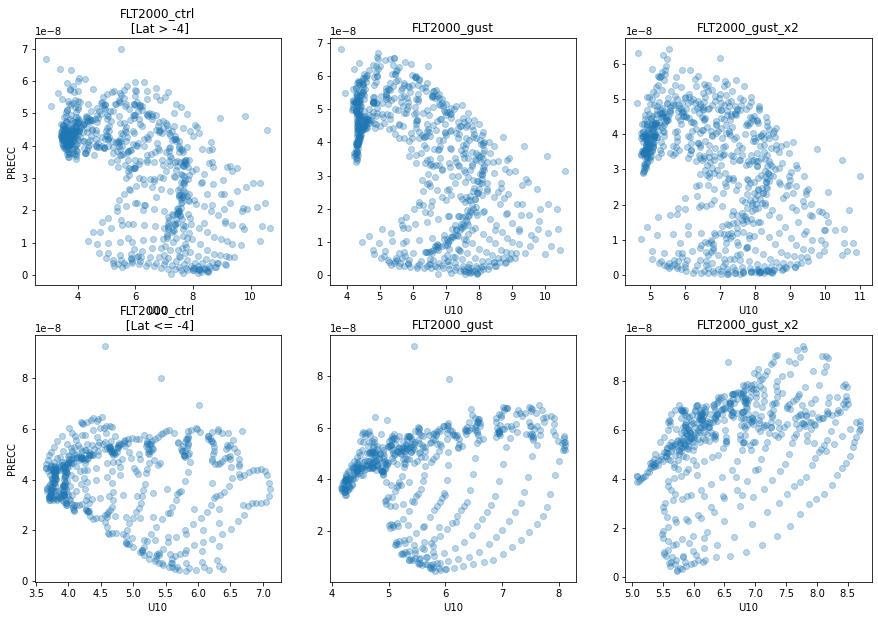

In [80]:
xVar = 'U10'
yVar = 'PRECC'


fig,axs = plt.subplots(2,3,figsize=(15,10))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_highLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_highLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat > -4]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)


axs[3].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[4].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[5].plot(np.reshape(selDS_mean_lowLat[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowLat[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[3].set_xlabel(xVar)
axs[4].set_xlabel(xVar)
axs[5].set_xlabel(xVar)
axs[3].set_ylabel(yVar)

axs[3].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [Lat <= -4]')
axs[4].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[5].set_title(selDS_h0_mean.isel(case=2).case.values)



CorrCoef of U10 and LHFLX in FLT2000_ctrl = 0.8040
CorrCoef of U10 and LHFLX in FLT2000_gust = 0.7539
CorrCoef of U10 and LHFLX in FLT2000_gust_x2 = 0.8006


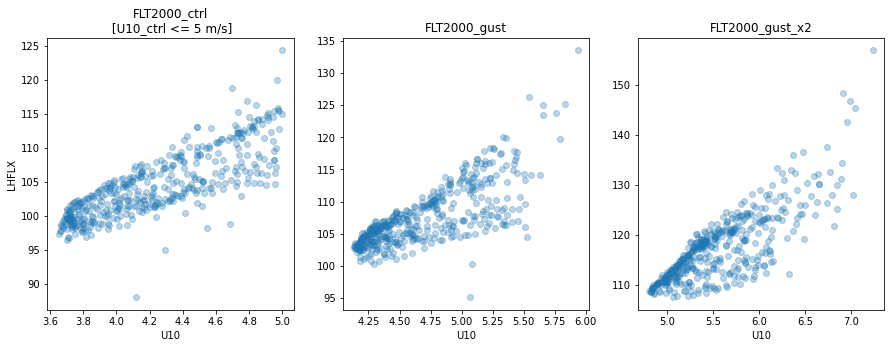

In [107]:
xVar = 'U10'
yVar = 'LHFLX'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [U10_ctrl <= 5 m/s]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)


## Print corrs 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=2).case.values), df.corr().values[0,1]))


CorrCoef of LHFLX and PRECT in FLT2000_ctrl = -0.0391
CorrCoef of LHFLX and PRECT in FLT2000_gust = 0.2143
CorrCoef of LHFLX and PRECT in FLT2000_gust_x2 = 0.5343


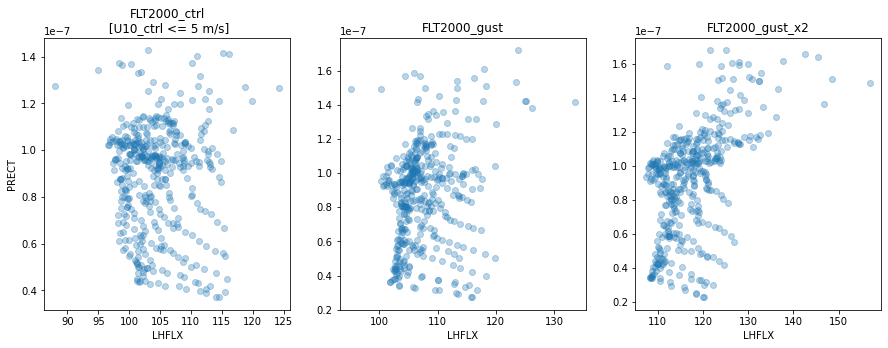

In [111]:
xVar = 'LHFLX'
yVar = 'PRECT'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [U10_ctrl <= 5 m/s]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)




## Print corrs 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=2).case.values), df.corr().values[0,1]))


CorrCoef of U10 and PRECT in FLT2000_ctrl = -0.0005
CorrCoef of U10 and PRECT in FLT2000_gust = 0.4202
CorrCoef of U10 and PRECT in FLT2000_gust_x2 = 0.7488


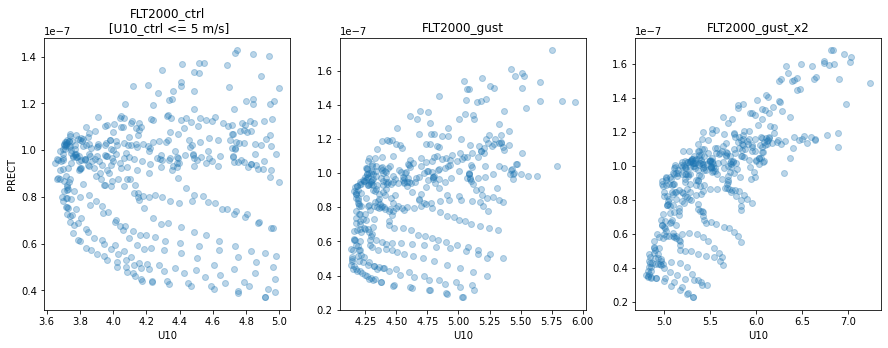

In [110]:
xVar = 'U10'
yVar = 'PRECT'

fig,axs = plt.subplots(1,3,figsize=(15,5))
axs     = axs.ravel()

# numEl = len(selDS_h0.time.values)*len(selDS_h0.lat.values)*len(selDS_h0.lon.values)
numEl = len(selDS_h0.lat.values)*len(selDS_h0.lon.values)

axs[0].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[1].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[2].plot(np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1]), 
            'o', alpha=0.3)

axs[0].set_xlabel(xVar)
axs[1].set_xlabel(xVar)
axs[2].set_xlabel(xVar)
axs[0].set_ylabel(yVar)

axs[0].set_title(str(selDS_h0_mean.isel(case=0).case.values)+'\n [U10_ctrl <= 5 m/s]')
axs[1].set_title(selDS_h0_mean.isel(case=1).case.values)
axs[2].set_title(selDS_h0_mean.isel(case=2).case.values)

# axs[0].set_xlim([2.5, 8.0])
# axs[1].set_xlim([2.5, 8.0])
# axs[2].set_xlim([2.5, 8.0])

# axs[0].set_ylim([0, 1e-7])
# axs[1].set_ylim([0, 1e-7])
# axs[2].set_ylim([0, 1e-7])

## Print corrs 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=0).values*fillOcnFrac_h0_mean[0,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=0).case.values), df.corr().values[0,1]))

## Next case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=1).values*fillOcnFrac_h0_mean[1,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=1).case.values), df.corr().values[0,1]))


## Third case 
a = np.reshape(selDS_mean_lowWind[xVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
b = np.reshape(selDS_mean_lowWind[yVar].isel(case=2).values*fillOcnFrac_h0_mean[2,:,:], [numEl,1])
df = pd.DataFrame({'a':np.squeeze(a)})
df['b'] = pd.Series(np.squeeze(b)) 

print('CorrCoef of %s and %s in %s = %.4f' % (xVar, yVar, str(selDS_h0_mean.isel(case=2).case.values), df.corr().values[0,1]))


### Distributions

In [124]:
def addRegions(axs):
    ## DJF
    axs.add_patch(patches.Rectangle(xy=[40, -15], width=65, height=30,  # Eq. IO
                                    facecolor='none', edgecolor='k',
                                    linewidth=2,
                                    transform=ccrs.PlateCarree()))

    axs.add_patch(patches.Rectangle(xy=[120, -15], width=60, height=30,  # Eq. WP
                                    facecolor='none', edgecolor='k',
                                    linewidth=2,
                                    transform=ccrs.PlateCarree()))

    # Midlatitude regions? 
    axs.add_patch(patches.Rectangle(xy=[150, -45], width=90, height=30,  # S. WP
                                    facecolor='none', edgecolor='grey',
                                    linewidth=2,linestyle='--',
                                    transform=ccrs.PlateCarree()))
    axs.add_patch(patches.Rectangle(xy=[110, 15], width=90, height=30,    # N. WP
                                    facecolor='none', edgecolor='grey',
                                    linewidth=2,linestyle='--',
                                    transform=ccrs.PlateCarree()))
    
    return 

In [125]:
def plotDistribution(minLat,maxLat,minLon,maxLon, regionTitle, 
                     DS_h1, DS_h0, varName, unitsString,
                     # DS_obs, obsVarName,
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=None, 
                     ):
    
    ## - - - - - - - - - - - - - - - - - 
    ## Select data     
    ## - - - - - - - - - - - - - - - - - 
    # Get season
    if season=='JJA':
        iTime_h1 = np.where( (DS_h1['time.month']>=monStart) & (DS_h1['time.month']<=monEnd) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']>=monStart) & (DS_h0['time.month']<=monEnd) )[0]
    elif season=='DJF':
        iTime_h1 = np.where( (DS_h1['time.month']==12) | (DS_h1['time.month']<=2) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']==12) | (DS_h0['time.month']<=2) )[0]
    
    # Get lat and lon too
    iLat  = np.where( (DS_h0['lat']>=minLat) & (DS_h0['lat']<=maxLat) )[0]
    iLon  = np.where( (DS_h0['lon']>=minLon) & (DS_h0['lon']<=maxLon) )[0]
    
    if timeFreq=='daily': 
        mainDS = DS_h1.isel(time=iTime_h1, lat=iLat, lon=iLon)
    elif timeFreq=='monthly':
        mainDS = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon)

    ## Get ocean mask 
    fillOcnFrac = np.full([len(mainDS.case.values), len(mainDS.time.values), len(mainDS.lat.values), len(mainDS.lon.values)], np.nan)
    fillOcnFrac[:,:,:,:] = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon).OCNFRAC.isel(case=0, time=12)
    fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

    ## - - - - - - - - - - - - - - - - - 
    ## Plot the distribution 
    ## - - - - - - - - - - - - - - - - - 

    oceanVar = mainDS[varName ]* valueMultiplier * fillOcnFrac

    if varMin: 
        oceanVar   = oceanVar.where(oceanVar>varMin)
        
    if varMax: 
        oceanVar   = oceanVar.where(oceanVar<varMax)


    numEl = len(oceanVar.lat.values)*len(oceanVar.lon.values)*len(oceanVar.time.values)  
    
    
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=0).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=0).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=1).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=1).case.values)}),
             # pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=2).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=2).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=3).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=3).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=4).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=4).case.values)}),
             ])

    # Make plot 
    g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                    log_scale=False, common_norm = False, alpha=0.7,
                     # palette=['grey','deepskyblue','blue','purple','deeppink'])
                     palette=['black','orangered','gray','darkorange'])

    g.ax.set_xlabel(unitsString,fontsize=16)
    g.ax.set_ylabel('Probability Density',fontsize=16)
    g.ax.tick_params(axis='both', labelsize= 14)
    g.ax.set_title(season+' '+regionTitle+' '+timeFreq+' '+varName+' (No avg in time/space)',fontsize=16)
    plt.setp(g._legend.get_title(), fontsize=14)
    plt.setp(g._legend.get_texts(), fontsize=14)

    
    return


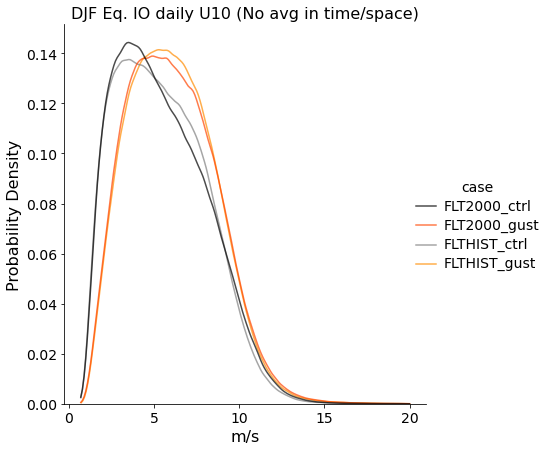

In [29]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=20, 
                     )


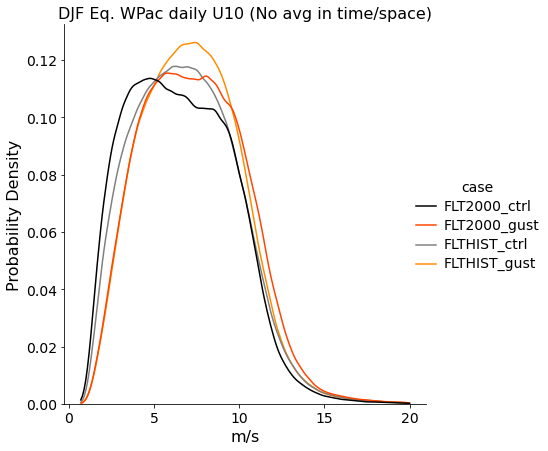

In [47]:
plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=20, 
                     )



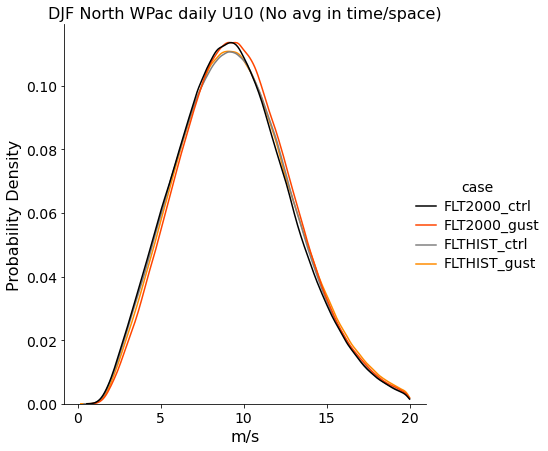

In [48]:
plotDistribution(15,45,110,200, 'North WPac', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=20, 
                     )


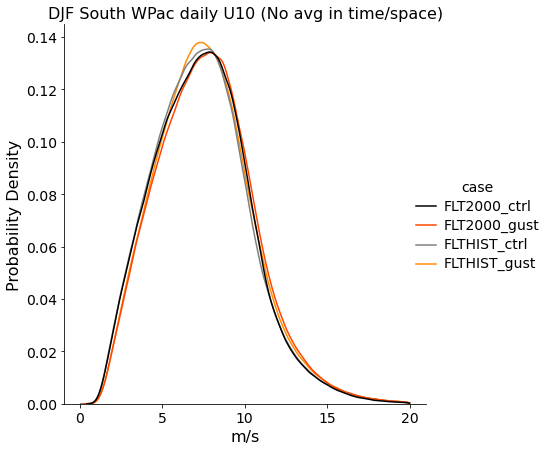

In [51]:
plotDistribution(-45,-15,150,240, 'South WPac', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=20, 
                     )


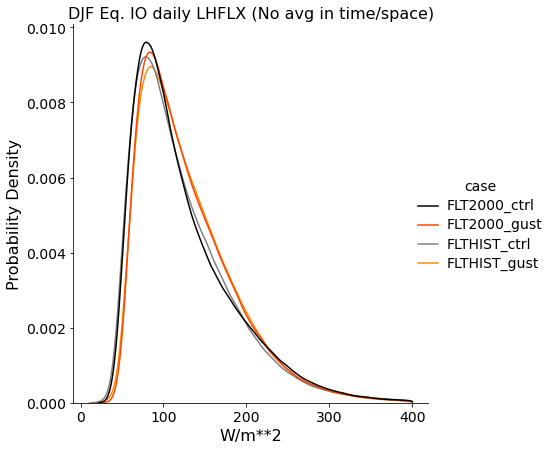

In [44]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=400,
                     )


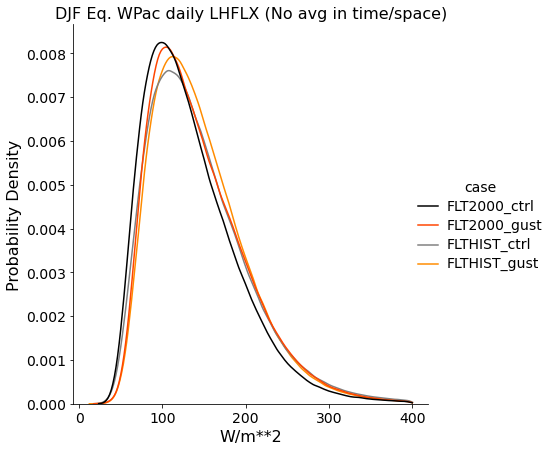

In [52]:
plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=400, 
                     )



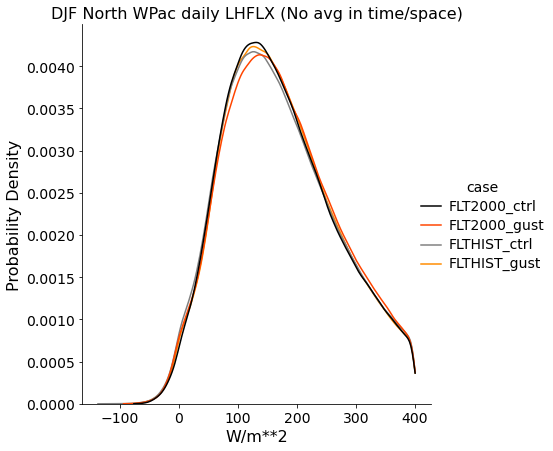

In [53]:
plotDistribution(15,45,110,200, 'North WPac', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=400, 
                     )


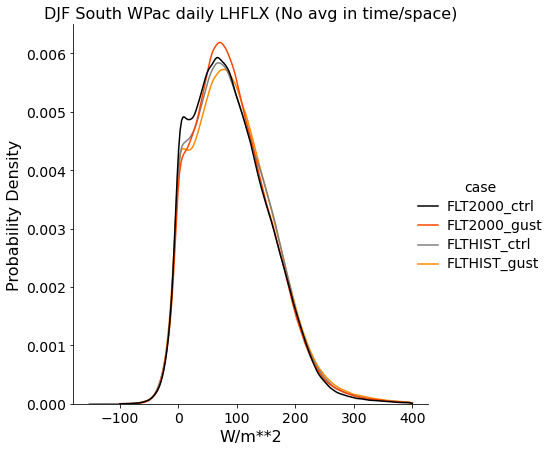

In [54]:
plotDistribution(-45,-15,150,240, 'South WPac', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=400, 
                     )


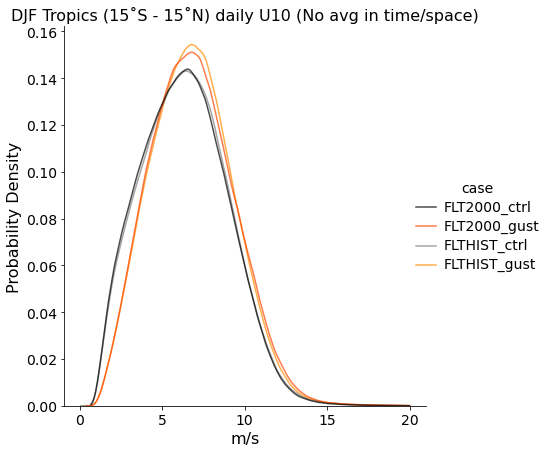

In [30]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=20, 
                     )


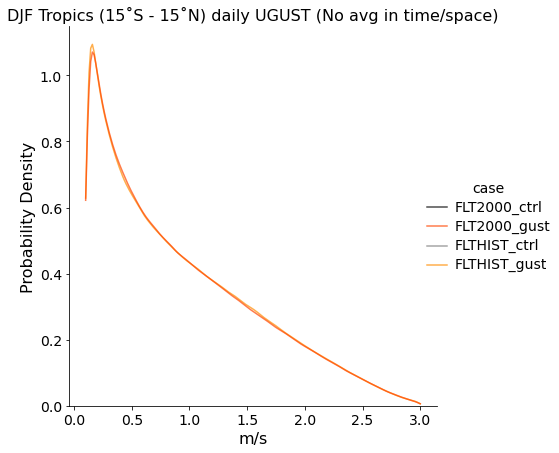

In [35]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'UGUST', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=0.1, varMax=3, 
                     )


In [ ]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=400, 
                     )


In [ ]:
plotDistribution(-5,5,0,360, 'Tropics (5˚S - 5˚N)', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=0, varMax=15, 
                     )


In [ ]:
plotDistribution(-5,5,0,360, 'Tropics (5˚S - 5˚N)', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=0, varMax=350, 
                     )


Isolate ENSO phases

In [ ]:
# Eq WPac: -15,15,120,180

In [210]:
np.shape(fillOcnFrac_h0)

(5, 192, 288)

In [249]:
fillOcnFrac_h0_mean

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [251]:
regionTitle = 'Eq. WPac'
season = 'DJF'

# Get lat and lon of region
iLat  = np.where( (all_h0_DJF_LaNina['lat']>=-15) & (all_h0_DJF_LaNina['lat']<=15) )[0]
iLon  = np.where( (all_h0_DJF_LaNina['lon']>=120) & (all_h0_DJF_LaNina['lon']<=180) )[0]

regionalDJF_ElNino  = all_h0_DJF_ElNino.isel(lat=iLat, lon=iLon)
regionalDJF_LaNina  = all_h0_DJF_LaNina.isel(lat=iLat, lon=iLon)
regionalDJF_Neutral = all_h0_DJF_Neutral.isel(lat=iLat, lon=iLon)
regionalDJF_allTimes = h0_DJF_allTimes.isel(lat=iLat, lon=iLon)


## Get ocean mask for each length of time 
# fillOcnFrac_ElNinoTemp = fillOcnFrac_h0_allTimes[0:len(all_h0_DJF_ElNino.time.values), :, :]
fillOcnFrac_ElNinoTemp = fillOcnFrac_h0_mean[iLat, :]
fillOcnFrac_ElNinoTemp = fillOcnFrac_ElNinoTemp[:, iLon]

# fillOcnFrac_LaNinaTemp = fillOcnFrac_h0_allTimes[0:len(all_h0_DJF_LaNina.time.values), :, :]
fillOcnFrac_LaNinaTemp = fillOcnFrac_h0_mean[iLat, :]
fillOcnFrac_LaNinaTemp = fillOcnFrac_LaNinaTemp[:, iLon]

# fillOcnFrac_NeutralTemp = fillOcnFrac_h0_allTimes[0:len(all_h0_DJF_Neutral.time.values), :, :]
fillOcnFrac_NeutralTemp = fillOcnFrac_h0_mean[iLat, :]
fillOcnFrac_NeutralTemp = fillOcnFrac_NeutralTemp[:, iLon]

# fillOcnFrac_AllTimesTemp = fillOcnFrac_h0_allTimes[:,:,:]
fillOcnFrac_AllTimesTemp = fillOcnFrac_h0_mean[iLat, :]
fillOcnFrac_AllTimesTemp = fillOcnFrac_AllTimesTemp[:, iLon]

fillOcnFrac_ElNino   = np.full([len(h0_DJF_allTimes.case.values), len(all_h0_DJF_ElNino.time.values), len(iLat), len(iLon)], np.nan)
fillOcnFrac_LaNina   = np.full([len(h0_DJF_allTimes.case.values), len(all_h0_DJF_LaNina.time.values), len(iLat), len(iLon)], np.nan)
fillOcnFrac_Neutral  = np.full([len(h0_DJF_allTimes.case.values), len(all_h0_DJF_Neutral.time.values), len(iLat), len(iLon)], np.nan)
fillOcnFrac_AllTimes = np.full([len(h0_DJF_allTimes.case.values), len(h0_DJF_allTimes.time.values),    len(iLat), len(iLon)], np.nan)

for iCase in range(len(h0_DJF_allTimes.case.values)): 
    fillOcnFrac_ElNino[iCase,:,:,:] = fillOcnFrac_ElNinoTemp
    fillOcnFrac_LaNina[iCase,:,:,:] = fillOcnFrac_LaNinaTemp
    fillOcnFrac_Neutral[iCase,:,:,:] = fillOcnFrac_NeutralTemp
    fillOcnFrac_AllTimes[iCase,:,:,:] = fillOcnFrac_AllTimesTemp

numEl_ElNino  = len(all_h0_DJF_ElNino.time.values)*len(iLat)*len(iLon)
numEl_LaNina  = len(all_h0_DJF_LaNina.time.values)*len(iLat)*len(iLon)
numEl_Neutral = len(all_h0_DJF_Neutral.time.values)*len(iLat)*len(iLon)
numEl_allTimes = len(h0_DJF_allTimes.time.values)*len(iLat)*len(iLon)


In [262]:
varSel = 'U10'
valueMultiplier = 1

varMask_ElNino   = regionalDJF_ElNino[varSel]* valueMultiplier * fillOcnFrac_ElNino
varMask_LaNina   = regionalDJF_LaNina[varSel]* valueMultiplier * fillOcnFrac_LaNina
varMask_Neutral  = regionalDJF_Neutral[varSel]* valueMultiplier * fillOcnFrac_Neutral
varMask_AllTimes = regionalDJF_allTimes[varSel]* valueMultiplier * fillOcnFrac_AllTimes




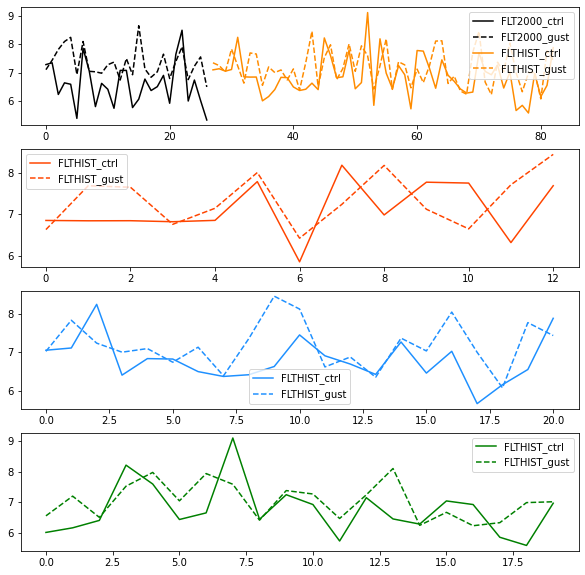

In [275]:
fig,axs = plt.subplots(4,1,figsize=(10,10) )
axs = axs.ravel()

axs[0].plot(varMask_AllTimes.isel(case=0).mean(dim='lat').mean(dim='lon').values, 'k', label=varMask_AllTimes.isel(case=0).case.values)
axs[0].plot(varMask_AllTimes.isel(case=1).mean(dim='lat').mean(dim='lon').values, 'k--', label=varMask_AllTimes.isel(case=1).case.values)
axs[0].plot(varMask_AllTimes.isel(case=3).mean(dim='lat').mean(dim='lon').values, color='darkorange', label=varMask_AllTimes.isel(case=3).case.values)
axs[0].plot(varMask_AllTimes.isel(case=4).mean(dim='lat').mean(dim='lon').values, '--', color='darkorange', label=varMask_AllTimes.isel(case=4).case.values)

axs[1].plot(varMask_ElNino.isel(case=3).mean(dim='lat').mean(dim='lon').values, color='orangered', label=varMask_AllTimes.isel(case=3).case.values)
axs[1].plot(varMask_ElNino.isel(case=4).mean(dim='lat').mean(dim='lon').values, '--', color='orangered', label=varMask_AllTimes.isel(case=4).case.values)

axs[2].plot(varMask_LaNina.isel(case=3).mean(dim='lat').mean(dim='lon').values, color='dodgerblue', label=varMask_AllTimes.isel(case=3).case.values)
axs[2].plot(varMask_LaNina.isel(case=4).mean(dim='lat').mean(dim='lon').values, '--', color='dodgerblue', label=varMask_AllTimes.isel(case=4).case.values)

axs[3].plot(varMask_Neutral.isel(case=3).mean(dim='lat').mean(dim='lon').values, color='green', label=varMask_AllTimes.isel(case=3).case.values)
axs[3].plot(varMask_Neutral.isel(case=4).mean(dim='lat').mean(dim='lon').values, '--', color='green', label=varMask_AllTimes.isel(case=4).case.values)


axs[0].legend()
axs[1].legend()
axs[2].legend()
axs[3].legend()


(20.0, 350.0)

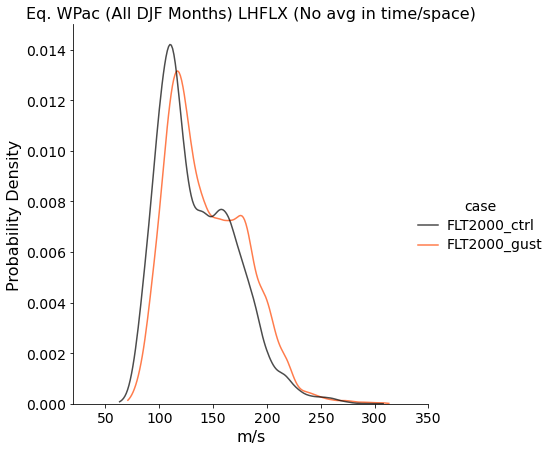

In [254]:
df2000 = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_AllTimes.isel(case=0).values.reshape(numEl_allTimes,1)), 'case': str(varMask_AllTimes.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_AllTimes.isel(case=1).values.reshape(numEl_allTimes,1)), 'case': str(varMask_AllTimes.isel(case=1).case.values)}),
          ])

# Make plot 
g = sns.displot(df2000, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, 
                 common_norm = False, alpha=0.7,
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['black','orangered'], ax=axs0)

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title(regionTitle+' (All DJF Months) '+varSel+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
# g.ax.set_xlim([0,16])
# g.ax.set_ylim([0,0.25])
g.ax.set_ylim([0,0.015])
g.ax.set_xlim([20,350])
# g.ax.set_ylim([0,1.5])
# g.ax.set_xlim([0.5,40])




(0.0, 0.25)

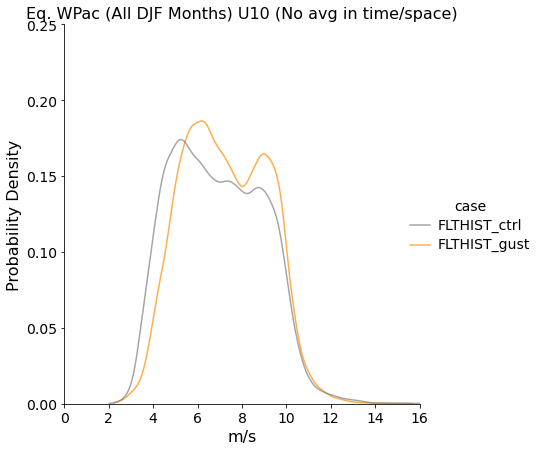

In [263]:
dfHIST = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_AllTimes.isel(case=3).values.reshape(numEl_allTimes,1)), 'case': str(varMask_AllTimes.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_AllTimes.isel(case=4).values.reshape(numEl_allTimes,1)), 'case': str(varMask_AllTimes.isel(case=4).case.values)}),
          ])

# Make plot 
g = sns.displot(dfHIST, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, 
                 common_norm = False, alpha=0.7,
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['gray','darkorange'], ax=axs0)

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title(regionTitle+' (All DJF Months) '+varSel+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
g.ax.set_xlim([0,16])
g.ax.set_ylim([0,0.25])
# g.ax.set_ylim([0,0.015])
# g.ax.set_xlim([20,350])
# g.ax.set_ylim([0,1.5])
# g.ax.set_xlim([0.5,40])




(20.0, 350.0)

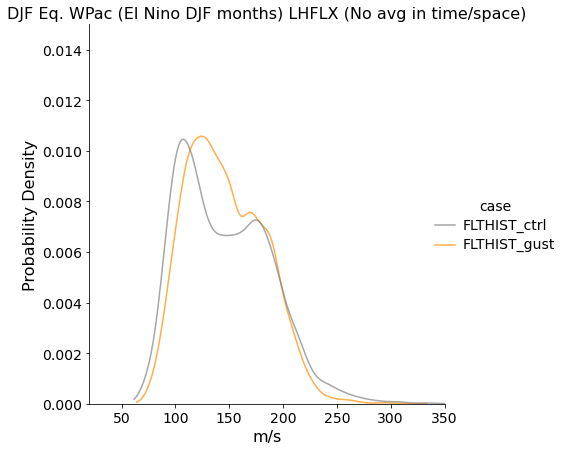

In [259]:
dfEN = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_ElNino.isel(case=3).values.reshape(numEl_ElNino,1)), 'case': str(varMask_AllTimes.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_ElNino.isel(case=4).values.reshape(numEl_ElNino,1)), 'case': str(varMask_AllTimes.isel(case=4).case.values)}),
          ])

# Make plot 
g = sns.displot(dfEN, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, 
                common_norm = False, alpha=0.7,
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['gray','darkorange'], ax=axs0)

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title(season+' '+regionTitle+' (El Nino DJF months) '+varSel+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
# g.ax.set_xlim([0,16])
# g.ax.set_ylim([0,0.25])
g.ax.set_ylim([0,0.015])
g.ax.set_xlim([20,350])
# g.ax.set_ylim([0,1.5])
# g.ax.set_xlim([0.5,40])


(20.0, 350.0)

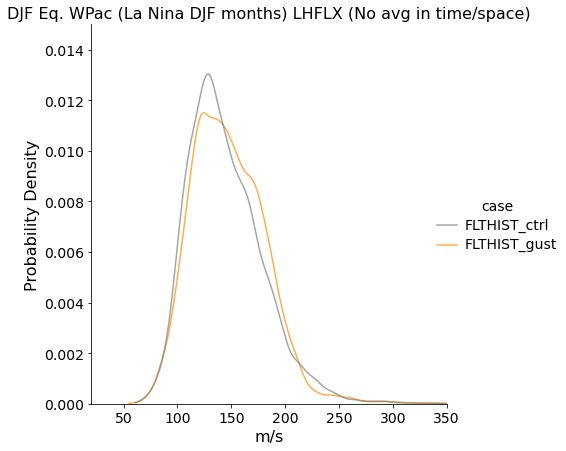

In [260]:
dfLN = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_LaNina.isel(case=3).values.reshape(numEl_LaNina,1)), 'case': str(varMask_AllTimes.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_LaNina.isel(case=4).values.reshape(numEl_LaNina,1)), 'case': str(varMask_AllTimes.isel(case=4).case.values)}),
          ])

# Make plot 
g = sns.displot(dfLN, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, 
                common_norm = False, alpha=0.7,
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['gray','darkorange'], ax=axs0)

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title(season+' '+regionTitle+' (La Nina DJF months) '+varSel+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
# g.ax.set_xlim([0,16])
# g.ax.set_ylim([0,0.25])
g.ax.set_ylim([0,0.015])
g.ax.set_xlim([20,350])
# g.ax.set_ylim([0,1.5])
# g.ax.set_xlim([0.5,40])


(20.0, 350.0)

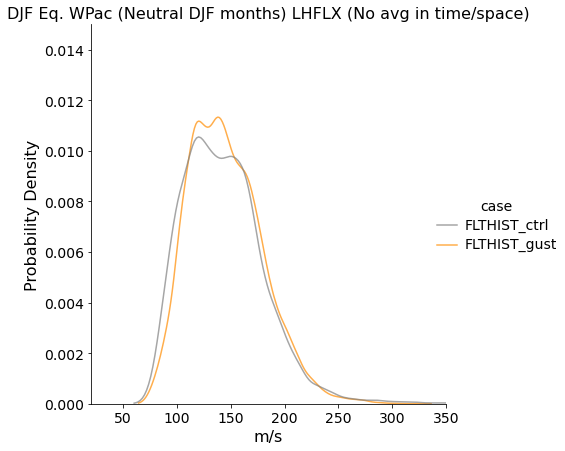

In [261]:

dfNeut = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_Neutral.isel(case=3).values.reshape(numEl_Neutral,1)), 'case': str(varMask_AllTimes.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({varSel: np.squeeze(varMask_Neutral.isel(case=4).values.reshape(numEl_Neutral,1)), 'case': str(varMask_AllTimes.isel(case=4).case.values)}),
          ])

# Make plot 
g = sns.displot(dfNeut, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, 
                common_norm = False, alpha=0.7,
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['gray','darkorange'], ax=axs0)

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title(season+' '+regionTitle+' (Neutral DJF months) '+varSel+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)
# g.ax.set_xlim([0,16])
# g.ax.set_ylim([0,0.25])
g.ax.set_ylim([0,0.015])
g.ax.set_xlim([20,350])
# g.ax.set_ylim([0,1.5])
# g.ax.set_xlim([0.5,40])


Add observations

In [78]:
def plotDistribution(minLat,maxLat,minLon,maxLon, regionTitle, 
                     DS_h1, DS_h0, varName, unitsString,
                     DS_obs, obsVarName,
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=None, 
                     ):
    
    ## - - - - - - - - - - - - - - - - - 
    ## Select data     
    ## - - - - - - - - - - - - - - - - - 
    # Get season
    if season=='JJA':
        iTime_h1 = np.where( (DS_h1['time.month']>=monStart) & (DS_h1['time.month']<=monEnd) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']>=monStart) & (DS_h0['time.month']<=monEnd) )[0]
        iTime_obs = np.where( (DS_obs['time.month']>=monStart) & (DS_obs['time.month']<=monEnd) )[0]
    elif season=='DJF':
        iTime_h1 = np.where( (DS_h1['time.month']==12) | (DS_h1['time.month']<=2) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']==12) | (DS_h0['time.month']<=2) )[0]
        iTime_obs = np.where( (DS_obs['time.month']==12) | (DS_obs['time.month']<=2) )[0]
    
    # Get lat and lon too
    iLat  = np.where( (DS_h0['lat']>=minLat) & (DS_h0['lat']<=maxLat) )[0]
    iLon  = np.where( (DS_h0['lon']>=minLon) & (DS_h0['lon']<=maxLon) )[0]
    
     
    
    if timeFreq=='daily': 
        mainDS = DS_h1.isel(time=iTime_h1, lat=iLat, lon=iLon)
    elif timeFreq=='monthly':
        mainDS = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon)
        
    selObs = DS_obs.isel(time=iTime_obs, lat=iLat, lon=iLon)

    ## Get ocean mask 
    fillOcnFrac = np.full([len(mainDS.case.values), len(mainDS.time.values), len(mainDS.lat.values), len(mainDS.lon.values)], np.nan)
    fillOcnFrac[:,:,:,:] = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon).OCNFRAC.isel(case=0, time=12)
    fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

    ## - - - - - - - - - - - - - - - - - 
    ## Plot the distribution 
    ## - - - - - - - - - - - - - - - - - 

    oceanVar = mainDS[varName]* valueMultiplier * fillOcnFrac
    
    obsVar = selObs[obsVarName] * fillOcnFrac[0,0:len(selObs.time.values),:,:]

    if varMin: 
        oceanVar   = oceanVar.where(oceanVar>varMin)
        obsVar     = obsVar.where(obsVar>varMin)

    if varMax: 
        oceanVar   = oceanVar.where(oceanVar<varMax)
        obsVar     = obsVar.where(obsVar<varMax)


    numEl = len(oceanVar.lat.values)*len(oceanVar.lon.values)*len(oceanVar.time.values)  
    numEl_obs = len(obsVar.lat.values)*len(obsVar.lon.values)*len(obsVar.time.values)

    
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=0).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=0).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=1).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=1).case.values)}),
             # pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=2).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=2).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=3).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=3).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=4).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=4).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(obsVar.values.reshape(numEl_obs,1)), 'case': 'ERA5'}),
             ])

    # Make plot 
    g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                    log_scale=True, common_norm = False, alpha=0.7,
                     # palette=['grey','deepskyblue','blue','purple','deeppink'])
                     palette=['black','orangered','gray','darkorange','blue'])

    g.ax.set_xlabel(unitsString,fontsize=16)
    g.ax.set_ylabel('Probability Density',fontsize=16)
    g.ax.tick_params(axis='both', labelsize= 14)
    # g.ax.set_title(season+' '+regionTitle+' '+timeFreq+' '+varName+' (No avg in time/space)',fontsize=16)
    g.ax.set_title(season+' '+regionTitle+' '+timeFreq+' '+varName, fontsize=16)
    plt.setp(g._legend.get_title(), fontsize=14)
    plt.setp(g._legend.get_texts(), fontsize=14)

    
    return

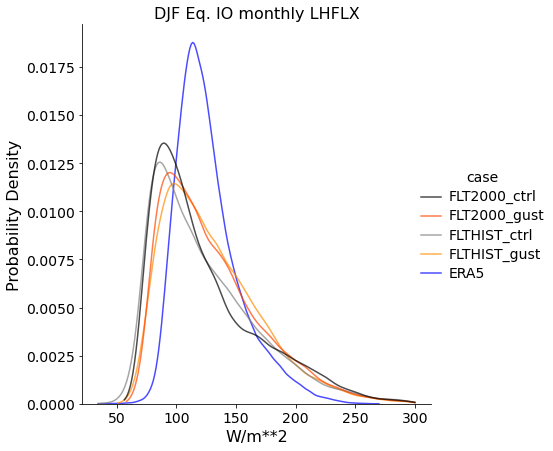

In [51]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     regridERA5,'slhf', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=300,
                     )


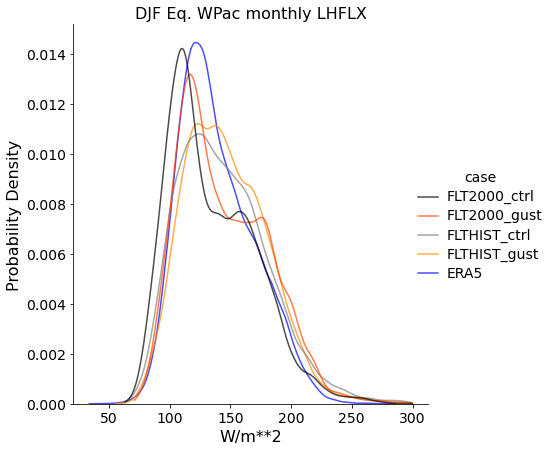

In [47]:
plotDistribution(-15,15,120,180, 'Eq. WPac',
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     regridERA5,'slhf', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=300,
                     )


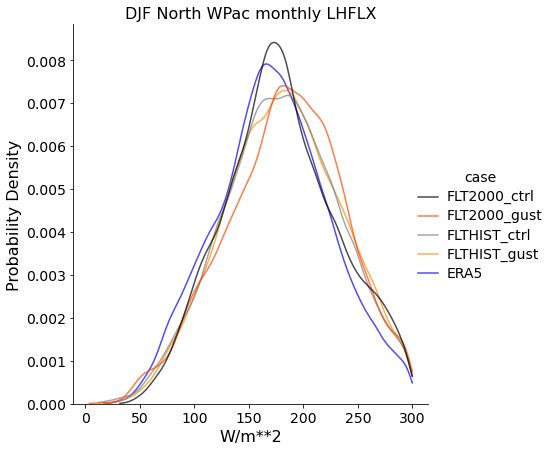

In [48]:
plotDistribution(15,45,110,200, 'North WPac',
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     regridERA5,'slhf', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=300,
                     )


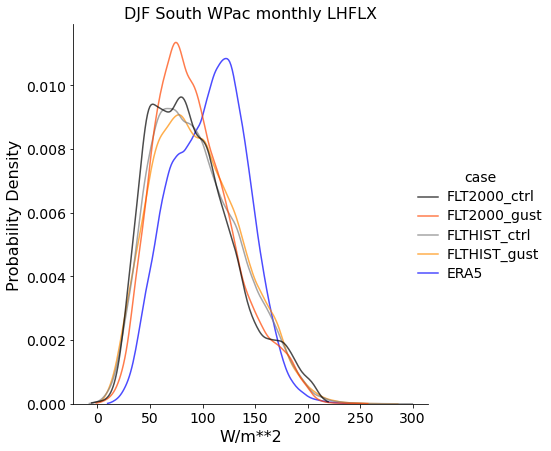

In [49]:
plotDistribution(-45,-15,150,240, 'South WPac',
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     regridERA5,'slhf', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=300,
                     )


Precipitation distributions (set logscale=True in function)

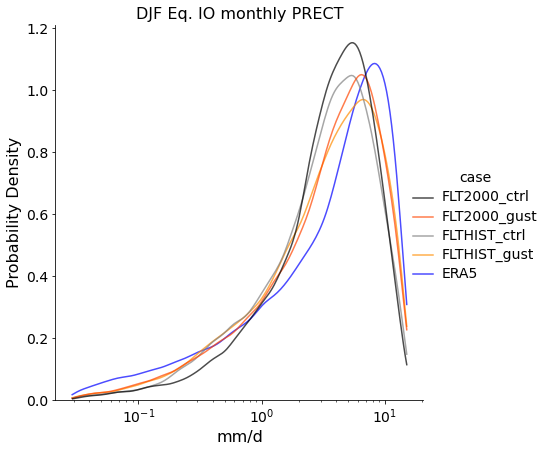

In [98]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     regridERA5,'tp', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=15,
                     )


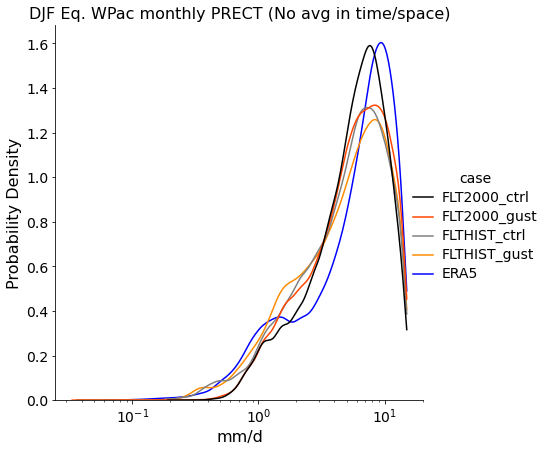

In [70]:
plotDistribution(-15,15,120,180, 'Eq. WPac',
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     regridERA5,'tp', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=15,
                     )


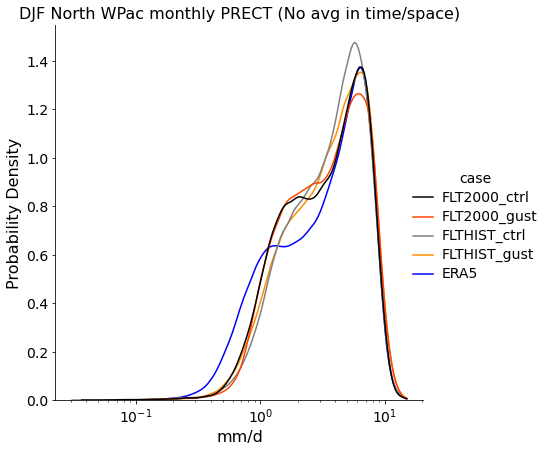

In [71]:
plotDistribution(15,45,110,200, 'North WPac',
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     regridERA5,'tp', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=15,
                     )


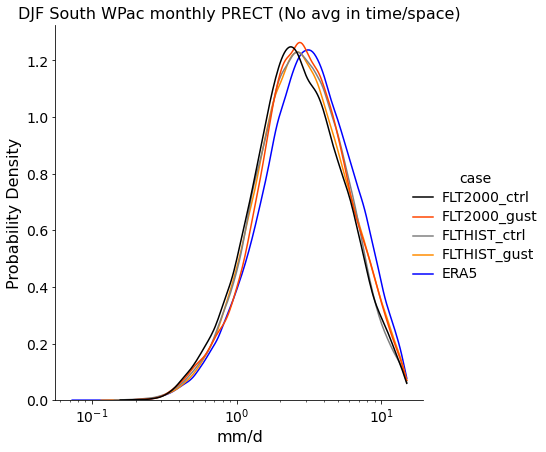

In [72]:
plotDistribution(-45,-15,150,240, 'South WPac',
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     regridERA5,'tp', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=15,
                     )


Full tropics

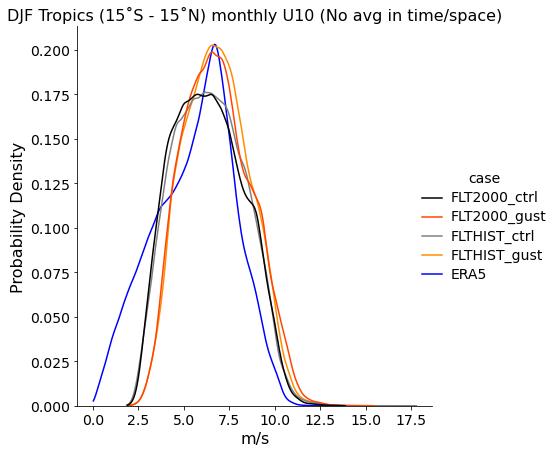

In [80]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     regridERA5,'U10', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=None,
                     )


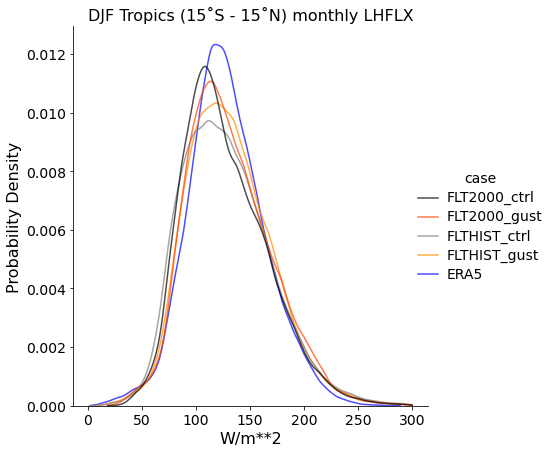

In [52]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     regridERA5,'slhf', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=0, varMax=300,
                     )


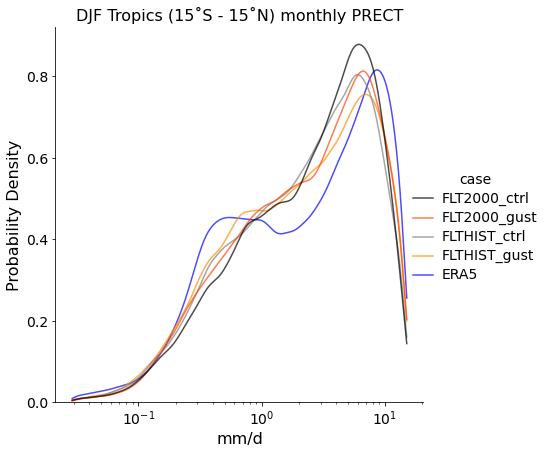

In [55]:
plotDistribution(-15,15,0,360, 'Tropics (15˚S - 15˚N)', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     regridERA5,'tp', 
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=15,
                     )


In [100]:
## Read in daily ERA5 PRECT too?
fileName = '/glade/work/rneale/data/ERA5/PRECT.day.mean.leap.nc'
era5_daily = xr.open_dataset(fileName, decode_times=True)



In [101]:
era5_daily

<xarray.Dataset>
Dimensions:    (time: 12784, bnds: 2, lon: 360, lat: 180)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01T11:00:00 ... 2014-12-31T11:00:00
  * lon        (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 356.0 357.0 358.0 359.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    tp         (time, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.2 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Sat Nov  4 11:09:38 2023: ncrcat precip_test_era5_download_...
    frequency:    day
    CDO:          Climate Data Operators version 2.0.1 (https://mpimet.mpg.de...
    NCO:          netCDF Operators version 5.1.4 (Homepage = http://nco.sf.ne...

In [77]:
## Select a range of years and 

# monStart = 6
# monEnd   = 8

# ## Tropical NW Pacific (domain in Harrop et al.)
# minLat     = 5
# maxLat     = 25
# minLon     = 110
# maxLon     = 150   # Expanded domain

# # IO ocean domain -- test expanding
# minLat     = -15
# maxLat     = 15
# minLon     = 50
# maxLon     = 110  


# ## Eq. W. Pac ocean domain 
# minLat      = -15
# maxLat      = 15
# minLon      = 120
# maxLon      = 180   
# regionTitle = 'Eq. WPac'

# IO ocean domain -- green rectangle
minLat     = -15
maxLat     = 15
minLon     = 40
maxLon     = 105  
regionTitle = 'Eq. IO'

# # N. W Pac domain -- blue rectangle
# minLat     = 15
# maxLat     = 45
# minLon     = 110
# maxLon     = 200  
# regionTitle = 'N. WPac'

# # N. W Pac domain -- blue rectangle
# minLat     = -45
# maxLat     = -15
# minLon     = 150
# maxLon     = 240  
# regionTitle = 'S. WPac'


# Full tropics
minLat     = -15
maxLat     = 15
minLon     = 0
maxLon     = 359  
regionTitle = 'Tropics (15S-15N)'


#JJA
# iTime = np.where( (all_h1['time.month']>=monStart) & (all_h1['time.month']<=monEnd) )[0]
# #DJF
iTime = np.where( (all_h1['time.month']==12) | (all_h1['time.month']<=2) )[0]
# Get lat and lon too
iLat  = np.where( (all_h1['lat']>=minLat) & (all_h1['lat']<=maxLat) )[0]
iLon  = np.where( (all_h1['lon']>=minLon) & (all_h1['lon']<=maxLon) )[0]
selDS    = all_h1.isel(time=iTime, lat=iLat, lon=iLon)

# JJA
# iTime = np.where( (all_h0['time.month']>=monStart) & (all_h0['time.month']<=monEnd) )[0]
# # DJF
iTime = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
# Get lat and lon too
iLat  = np.where( (all_h0['lat']>=minLat) & (all_h0['lat']<=maxLat) )[0]
iLon  = np.where( (all_h0['lon']>=minLon) & (all_h0['lon']<=maxLon) )[0]
selDS_h0 = all_h0.isel(time=iTime, lat=iLat, lon=iLon)

# TRMM daily data 
ilat3 = np.where( (trmmDS.lat.values>=minLat) & (trmmDS.lat.values<=maxLat) )[0]
ilon3 = np.where( (trmmDS.lon.values>=minLon) & (trmmDS.lon.values<=maxLon) )[0]
# iTime3 = np.where( (trmmDS['time.month']>=monStart) & (trmmDS['time.month']<=monEnd) & (trmmDS['time.year']>=1996) )[0]
iTime3 = np.where( (trmmDS['time.month']==12) | (trmmDS['time.month']<=2) & (trmmDS['time.year']>=1996) )[0]
sel_TRMM = trmmDS.isel(time=iTime3, lat=ilat3, lon=ilon3)
                           
## ERA5 daily data 
ilat4 = np.where( (regridERA5_prectDaily.lat.values>=minLat) & (regridERA5_prectDaily.lat.values<=maxLat) )[0]
ilon4 = np.where( (regridERA5_prectDaily.lon.values>=minLon) & (regridERA5_prectDaily.lon.values<=maxLon) )[0]
iTime4 = np.where( (regridERA5_prectDaily['time.month']==12) | (regridERA5_prectDaily['time.month']<=2) & 
                  (regridERA5_prectDaily['time.year']>=1996) )[0]
sel_ERA5 = regridERA5_prectDaily.isel(time=iTime4, lat=ilat4, lon=ilon4)
    
    # regridERA5_prectDaily

In [78]:
regrid_TRMM = regrid_data(sel_TRMM, selDS, method=1)['precip']

# Use the same days in SCAM that we have TRMM obs for... 
keepTimes = []

for iT in range(len(regrid_TRMM.time.values)): 
    iMatch = np.where( (selDS['time.year'].values==regrid_TRMM['time.year'].values[iT]) &
                       (selDS['time.month'].values==regrid_TRMM['time.month'].values[iT]) & 
                       (selDS['time.day'].values==regrid_TRMM['time.day'].values[iT]) )[0]

    if len(iMatch)>0: 
        keepTimes = np.append(keepTimes, iMatch)
    
keepTimes       = keepTimes.astype(int)

selDS_TRMMtimes = selDS.isel(time=keepTimes)

In [79]:
fillOcnFrac = np.full([5, len(selDS.time.values), len(selDS.lat.values), len(selDS.lon.values)], np.nan)
fillOcnFrac[:,:,:,:] = selDS_h0.OCNFRAC.isel(case=0, time=12)
fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

fillOcnFrac_TRMMtimes = np.full([5, len(selDS_TRMMtimes.time.values), len(selDS_TRMMtimes.lat.values), len(selDS_TRMMtimes.lon.values)], np.nan)
fillOcnFrac_TRMMtimes[:,:,:,:] = selDS_h0.OCNFRAC.isel(case=0, time=12)
fillOcnFrac_TRMMtimes[np.where(fillOcnFrac_TRMMtimes!=1)] = np.nan


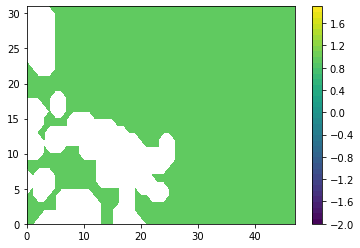

In [93]:
plt.contourf(fillOcnFrac[0,10,:,:], np.arange(-2,2,0.1))
plt.colorbar()


In [95]:
np.shape(regrid_TRMM)

(1444, 32, 48)

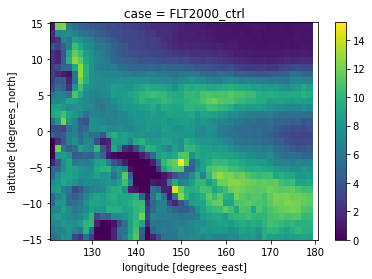

In [97]:
ocnTRMM.mean(dim='time').plot()

[None, None, None, None, None, None, None, None, None, None, None, None]

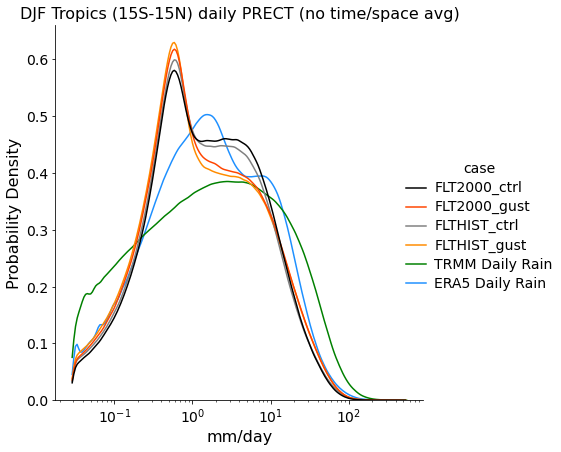

In [80]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = selDS.PRECT * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnRain = rain_newUnits * fillOcnFrac
ocnTRMM = regrid_TRMM * selDS_h0.OCNFRAC.isel(case=0, time=6) 
ocnERA5 = sel_ERA5 * selDS_h0.OCNFRAC.isel(case=0, time=6) *24

TRMM_rain = ocnTRMM.where((ocnTRMM)>0.029)
ERA5_rain = ocnERA5.where((ocnERA5)>0.029) 
ocnRain   = ocnRain.where(ocnRain>0.029)

# ocnRain = ocnRain.mean(dim='time')
# TRMM_rain = TRMM_rain.mean(dim='time')

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)  # "precip", in mm/day
numEl_TRMM = len(TRMM_rain.lat.values)*len(TRMM_rain.lon.values)*len(TRMM_rain.time.values)
numEl_ERA5 = len(ERA5_rain.lat.values)*len(ERA5_rain.lon.values)*len(ERA5_rain.time.values)
# numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)  # "precip", in mm/day
# numEl_TRMM = len(TRMM_rain.lat.values)*len(TRMM_rain.lon.values)


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(TRMM_rain.values.reshape(numEl_TRMM,1)), 'case': str('TRMM Daily Rain')}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ERA5_rain.values.reshape(numEl_ERA5,1)), 'case': str('ERA5 Daily Rain')}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, common_norm = False, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['black','orangered','gray','darkorange','green','dodgerblue'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('DJF '+regionTitle+' daily PRECT (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)



[None, None, None, None, None, None]

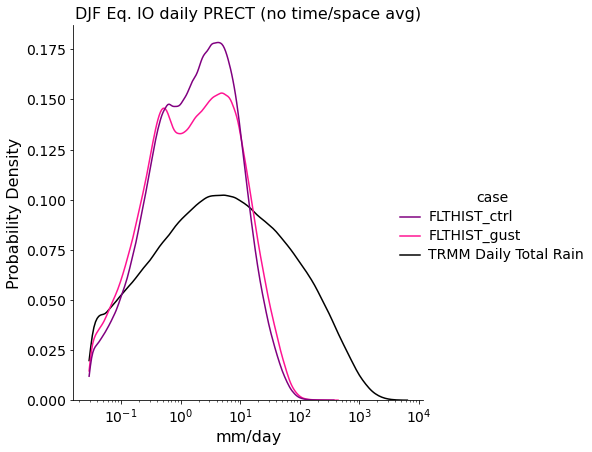

In [146]:
# valueMultiplier = (24*3600*1e3)
# unitsString = 'mm/day'

# # rain_newUnits = selDS.PRECT * valueMultiplier
# rain_newUnits = selDS_TRMMtimes.PRECT * valueMultiplier

# # ocnRain = rain_newUnits * selDS_h0.OCNFRAC
# ocnRain = rain_newUnits * fillOcnFrac_TRMMtimes

# ocnRain = ocnRain.where(ocnRain>0.029)

# numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

# dfReal = pd.concat(axis=0, ignore_index=True, objs=[
#          # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
#          # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
#          # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
#          pd.DataFrame.from_dict({'Rain rate': np.squeeze(TRMM_rain.values.reshape(numEl_TRMM,1)), 'case': str('TRMM Daily Total Rain')}),

#          ])

# # Make plot 
# g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
#                 log_scale=True, 
#                  # palette=['grey','deepskyblue','blue','purple','deeppink'])
#                  palette=['purple','deeppink','black'])

# g.ax.set_xlabel(unitsString,fontsize=16)
# g.ax.set_ylabel('Probability Density',fontsize=16)
# g.ax.tick_params(axis='both', labelsize= 14)
# g.ax.set_title('DJF '+regionTitle+' daily PRECT (no time/space avg)',fontsize=16)
# plt.setp(g._legend.get_title(), fontsize=14)
# plt.setp(g._legend.get_texts(), fontsize=14)



[None, None, None, None, None, None]

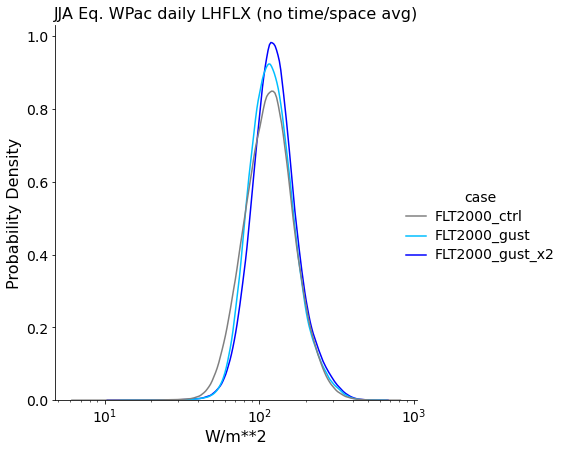

In [123]:
valueMultiplier = 1
unitsString = 'W/m**2'

varSel = selDS.LHFLX * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnVar = varSel * fillOcnFrac

numEl = len(ocnVar.lat.values)*len(ocnVar.lon.values)*len(ocnVar.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'LHFLX': np.squeeze(ocnVar.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({'LHFLX': np.squeeze(ocnVar.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({'LHFLX': np.squeeze(ocnVar.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=2).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='LHFLX', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['grey','deepskyblue','blue'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily LHFLX (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)


[None, None, None, None]

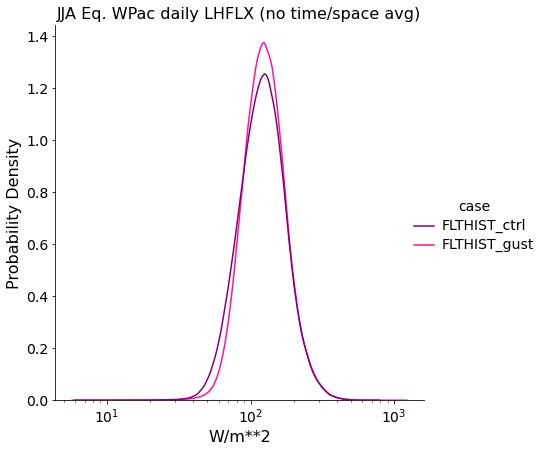

In [124]:
valueMultiplier = 1
unitsString = 'W/m**2'

varSel = selDS.LHFLX * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnVar = varSel * fillOcnFrac

numEl = len(ocnVar.lat.values)*len(ocnVar.lon.values)*len(ocnVar.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnVar.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=0).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnVar.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=1).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnVar.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({'LHFLX': np.squeeze(ocnVar.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({'LHFLX': np.squeeze(ocnVar.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnVar.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='LHFLX', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['purple','deeppink'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily LHFLX (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)


[None, None, None, None, None, None]

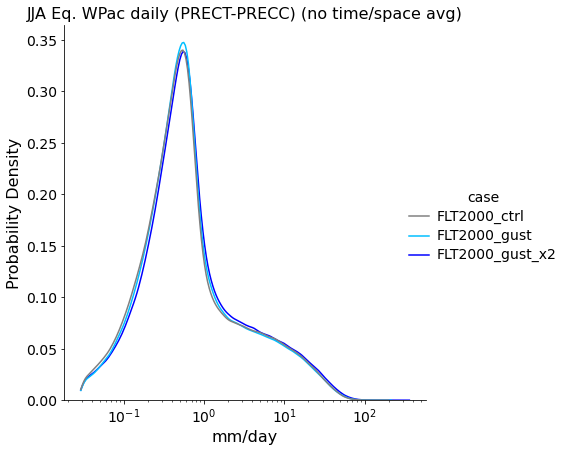

In [125]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = (selDS.PRECT - selDS.PRECC) * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnRain = rain_newUnits * fillOcnFrac


ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['grey','deepskyblue','blue'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily (PRECT-PRECC) (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)


[None, None, None, None]

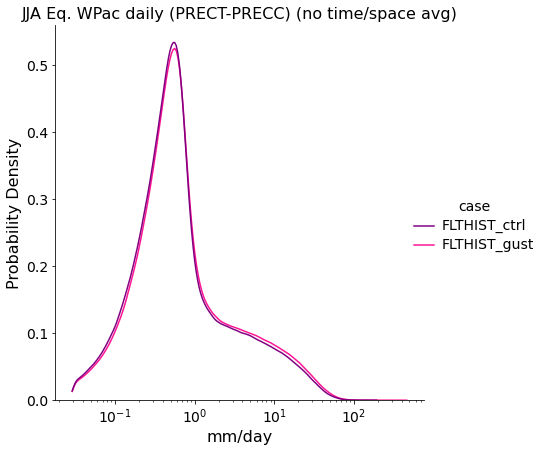

In [126]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = (selDS.PRECT - selDS.PRECC) * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnRain = rain_newUnits * fillOcnFrac


ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['purple','deeppink'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily (PRECT-PRECC) (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)



[None, None, None, None, None, None]

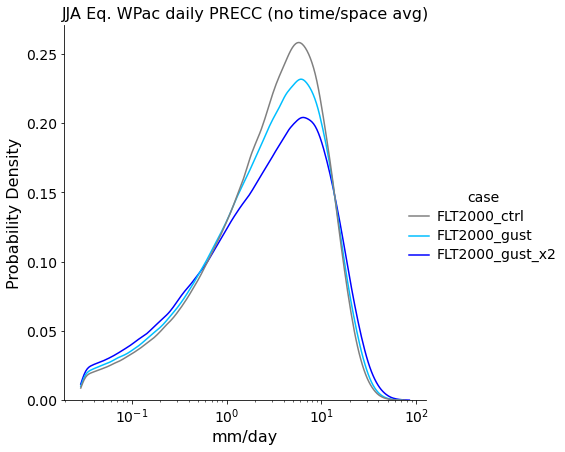

In [127]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = (selDS.PRECC) * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnRain = rain_newUnits * fillOcnFrac


ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['grey','deepskyblue','blue'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily PRECC (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)


[None, None, None, None]

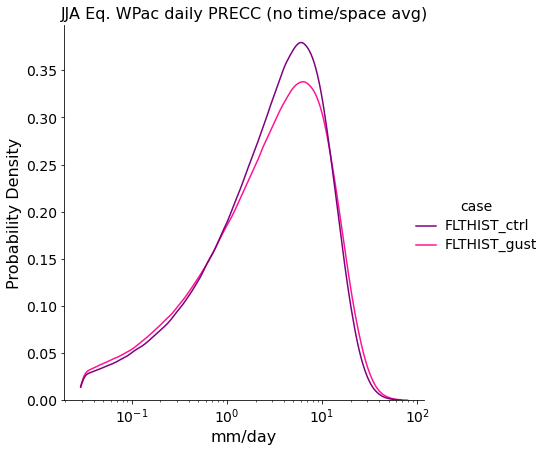

In [128]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = (selDS.PRECC) * valueMultiplier

# ocnRain = rain_newUnits * selDS_h0.OCNFRAC
ocnRain = rain_newUnits * fillOcnFrac


ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=0).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=0).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=1).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=1).case.values)}),
         # pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=2).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=3).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=3).case.values)}),
         pd.DataFrame.from_dict({'Rain rate': np.squeeze(ocnRain.isel(case=4).values.reshape(numEl,1)), 'case': str(ocnRain.isel(case=4).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x='Rain rate', hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, 
                 # palette=['grey','deepskyblue','blue','purple','deeppink'])
                 palette=['purple','deeppink'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('JJA Eq. WPac daily PRECC (no time/space avg)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)



**How much does each bin contribute to total?**

In [129]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = selDS.PRECT * valueMultiplier
ocnRain = rain_newUnits * fillOcnFrac
ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)

## Add in TRMM data
ocnTRMM = regrid_TRMM * selDS_h0.OCNFRAC.isel(case=0, time=6)
ocnTRMM = ocnTRMM.where(ocnTRMM>0.029)

numEl_TRMM = len(ocnTRMM.lat.values)*len(ocnTRMM.lon.values)*len(ocnTRMM.time.values)



In [130]:
10**-1.6

0.025118864315095794

In [131]:
# bins = np.logspace(-2, 2, num=40)
bins = np.logspace(-1.6, 2, num=81)

counts      = np.full([len(selDS.case.values), len(bins)-1], np.nan)
countsTRMM  = np.full([len(bins)-1], np.nan)
binRate     = np.full([len(selDS.case.values), len(bins)-1], np.nan)

for iCase in range(len(selDS.case.values)):
    caseRain = np.squeeze(ocnRain.isel(case=iCase).values.reshape(numEl,1))
    trmmRain = 24*np.squeeze(ocnTRMM.values.reshape(numEl_TRMM,1))
    
    for iBin in range(len(bins)-1): 
        vals     = np.where((caseRain>=bins[iBin]) & (caseRain<bins[iBin+1]))[0]
        valsTRMM = np.where((trmmRain>=bins[iBin]) & (trmmRain<bins[iBin+1]))[0]
        
        if len(vals)>0:
            counts[iCase, iBin] = len(vals)
        else: 
            counts[iCase, iBin] = 0
            
        if len(valsTRMM)>0: 
            countsTRMM[iBin]    = len(valsTRMM)
        else:
            countsTRMM[iBin]    = 0
            
        binRate[iCase, iBin] = np.mean([bins[iBin], bins[iBin+1]])


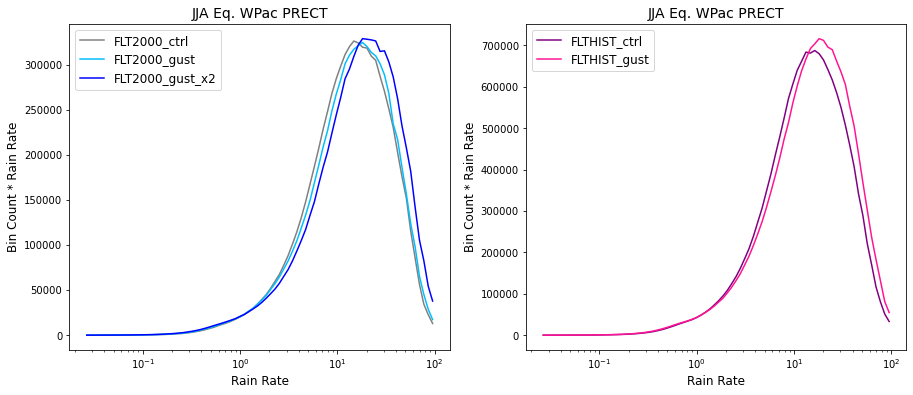

In [134]:
fig,axs = plt.subplots(1,2, figsize=(15,6) )
axs     = axs.ravel()

# palette=['grey','deepskyblue','blue','purple','deeppink'])

axs[0].plot(binRate[0,:], binRate[0,:]*counts[0,:], color='grey',   label=selDS.case.values[0])
axs[0].plot(binRate[1,:], binRate[1,:]*counts[1,:], color='deepskyblue', label=selDS.case.values[1])
axs[0].plot(binRate[2,:], binRate[2,:]*counts[2,:], color='blue', label=selDS.case.values[2])
# axs[0].plot(binRate[0,:], binRate[0,:]*countsTRMM[:], 'k--', label='TRMM Daily Total')
axs[0].legend(fontsize=12)
axs[0].set_xlabel('Rain Rate',fontsize=12)
axs[0].set_ylabel('Bin Count * Rain Rate',fontsize=12)
axs[0].set_title('JJA Eq. WPac PRECT',fontsize=14)
axs[0].set_xscale('log')

axs[1].plot(binRate[3,:], binRate[3,:]*counts[3,:], color='purple',   label=selDS.case.values[3])
axs[1].plot(binRate[4,:], binRate[4,:]*counts[4,:], color='deeppink', label=selDS.case.values[4])
# axs[1].plot(binRate[0,:], binRate[0,:]*countsTRMM[:], 'k--', label='TRMM Daily Total')
axs[1].legend(fontsize=12)
axs[1].set_xlabel('Rain Rate',fontsize=12)
axs[1].set_ylabel('Bin Count * Rain Rate',fontsize=12)
axs[1].set_title('JJA Eq. WPac PRECT',fontsize=14)
axs[1].set_xscale('log')


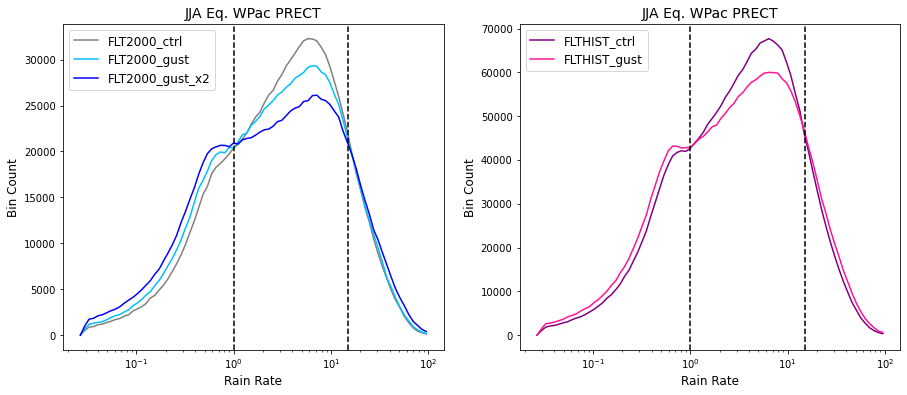

In [135]:
fig,axs = plt.subplots(1,2, figsize=(15,6) )
axs     = axs.ravel()

# palette=['grey','deepskyblue','blue','purple','deeppink'])

axs[0].plot(binRate[0,:], counts[0,:], color='grey',   label=selDS.case.values[0])
axs[0].plot(binRate[1,:], counts[1,:], color='deepskyblue', label=selDS.case.values[1])
axs[0].plot(binRate[2,:], counts[2,:], color='blue', label=selDS.case.values[2])
# axs[0].plot(binRate[0,:], countsTRMM[:], 'k--', label='TRMM Daily Total')
axs[0].legend(fontsize=12)
axs[0].set_xlabel('Rain Rate',fontsize=12)
axs[0].set_ylabel('Bin Count',fontsize=12)
axs[0].set_title('JJA Eq. WPac PRECT',fontsize=14)
axs[0].set_xscale('log')

axs[1].plot(binRate[3,:], counts[3,:], color='purple',   label=selDS.case.values[3])
axs[1].plot(binRate[4,:], counts[4,:], color='deeppink', label=selDS.case.values[4])
# axs[1].plot(binRate[0,:], binRate[0,:]*countsTRMM[:], 'k--', label='TRMM Daily Total')
axs[1].legend(fontsize=12)
axs[1].set_xlabel('Rain Rate',fontsize=12)
axs[1].set_ylabel('Bin Count',fontsize=12)
axs[1].set_title('JJA Eq. WPac PRECT',fontsize=14)
axs[1].set_xscale('log')

axs[0].axvline(1, color='k', linestyle='dashed')
axs[1].axvline(1, color='k', linestyle='dashed')

axs[0].axvline(15, color='k', linestyle='dashed')
axs[1].axvline(15, color='k', linestyle='dashed')



In [136]:
# ## Indian Ocean (DJF)
# lowRains  = ocnRain.where(ocnRain<=0.5).load()
# midRains  = ocnRain.where((ocnRain>0.5) & (ocnRain<10)).load()
# highRains = ocnRain.where(ocnRain>=10).load()

# ## Indian Ocean (JJA)
# lowRains  = ocnRain.where(ocnRain<=0.75).load()
# midRains  = ocnRain.where((ocnRain>0.75) & (ocnRain<12)).load()
# highRains = ocnRain.where(ocnRain>=12).load()


## Eq W Pac (JJA)
lowRains  = ocnRain.where(ocnRain<=1).load()
midRains  = ocnRain.where((ocnRain>1) & (ocnRain<15)).load()
highRains = ocnRain.where(ocnRain>=15).load()


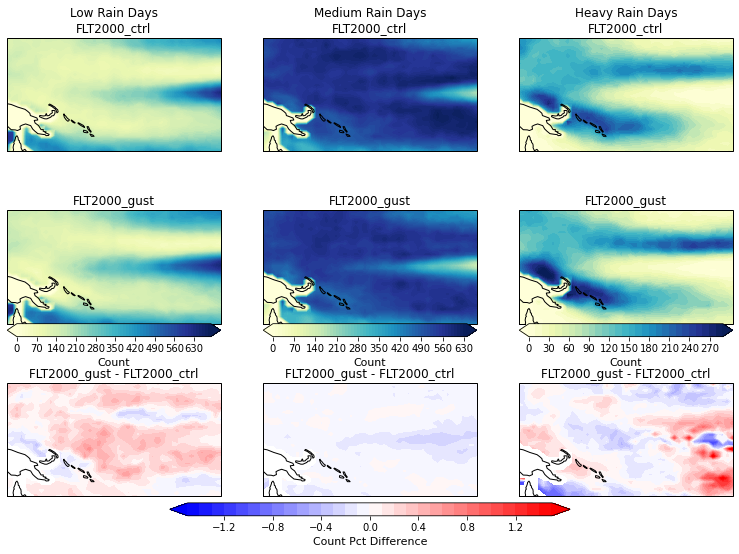

In [144]:
# fig,axs = plt.subplots(3,3, figsize=(15,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) # IO ocean
fig,axs = plt.subplots(3,3, figsize=(13,9), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) # Eq WPac
axs = axs.ravel()

clims = np.arange(0, 700, 10) 
climsMid = np.arange(0, 650, 10) 
climsHigh= np.arange(0, 300, 10) 
climsDiff = np.arange(-100,105,5)

## Plot control case 
axs[0].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=0).count(dim='time').values, clims, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
axs[1].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=0).count(dim='time').values, climsMid, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
axs[2].contourf(highRains.lon.values, highRains.lat.values, highRains.isel(case=0).count(dim='time').values, climsHigh, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())

## Plot GUST case 
c3 = axs[3].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=1).count(dim='time').values, clims, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c3, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

c4 = axs[4].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=1).count(dim='time').values, climsMid, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c4, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

c5 = axs[5].contourf(highRains.lon.values, highRains.lat.values, highRains.isel(case=1).count(dim='time').values, climsHigh, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c5, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

# ## Plot the difference (as raw difference) 
# axs[6].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=1).count(dim='time').values-lowRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
# c7 = axs[7].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=1).count(dim='time').values-midRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
# ax_position = axs[7].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.04, ax_position.width+0.2, 0.02])
# cbar        = plt.colorbar(c7, orientation='horizontal',cax=cbar_ax)
# cbar.set_label('Count Difference',fontsize=11)

# axs[8].contourf(highRains.lon.values,highRains.lat.values,  highRains.isel(case=1).count(dim='time').values-highRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())


## Plot the difference (as a pct difference) 
climsDiff = np.arange(-1.5,1.6,0.1)

axs[6].contourf(lowRains.lon.values,  lowRains.lat.values,  
                (lowRains.isel(case=1).count(dim='time').values-lowRains.isel(case=0).count(dim='time').values)/lowRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())

c7 = axs[7].contourf(midRains.lon.values,  midRains.lat.values,  
                     (midRains.isel(case=1).count(dim='time').values-midRains.isel(case=0).count(dim='time').values)/midRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c7, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count Pct Difference',fontsize=11)

axs[8].contourf(highRains.lon.values,highRains.lat.values,  
                (highRains.isel(case=1).count(dim='time').values-highRains.isel(case=0).count(dim='time').values)/highRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())


axs[0].set_title('Low Rain Days\n'+str(lowRains.isel(case=0).case.values))
axs[1].set_title('Medium Rain Days\n'+str(midRains.isel(case=0).case.values))
axs[2].set_title('Heavy Rain Days\n'+str(highRains.isel(case=0).case.values))

axs[3].set_title(lowRains.isel(case=1).case.values)
axs[4].set_title(midRains.isel(case=1).case.values)
axs[5].set_title(highRains.isel(case=1).case.values)

axs[6].set_title(str(lowRains.isel(case=1).case.values)+' - '+str(lowRains.isel(case=0).case.values))
axs[7].set_title(str(midRains.isel(case=1).case.values)+' - '+str(midRains.isel(case=0).case.values))
axs[8].set_title(str(highRains.isel(case=1).case.values)+' - '+str(highRains.isel(case=0).case.values))

axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()
axs[3].coastlines()
axs[4].coastlines()
axs[5].coastlines()
axs[6].coastlines()
axs[7].coastlines()
axs[8].coastlines()

# axs[6].axhline(-3, color='k')
# axs[8].axhline(-3, color='k')

# fig.subplots_adjust(hspace=0.05)


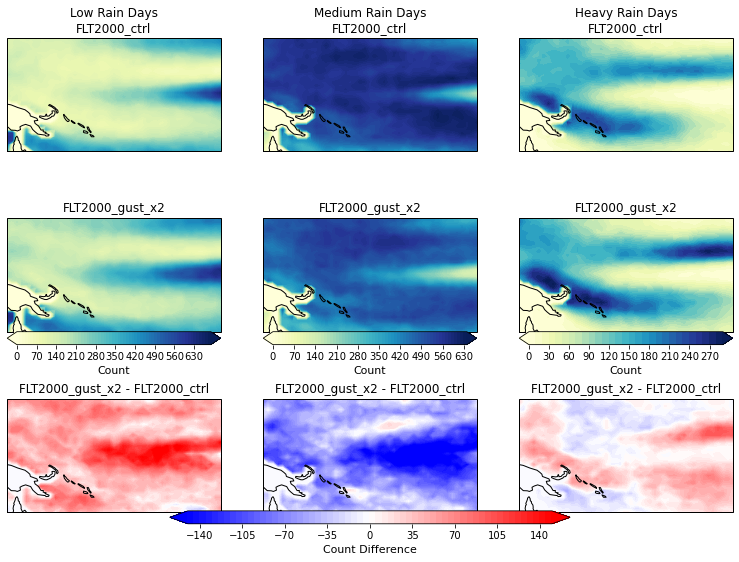

In [145]:
# fig,axs = plt.subplots(3,3, figsize=(15,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)}) # IO ocean
fig,axs = plt.subplots(3,3, figsize=(13,9), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel()

clims = np.arange(0, 700, 10) 
climsMid = np.arange(0, 650, 10) 
climsHigh= np.arange(0, 300, 10) 
climsDiff = np.arange(-150,155,5)

## Plot control case 
axs[0].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=0).count(dim='time').values, clims, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
axs[1].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=0).count(dim='time').values, climsMid, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
axs[2].contourf(highRains.lon.values, highRains.lat.values, highRains.isel(case=0).count(dim='time').values, climsHigh, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())

## Plot GUST case 
c3 = axs[3].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=2).count(dim='time').values, clims, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c3, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

c4 = axs[4].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=2).count(dim='time').values, climsMid, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[4].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c4, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

c5 = axs[5].contourf(highRains.lon.values, highRains.lat.values, highRains.isel(case=2).count(dim='time').values, climsHigh, extend='both', cmap='YlGnBu', transform=ccrs.PlateCarree())
ax_position = axs[5].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.02])
cbar        = plt.colorbar(c5, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count',fontsize=11)

## Plot the difference (as raw difference) 
axs[6].contourf(lowRains.lon.values,  lowRains.lat.values,  lowRains.isel(case=2).count(dim='time').values-lowRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
c7 = axs[7].contourf(midRains.lon.values,  midRains.lat.values,  midRains.isel(case=2).count(dim='time').values-midRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
ax_position = axs[7].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.03, ax_position.width+0.2, 0.02])
cbar        = plt.colorbar(c7, orientation='horizontal',cax=cbar_ax)
cbar.set_label('Count Difference',fontsize=11)

axs[8].contourf(highRains.lon.values,highRains.lat.values,  highRains.isel(case=2).count(dim='time').values-highRains.isel(case=0).count(dim='time').values, 
                climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())


# ## Plot the difference (as a pct difference) 
# climsDiff = np.arange(-1.5,1.6,0.1)

# axs[6].contourf(lowRains.lon.values,  lowRains.lat.values,  
#                 (lowRains.isel(case=2).count(dim='time').values-lowRains.isel(case=0).count(dim='time').values)/lowRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())

# c7 = axs[7].contourf(midRains.lon.values,  midRains.lat.values,  
#                      (midRains.isel(case=2).count(dim='time').values-midRains.isel(case=0).count(dim='time').values)/midRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())
# ax_position = axs[7].get_position()
# cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.04, ax_position.width+0.2, 0.02])
# cbar        = plt.colorbar(c7, orientation='horizontal',cax=cbar_ax)
# cbar.set_label('Count Pct Difference',fontsize=11)

# axs[8].contourf(highRains.lon.values,highRains.lat.values,  
#                 (highRains.isel(case=2).count(dim='time').values-highRains.isel(case=0).count(dim='time').values)/highRains.isel(case=0).count(dim='time').values, 
#                 climsDiff, extend='both', cmap='bwr', transform=ccrs.PlateCarree())


axs[0].set_title('Low Rain Days\n'+str(lowRains.isel(case=0).case.values))
axs[1].set_title('Medium Rain Days\n'+str(midRains.isel(case=0).case.values))
axs[2].set_title('Heavy Rain Days\n'+str(highRains.isel(case=0).case.values))

axs[3].set_title(lowRains.isel(case=2).case.values)
axs[4].set_title(midRains.isel(case=2).case.values)
axs[5].set_title(highRains.isel(case=2).case.values)

axs[6].set_title(str(lowRains.isel(case=2).case.values)+' - '+str(lowRains.isel(case=0).case.values))
axs[7].set_title(str(midRains.isel(case=2).case.values)+' - '+str(midRains.isel(case=0).case.values))
axs[8].set_title(str(highRains.isel(case=2).case.values)+' - '+str(highRains.isel(case=0).case.values))

axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()
axs[3].coastlines()
axs[4].coastlines()
axs[5].coastlines()
axs[6].coastlines()
axs[7].coastlines()
axs[8].coastlines()

# axs[6].axhline(-3, color='k')
# axs[8].axhline(-3, color='k')

fig.subplots_adjust(hspace=0.4)



### Precipitation variance

Done with calculations


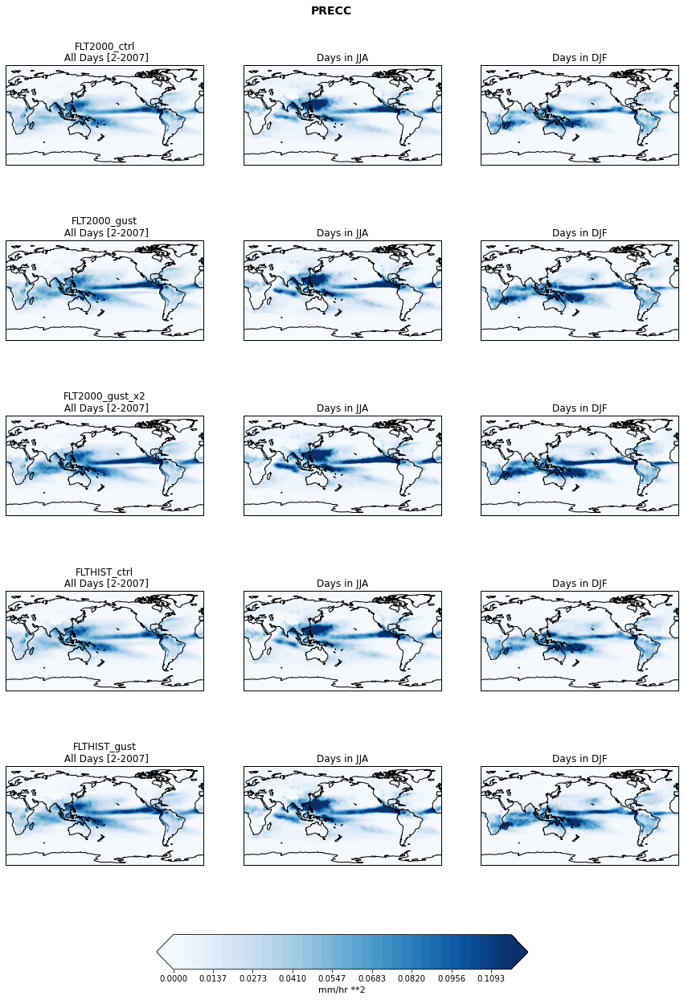

In [34]:
varSel  = 'PRECC'

## Multiplier to get from m/s to mm/hr
valueMultiplier = (3600*1e3)
unitsStr = 'mm/hr **2'

rainfallWithUnits = all_h1[varSel] * valueMultiplier

varianceAllTime = rainfallWithUnits.var(dim='time') 
varianceJJA = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values>=6) & 
                                                    (rainfallWithUnits['time.month'].values<=8) )[0]).var(dim='time') 
varianceDJF = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values==12) | 
                                                    (rainfallWithUnits['time.month'].values<=2) )[0]).var(dim='time') 

# Get colorbar limits
maxLim  = np.nanpercentile([varianceAllTime.values, varianceJJA.values, varianceDJF.values], 99)
minLim  = np.nanpercentile([varianceAllTime.values, varianceJJA.values, varianceDJF.values], 3)
levsplt = np.arange(minLim, maxLim*1.1, (1.1*maxLim-minLim)/35)
print('Done with calculations')

fig,axs = plt.subplots(len(case_IDs),3, figsize=(15,len(case_IDs)*4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

for iCase in range(len(case_IDs)):     
    axs[(3*iCase)+0].contourf(all_h1.lon.values, all_h1.lat.values, varianceAllTime.isel(case=iCase), levsplt, 
                              extend='both', cmap='Blues', transform=ccrs.PlateCarree())
    cplt = axs[(3*iCase)+1].contourf(all_h1.lon.values, all_h1.lat.values, varianceJJA.isel(case=iCase), levsplt, 
                              extend='both', cmap='Blues', transform=ccrs.PlateCarree())
    ## Add colorbar 
    if iCase==len(case_IDs)-1:
        ax_position = axs[(3*iCase)+1].get_position()
        cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.08, ax_position.width+0.2, 0.03])
        cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
        cbar.set_label(unitsStr,fontsize=11)

    axs[(3*iCase)+2].contourf(all_h1.lon.values, all_h1.lat.values, varianceDJF.isel(case=iCase), levsplt, 
                              extend='both', cmap='Blues', transform=ccrs.PlateCarree())
    
    ## Add other plot options
    axs[(3*iCase)+0].coastlines()
    axs[(3*iCase)+1].coastlines()
    axs[(3*iCase)+2].coastlines()
    
    axs[(3*iCase)+0].set_title( str(all_h1.isel(case=iCase).case.values) +'\n All Days ['+str(np.nanmin(all_h1.isel(case=iCase)['time.year'].values))+'-'+str(np.nanmax(all_h1.isel(case=iCase)['time.year'].values))+']')
    axs[(3*iCase)+1].set_title('Days in JJA')
    axs[(3*iCase)+2].set_title('Days in DJF')
    
fig.suptitle(varSel, y=0.90, fontsize=14, fontweight='bold')
fig.subplots_adjust(hspace=0.01)



Done with calculations


Text(0.5, 0.9, 'PRECC variance [FLT2000_gust - FLT2000_ctrl]')

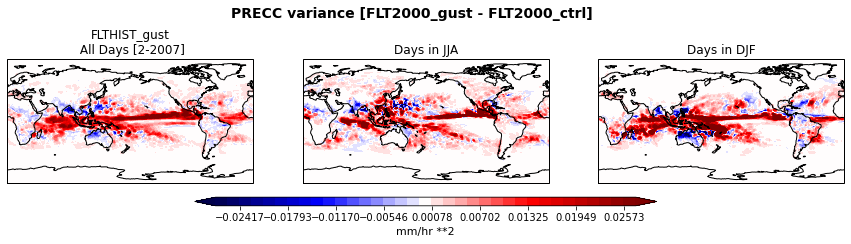

In [35]:
## -----------------------------------------
## Plot difference between some cases too 
## (Run in conjunction with above) 
## -----------------------------------------
ctrlCase = 'FLT2000_ctrl'
testCase = 'FLT2000_gust'

diff_AllTime = varianceAllTime.sel(case=testCase) - varianceAllTime.sel(case=ctrlCase)
diff_JJA     = varianceJJA.sel(case=testCase) - varianceJJA.sel(case=ctrlCase)
diff_DJF     = varianceDJF.sel(case=testCase) - varianceDJF.sel(case=ctrlCase)

# Get colorbar limits
maxLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 99)
minLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 1)
levMax  = np.nanmax([np.abs(maxLim), np.abs(minLim)])
nstep   =  (2*levMax)/35
levsplt = np.arange(-levMax, levMax+nstep, nstep)
print('Done with calculations')

fig,axs = plt.subplots(1,3, figsize=(15,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

axs[0].contourf(all_h1.lon.values, all_h1.lat.values, diff_AllTime, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())

cplt = axs[1].contourf(all_h1.lon.values, all_h1.lat.values, diff_JJA, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.08, ax_position.width+0.2, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsStr,fontsize=11)

axs[2].contourf(all_h1.lon.values, all_h1.lat.values, diff_DJF, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())

## Add other plot options
axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()

axs[0].set_title( str(all_h1.isel(case=iCase).case.values) +'\n All Days ['+str(np.nanmin(all_h1.isel(case=iCase)['time.year'].values))+'-'+str(np.nanmax(all_h1.isel(case=iCase)['time.year'].values))+']')
axs[1].set_title('Days in JJA')
axs[2].set_title('Days in DJF')
    
fig.suptitle(varSel+' variance ['+testCase+' - '+ctrlCase+']', y=0.9, fontsize=14, fontweight='bold')


Done with calculations


Text(0.5, 0.9, 'PRECC variance [FLTHIST_gust - FLTHIST_ctrl]')

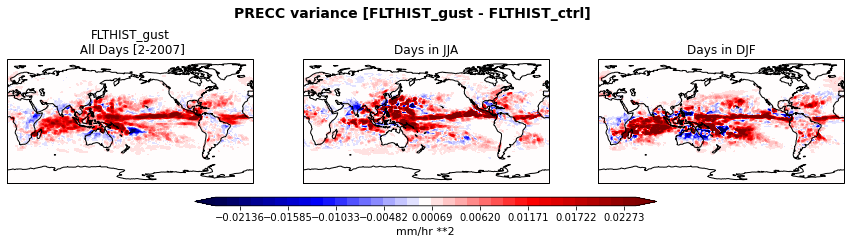

In [36]:
## -----------------------------------------
## Plot difference between some cases too 
## (Run in conjunction with above) 
## -----------------------------------------
ctrlCase = 'FLTHIST_ctrl'
testCase = 'FLTHIST_gust'

diff_AllTime = varianceAllTime.sel(case=testCase) - varianceAllTime.sel(case=ctrlCase)
diff_JJA     = varianceJJA.sel(case=testCase) - varianceJJA.sel(case=ctrlCase)
diff_DJF     = varianceDJF.sel(case=testCase) - varianceDJF.sel(case=ctrlCase)

# Get colorbar limits
maxLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 99)
minLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 1)
levMax  = np.nanmax([np.abs(maxLim), np.abs(minLim)])
nstep   =  (2*levMax)/35
levsplt = np.arange(-levMax, levMax+nstep, nstep)
print('Done with calculations')

fig,axs = plt.subplots(1,3, figsize=(15,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

axs[0].contourf(all_h1.lon.values, all_h1.lat.values, diff_AllTime, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())

cplt = axs[1].contourf(all_h1.lon.values, all_h1.lat.values, diff_JJA, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.1, ax_position.y0-0.08, ax_position.width+0.2, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsStr,fontsize=11)

axs[2].contourf(all_h1.lon.values, all_h1.lat.values, diff_DJF, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())

## Add other plot options
axs[0].coastlines()
axs[1].coastlines()
axs[2].coastlines()

axs[0].set_title( str(all_h1.isel(case=iCase).case.values) +'\n All Days ['+str(np.nanmin(all_h1.isel(case=iCase)['time.year'].values))+'-'+str(np.nanmax(all_h1.isel(case=iCase)['time.year'].values))+']')
axs[1].set_title('Days in JJA')
axs[2].set_title('Days in DJF')
    
fig.suptitle(varSel+' variance ['+testCase+' - '+ctrlCase+']', y=0.9, fontsize=14, fontweight='bold')



In [37]:
# varSel  = 'PRECC'

# ## Multiplier to get from m/s to mm/hr
# valueMultiplier = (3600*1e3)
# unitsStr = 'mm/hr **2'

# rainfallWithUnits = all_h1[varSel] * valueMultiplier

# meanAllTime = rainfallWithUnits.mean(dim='time').load()
# meanJJA     = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values>=6) & 
#                                                     (rainfallWithUnits['time.month'].values<=8) )[0]).mean(dim='time').load() 
# meanDJF     = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values==12) | 
#                                                     (rainfallWithUnits['time.month'].values<=2) )[0]).mean(dim='time').load()



In [12]:
varSel  = 'LHFLX'

## Multiplier to get from m/s to mm/hr
valueMultiplier = 1
unitsStr = 'W/m**2'

rainfallWithUnits = all_h1[varSel] * valueMultiplier

meanAllTime = rainfallWithUnits.mean(dim='time').load()
meanJJA     = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values>=6) & 
                                                    (rainfallWithUnits['time.month'].values<=8) )[0]).mean(dim='time').load() 
meanDJF     = rainfallWithUnits.isel(time=np.where( (rainfallWithUnits['time.month'].values==12) | 
                                                    (rainfallWithUnits['time.month'].values<=2) )[0]).mean(dim='time').load()




In [14]:
unitsString = 'W/m**2'

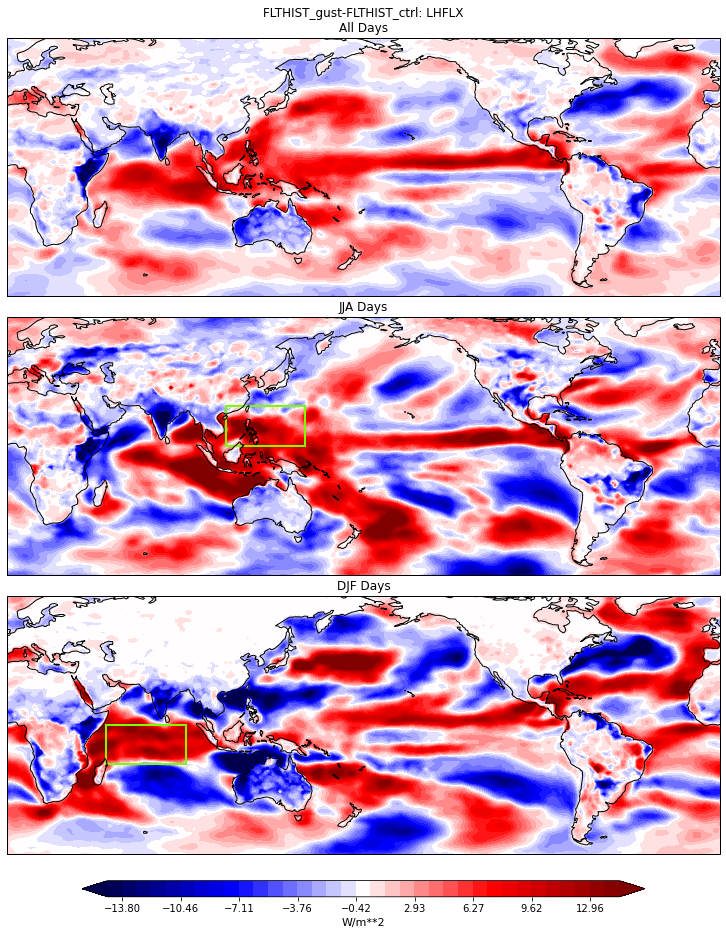

In [19]:
## -----------------------------------------
## Plot difference between some cases too 
## (Run in conjunction with above) 
## -----------------------------------------
ctrlCase = 'FLTHIST_ctrl'
testCase = 'FLTHIST_gust'

diff_AllTime = meanAllTime.sel(case=testCase) - meanAllTime.sel(case=ctrlCase)
diff_JJA     = meanJJA.sel(case=testCase) - meanJJA.sel(case=ctrlCase)
diff_DJF     = meanDJF.sel(case=testCase) - meanDJF.sel(case=ctrlCase)

# Get colorbar limits
maxLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 99.5)
minLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 0.5)
levMax  = np.nanmax([np.abs(maxLim), np.abs(minLim)])
nstep   =  (2*levMax)/35
levsplt = np.arange(-levMax, levMax+nstep, nstep)


## Make cool plots of raw data 
fig,axs = plt.subplots(3,1, figsize=(20,15), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

# Plot model data 
contour_plot = axs[0].contourf(diff_AllTime.lon.values, diff_AllTime.lat.values, 
                               np.squeeze(diff_AllTime), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[0].coastlines()
axs[0].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[0].set_title(testCase+'-'+ctrlCase+': '+varSel+'\nAll Days')


contour_plot = axs[1].contourf(diff_JJA.lon.values, diff_JJA.lat.values, 
                               np.squeeze(diff_JJA), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[1].coastlines()
axs[1].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[1].set_title('\nJJA Days')
## Add Trop NWPac domain
axs[1].add_patch(patches.Rectangle(xy=[110, 5], width=40, height=20,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))


contour_plot = axs[2].contourf(diff_DJF.lon.values, diff_DJF.lat.values, 
                               np.squeeze(diff_DJF), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[2].coastlines()
axs[2].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[2].set_title('\nDJF Days')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

## Add IO domain
axs[2].add_patch(patches.Rectangle(xy=[50, -15], width=40, height=20,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))

fig.subplots_adjust(hspace = 0.08)


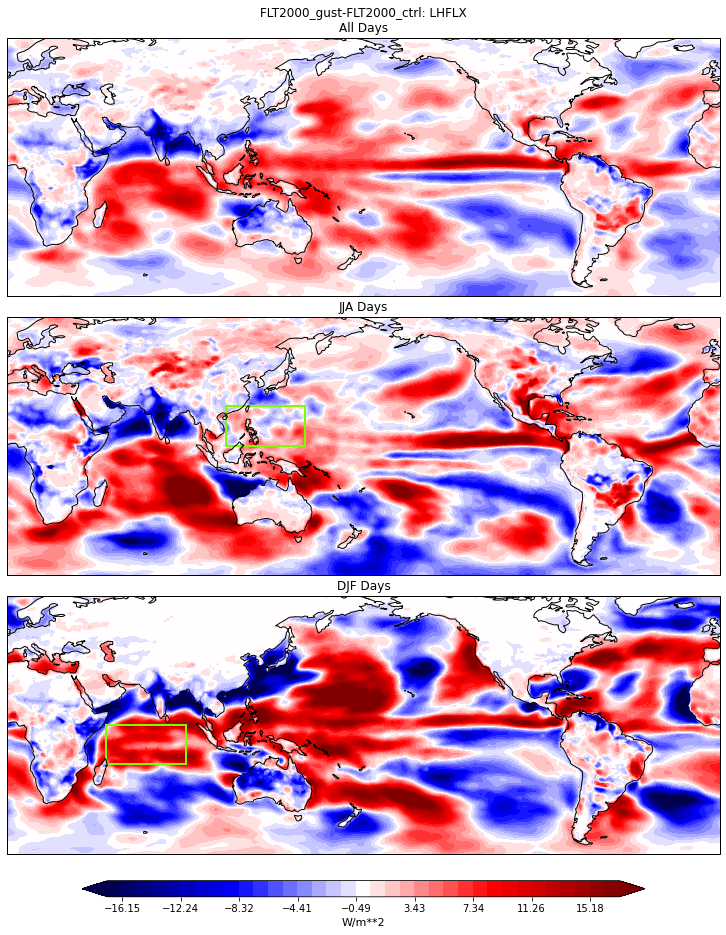

In [20]:
## -----------------------------------------
## Plot difference between some cases too 
## (Run in conjunction with above) 
## -----------------------------------------
ctrlCase = 'FLT2000_ctrl'
testCase = 'FLT2000_gust'

diff_AllTime = meanAllTime.sel(case=testCase) - meanAllTime.sel(case=ctrlCase)
diff_JJA     = meanJJA.sel(case=testCase) - meanJJA.sel(case=ctrlCase)
diff_DJF     = meanDJF.sel(case=testCase) - meanDJF.sel(case=ctrlCase)

# Get colorbar limits
maxLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 99.5)
minLim  = np.nanpercentile([diff_AllTime.values, diff_JJA.values, diff_DJF.values], 0.5)
levMax  = np.nanmax([np.abs(maxLim), np.abs(minLim)])
nstep   =  (2*levMax)/35
levsplt = np.arange(-levMax, levMax+nstep, nstep)


## Make cool plots of raw data 
fig,axs = plt.subplots(3,1, figsize=(20,15), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

# Plot model data 
contour_plot = axs[0].contourf(diff_AllTime.lon.values, diff_AllTime.lat.values, 
                               np.squeeze(diff_AllTime), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[0].coastlines()
axs[0].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[0].set_title(testCase+'-'+ctrlCase+': '+varSel+'\nAll Days')


contour_plot = axs[1].contourf(diff_JJA.lon.values, diff_JJA.lat.values, 
                               np.squeeze(diff_JJA), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[1].coastlines()
axs[1].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[1].set_title('\nJJA Days')
## Add Trop NWPac domain
axs[1].add_patch(patches.Rectangle(xy=[110, 5], width=40, height=20,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))


contour_plot = axs[2].contourf(diff_DJF.lon.values, diff_DJF.lat.values, 
                               np.squeeze(diff_DJF), 
                                levsplt,
                                cmap='seismic',extend='both',
                                transform=ccrs.PlateCarree())
axs[2].coastlines()
axs[2].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[2].set_title('\nDJF Days')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
cbar        = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsString,fontsize=11)

## Add IO domain
axs[2].add_patch(patches.Rectangle(xy=[50, -15], width=40, height=20,
                                facecolor='none', edgecolor='lawngreen',
                                linewidth=2,
                                transform=ccrs.PlateCarree()))

fig.subplots_adjust(hspace = 0.08)



## Pick out single locations

In [ ]:
## Point marker

TS_Avg = all_h0.TS.isel(time=np.where( (all_h0['time.month'].values>=6) & 
                                       (all_h0['time.month'].values<=8) )[0]).mean(dim='time')

levsplt = np.arange(290,304,0.5)

fig,axs = plt.subplots(2,1, figsize=(14,15), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

cplt = axs[0].contourf(TS_Avg.lon.values, TS_Avg.lat.values, TS_Avg.isel(case=0).values, levsplt, 
                       extend='both', transform=ccrs.PlateCarree(), cmap='jet') 
axs[0].coastlines()
axs[0].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[0].set_title(TS_Avg.case.values[0]+'\nTS (JJA months avg)')
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.05, ax_position.width, 0.015])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label('K',fontsize=11)


axs[1].contourf(TS_Avg.lon.values, TS_Avg.lat.values, TS_Avg.isel(case=3).values, levsplt, 
                extend='both', transform=ccrs.PlateCarree(), cmap='jet')
axs[1].coastlines()
axs[1].set_extent([0, 359, -60, 70], crs=ccrs.PlateCarree())
axs[1].set_title(TS_Avg.case.values[3]+'\nTS (JJA months avg)')

nearestPoint = TS_Avg.sel(lon=151,lat=1,method='nearest')

axs[0].plot(nearestPoint.lon.values, nearestPoint.lat.values, 'ko', markersize=5, transform=ccrs.PlateCarree())
axs[1].plot(nearestPoint.lon.values, nearestPoint.lat.values, 'ko', markersize=5, transform=ccrs.PlateCarree())

fig.subplots_adjust(hspace=0.06)


In [94]:
selPoint_h1 = all_h1.sel(lon=151,lat=1,method='nearest').load()


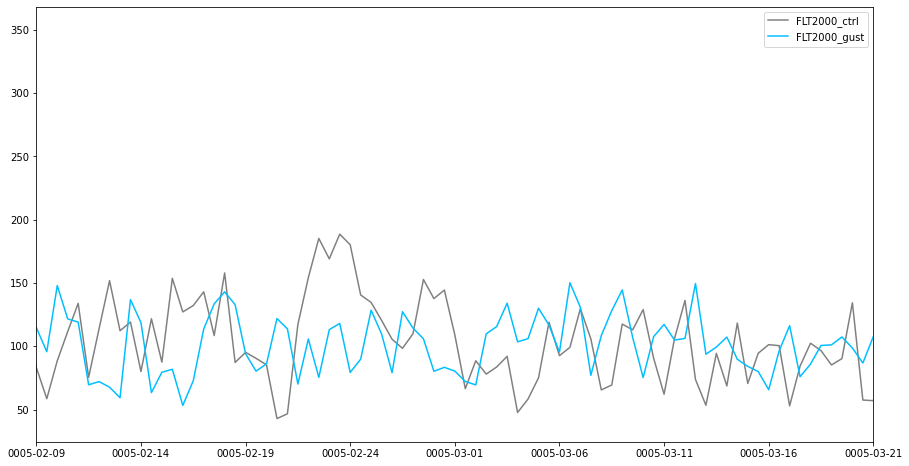

In [133]:
fig,axs = plt.subplots(1,1,figsize=(15,8))

colors=['grey','deepskyblue','blue','purple','deeppink']

varPlot = 'LHFLX'

# for iCase in range(len(selPoint_h1.case.values)):
for iCase in range(2):

    axs.plot(selPoint_h1[varPlot].isel(case=iCase).values, '-', 
             color=colors[iCase],label=selPoint_h1.case.values[iCase])

axs.legend()

strtTime = 1500
endTime  = 1580
inputArr = selPoint_h1.time.values[strtTime:endTime:5].astype('str')
labels = [elem[0:10] for elem in inputArr ]

axs.set_xlim([strtTime,endTime])
axs.set_xticklabels(labels)



plt.show()


In [128]:
inputArr = selPoint_h1.time.values[strtTime:endTime:5].astype('str')
out = [elem[0:10] for elem in inputArr ]

print(out)

['0003-09-27', '0003-10-02', '0003-10-07', '0003-10-12', '0003-10-17', '0003-10-22', '0003-10-27', '0003-11-01', '0003-11-06', '0003-11-11', '0003-11-16', '0003-11-21', '0003-11-26', '0003-12-01', '0003-12-06', '0003-12-11', '0003-12-16', '0003-12-21', '0003-12-26', '0003-12-31', '0004-01-05', '0004-01-10', '0004-01-15', '0004-01-20', '0004-01-25', '0004-01-30', '0004-02-04', '0004-02-09', '0004-02-14', '0004-02-19', '0004-02-24', '0004-03-01', '0004-03-06', '0004-03-11', '0004-03-16', '0004-03-21', '0004-03-26', '0004-03-31', '0004-04-05', '0004-04-10']


In [127]:
inputArr[0][0:10]

'0003-09-27'

### Conditionally sample based on where U10 is weak in CTRL

In [ ]:
# allDaysAvg = all_h1.mean(dim='time')

JJAavg = all_h1.isel(time=np.where( (all_h1['time.month'].values>=6) & 
                                    (all_h1['time.month'].values<=8) )[0]).mean(dim='time')

DJFavg = all_h1.isel(time=np.where( (all_h1['time.month'].values==12) | 
                                    (all_h1['time.month'].values<=2) )[0]).mean(dim='time') 


In [ ]:
ocnMask = all_h0.isel(time=6, case=0).OCNFRAC.values
ocnMask[np.where(ocnMask==0)] = np.nan


In [ ]:
u10_lim = 6
levsplt = np.arange(0,14,0.5)

fig,axs = plt.subplots(2,2, figsize=(15,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel() 

axs[0].contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[0].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[0].clabel(CS, inline=True, fontsize=10)
axs[0].coastlines() 
axs[0].set_title('FLT2000_ctrl U10 (mean over all DJF days)')

axs[2].contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[2].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[2].clabel(CS, inline=True, fontsize=10)
axs[2].coastlines() 
axs[2].set_title('FLTHIST_ctrl U10 (mean over all DJF days)')


## JJA 
axs[1].contourf(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[1].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[1].clabel(CS, inline=True, fontsize=10)
axs[1].coastlines() 
axs[1].set_title('FLT2000_ctrl U10 (mean over all JJA days)')

cplt=axs[3].contourf(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(all_h1['U10'].units,fontsize=11)

CS = axs[3].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[3].clabel(CS, inline=True, fontsize=10)
axs[3].coastlines() 
axs[3].set_title('FLTHIST_ctrl U10 (mean over all JJA days)')



In [ ]:
u10_lim = 6
levsplt = np.arange(0,3,0.2)

fig,axs = plt.subplots(2,2, figsize=(15,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs = axs.ravel() 

axs[0].contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['UGUST'].sel(case='FLT2000_gust')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[0].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLT2000_gust')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[0].clabel(CS, inline=True, fontsize=10)
axs[0].coastlines() 
axs[0].set_title('FLT2000_ctrl UGUST (mean over all DJF days)')

axs[2].contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['UGUST'].sel(case='FLTHIST_gust')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[2].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLTHIST_gust')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[2].clabel(CS, inline=True, fontsize=10)
axs[2].coastlines() 
axs[2].set_title('FLTHIST_ctrl UGUST (mean over all DJF days)')


## JJA 
axs[1].contourf(all_h1.lon.values, all_h1.lat.values, JJAavg['UGUST'].sel(case='FLT2000_gust')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
CS = axs[1].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLT2000_gust')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[1].clabel(CS, inline=True, fontsize=10)
axs[1].coastlines() 
axs[1].set_title('FLT2000_ctrl UGUST (mean over all JJA days)')

cplt=axs[3].contourf(all_h1.lon.values, all_h1.lat.values, JJAavg['UGUST'].sel(case='FLTHIST_gust')*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(all_h1['UGUST'].units,fontsize=11)

CS = axs[3].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLTHIST_gust')*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs[3].clabel(CS, inline=True, fontsize=10)
axs[3].coastlines() 
axs[3].set_title('FLTHIST_ctrl UGUST (mean over all JJA days)')



In [ ]:
## Where is biggest response? 

varSel = 'U10' 
multiplier = 1
unitsStr = all_h1[varSel].units
# multiplier = 3600*1e3
# unitsStr = 'mm/hr'

diff_DJF_2000 = (DJFavg[varSel].sel(case='FLT2000_gust').values - DJFavg[varSel].sel(case='FLT2000_ctrl').values)*multiplier*ocnMask
diff_DJF_hist = (DJFavg[varSel].sel(case='FLTHIST_gust').values - DJFavg[varSel].sel(case='FLTHIST_ctrl').values)*multiplier*ocnMask

diff_JJA_2000 = (JJAavg[varSel].sel(case='FLT2000_gust').values - JJAavg[varSel].sel(case='FLT2000_ctrl').values)*multiplier*ocnMask
diff_JJA_hist = (JJAavg[varSel].sel(case='FLTHIST_gust').values - JJAavg[varSel].sel(case='FLTHIST_ctrl').values)*multiplier*ocnMask


## Make the actual plots
fig,axs = plt.subplots(2,2, figsize=(15,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel() 


minVal = np.nanpercentile([diff_DJF_2000, diff_DJF_hist, diff_JJA_2000, diff_JJA_hist], 0.5)
maxVal = np.nanpercentile([diff_DJF_2000, diff_DJF_hist, diff_JJA_2000, diff_JJA_hist], 99.5) 
cbarMax = np.nanmax([minVal, maxVal])
nstep   = 2*cbarMax/26
levsplt = np.arange(-cbarMax,cbarMax+nstep,nstep)


axs[0].contourf(all_h1.lon.values, all_h1.lat.values, diff_DJF_2000, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
axs[0].coastlines() 
axs[0].set_title('FLT2000_gust - FLT2000_ctrl: '+varSel+' (mean over all DJF days)')
## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs[0].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs[0].clabel(CS, inline=True, fontsize=10)


axs[1].contourf(all_h1.lon.values, all_h1.lat.values, diff_JJA_2000, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
axs[1].coastlines() 
axs[1].set_title('FLT2000_gust - FLT2000_ctrl: '+varSel+' (mean over all JJA days)')
## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs[1].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLT2000_ctrl')*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs[1].clabel(CS, inline=True, fontsize=10)


axs[2].contourf(all_h1.lon.values, all_h1.lat.values, diff_DJF_hist, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
axs[2].coastlines() 
axs[2].set_title('FLTHIST_gust - FLTHSIT_ctrl: '+varSel+' (mean over all DJF days)')
## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs[2].contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs[2].clabel(CS, inline=True, fontsize=10)


cplt=axs[3].contourf(all_h1.lon.values, all_h1.lat.values, diff_JJA_hist, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.2, ax_position.y0-0.08, ax_position.width+0.1, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsStr,fontsize=11)

axs[3].coastlines() 
axs[3].set_title('FLTHIST_gust - FLTHSIT_ctrl: '+varSel+' (mean over all JJA days)')
## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs[3].contour(all_h1.lon.values, all_h1.lat.values, JJAavg['U10'].sel(case='FLTHIST_ctrl')*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs[3].clabel(CS, inline=True, fontsize=10)




In [ ]:
## Conditionally sample on where U10 in CTRL (climo-wise) is < some threshold 
# ctrlCase = 'FLT2000_ctrl'
ctrlCase = 'FLTHIST_ctrl'

u10_lim = 6

levsplt = np.arange(0,14,0.5)

fig,axs = plt.subplots(1,1, figsize=(8,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

cplt = axs.contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case=ctrlCase)*ocnMask, levsplt, 
                          extend='both', cmap='YlOrRd', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(all_h1['U10'].units,fontsize=11)

## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs.contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case=ctrlCase)*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs.clabel(CS, inline=True, fontsize=10)

axs.coastlines() 
axs.set_title(ctrlCase+' U10 (mean over all DJF days)')

## Is there a good sample point for DJF?
# axs.plot(70,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(168,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(272,3,'ko', transform=ccrs.PlateCarree())


In [ ]:
## Where is 'gust' being applied?
caseSel = 'FLT2000_gust'

levsplt = np.arange(0,3,0.2)

fig,axs = plt.subplots(1,1, figsize=(8,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

cplt = axs.contourf(all_h1.lon.values, all_h1.lat.values, DJFavg['UGUST'].sel(case=caseSel)*ocnMask, levsplt, 
                          extend='both', cmap='Reds', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(all_h1['UGUST'].units,fontsize=11)

axs.coastlines() 
axs.set_title(caseSel+' UGUST (mean over all DJF days )')

## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs.contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case=ctrlCase)*ocnMask, [0, u10_lim], 
               colors='grey',  transform=ccrs.PlateCarree())
axs.clabel(CS, inline=True, fontsize=10)


# ## Is there a good sample point for DJF?
# axs.plot(70,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(168,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(272,3,'ko', transform=ccrs.PlateCarree())



In [ ]:
## Where is 'gust' being applied?
caseSel = 'FLT2000_gust'
ctrlSel = 'FLT2000_ctrl'

varSel = 'PRECT' 
multiplier = 3600*1e3
# unitsStr = all_h1[varSel].units
unitsStr = 'mm/hr'

diff = (DJFavg[varSel].sel(case=caseSel).values - DJFavg[varSel].sel(case=ctrlSel).values)*multiplier*ocnMask

minVal = np.nanpercentile(diff, 1)
maxVal = np.nanpercentile(diff,99) 
cbarMax = np.nanmax([minVal, maxVal])
nstep   = 2*cbarMax/26
levsplt = np.arange(-cbarMax,cbarMax+nstep,nstep)

fig,axs = plt.subplots(1,1, figsize=(8,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

cplt = axs.contourf(all_h1.lon.values, all_h1.lat.values, diff, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsStr,fontsize=11)

axs.coastlines() 
axs.set_title(caseSel+' - '+ctrlSel+': '+varSel+' (mean over all DJF days)')

## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs.contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case=ctrlCase)*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs.clabel(CS, inline=True, fontsize=10)


# ## Is there a good sample point for DJF?
# axs.plot(70,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(168,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(272,3,'ko', transform=ccrs.PlateCarree())



In [ ]:
## Where is 'gust' being applied?
caseSel = 'FLT2000_gust'
ctrlSel = 'FLT2000_ctrl'

varSel = 'LHFLX' 
multiplier = 1
unitsStr = all_h1[varSel].units
# multiplier = 3600*1e3
# unitsStr = 'mm/hr'


diff = (DJFavg[varSel].sel(case=caseSel).values - DJFavg[varSel].sel(case=ctrlSel).values)*multiplier*ocnMask

minVal = np.nanpercentile(diff, 0.5)
maxVal = np.nanpercentile(diff,99.5) 
cbarMax = np.nanmax([minVal, maxVal])
nstep   = 2*cbarMax/26
levsplt = np.arange(-cbarMax,cbarMax+nstep,nstep)

fig,axs = plt.subplots(1,1, figsize=(8,4), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

cplt = axs.contourf(all_h1.lon.values, all_h1.lat.values, diff, levsplt, 
                          extend='both', cmap='seismic', transform=ccrs.PlateCarree())
## Add colorbar 
ax_position = axs.get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.03])
cbar        = plt.colorbar(cplt, orientation='horizontal',cax=cbar_ax)
cbar.set_label(unitsStr,fontsize=11)

axs.coastlines() 
axs.set_title(caseSel+' - '+ctrlSel+': '+varSel+' (mean over all DJF days)')

## Add contour level for the threshold chosen abbove (u10_lim)
CS = axs.contour(all_h1.lon.values, all_h1.lat.values, DJFavg['U10'].sel(case=ctrlCase)*ocnMask, [0, u10_lim], 
               colors='black',  transform=ccrs.PlateCarree())
axs.clabel(CS, inline=True, fontsize=10)


# ## Is there a good sample point for DJF?
# axs.plot(70,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(168,-6,'ko', transform=ccrs.PlateCarree())
# axs.plot(272,3,'ko', transform=ccrs.PlateCarree())



**Now dive into those sample points!**

In [12]:
latPts = [-6, -6, 3]
lonPts = [70, 168, 272]
labelPts = ['IO','WPac','EPac']

selPts_h1 = all_h1.sel(lat=latPts, lon=lonPts, method='nearest')



In [37]:
annCycle = selPts_h1.groupby('time.dayofyear').mean()


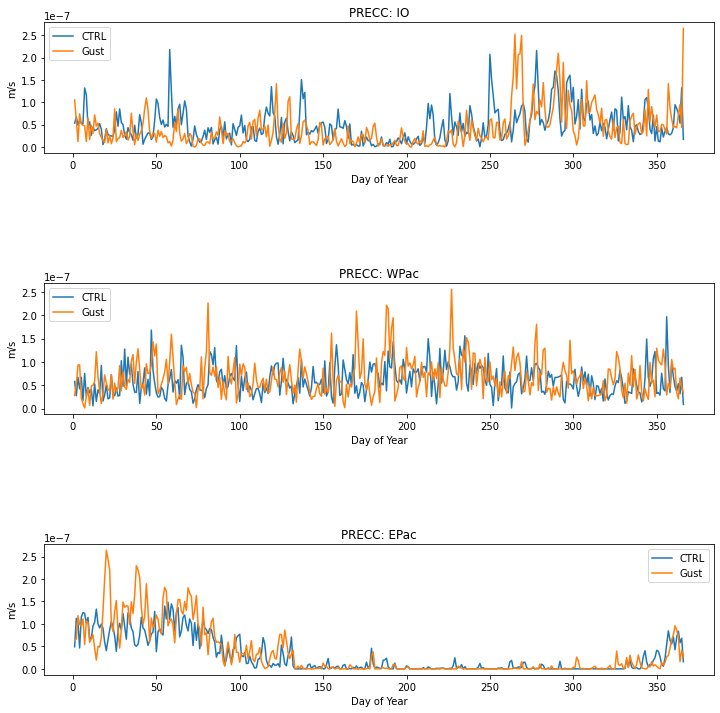

In [45]:
fig,axs = plt.subplots(len(labelPts), 1, figsize=(12,len(labelPts)*4) )
axs     = axs.ravel()

varPlot = 'PRECC'

## Multiplier to get from m/s to mm/hr
# valueMultiplier = (3600*1e3)
# unitsStr = 'mm/hr **2'
valueMultiplier = 1
unitsStr = all_h1[varPlot].units

for iPt in range(len(labelPts)): 
    
    axs[iPt].plot(annCycle.dayofyear.values, 
                  valueMultiplier*annCycle.isel(lat=iPt,lon=iPt).sel(case='F2000_ctrl')[varPlot].values,
                  label='CTRL')
    axs[iPt].plot(annCycle.dayofyear.values, 
                  valueMultiplier*annCycle.isel(lat=iPt,lon=iPt).sel(case='F2000_gust')[varPlot].values, 
                  label='Gust')

    axs[iPt].legend()
    
    axs[iPt].set_title(varPlot+': '+labelPts[iPt])
    
    # axs[iPt].set_ylim([0.0, 2.0])
    axs[iPt].set_ylabel(unitsStr)
    axs[iPt].set_xlabel('Day of Year')

fig.subplots_adjust(hspace=1)

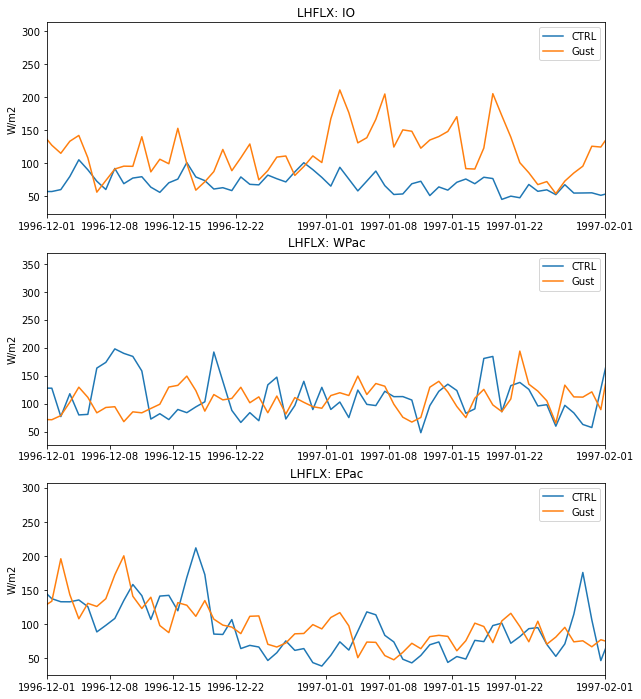

In [27]:
fig,axs = plt.subplots(len(labelPts), 1, figsize=(10,len(labelPts)*4) )
axs     = axs.ravel()

varPlot = 'LHFLX'

## Multiplier to get from m/s to mm/hr
# valueMultiplier = (3600*1e3)
# unitsStr = 'mm/hr **2'
valueMultiplier = 1
unitsStr = all_h1[varPlot].units

for iPt in range(len(labelPts)): 
    axs[iPt].plot(selPts_h1.time.values, valueMultiplier*selPts_h1.isel(lat=iPt,lon=iPt).sel(case='F2000_ctrl')[varPlot].values, label='CTRL')
    axs[iPt].plot(selPts_h1.time.values, valueMultiplier*selPts_h1.isel(lat=iPt,lon=iPt).sel(case='F2000_gust')[varPlot].values, label='Gust')

    axs[iPt].legend()

    axs[iPt].set_xlim([datetime.date(1996,12,1), datetime.date(1997,2,1)])
    
    axs[iPt].set_title(varPlot+': '+labelPts[iPt])
    
    # axs[iPt].set_ylim([0.0,2.0])
    axs[iPt].set_ylabel(unitsStr)
